# Data Engineering

In this notebook, the data engineering is going to be performed. The final outputs are two datasets, one for machine learning algorithms and another one for the convolutional neural networks

In [22]:
import sys  
!{sys.executable} -m pip install -r requirements.txt
!{sys.executable} source .venv/bin/activate

     |████████████████████████████████| 243 kB 8.5 MB/s 
You should consider upgrading via the '/workspaces/jp_cpet_data_engineering/.venv/bin/python -m pip install --upgrade pip' command.
/workspaces/jp_cpet_data_engineering/.venv/bin/python: can't open file 'source': [Errno 2] No such file or directory


In [1]:
import matplotlib.pyplot as plt
import matplotlib.animation as anim
import matplotlib.animation
import numpy as np
import pandas as pd
import seaborn as sns
import math
from IPython.display import HTML
from scipy import stats
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
from imblearn.under_sampling import RandomUnderSampler
from sklearn.linear_model import LogisticRegression
from imblearn.over_sampling import RandomOverSampler
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split
from sklearn import metrics
import matplotlib.pyplot as plt
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve, auc

/workspaces/jp_cpet_data_engineering/.venv/lib/python3.8/site-packages/pandas/compat/__init__.py:97: UserWarning: Could not import the lzma module. Your installed Python is incomplete. Attempting to use lzma compression will result in a RuntimeError.
  warnings.warn(msg)


In [2]:
def get_vo2_peak(row):
    sex = 0
    bmi = 0
    age = row.age
    if row.sex == 'F':
        sex=2
    else:
        sex=1
    if row.BMI <= 25:
        bmi = 0
    else:
        bmi = 1
    if age < 34:
        age = 1
    elif 34 <= age < 44:
        age = 2
    elif 44 <= age < 54:
        age = 3
    elif 54 <= age < 64:
        age = 4
    elif age >=64:
        age = 5
    peak_est = 47.7656 -0.9880*age-0.2356*age**2-8.8697*sex+2.3597*bmi-2.0308*age*bmi-3.7405*sex*bmi+0.2512*age*sex+1.3797*age*sex*bmi
    peak_est = peak_est * 10**-3 * row['weight-kg']
    return peak_est

In [3]:
patient_info = pd.read_excel('./data/DigitalDataEnriched.xlsx', sheet_name = 'Patient',engine='openpyxl')
patient_info['BMI']=patient_info['weight-kg']/(patient_info['height-cm']/100)**2
patient_info.dropna(subset = ["sex"], inplace=True)
patient_info['MaxVO2_EST']=patient_info.apply(lambda x: get_vo2_peak(x),axis=1)
patient_info.head()

,patientid,sex,age,height-cm,weight-kg,BMI,TypeExercise,TypePatient,FileName,Condition,...,PulmonaryLim,MuscleSkeletalLim,CardiacLim,Observations,BA-PrimaryPulmonaryLim,BA-PrimaryCardiacLim,OtherPrimaryLim,Healthy,Observation,MaxVO2_EST
0,7.0,F,40.0,162.560,94.9091,35.915381,Treadmill,Unknown,CHF.1.xlsx,OK,...,0.0,0.0,1.0,NaN,0.0,1.0,0.0,0.0,0.0,2.320385
1,8.0,M,69.0,175.260,107.6818,35.057157,Treadmill,Unknown,CHF.2.xlsx,OK,...,0.0,0.0,1.0,NaN,0.0,1.0,0.0,0.0,0.0,2.658190
2,9.0,F,16.0,160.528,49.3100,19.135218,Treadmill,YoungAthlete,DEAS.1.xlsx,OK,...,0.0,0.0,0.0,NaN,0.0,0.0,0.0,1.0,0.0,1.445030
3,10.0,M,17.0,176.784,60.5000,19.358400,Treadmill,YoungAthlete,DEAS.2.xlsx,OK,...,0.0,0.0,0.0,NaN,0.0,0.0,0.0,1.0,0.0,2.294372
4,11.0,F,15.0,179.070,66.0000,20.582507,Treadmill,YoungAthlete,DEAS.3.xlsx,OK,...,0.0,0.0,0.0,NaN,0.0,0.0,0.0,1.0,0.0,1.934130


## Data Engineering

In [4]:
data = pd.read_excel('./data/DigitalDataEnriched.xlsx', sheet_name = 'CPET',engine='openpyxl')
data_filt=data[['PatientId','Time','TestLevel','HR','VO2','VO2/kg','VCO2','VE','VE/VO2','VE/VCO2','FE02','FECO2','RER','RR','METS','Source','TypeUser','Summary']]

In [5]:
minutes = []
for i in data_filt.Time:
    minutes.append(i.second/60+i.minute)
data['minutes']=np.array(minutes)

In [6]:
data = data[data['HR'].notna()]

In [7]:
def place_label_fake_join(column, row, df):
    return df.loc[(df.patientid == row.PatientId)][column].values[0]

In [8]:
data = data.loc[data.PatientId>=7]

In [9]:
patient_info.columns

Index(['patientid', 'sex', 'age', 'height-cm', 'weight-kg', 'BMI',
       'TypeExercise', 'TypePatient', 'FileName', 'Condition', 'Source',
       'Translator', 'PulmonaryLim', 'MuscleSkeletalLim', 'CardiacLim',
       'Observations', 'BA-PrimaryPulmonaryLim', 'BA-PrimaryCardiacLim',
       'OtherPrimaryLim', 'Healthy', 'Observation', 'MaxVO2_EST'],
      dtype='object')

In [10]:
data['PrimaryPulmonaryLim']=data.apply(lambda x: place_label_fake_join('BA-PrimaryPulmonaryLim',x,patient_info),axis=1)
data['PrimaryCardiacLim']=data.apply(lambda x: place_label_fake_join('BA-PrimaryCardiacLim',x,patient_info),axis=1)
data['OtherPrimaryLim']=data.apply(lambda x: place_label_fake_join('OtherPrimaryLim',x,patient_info),axis=1)
data['Healthy']=data.apply(lambda x: place_label_fake_join('Healthy',x,patient_info),axis=1)

In [11]:
data['Observation']=data.apply(lambda x: place_label_fake_join('Observation',x,patient_info),axis=1)

In [12]:
data['MaxVO2_EST']=data.apply(lambda x: place_label_fake_join('MaxVO2_EST',x,patient_info),axis=1)

In [13]:
data.columns

Index(['PatientId', 'SessionId', 'Time', 'LocalTime', 'TestLevel', 'HR',
       'SpO2', 'VO2', 'VO2/kg', 'VCO2', 'RQ', 'VE', 'VE/VO2', 'VE/VCO2',
       'Work', 'PetO2', 'PetCO2', 'VEO22', 'FE02', 'FECO2', 'RER', 'RR',
       'METS', 'TMSPD', 'TMELV', 'Vtex', 'Vtin', 'Source', 'TypeUser',
       'Summary', 'minutes', 'PrimaryPulmonaryLim', 'PrimaryCardiacLim',
       'OtherPrimaryLim', 'Healthy', 'Observation', 'MaxVO2_EST'],
      dtype='object')

In [14]:
#data= pd.merge(data, patient_info, left_on='PatientId', right_on='patientid', how='left')

The useful columns are:
* PatientId
* SessionId
* VO2
* HR
* VCO2
* VE
* VE/VO2
* VE/VCO2
* RER
* RR
* TestLevel
Other useful columns
* MaxVO2_EST
* Condition
* sex
* age
* BMI

Variables to predict

* CardiacLim
* PulmonaryLim
* MuscleSkeletalLim

In [15]:
data.columns

Index(['PatientId', 'SessionId', 'Time', 'LocalTime', 'TestLevel', 'HR',
       'SpO2', 'VO2', 'VO2/kg', 'VCO2', 'RQ', 'VE', 'VE/VO2', 'VE/VCO2',
       'Work', 'PetO2', 'PetCO2', 'VEO22', 'FE02', 'FECO2', 'RER', 'RR',
       'METS', 'TMSPD', 'TMELV', 'Vtex', 'Vtin', 'Source', 'TypeUser',
       'Summary', 'minutes', 'PrimaryPulmonaryLim', 'PrimaryCardiacLim',
       'OtherPrimaryLim', 'Healthy', 'Observation', 'MaxVO2_EST'],
      dtype='object')

In [16]:
data=data.loc[data.Observation==0]

In [17]:
data_filtered = data.copy()
data_filtered = data[['PatientId','SessionId','minutes','Time','TestLevel','HR','VO2','VCO2','VE','VE/VO2','VE/VCO2','RER','RR','MaxVO2_EST','PrimaryCardiacLim','PrimaryPulmonaryLim','OtherPrimaryLim','Healthy']]

In [18]:
data_filtered['ID'] = data_filtered.index

<ipython-input-18-33960056dad2>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_filtered['ID'] = data_filtered.index


## Creating the 30s round dataset

In [19]:
def round_to_30s(row):
    base = np.floor(row.minutes)
    med = base +0.5
    sup = np.round(row.minutes)
    if row.minutes <= med:
        return med
    else:
        return sup
    pass

In [20]:
patient_times = data_filtered.groupby(['PatientId','SessionId'])['minutes'].max().reset_index()
patient_times['max_time'] = patient_times.apply(round_to_30s, axis=1)
patient_times = patient_times.loc[patient_times.PatientId >= 7]
patient_times.head()

,PatientId,SessionId,minutes,max_time
0,7,7.0,15.750000,16.0
1,8,8.0,13.700000,14.0
2,9,9.0,18.616667,19.0
3,10,10.0,18.633333,19.0
4,11,11.0,13.683333,14.0


In [21]:
df_info_avg = pd.DataFrame(columns = ['PatientId','SessionId','minutes'])
for i in patient_times.SessionId:
    patient_time_min = np.arange(0.5,patient_times.loc[(patient_times.PatientId==np.floor(i)) & 
                                                       (patient_times.SessionId==i)]['max_time'].values[0],.5)
    #print(patient_time_min)
    patient_ids=np.ones(patient_time_min.shape)*np.floor(i)
    patient_session_ids = np.ones(patient_time_min.shape)*i
    #print(patient_ids)
    tempdf = pd.DataFrame({'PatientId': patient_ids, 'SessionId':patient_session_ids, 'minutes': patient_time_min })
    #print(tempdf)
    df_info_avg=df_info_avg.append(tempdf, ignore_index=True)
    pass
df_info_avg.head()

,PatientId,SessionId,minutes
0,7.0,7.0,0.5
1,7.0,7.0,1.0
2,7.0,7.0,1.5
3,7.0,7.0,2.0
4,7.0,7.0,2.5


In [22]:
data_filtered.loc[data_filtered.SessionId==47]

,PatientId,SessionId,minutes,Time,TestLevel,HR,VO2,VCO2,VE,VE/VO2,VE/VCO2,RER,RR,MaxVO2_EST,PrimaryCardiacLim,PrimaryPulmonaryLim,OtherPrimaryLim,Healthy,ID
4344,47,47.0,3.166667,00:03:10,Warmup,98.0,0.41,0.37,12.0,26.1,29.3,0.89,13.6,2.279263,1.0,0.0,0.0,0.0,4344
4345,47,47.0,3.233333,00:03:14,Warmup,98.0,0.49,0.47,17.0,31.2,32.8,0.95,15.3,2.279263,1.0,0.0,0.0,0.0,4345
4346,47,47.0,3.283333,00:03:17,Warmup,96.0,0.39,0.37,14.0,31.4,32.9,0.95,18.6,2.279263,1.0,0.0,0.0,0.0,4346
4347,47,47.0,3.333333,00:03:20,Warmup,96.0,0.41,0.38,14.0,27.9,30.6,0.91,21.2,2.279263,1.0,0.0,0.0,0.0,4347
4348,47,47.0,3.383333,00:03:23,Warmup,96.0,0.29,0.26,10.0,28.9,31.6,0.92,16.6,2.279263,1.0,0.0,0.0,0.0,4348
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4573,47,47.0,10.283333,00:10:17,Recovery,122.0,1.02,1.11,38.0,34.5,31.8,1.08,29.7,2.279263,1.0,0.0,0.0,0.0,4573
4574,47,47.0,10.316667,00:10:19,Recovery,121.0,0.94,1.05,38.0,36.5,32.9,1.11,30.0,2.279263,1.0,0.0,0.0,0.0,4574
4575,47,47.0,10.350000,00:10:21,Recovery,121.0,0.93,1.02,37.0,36.2,32.9,1.10,31.4,2.279263,1.0,0.0,0.0,0.0,4575
4576,47,47.0,10.383333,00:10:23,Recovery,121.0,0.65,0.69,23.0,32.0,30.3,1.06,22.1,2.279263,1.0,0.0,0.0,0.0,4576


In [23]:
def round_to_mean(column, row, df):
    return np.mean(df.loc[(df.PatientId == row.PatientId) &
                   (df.SessionId == row.SessionId) &
                   (df.minutes > (row.minutes-0.5)) &
                   (df.minutes <= (row.minutes))][column].values)

In [24]:
def place_labels(column, row, df):
    return df.loc[(df.PatientId == row.PatientId) & 
                   (df.SessionId == row.SessionId) &
                   (df.minutes > (row.minutes-0.5)) &
                   (df.minutes <= (row.minutes))][column].values[0]

In [25]:
def place_label_fake_join(column, row, df):
    return df.loc[(df.patientid == row.PatientId)][column].values[0]

In [26]:
def has_anaerobic_threshold(row, df):
    return np.max(df.loc[(df.PatientId == row.PatientId) &
                   (df.SessionId == row.SessionId)]['RER'].values) >= 1

In [27]:
df_info_avg = df_info_avg.loc[df_info_avg.PatientId>= 7]

In [28]:
data.columns

Index(['PatientId', 'SessionId', 'Time', 'LocalTime', 'TestLevel', 'HR',
       'SpO2', 'VO2', 'VO2/kg', 'VCO2', 'RQ', 'VE', 'VE/VO2', 'VE/VCO2',
       'Work', 'PetO2', 'PetCO2', 'VEO22', 'FE02', 'FECO2', 'RER', 'RR',
       'METS', 'TMSPD', 'TMELV', 'Vtex', 'Vtin', 'Source', 'TypeUser',
       'Summary', 'minutes', 'PrimaryPulmonaryLim', 'PrimaryCardiacLim',
       'OtherPrimaryLim', 'Healthy', 'Observation', 'MaxVO2_EST'],
      dtype='object')

In [29]:
patient_info.Healthy

0      0.0
1      0.0
2      1.0
3      1.0
4      1.0
      ... 
220    0.0
221    0.0
222    0.0
223    0.0
224    0.0
Name: Healthy, Length: 225, dtype: float64

In [30]:
df_info_avg['HR']=np.round(df_info_avg.apply(lambda x: round_to_mean('HR',x,data_filtered),axis=1),0)
df_info_avg['VO2']=df_info_avg.apply(lambda x: round_to_mean('VO2',x,data_filtered),axis=1)
df_info_avg['VCO2']=df_info_avg.apply(lambda x: round_to_mean('VCO2',x,data_filtered),axis=1)
df_info_avg['VE']=df_info_avg.apply(lambda x: round_to_mean('VE',x,data_filtered),axis=1)
df_info_avg['VE/VO2']=df_info_avg.apply(lambda x: round_to_mean('VE/VO2',x,data_filtered),axis=1)
df_info_avg['VE/VCO2']=df_info_avg.apply(lambda x: round_to_mean('VE/VCO2',x,data_filtered),axis=1)
df_info_avg['RER']=df_info_avg.apply(lambda x: round_to_mean('RER',x,data_filtered),axis=1)
df_info_avg['RR']=df_info_avg.apply(lambda x: round_to_mean('RR',x,data_filtered),axis=1)
df_info_avg['HasAnaerobicThreshold']=df_info_avg.apply(lambda x: has_anaerobic_threshold(x,data_filtered),axis=1)
#df_info_avg['sex']=df_info_avg.apply(lambda x: place_label_fake_join('sex',x,patient_info),axis=1)
#df_info_avg['age']=df_info_avg.apply(lambda x: place_label_fake_join('age',x,patient_info),axis=1)
#df_info_avg['BMI']=df_info_avg.apply(lambda x: place_label_fake_join('BMI',x,patient_info),axis=1)
df_info_avg['MaxVO2_EST']=df_info_avg.apply(lambda x: place_label_fake_join('MaxVO2_EST',x,patient_info),axis=1)
df_info_avg['PrimaryPulmonaryLim']=df_info_avg.apply(lambda x: place_label_fake_join('BA-PrimaryPulmonaryLim',x,patient_info),axis=1)
df_info_avg['PrimaryCardiacLim']=df_info_avg.apply(lambda x: place_label_fake_join('BA-PrimaryCardiacLim',x,patient_info),axis=1)
df_info_avg['OtherPrimaryLim']=df_info_avg.apply(lambda x: place_label_fake_join('OtherPrimaryLim',x,patient_info),axis=1)
df_info_avg['Healthy']=df_info_avg.apply(lambda x: place_label_fake_join('Healthy',x,patient_info),axis=1)
df_info_avg['Observation']=df_info_avg.apply(lambda x: place_label_fake_join('Observation',x,patient_info),axis=1)

of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/workspaces/jp_cpet_data_engineering/.venv/lib/python3.8/site-packages/numpy/core/_methods.py:188: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/workspaces/jp_cpet_data_engineering/.venv/lib/python3.8/site-packages/numpy/core/fromnumeric.py:3419: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/workspaces/jp_cpet_data_engineering/.venv/lib/python3.8/site-packages/numpy/core/_methods.py:188: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/workspaces/jp_cpet_data_engineering/.venv/lib/python3.8/site-packages/numpy/core/fromnumeric.py:3419: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/workspaces/jp_cpet_data_engineering/.venv/lib/python3.8/site-packages/numpy/core/_methods.py:188: RuntimeWarning: invalid value encountered in double_scalars


In [31]:
patient_info.columns

Index(['patientid', 'sex', 'age', 'height-cm', 'weight-kg', 'BMI',
       'TypeExercise', 'TypePatient', 'FileName', 'Condition', 'Source',
       'Translator', 'PulmonaryLim', 'MuscleSkeletalLim', 'CardiacLim',
       'Observations', 'BA-PrimaryPulmonaryLim', 'BA-PrimaryCardiacLim',
       'OtherPrimaryLim', 'Healthy', 'Observation', 'MaxVO2_EST'],
      dtype='object')

In [32]:
df_info_avg.head()

,PatientId,SessionId,minutes,HR,VO2,VCO2,VE,VE/VO2,VE/VCO2,RER,RR,HasAnaerobicThreshold,MaxVO2_EST,PrimaryPulmonaryLim,PrimaryCardiacLim,OtherPrimaryLim,Healthy,Observation
0,7.0,7.0,0.5,68.0,0.108487,0.114589,8.403486,77.408970,74.787857,1.047752,15.778738,True,2.320385,0.0,1.0,0.0,0.0,0.0
1,7.0,7.0,1.0,72.0,0.161173,0.126185,7.199287,44.667969,57.053291,0.782917,19.911507,True,2.320385,0.0,1.0,0.0,0.0,0.0
2,7.0,7.0,1.5,74.0,0.216784,0.165696,6.819632,31.377821,41.044905,0.764782,15.983134,True,2.320385,0.0,1.0,0.0,0.0,0.0
3,7.0,7.0,2.0,70.0,0.292871,0.224983,8.937037,30.440102,39.583202,0.769070,15.302423,True,2.320385,0.0,1.0,0.0,0.0,0.0
4,7.0,7.0,2.5,75.0,0.206333,0.160677,6.567369,31.848976,40.876609,0.779499,18.565531,True,2.320385,0.0,1.0,0.0,0.0,0.0


In [35]:
df_info_avg[['PrimaryPulmonaryLim','PrimaryCardiacLim','OtherPrimaryLim','Healthy']].sum()

PrimaryPulmonaryLim    1030.0
PrimaryCardiacLim      1466.0
OtherPrimaryLim         618.0
Healthy                3045.0
dtype: float64

In [39]:
df_info_avg.shape

(6053, 19)

In [40]:
df_info_avg = df_info_avg.dropna()

In [41]:
df_info_avg['O2']=df_info_avg.VO2/df_info_avg.HR*1000

In [42]:
def get_cardiac_limitation(df):
    df['CardiacLimEst'] = 0
    if df.shape[0] < 6:
        return df
    for pid in df.SessionId.drop_duplicates().values:
        df_pid = df.loc[(df.PatientId==np.floor(pid)) & (df.SessionId==pid)]
        if df_pid.shape[0]<4:
            df.loc[(df.PatientId == np.floor(pid)) & (df.SessionId==pid),'CardiacLimEst']=0   
        if df_pid.O2.values[0] == np.inf:
            continue
        min_mid = range(int(np.round(df_pid.shape[0]/4)),int(np.round(df_pid.shape[0]/2)))
        max_mid = range(int(np.round(df_pid.shape[0]/2)),int(np.round(3*df_pid.shape[0]/4)))
        df_min = df_pid.iloc[min_mid,:]
        df_max = df_pid.iloc[max_mid,:]
        x_df_min = df_min.minutes.values
        y_df_min = df_min.O2.values
        x_df_max = df_max.minutes.values
        y_df_max = df_max.O2.values
        slope, intercept, r_value, p_value, std_err = stats.linregress(x_df_min, y_df_min)
        atan_inf = np.arctan(slope)
        slope, intercept, r_value, p_value, std_err = stats.linregress(x_df_max, y_df_max)
        atan_sup = np.arctan(slope)
        df.loc[(df.PatientId == np.floor(pid))  & (df.SessionId==pid),'CardiacLimEst']=np.abs(atan_inf-atan_sup)/(np.pi/2)
    return df

In [43]:
df_info_avg.loc[df_info_avg.PatientId==47].head()

,PatientId,SessionId,minutes,HR,VO2,VCO2,VE,VE/VO2,VE/VCO2,RER,RR,HasAnaerobicThreshold,MaxVO2_EST,PrimaryPulmonaryLim,PrimaryCardiacLim,OtherPrimaryLim,Healthy,Observation,O2
1238,47.0,47.0,3.5,96.0,0.421429,0.394286,14.428571,29.642857,31.800000,0.931429,17.657143,True,2.279263,0.0,1.0,0.0,0.0,0.0,4.389881
1239,47.0,47.0,4.0,93.0,0.385556,0.368889,14.444444,32.233333,33.600000,0.956667,18.088889,True,2.279263,0.0,1.0,0.0,0.0,0.0,4.145759
1240,47.0,47.0,4.5,94.0,0.488182,0.435455,16.181818,26.409091,29.754545,0.881818,22.581818,True,2.279263,0.0,1.0,0.0,0.0,0.0,5.193424
1241,47.0,47.0,5.0,100.0,0.852500,0.705000,24.083333,24.941667,30.116667,0.828333,25.325000,True,2.279263,0.0,1.0,0.0,0.0,0.0,8.525000
1242,47.0,47.0,5.5,106.0,1.286429,1.040714,35.071429,24.735714,30.607143,0.807857,28.778571,True,2.279263,0.0,1.0,0.0,0.0,0.0,12.136119


Considerations: VO2 vs HR seems like a stronger element to predict wether a patient has a cardiac limitation or not. We need a ML algorithm that can classify it.

The input for this ML algorithm, it can be logistic regression for better interpretation are:
 * VO2/HR slope
 * VO2/HR peak
 * difference between the max value of VO2 and the estimated MaxVO2, this can be reduced to a boolean
 * Max Heart Rate during the excersise


This following process contain the steps to reduce the CPET dataset into sessionId and patient data, this dataframe will be the base for the team to apply any machine learning algorithm to predict and see

In [44]:
cardiac_resume_cpet_df = pd.DataFrame({ 'SessionId':df_info_avg.SessionId.drop_duplicates().values})

In [45]:
cardiac_resume_cpet_df['PatientId'] = np.floor(cardiac_resume_cpet_df.SessionId)

In [56]:
cardiac_resume_cpet_df['sex']=cardiac_resume_cpet_df.apply(lambda x: place_label_fake_join('sex',x,patient_info),axis=1)
cardiac_resume_cpet_df['age']=cardiac_resume_cpet_df.apply(lambda x: place_label_fake_join('age',x,patient_info),axis=1)
cardiac_resume_cpet_df['BMI']=cardiac_resume_cpet_df.apply(lambda x: place_label_fake_join('BMI',x,patient_info),axis=1)
cardiac_resume_cpet_df['MaxVO2_EST']=cardiac_resume_cpet_df.apply(lambda x: place_label_fake_join('MaxVO2_EST',x,patient_info),axis=1)
#cardiac_resume_cpet_df['CardiacLim']=cardiac_resume_cpet_df.apply(lambda x: place_label_fake_join('CardiacLim',x,patient_info),axis=1)
#cardiac_resume_cpet_df['PulmonaryLim']=cardiac_resume_cpet_df.apply(lambda x: place_label_fake_join('PulmonaryLim',x,patient_info),axis=1)
#cardiac_resume_cpet_df['MuscleSkeletalLim']=cardiac_resume_cpet_df.apply(lambda x: place_label_fake_join('MuscleSkeletalLim',x,patient_info),axis=1)
cardiac_resume_cpet_df['PrimaryPulmonaryLim']=cardiac_resume_cpet_df.apply(lambda x: place_label_fake_join('BA-PrimaryPulmonaryLim',x,patient_info),axis=1)
cardiac_resume_cpet_df['PrimaryCardiacLim']=cardiac_resume_cpet_df.apply(lambda x: place_label_fake_join('BA-PrimaryCardiacLim',x,patient_info),axis=1)
cardiac_resume_cpet_df['OtherPrimaryLim']=cardiac_resume_cpet_df.apply(lambda x: place_label_fake_join('OtherPrimaryLim',x,patient_info),axis=1)
cardiac_resume_cpet_df['Healthy']=cardiac_resume_cpet_df.apply(lambda x: place_label_fake_join('Healthy',x,patient_info),axis=1)
cardiac_resume_cpet_df['Observation']=cardiac_resume_cpet_df.apply(lambda x: place_label_fake_join('Observation',x,patient_info),axis=1)

In [57]:
print(patient_info.columns)
patient_info['BA-PrimaryPulmonaryLim'].sum()
cardiac_resume_cpet_df[['PrimaryPulmonaryLim','PrimaryCardiacLim','OtherPrimaryLim','Healthy']].sum()

Index(['patientid', 'sex', 'age', 'height-cm', 'weight-kg', 'BMI',
       'TypeExercise', 'TypePatient', 'FileName', 'Condition', 'Source',
       'Translator', 'PulmonaryLim', 'MuscleSkeletalLim', 'CardiacLim',
       'Observations', 'BA-PrimaryPulmonaryLim', 'BA-PrimaryCardiacLim',
       'OtherPrimaryLim', 'Healthy', 'Observation', 'MaxVO2_EST'],
      dtype='object')


PrimaryPulmonaryLim    35.0
PrimaryCardiacLim      51.0
OtherPrimaryLim        27.0
Healthy                96.0
dtype: float64

In [58]:
cardiac_resume_cpet_df.head()

,SessionId,PatientId,sex,age,BMI,MaxVO2_EST,PrimaryPulmonaryLim,PrimaryCardiacLim,OtherPrimaryLim,Healthy,Observation
0,7.0,7.0,F,40.0,35.915381,2.320385,0.0,1.0,0.0,0.0,0.0
1,8.0,8.0,M,69.0,35.057157,2.658190,0.0,1.0,0.0,0.0,0.0
2,9.0,9.0,F,16.0,19.135218,1.445030,0.0,0.0,0.0,1.0,0.0
3,10.0,10.0,M,17.0,19.358400,2.294372,0.0,0.0,0.0,1.0,0.0
4,11.0,11.0,F,15.0,20.582507,1.934130,0.0,0.0,0.0,1.0,0.0


Getting the peak heart rate and other parameters

In [59]:
def get_peak_heart_rate(column, row, df):
    return np.max(df.loc[(df.PatientId == row.PatientId) &
                   (df.SessionId == row.SessionId)][column].values)

In [60]:
def get_MaxVO2_expected_vs_real(row, df):
    max_vo2_real = np.max(df.loc[(df.PatientId == row.PatientId) & (df.SessionId == row.SessionId)]['VO2'].values)
    max_vo2_expected = row.MaxVO2_EST
    return max_vo2_expected-max_vo2_real

In [61]:
def get_HR_VO2_slope(row,df):
    lin_reg = LinearRegression()
    y_val = df.loc[(df.PatientId == row.PatientId) & (df.SessionId == row.SessionId)]['HR'].values
    X_val = df.loc[(df.PatientId == row.PatientId) & (df.SessionId == row.SessionId)]['VO2'].values.reshape(-1, 1)
    lin_reg.fit(X_val,y_val)
    return lin_reg.coef_[0]

In [62]:
def get_VE_VCO2_slope(row,df):
    lin_reg = LinearRegression()
    y_val = df.loc[(df.PatientId == row.PatientId) & (df.SessionId == row.SessionId)]['VE'].values
    X_val = df.loc[(df.PatientId == row.PatientId) & (df.SessionId == row.SessionId)]['VCO2'].values.reshape(-1, 1)
    lin_reg.fit(X_val,y_val)
    return lin_reg.coef_[0]

In [63]:
def get_lowest_variable(column, row, df):
    return np.max(df.loc[(df.PatientId == row.PatientId) &
                   (df.SessionId == row.SessionId)][column].values)

In [64]:
def get_highest_variable(column, row, df):
    return np.max(df.loc[(df.PatientId == row.PatientId) &
                   (df.SessionId == row.SessionId)][column].values)

In [65]:
def get_mean_variable(column, row, df):
    return np.mean(df.loc[(df.PatientId == row.PatientId) &
                   (df.SessionId == row.SessionId)][column].values)

In [66]:
def get_std_variable(column, row, df):
    return np.std(df.loc[(df.PatientId == row.PatientId) &
                   (df.SessionId == row.SessionId)][column].values)

In [67]:
cardiac_resume_cpet_df['PeakHeartRate']=cardiac_resume_cpet_df.apply(lambda x: get_peak_heart_rate('HR',x,df_info_avg),axis=1)
cardiac_resume_cpet_df['MeanHeartRate']=cardiac_resume_cpet_df.apply(lambda x: get_mean_variable('HR',x,df_info_avg),axis=1)
cardiac_resume_cpet_df['MinHeartRate']=cardiac_resume_cpet_df.apply(lambda x: get_lowest_variable('HR',x,df_info_avg),axis=1)
cardiac_resume_cpet_df['StdHeartRate']=cardiac_resume_cpet_df.apply(lambda x: get_std_variable('HR',x,df_info_avg),axis=1)
cardiac_resume_cpet_df['LowestVE/VCO2']=cardiac_resume_cpet_df.apply(lambda x: get_lowest_variable('VE/VCO2',x,df_info_avg),axis=1)
cardiac_resume_cpet_df['PeakVE/VCO2']=cardiac_resume_cpet_df.apply(lambda x: get_highest_variable('VE/VCO2',x,df_info_avg),axis=1)
cardiac_resume_cpet_df['MeanVE/VCO2']=cardiac_resume_cpet_df.apply(lambda x: get_mean_variable('VE/VCO2',x,df_info_avg),axis=1)
cardiac_resume_cpet_df['StdVE/VCO2']=cardiac_resume_cpet_df.apply(lambda x: get_std_variable('VE/VCO2',x,df_info_avg),axis=1)
cardiac_resume_cpet_df['PeakVO2Real']=cardiac_resume_cpet_df.apply(lambda x: get_highest_variable('VO2',x,df_info_avg),axis=1)
cardiac_resume_cpet_df['DiffPeakVO2']=cardiac_resume_cpet_df.apply(lambda x: get_MaxVO2_expected_vs_real(x,df_info_avg),axis=1)
cardiac_resume_cpet_df['MeanRER']=cardiac_resume_cpet_df.apply(lambda x: get_mean_variable('RER',x,df_info_avg),axis=1)
cardiac_resume_cpet_df['PeakRER']=cardiac_resume_cpet_df.apply(lambda x: get_highest_variable('RER',x,df_info_avg),axis=1)
cardiac_resume_cpet_df['LowestRER']=cardiac_resume_cpet_df.apply(lambda x: get_lowest_variable('RER',x,df_info_avg),axis=1)
cardiac_resume_cpet_df['MeanVE']=cardiac_resume_cpet_df.apply(lambda x: get_mean_variable('VE',x,df_info_avg),axis=1)
cardiac_resume_cpet_df['PeakVE']=cardiac_resume_cpet_df.apply(lambda x: get_highest_variable('VE',x,df_info_avg),axis=1)
cardiac_resume_cpet_df['LowestVE']=cardiac_resume_cpet_df.apply(lambda x: get_lowest_variable('VE',x,df_info_avg),axis=1)
cardiac_resume_cpet_df['MeanRR']=cardiac_resume_cpet_df.apply(lambda x: get_mean_variable('RR',x,df_info_avg),axis=1)
cardiac_resume_cpet_df['PeakRR']=cardiac_resume_cpet_df.apply(lambda x: get_highest_variable('RR',x,df_info_avg),axis=1)
cardiac_resume_cpet_df['LowestRR']=cardiac_resume_cpet_df.apply(lambda x: get_lowest_variable('RR',x,df_info_avg),axis=1)
cardiac_resume_cpet_df['MeanVO2']=cardiac_resume_cpet_df.apply(lambda x: get_mean_variable('VO2',x,df_info_avg),axis=1)
cardiac_resume_cpet_df['PeakVO2']=cardiac_resume_cpet_df.apply(lambda x: get_highest_variable('VO2',x,df_info_avg),axis=1)
cardiac_resume_cpet_df['LowestVO2']=cardiac_resume_cpet_df.apply(lambda x: get_lowest_variable('VO2',x,df_info_avg),axis=1)
cardiac_resume_cpet_df['MeanVCO2']=cardiac_resume_cpet_df.apply(lambda x: get_mean_variable('VCO2',x,df_info_avg),axis=1)
cardiac_resume_cpet_df['PeakVCO2']=cardiac_resume_cpet_df.apply(lambda x: get_highest_variable('VCO2',x,df_info_avg),axis=1)
cardiac_resume_cpet_df['LowestVCO2']=cardiac_resume_cpet_df.apply(lambda x: get_lowest_variable('VCO2',x,df_info_avg),axis=1)

In [68]:
cardiac_resume_cpet_df['HRvsVO2Slope']=cardiac_resume_cpet_df.apply(lambda x: get_HR_VO2_slope(x,df_info_avg),axis=1)
cardiac_resume_cpet_df['VEvsVCO2Slope']=cardiac_resume_cpet_df.apply(lambda x: get_VE_VCO2_slope(x,df_info_avg),axis=1)

Dropping patient 16 because it has not heart rate measured, which is an anomaly

In [69]:
index_names = cardiac_resume_cpet_df[ cardiac_resume_cpet_df['PeakHeartRate'] ==0 ].index
cardiac_resume_cpet_df.drop(index_names, inplace = True)

In [70]:
cardiac_resume_cpet_df = cardiac_resume_cpet_df.loc[cardiac_resume_cpet_df.Observation==0]

Calculating O2 pulse

In [71]:
def get_mean_O2_pulse(row, df):
    hr_values = df.loc[(df.PatientId == row.PatientId) &
                   (df.SessionId == row.SessionId)]['HR'].values
    zero_ind = np.where(hr_values == 0)[0]
    if len(hr_values) == len(zero_ind):
        return -1
    vo2_values =df.loc[(df.PatientId == row.PatientId) &
                   (df.SessionId == row.SessionId)]['VO2'].values
    hr_values = np.delete(hr_values, zero_ind)
    vo2_values = np.delete(vo2_values, zero_ind)
    O2_pulse = vo2_values/hr_values
    return np.mean(O2_pulse)

In [72]:
def get_max_O2_pulse(row, df):
    hr_values = df.loc[(df.PatientId == row.PatientId) &
                   (df.SessionId == row.SessionId)]['HR'].values
    zero_ind = np.where(hr_values == 0)[0]
    if len(hr_values) == len(zero_ind):
        return -1
    vo2_values =df.loc[(df.PatientId == row.PatientId) &
                   (df.SessionId == row.SessionId)]['VO2'].values
    hr_values = np.delete(hr_values, zero_ind)
    vo2_values = np.delete(vo2_values, zero_ind)
    O2_pulse = vo2_values/hr_values
    return np.max(O2_pulse)

In [73]:
def get_min_O2_pulse(row, df):
    hr_values = df.loc[(df.PatientId == row.PatientId) &
                   (df.SessionId == row.SessionId)]['HR'].values
    zero_ind = np.where(hr_values == 0)[0]
    if len(hr_values) == len(zero_ind):
        return -1
    vo2_values =df.loc[(df.PatientId == row.PatientId) &
                   (df.SessionId == row.SessionId)]['VO2'].values
    hr_values = np.delete(hr_values, zero_ind)
    vo2_values = np.delete(vo2_values, zero_ind)
    O2_pulse = vo2_values/hr_values
    return np.min(O2_pulse)

In [74]:
def get_std_O2_pulse(row, df):
    hr_values = df.loc[(df.PatientId == row.PatientId) &
                   (df.SessionId == row.SessionId)]['HR'].values
    zero_ind = np.where(hr_values == 0)[0]
    if len(hr_values) == len(zero_ind):
        return -1
    vo2_values =df.loc[(df.PatientId == row.PatientId) &
                   (df.SessionId == row.SessionId)]['VO2'].values
    hr_values = np.delete(hr_values, zero_ind)
    vo2_values = np.delete(vo2_values, zero_ind)
    O2_pulse = vo2_values/hr_values
    return np.std(O2_pulse)

In [75]:
testHR = np.array([1,0,0,0])
np.where(testHR == 0)[0]
testHR = np.array([1,2,3,2,1,1])
len(np.where(testHR == 0)[0])
zero_ind = np.where(testHR == 0)[0]
len(testHR)
zero_ind
np.delete(testHR, zero_ind)

array([1, 2, 3, 2, 1, 1])

In [76]:
df_info_avg = df_info_avg[df_info_avg.HR != 0]

In [77]:
cardiac_resume_cpet_df['MeanO2Pulse']=cardiac_resume_cpet_df.apply(lambda x: get_mean_O2_pulse(x,df_info_avg),axis=1)
cardiac_resume_cpet_df['MaxO2Pulse']=cardiac_resume_cpet_df.apply(lambda x: get_max_O2_pulse(x,df_info_avg),axis=1)
cardiac_resume_cpet_df['MinO2Pulse']=cardiac_resume_cpet_df.apply(lambda x: get_min_O2_pulse(x,df_info_avg),axis=1)
cardiac_resume_cpet_df['StdO2Pulse']=cardiac_resume_cpet_df.apply(lambda x: get_std_O2_pulse(x,df_info_avg),axis=1)


In [78]:
cardiac_resume_cpet_df.head()

,SessionId,PatientId,sex,age,BMI,MaxVO2_EST,PrimaryPulmonaryLim,PrimaryCardiacLim,OtherPrimaryLim,Healthy,...,LowestVO2,MeanVCO2,PeakVCO2,LowestVCO2,HRvsVO2Slope,VEvsVCO2Slope,MeanO2Pulse,MaxO2Pulse,MinO2Pulse,StdO2Pulse
0,7.0,7.0,F,40.0,35.915381,2.320385,0.0,1.0,0.0,0.0,...,1.734347,0.717064,1.841881,1.841881,41.903391,21.965918,0.007568,0.012291,0.001595,0.003485
1,8.0,8.0,M,69.0,35.057157,2.658190,0.0,1.0,0.0,0.0,...,1.533051,0.837157,1.755058,1.755058,62.785696,32.178401,0.007629,0.010107,0.002689,0.002072
2,9.0,9.0,F,16.0,19.135218,1.445030,0.0,0.0,0.0,1.0,...,3.222358,1.862584,4.017933,4.017933,37.936437,24.305827,0.010763,0.016112,0.003122,0.004337
3,10.0,10.0,M,17.0,19.358400,2.294372,0.0,0.0,0.0,1.0,...,4.333981,2.424037,5.071026,5.071026,27.429501,31.303074,0.014520,0.022226,0.002638,0.005764
4,11.0,11.0,F,15.0,20.582507,1.934130,0.0,0.0,0.0,1.0,...,3.133955,1.989329,3.688401,3.688401,33.810641,27.635025,0.010903,0.016670,0.002797,0.004961


In [79]:
def get_slope_75(row, df, column):
    last_quarter_time = df.loc[df.SessionId == row.SessionId].minutes.values.max()*.75
    y_val = df.loc[(df.PatientId == row.PatientId) &
                   (df.SessionId == row.SessionId) & 
                   (df.minutes >= last_quarter_time)][column].values
    X_val = df.loc[(df.PatientId == row.PatientId) &
                   (df.SessionId == row.SessionId) & 
                   (df.minutes >= last_quarter_time)].minutes.values
    lin_reg = LinearRegression()
    #print(y_val)
    #print(X_val)
    lin_reg.fit(X_val.reshape(-1, 1),y_val.reshape(-1, 1))
    return lin_reg.coef_[0][0]

In [80]:
cardiac_resume_cpet_df['75VO2Slope']=cardiac_resume_cpet_df.apply(lambda x: get_slope_75(x,df_info_avg,'VO2'),axis=1)
cardiac_resume_cpet_df['75HRSlope']=cardiac_resume_cpet_df.apply(lambda x: get_slope_75(x,df_info_avg,'HR'),axis=1)
cardiac_resume_cpet_df['75VCO2Slope']=cardiac_resume_cpet_df.apply(lambda x: get_slope_75(x,df_info_avg,'VCO2'),axis=1)
cardiac_resume_cpet_df['75VESlope']=cardiac_resume_cpet_df.apply(lambda x: get_slope_75(x,df_info_avg,'VE'),axis=1)
cardiac_resume_cpet_df['75RERSlope']=cardiac_resume_cpet_df.apply(lambda x: get_slope_75(x,df_info_avg,'RER'),axis=1)
cardiac_resume_cpet_df['75RRSlope']=cardiac_resume_cpet_df.apply(lambda x: get_slope_75(x,df_info_avg,'RR'),axis=1)
cardiac_resume_cpet_df['75O2Slope']=cardiac_resume_cpet_df.apply(lambda x: get_slope_75(x,df_info_avg,'O2'),axis=1)

In [81]:
cardiac_resume_cpet_df

,SessionId,PatientId,sex,age,BMI,MaxVO2_EST,PrimaryPulmonaryLim,PrimaryCardiacLim,OtherPrimaryLim,Healthy,...,MaxO2Pulse,MinO2Pulse,StdO2Pulse,75VO2Slope,75HRSlope,75VCO2Slope,75VESlope,75RERSlope,75RRSlope,75O2Slope
0,7.0,7.0,F,40.0,35.915381,2.320385,0.0,1.0,0.0,0.0,...,0.012291,0.001595,0.003485,0.123423,7.023810,0.216409,5.154882,0.063604,2.407089,0.315476
1,8.0,8.0,M,69.0,35.057157,2.658190,0.0,1.0,0.0,0.0,...,0.010107,0.002689,0.002072,0.075090,7.714286,0.180712,8.686051,0.072860,2.382982,0.013003
2,9.0,9.0,F,16.0,19.135218,1.445030,0.0,0.0,0.0,1.0,...,0.016112,0.003122,0.004337,-0.685285,-17.842424,-0.656155,-14.894797,0.169690,-4.153240,-2.949112
3,10.0,10.0,M,17.0,19.358400,2.294372,0.0,0.0,0.0,1.0,...,0.022226,0.002638,0.005764,-0.992913,-21.963636,-0.988564,-31.656858,0.117084,-12.202182,-4.349607
4,11.0,11.0,F,15.0,20.582507,1.934130,0.0,0.0,0.0,1.0,...,0.016670,0.002797,0.004961,-0.939192,-32.571429,-1.025710,-27.808291,0.135160,-6.930458,-4.033647
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
204,227.0,227.0,M,55.0,32.647091,2.665733,0.0,0.0,1.0,0.0,...,0.012007,0.003745,0.002731,-0.060606,-0.600000,-0.042562,-3.645716,0.004893,-0.044359,-0.464362
205,228.0,228.0,M,66.0,30.834801,2.372039,0.0,0.0,1.0,0.0,...,0.009891,0.003191,0.002143,0.160580,12.400000,0.294477,10.733195,0.165083,5.677888,0.440457
206,229.0,229.0,F,65.0,36.729098,1.902622,0.0,0.0,1.0,0.0,...,0.010523,0.003385,0.002009,0.077711,3.785714,0.105499,2.807102,0.019368,1.357142,0.312992
207,230.0,230.0,M,83.0,21.075915,1.736736,0.0,0.0,1.0,0.0,...,0.009523,0.000016,0.002500,0.011581,2.400000,0.050297,1.433467,0.056230,1.140347,-0.132654


### Finding Anaerobic thershold

In [82]:
def get_at(rer_list):
    ind = -1
    index_greater_than_one = np.where(rer_list >=1)
    if(index_greater_than_one[0].size== 0):
        return ind
    if(index_greater_than_one[0].size<=2):
        return index_greater_than_one[0][-1]
    for i in range(rer_list.size-3):
        if rer_list[i]>=1 and rer_list[i+1]>=rer_list[i] and rer_list[i+2]>=rer_list[i+1] and rer_list[i+3]>=rer_list[i+2]:
            return i
    return ind

In [83]:
def get_VO2atVT(row, df):
    rer_list = df.loc[(df.PatientId == row.PatientId) &
                   (df.SessionId == row.SessionId)]['RER'].values
    at_index = get_at(rer_list)
    if at_index == -1:
        return -1
    vo2_list = df.loc[(df.PatientId == row.PatientId) &
                   (df.SessionId == row.SessionId)]['VO2'].values
    return vo2_list[at_index]

In [84]:
cardiac_resume_cpet_df['VO2atVT']=cardiac_resume_cpet_df.apply(lambda x: get_VO2atVT(x,df_info_avg),axis=1)
cardiac_resume_cpet_df['PeakVO2']=cardiac_resume_cpet_df.apply(lambda x: get_highest_variable('VO2',x,df_info_avg),axis=1)
cardiac_resume_cpet_df['VO2vsPeakVO2atVT'] = cardiac_resume_cpet_df['VO2atVT']/cardiac_resume_cpet_df['PeakVO2']

In [85]:
cardiac_resume_cpet_df[['SessionId','VO2atVT','VO2vsPeakVO2atVT']].loc[cardiac_resume_cpet_df.SessionId == 176]

,SessionId,VO2atVT,VO2vsPeakVO2atVT
158,176.0,0.81,0.5


In [86]:
np.where(df_info_avg.loc[df_info_avg.SessionId == 176].RER.values >=1)
np.sum(np.where(df_info_avg.loc[df_info_avg.SessionId == 176].RER.values>=1))
np.where(df_info_avg.loc[df_info_avg.SessionId == 177].RER.values>=1)[0].size
np.where(df_info_avg.loc[df_info_avg.SessionId == 176].RER.values>=1)[0][-1]

6

In [87]:
cardiac_resume_cpet_df['HasAnaerobicThresholdMean']=cardiac_resume_cpet_df.apply(lambda x: has_anaerobic_threshold(x,df_info_avg),axis=1)

In [88]:
cardiac_resume_cpet_df.loc[cardiac_resume_cpet_df.HasAnaerobicThresholdMean==False]

,SessionId,PatientId,sex,age,BMI,MaxVO2_EST,PrimaryPulmonaryLim,PrimaryCardiacLim,OtherPrimaryLim,Healthy,...,75VO2Slope,75HRSlope,75VCO2Slope,75VESlope,75RERSlope,75RRSlope,75O2Slope,VO2atVT,VO2vsPeakVO2atVT,HasAnaerobicThresholdMean
8,15.0,15.0,F,65.0,31.976006,1.645905,0.0,0.0,0.0,1.0,...,0.031156,-4.428571,0.038269,1.518569,0.011388,0.221287,0.544908,-1.0,-1.238463,False
105,109.0,109.0,F,61.0,28.228979,1.348545,1.0,0.0,0.0,0.0,...,-0.059429,-3.771429,-0.049143,-3.805714,0.009388,-4.914286,-0.424490,-1.0,-1.612903,False
113,122.0,122.0,M,65.0,34.256055,2.443874,1.0,0.0,0.0,0.0,...,-0.160000,-7.600000,-0.130000,-3.880000,0.020588,-3.400000,-0.972593,-1.0,-1.111111,False
194,217.0,217.0,M,48.0,23.974423,2.545374,0.0,0.0,1.0,0.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-1.0,-1.130252,False
195,218.0,218.0,F,90.0,21.778412,1.061748,0.0,0.0,1.0,0.0,...,0.014563,72.742857,0.004577,0.254890,-0.016318,-2.524289,-7.772838,-1.0,-1.648341,False
199,222.0,222.0,M,62.0,31.827980,2.297803,0.0,0.0,1.0,0.0,...,0.240164,15.000000,0.212356,9.442263,0.050190,5.255082,1.573176,-1.0,-1.405478,False
200,223.0,223.0,M,58.0,25.305974,2.191512,0.0,0.0,1.0,0.0,...,0.048822,2.285714,0.072355,1.909955,0.026117,1.436891,0.223331,-1.0,-0.805279,False
203,226.0,226.0,M,59.0,27.365650,2.725786,0.0,0.0,1.0,0.0,...,0.048722,1.600000,0.056651,1.653783,0.014606,1.571405,0.303695,-1.0,-0.820331,False
207,230.0,230.0,M,83.0,21.075915,1.736736,0.0,0.0,1.0,0.0,...,0.011581,2.400000,0.050297,1.433467,0.056230,1.140347,-0.132654,-1.0,-1.346203,False


In [89]:
cardiac_resume_cpet_df.loc[cardiac_resume_cpet_df.OtherPrimaryLim==0].head()

,SessionId,PatientId,sex,age,BMI,MaxVO2_EST,PrimaryPulmonaryLim,PrimaryCardiacLim,OtherPrimaryLim,Healthy,...,75VO2Slope,75HRSlope,75VCO2Slope,75VESlope,75RERSlope,75RRSlope,75O2Slope,VO2atVT,VO2vsPeakVO2atVT,HasAnaerobicThresholdMean
0,7.0,7.0,F,40.0,35.915381,2.320385,0.0,1.0,0.0,0.0,...,0.123423,7.023810,0.216409,5.154882,0.063604,2.407089,0.315476,-1.000000,-0.576586,True
1,8.0,8.0,M,69.0,35.057157,2.658190,0.0,1.0,0.0,0.0,...,0.075090,7.714286,0.180712,8.686051,0.072860,2.382982,0.013003,1.384651,0.903200,True
2,9.0,9.0,F,16.0,19.135218,1.445030,0.0,0.0,0.0,1.0,...,-0.685285,-17.842424,-0.656155,-14.894797,0.169690,-4.153240,-2.949112,2.935024,0.910831,True
3,10.0,10.0,M,17.0,19.358400,2.294372,0.0,0.0,0.0,1.0,...,-0.992913,-21.963636,-0.988564,-31.656858,0.117084,-12.202182,-4.349607,3.579981,0.826026,True
4,11.0,11.0,F,15.0,20.582507,1.934130,0.0,0.0,0.0,1.0,...,-0.939192,-32.571429,-1.025710,-27.808291,0.135160,-6.930458,-4.033647,2.695731,0.860169,True


In [90]:
cardiac_resume_cpet_df.columns

Index(['SessionId', 'PatientId', 'sex', 'age', 'BMI', 'MaxVO2_EST',
       'PrimaryPulmonaryLim', 'PrimaryCardiacLim', 'OtherPrimaryLim',
       'Healthy', 'Observation', 'PeakHeartRate', 'MeanHeartRate',
       'MinHeartRate', 'StdHeartRate', 'LowestVE/VCO2', 'PeakVE/VCO2',
       'MeanVE/VCO2', 'StdVE/VCO2', 'PeakVO2Real', 'DiffPeakVO2', 'MeanRER',
       'PeakRER', 'LowestRER', 'MeanVE', 'PeakVE', 'LowestVE', 'MeanRR',
       'PeakRR', 'LowestRR', 'MeanVO2', 'PeakVO2', 'LowestVO2', 'MeanVCO2',
       'PeakVCO2', 'LowestVCO2', 'HRvsVO2Slope', 'VEvsVCO2Slope',
       'MeanO2Pulse', 'MaxO2Pulse', 'MinO2Pulse', 'StdO2Pulse', '75VO2Slope',
       '75HRSlope', '75VCO2Slope', '75VESlope', '75RERSlope', '75RRSlope',
       '75O2Slope', 'VO2atVT', 'VO2vsPeakVO2atVT',
       'HasAnaerobicThresholdMean'],
      dtype='object')

In [91]:
DigitalDataEnriched_2 = cardiac_resume_cpet_df.to_csv('DigitalDataEnriched_updated.csv', index = True) 

## Time series model

In [33]:
data_df_time = df_info_avg.copy()

In [34]:
data_df_time

,PatientId,SessionId,minutes,HR,VO2,VCO2,VE,VE/VO2,VE/VCO2,RER,RR,HasAnaerobicThreshold,sex,age,BMI,MaxVO2_EST,CardiacLim,PulmonaryLim,MuscleSkeletalLim,O2
0,7.0,7.0,0.5,68.0,0.108487,0.114589,8.403486,77.408970,74.787857,1.047752,15.778738,True,F,40,35.915381,2.320385,1,0,0,1.595391
1,7.0,7.0,1.0,72.0,0.161173,0.126185,7.199287,44.667969,57.053291,0.782917,19.911507,True,F,40,35.915381,2.320385,1,0,0,2.238519
2,7.0,7.0,1.5,74.0,0.216784,0.165696,6.819632,31.377821,41.044905,0.764782,15.983134,True,F,40,35.915381,2.320385,1,0,0,2.929514
3,7.0,7.0,2.0,70.0,0.292871,0.224983,8.937037,30.440102,39.583202,0.769070,15.302423,True,F,40,35.915381,2.320385,1,0,0,4.183871
4,7.0,7.0,2.5,75.0,0.206333,0.160677,6.567369,31.848976,40.876609,0.779499,18.565531,True,F,40,35.915381,2.320385,1,0,0,2.751111
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6804,231.0,231.0,12.0,107.0,0.958693,0.987069,33.912029,35.428993,34.413345,1.029598,23.448753,True,F,69,32.074775,1.557702,0,0,1,8.959747
6805,231.0,231.0,12.5,110.0,1.011811,1.045410,36.959538,36.528088,35.354118,1.033206,26.250002,True,F,69,32.074775,1.557702,0,0,1,9.198286
6806,231.0,231.0,13.0,113.0,1.021010,1.098937,39.540539,38.722496,35.983251,1.076270,26.963282,True,F,69,32.074775,1.557702,0,0,1,9.035491
6807,231.0,231.0,13.5,116.0,0.976345,1.075506,38.808167,39.750917,36.085716,1.101566,26.316272,True,F,69,32.074775,1.557702,0,0,1,8.416765


In [47]:
data_df_time.loc[data_df_time.HR ==0].PatientId.drop_duplicates()

296      16.0
474      22.0
1472     57.0
1880     67.0
1950     70.0
6266    208.0
6333    210.0
6444    215.0
6493    217.0
6505    218.0
6635    223.0
Name: PatientId, dtype: float64

In [58]:
data_df_time.loc[data_df_time.HR == 0].PatientId.drop_duplicates()

296      16.0
474      22.0
1472     57.0
1880     67.0
1950     70.0
6266    208.0
6333    210.0
6444    215.0
6493    217.0
6505    218.0
6635    223.0
Name: PatientId, dtype: float64

In [56]:
patients = data_df_time.PatientId.drop_duplicates().values
np.delete(patients, data_df_time.loc[data_df_time.O2 ==np.inf].PatientId.drop_duplicates().values)

C:\Users\julio\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: DeprecationWarning: using a non-integer array as obj in delete will result in an error in the future
  


array([  7.,   8.,   9.,  10.,  11.,  12.,  13.,  14.,  15.,  16.,  17.,
        18.,  19.,  20.,  21.,  22.,  24.,  25.,  26.,  27.,  28.,  30.,
        31.,  32.,  33.,  34.,  35.,  36.,  37.,  38.,  39.,  40.,  41.,
        42.,  43.,  44.,  45.,  46.,  47.,  48.,  49.,  50.,  51.,  52.,
        53.,  54.,  55.,  56.,  57.,  58.,  59.,  60.,  61.,  62.,  63.,
        65.,  66.,  67.,  68.,  69.,  70.,  71.,  72.,  73.,  74.,  75.,
        76.,  78.,  79.,  80.,  81.,  82.,  83.,  84.,  85.,  86.,  87.,
        88.,  89.,  90.,  91.,  92.,  93.,  94.,  95.,  96.,  97.,  98.,
        99., 100., 101., 102., 103., 104., 105., 106., 107., 108., 109.,
       110., 111., 112., 113., 114., 115., 116., 117., 118., 119., 120.,
       121., 122., 123., 124., 125., 126., 127., 128., 129., 130., 131.,
       132., 133., 134., 135., 136., 137., 138., 139., 140., 141., 142.,
       143., 144., 145., 146., 147., 148., 149., 150., 151., 152., 153.,
       154., 155., 156., 157., 158., 159., 160., 16

In [36]:
data_df_time.columns

Index(['PatientId', 'SessionId', 'minutes', 'HR', 'VO2', 'VCO2', 'VE',
       'VE/VO2', 'VE/VCO2', 'RER', 'RR', 'HasAnaerobicThreshold', 'sex', 'age',
       'BMI', 'MaxVO2_EST', 'CardiacLim', 'PulmonaryLim', 'MuscleSkeletalLim',
       'O2'],
      dtype='object')

16.0


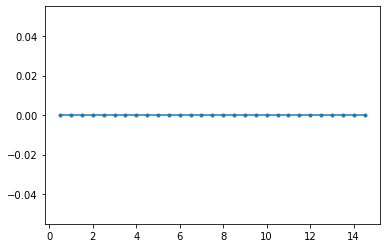

22.0


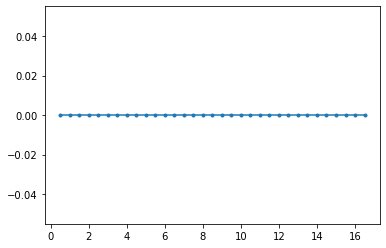

57.0


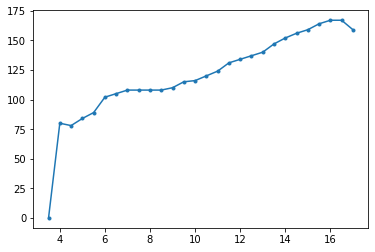

67.0


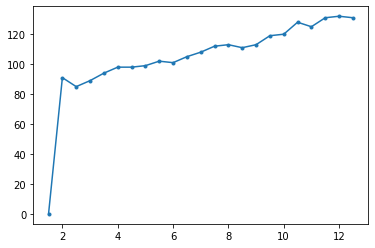

70.0


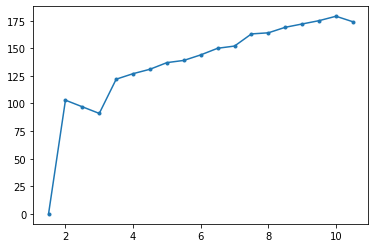

208.0


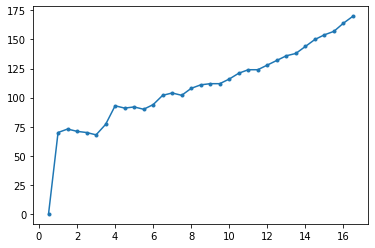

210.0


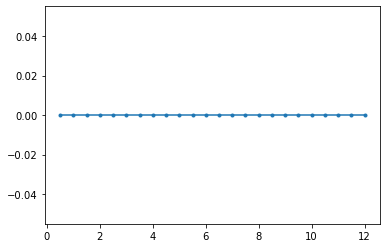

215.0


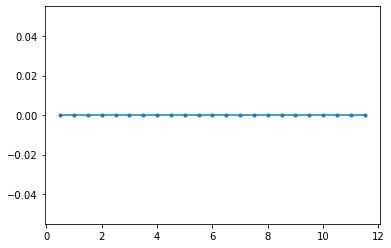

217.0


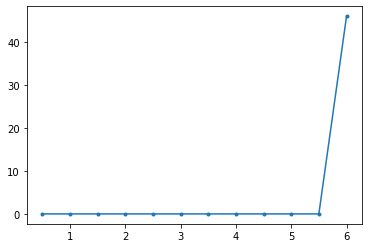

218.0


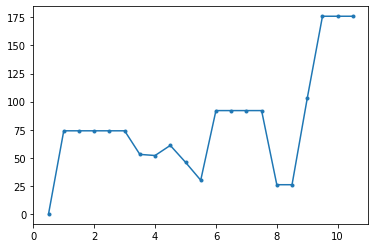

223.0


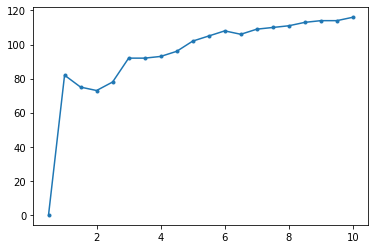

In [65]:
for i in data_df_time.loc[data_df_time.HR ==0].PatientId.drop_duplicates().values:
    print(i)
    temp_data = data_df_time.loc[data_df_time.PatientId==i]
    plt.plot(temp_data.minutes, temp_data['HR'], marker='.')
    plt.show()

In [66]:
data_to_exclude = [16, 22, 210, 215, 217, 218]

In [73]:
#clean_data = data_df_time.loc[data_df_time.]
clean_data = data_df_time[~data_df_time.PatientId.isin(data_to_exclude)]
clean_data.replace([np.inf, -np.inf], np.nan, inplace=True)

C:\Users\julio\Anaconda3\lib\site-packages\pandas\core\frame.py:4530: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  method=method,


In [74]:
clean_data.shape

(6561, 20)

In [77]:
clean_data.dropna()
clean_data.loc[clean_data.O2==np.nan]

,PatientId,SessionId,minutes,HR,VO2,VCO2,VE,VE/VO2,VE/VCO2,RER,RR,HasAnaerobicThreshold,sex,age,BMI,MaxVO2_EST,CardiacLim,PulmonaryLim,MuscleSkeletalLim,O2


In [78]:
cols_ts = ['HR', 'VO2', 'VCO2', 'VE', 'RER', 'RR','O2']

In [84]:
'patient {} of {}'.format(1,clean_data.PatientId.drop_duplicates().values[-1])

'patient 1 of 231.0'

In [105]:
str(1.0).replace('.','_')

'1_0'

patient 7.0 of 231.0


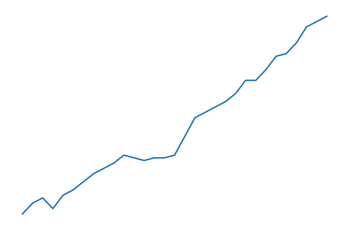

patient 7.0 of 231.0


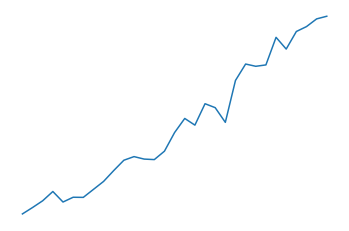

patient 7.0 of 231.0


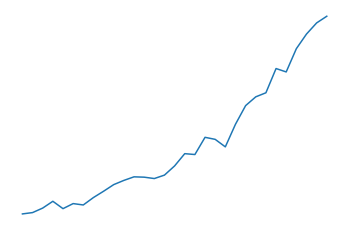

patient 7.0 of 231.0


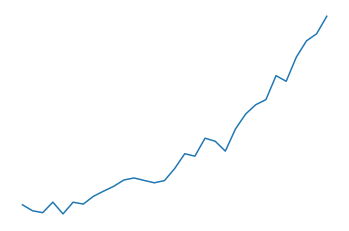

patient 7.0 of 231.0


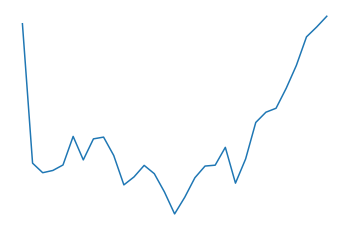

patient 7.0 of 231.0


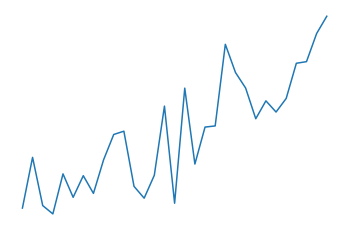

patient 7.0 of 231.0


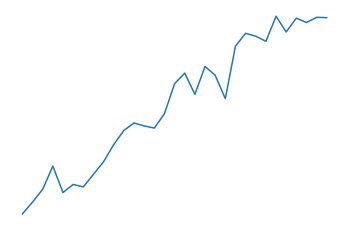


patient 8.0 of 231.0


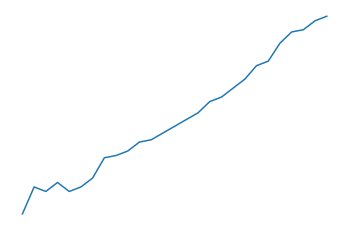

patient 8.0 of 231.0


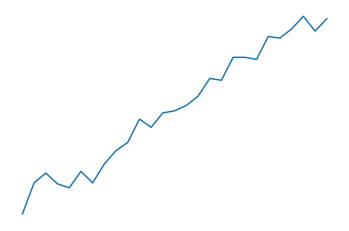

patient 8.0 of 231.0


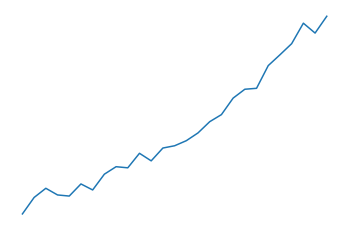

patient 8.0 of 231.0


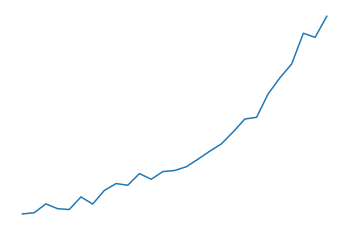

patient 8.0 of 231.0


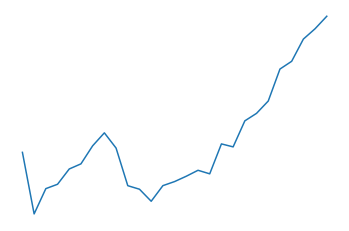

patient 8.0 of 231.0


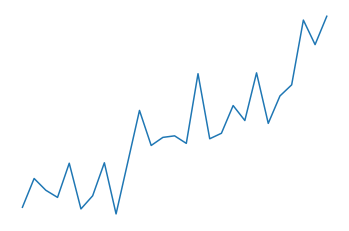

patient 8.0 of 231.0


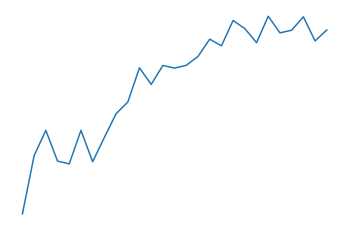


patient 9.0 of 231.0


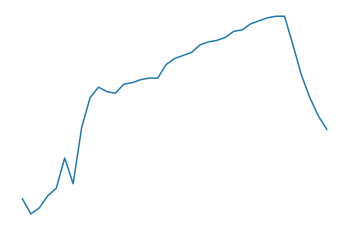

patient 9.0 of 231.0


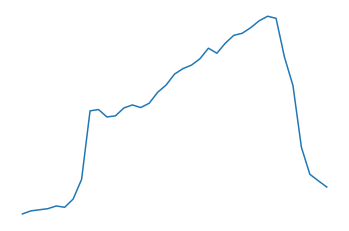

patient 9.0 of 231.0


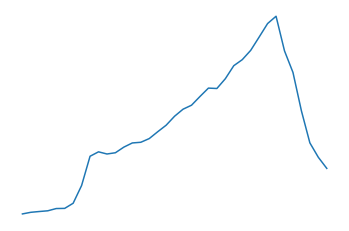

patient 9.0 of 231.0


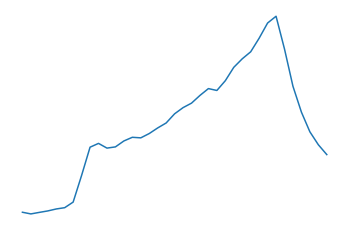

patient 9.0 of 231.0


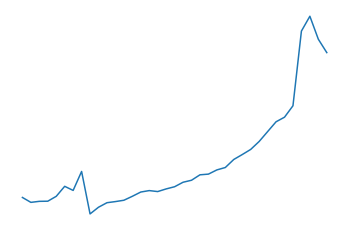

patient 9.0 of 231.0


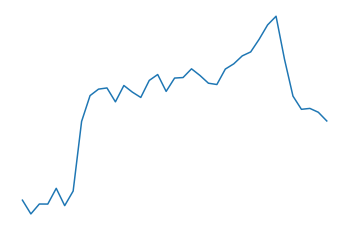

patient 9.0 of 231.0


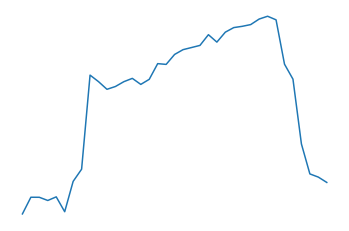


patient 10.0 of 231.0


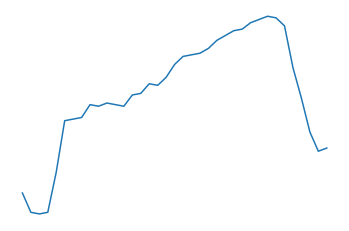

patient 10.0 of 231.0


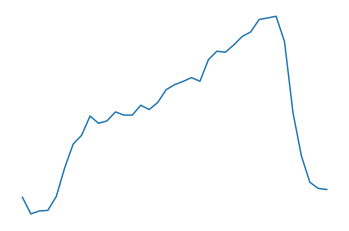

patient 10.0 of 231.0


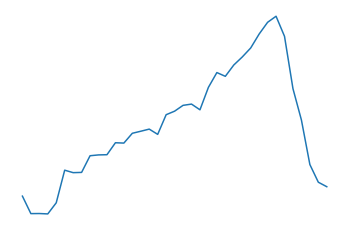

patient 10.0 of 231.0


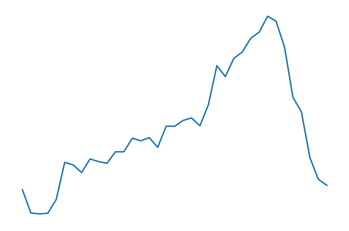

patient 10.0 of 231.0


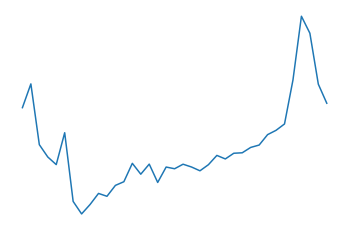

patient 10.0 of 231.0


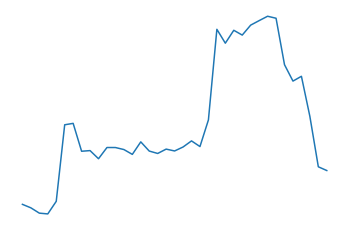

patient 10.0 of 231.0


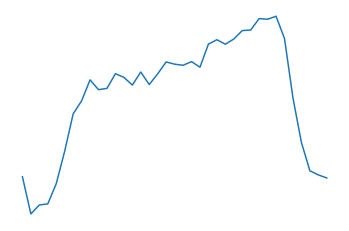


patient 11.0 of 231.0


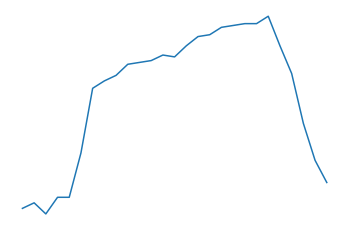

patient 11.0 of 231.0


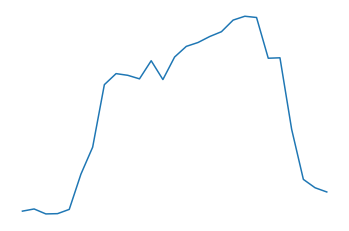

patient 11.0 of 231.0


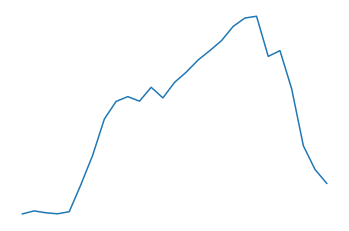

patient 11.0 of 231.0


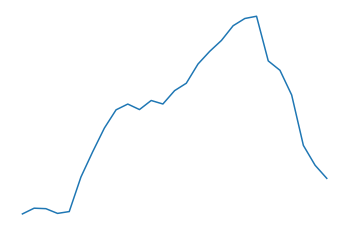

patient 11.0 of 231.0


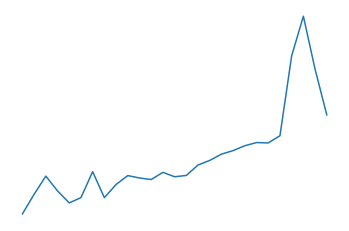

patient 11.0 of 231.0


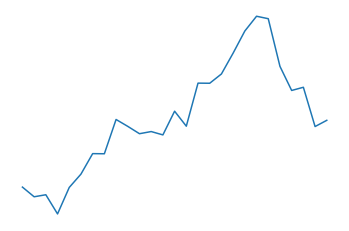

patient 11.0 of 231.0


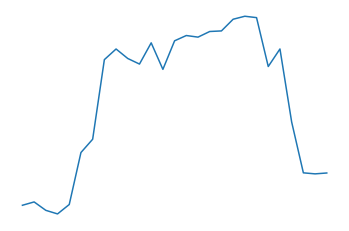


patient 12.0 of 231.0


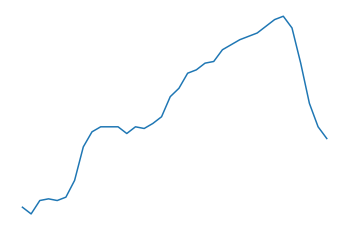

patient 12.0 of 231.0


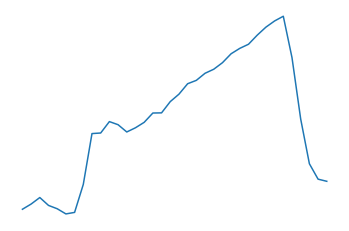

patient 12.0 of 231.0


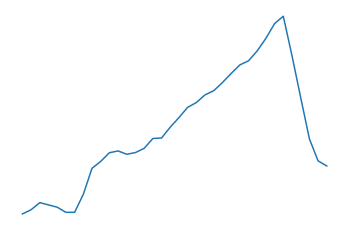

patient 12.0 of 231.0


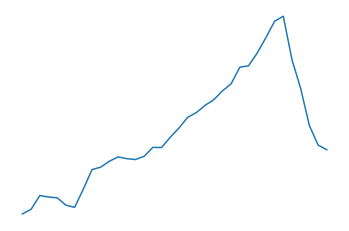

patient 12.0 of 231.0


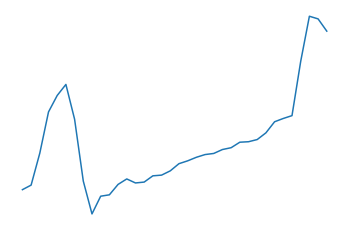

patient 12.0 of 231.0


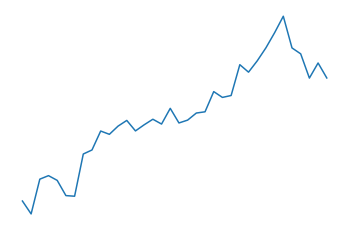

patient 12.0 of 231.0


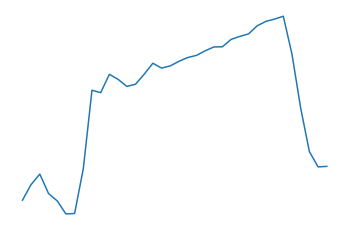


patient 13.0 of 231.0


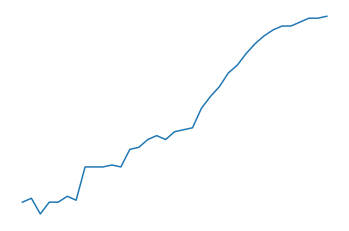

patient 13.0 of 231.0


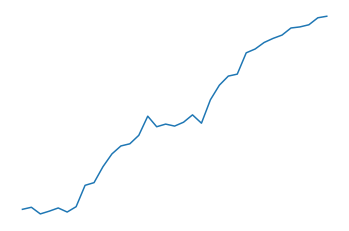

patient 13.0 of 231.0


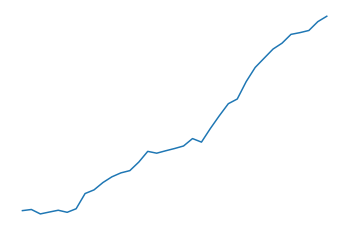

patient 13.0 of 231.0


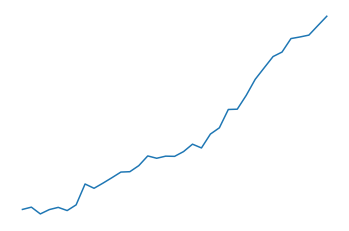

patient 13.0 of 231.0


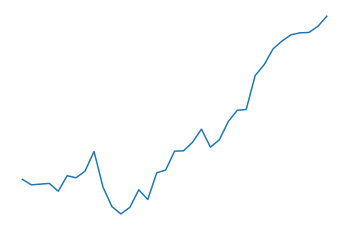

patient 13.0 of 231.0


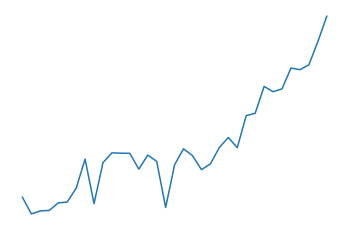

patient 13.0 of 231.0


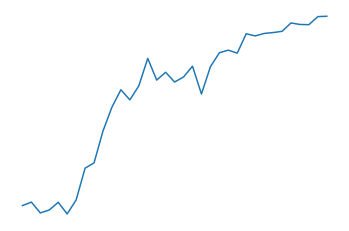


patient 14.0 of 231.0


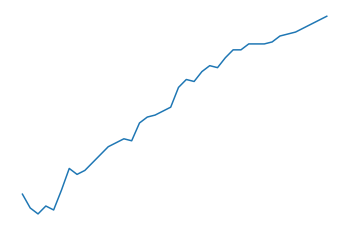

patient 14.0 of 231.0


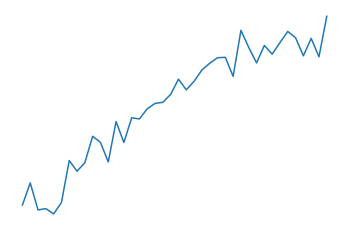

patient 14.0 of 231.0


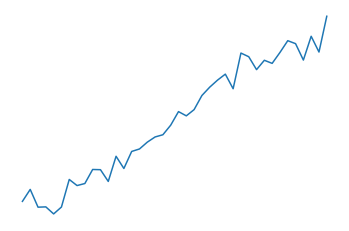

patient 14.0 of 231.0


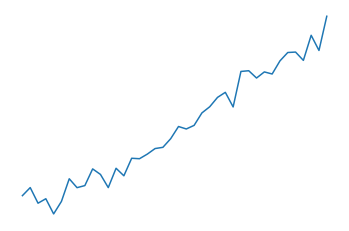

patient 14.0 of 231.0


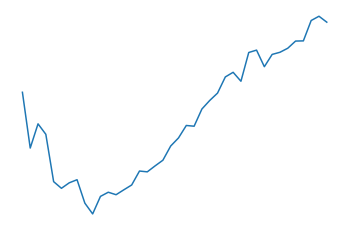

patient 14.0 of 231.0


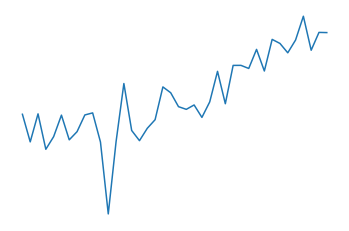

patient 14.0 of 231.0


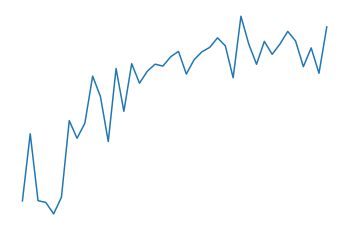


patient 15.0 of 231.0


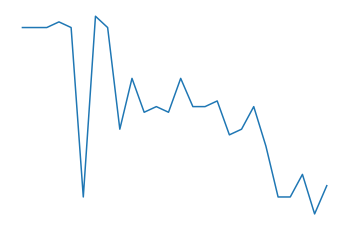

patient 15.0 of 231.0


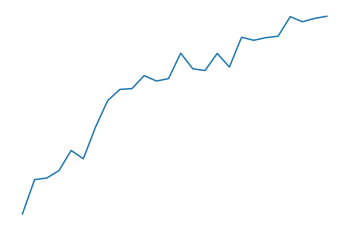

patient 15.0 of 231.0


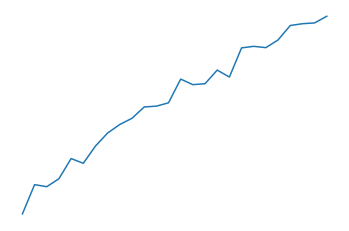

patient 15.0 of 231.0


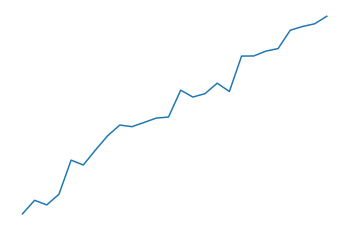

patient 15.0 of 231.0


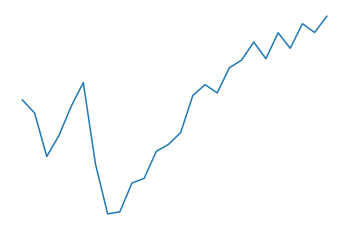

patient 15.0 of 231.0


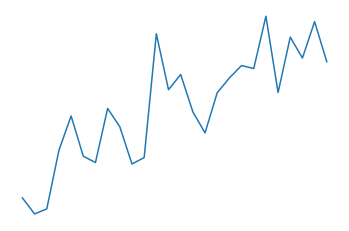

patient 15.0 of 231.0


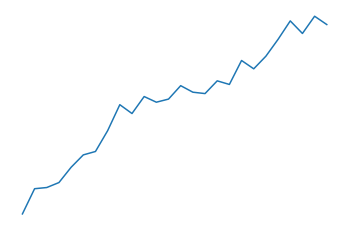


patient 17.0 of 231.0


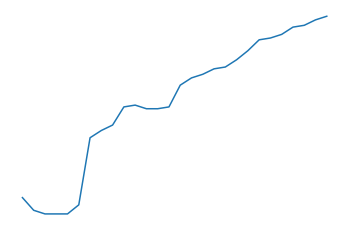

patient 17.0 of 231.0


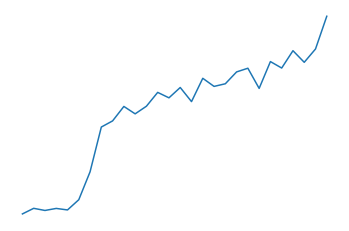

patient 17.0 of 231.0


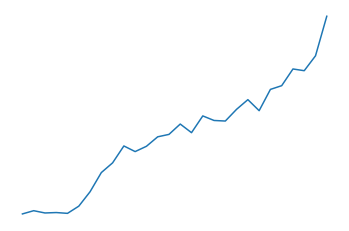

patient 17.0 of 231.0


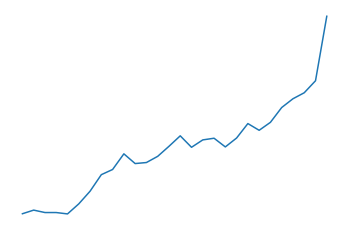

patient 17.0 of 231.0


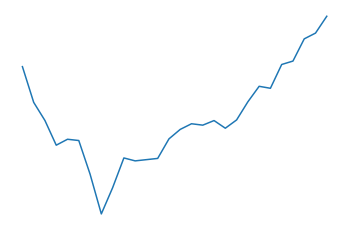

patient 17.0 of 231.0


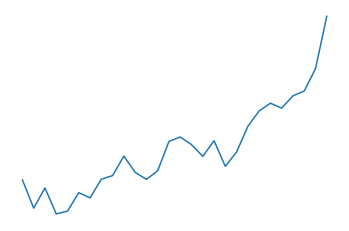

patient 17.0 of 231.0


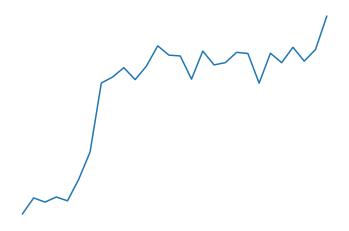


patient 18.0 of 231.0


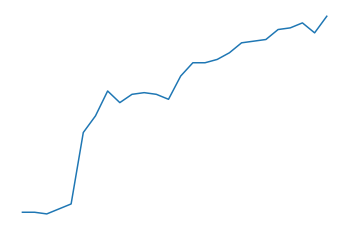

patient 18.0 of 231.0


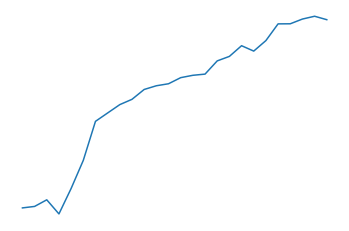

patient 18.0 of 231.0


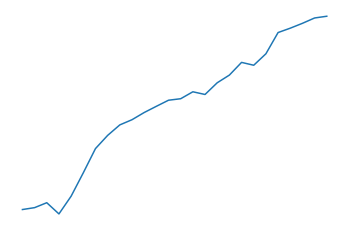

patient 18.0 of 231.0


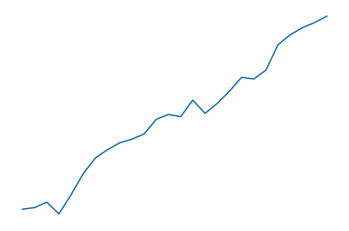

patient 18.0 of 231.0


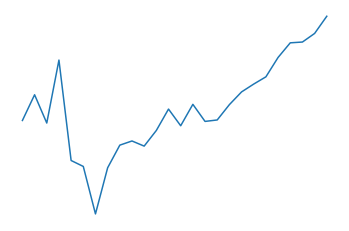

patient 18.0 of 231.0


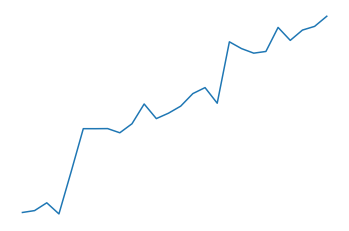

patient 18.0 of 231.0


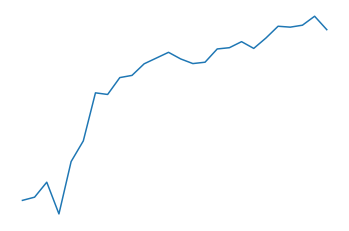


patient 19.0 of 231.0


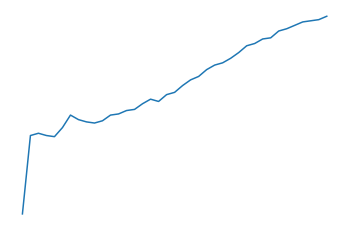

patient 19.0 of 231.0


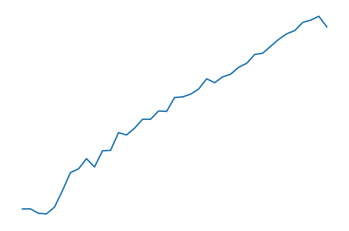

patient 19.0 of 231.0


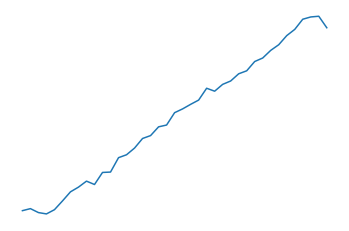

patient 19.0 of 231.0


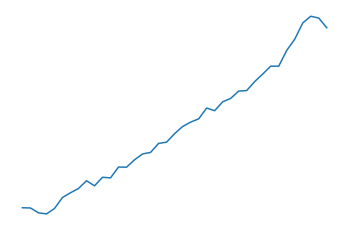

patient 19.0 of 231.0


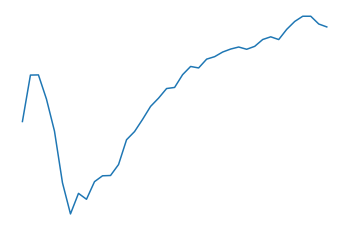

patient 19.0 of 231.0


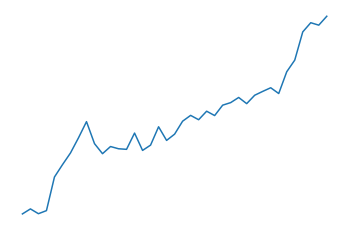

patient 19.0 of 231.0


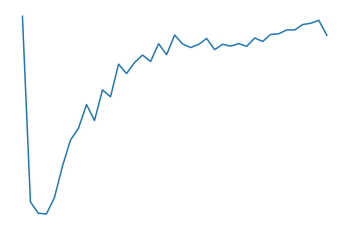


patient 20.0 of 231.0


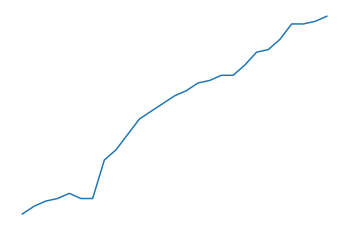

patient 20.0 of 231.0


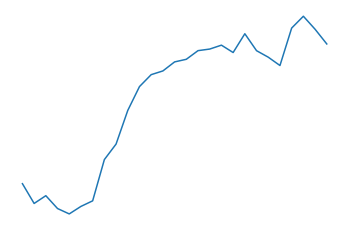

patient 20.0 of 231.0


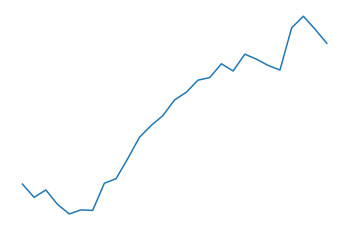

patient 20.0 of 231.0


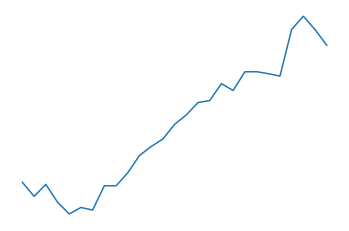

patient 20.0 of 231.0


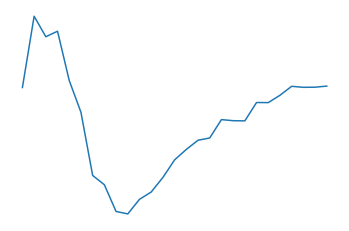

patient 20.0 of 231.0


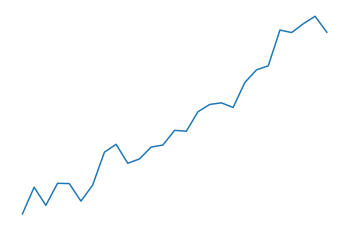

patient 20.0 of 231.0


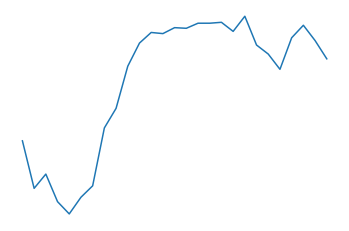


patient 21.0 of 231.0


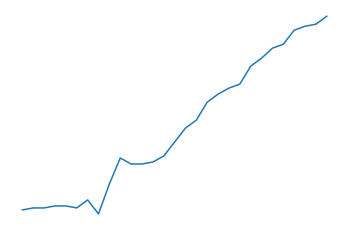

patient 21.0 of 231.0


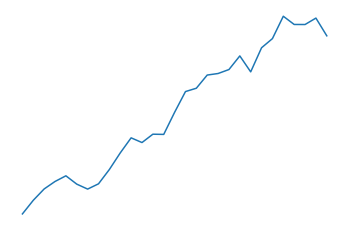

patient 21.0 of 231.0


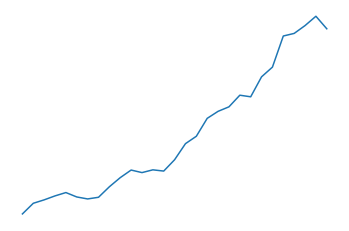

patient 21.0 of 231.0


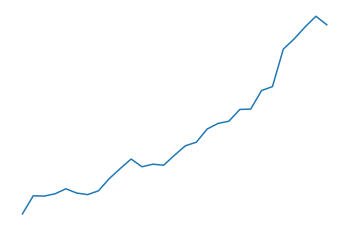

patient 21.0 of 231.0


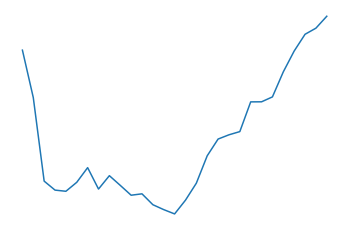

patient 21.0 of 231.0


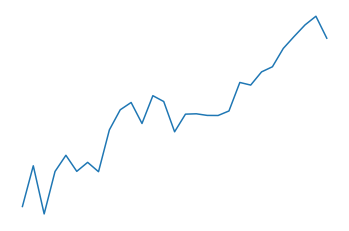

patient 21.0 of 231.0


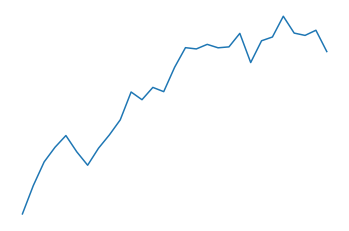


patient 23.0 of 231.0


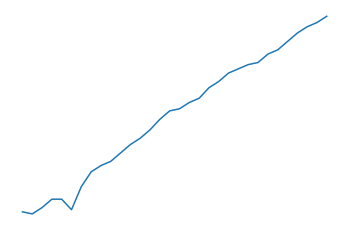

patient 23.0 of 231.0


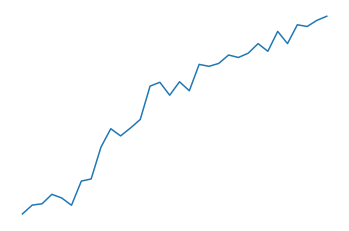

patient 23.0 of 231.0


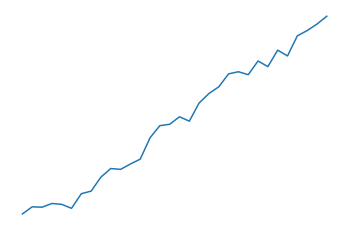

patient 23.0 of 231.0


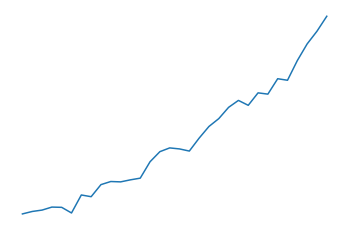

patient 23.0 of 231.0


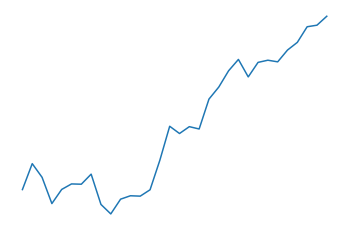

patient 23.0 of 231.0


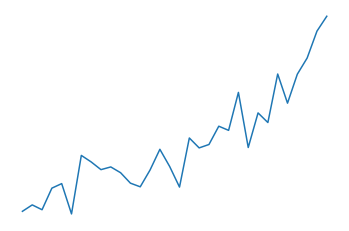

patient 23.0 of 231.0


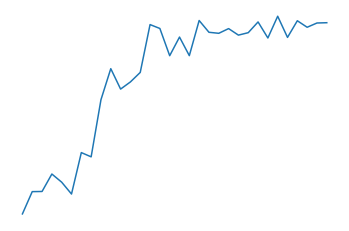


patient 24.0 of 231.0


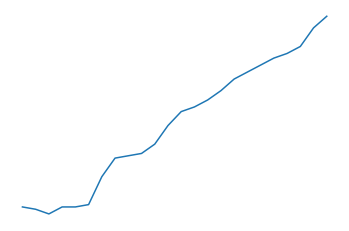

patient 24.0 of 231.0


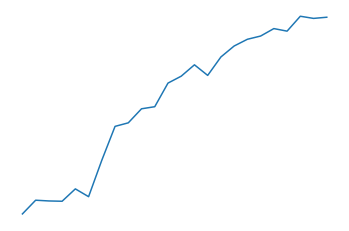

patient 24.0 of 231.0


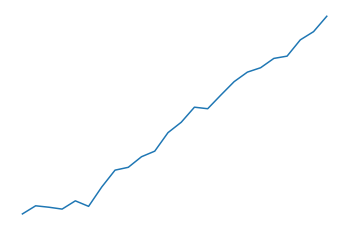

patient 24.0 of 231.0


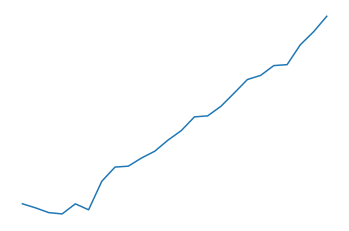

patient 24.0 of 231.0


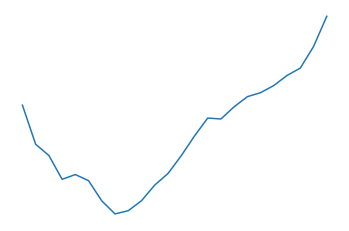

patient 24.0 of 231.0


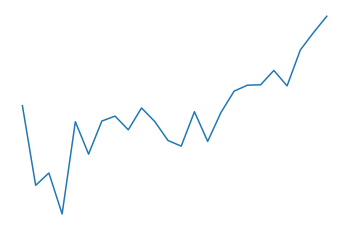

patient 24.0 of 231.0


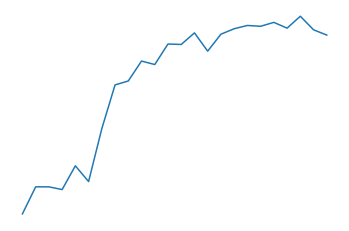


patient 25.0 of 231.0


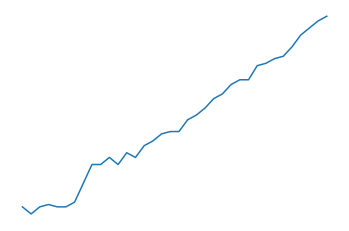

patient 25.0 of 231.0


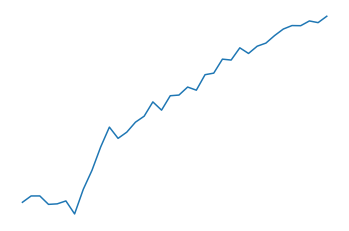

patient 25.0 of 231.0


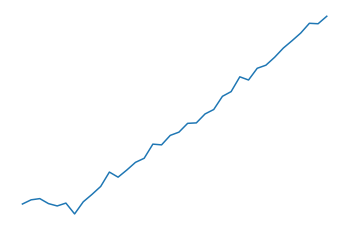

patient 25.0 of 231.0


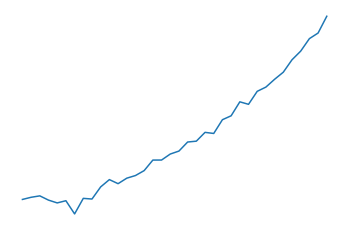

patient 25.0 of 231.0


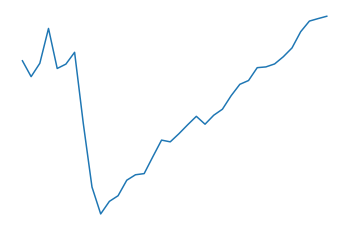

patient 25.0 of 231.0


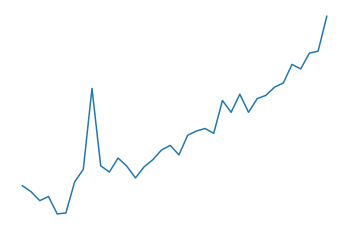

patient 25.0 of 231.0


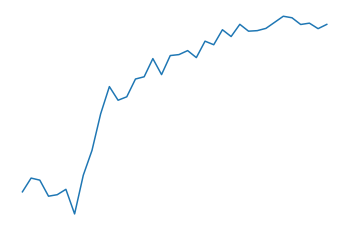


patient 26.0 of 231.0


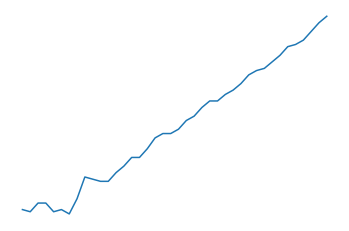

patient 26.0 of 231.0


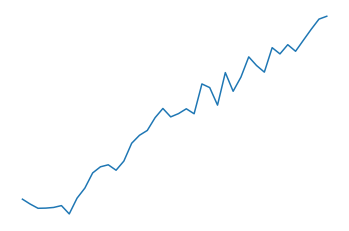

patient 26.0 of 231.0


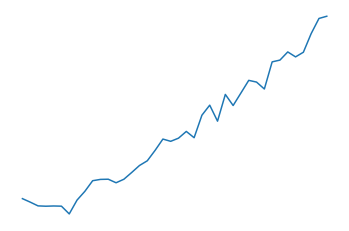

patient 26.0 of 231.0


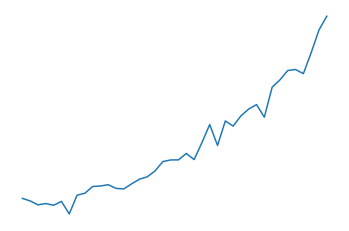

patient 26.0 of 231.0


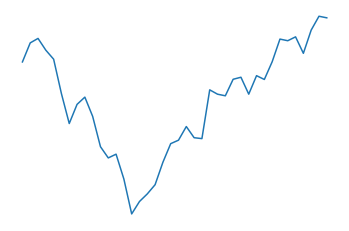

patient 26.0 of 231.0


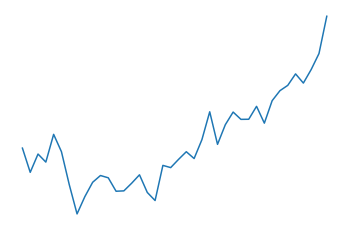

patient 26.0 of 231.0


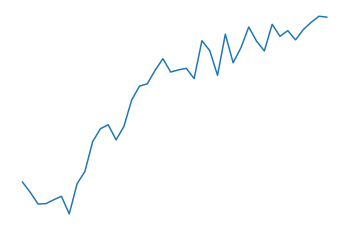


patient 27.0 of 231.0


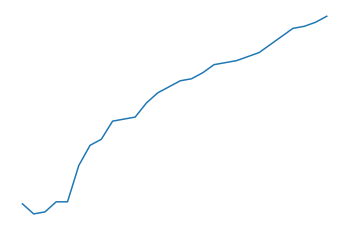

patient 27.0 of 231.0


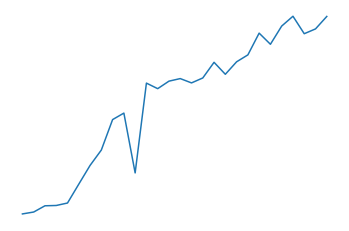

patient 27.0 of 231.0


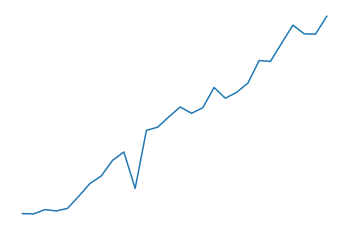

patient 27.0 of 231.0


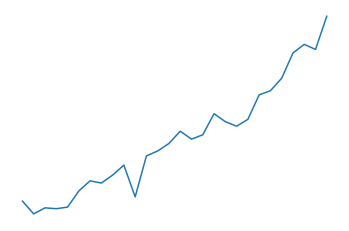

patient 27.0 of 231.0


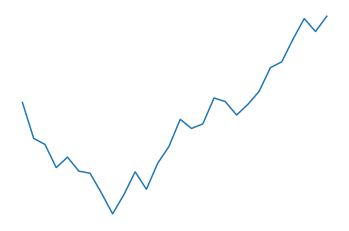

patient 27.0 of 231.0


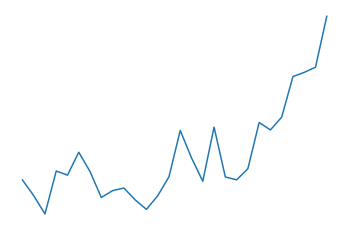

patient 27.0 of 231.0


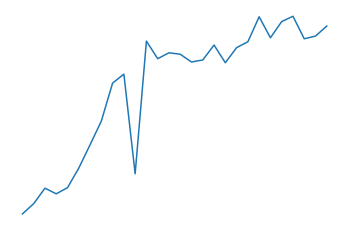


patient 28.0 of 231.0


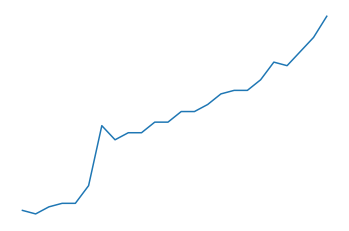

patient 28.0 of 231.0


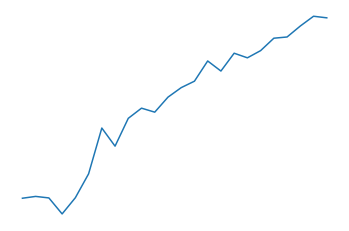

patient 28.0 of 231.0


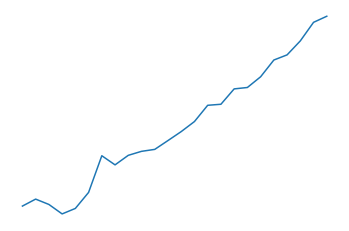

patient 28.0 of 231.0


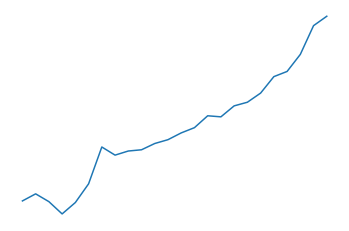

patient 28.0 of 231.0


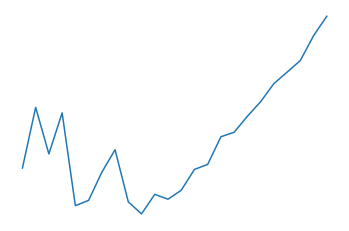

patient 28.0 of 231.0


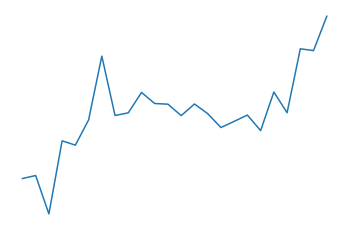

patient 28.0 of 231.0


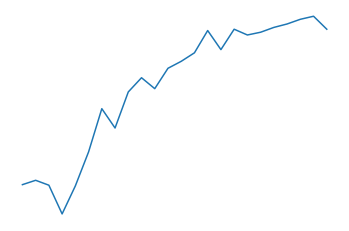


patient 29.0 of 231.0


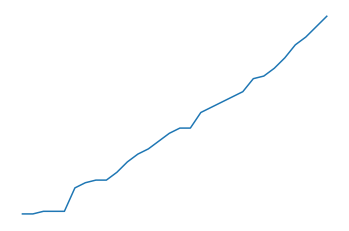

patient 29.0 of 231.0


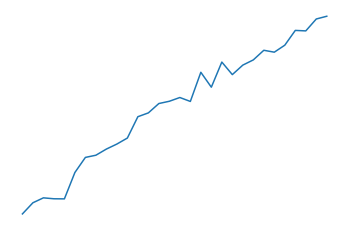

patient 29.0 of 231.0


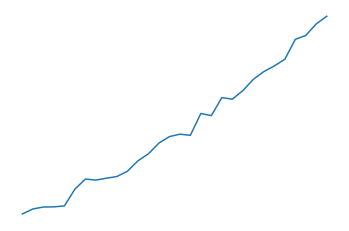

patient 29.0 of 231.0


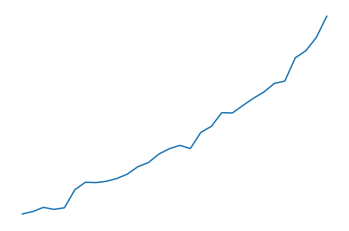

patient 29.0 of 231.0


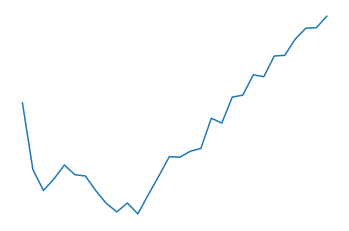

patient 29.0 of 231.0


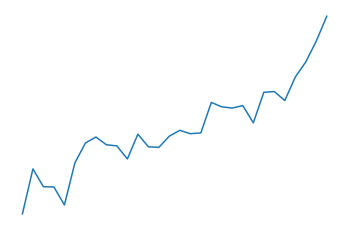

patient 29.0 of 231.0


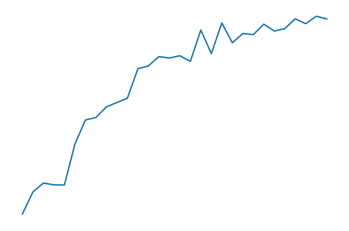


patient 30.0 of 231.0


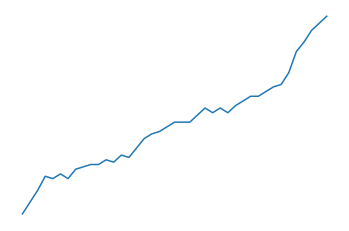

patient 30.0 of 231.0


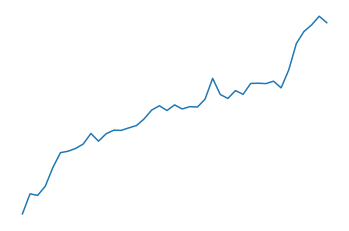

patient 30.0 of 231.0


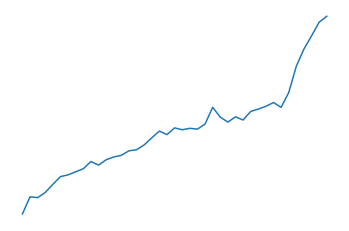

patient 30.0 of 231.0


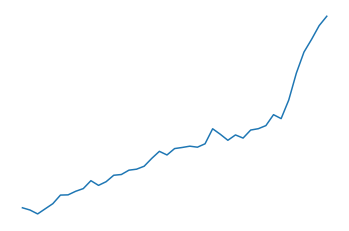

patient 30.0 of 231.0


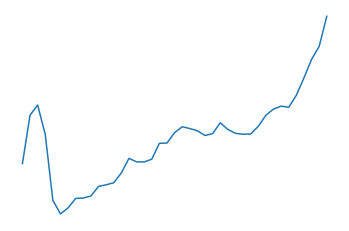

patient 30.0 of 231.0


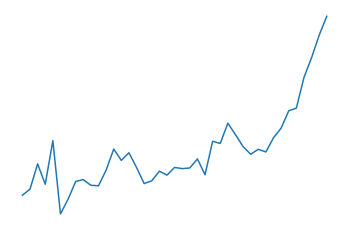

patient 30.0 of 231.0


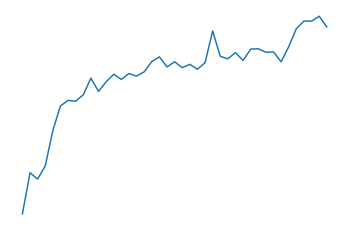


patient 31.0 of 231.0


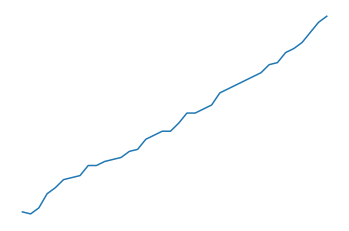

patient 31.0 of 231.0


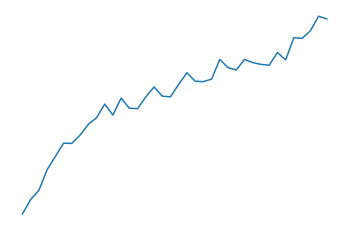

patient 31.0 of 231.0


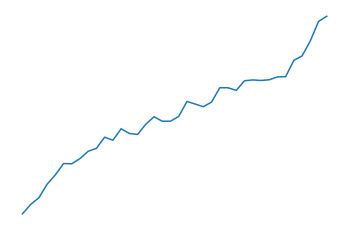

patient 31.0 of 231.0


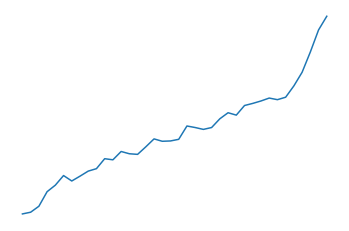

patient 31.0 of 231.0


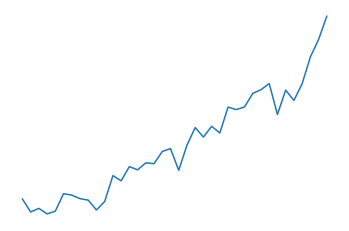

patient 31.0 of 231.0


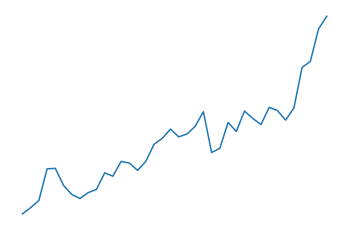

patient 31.0 of 231.0


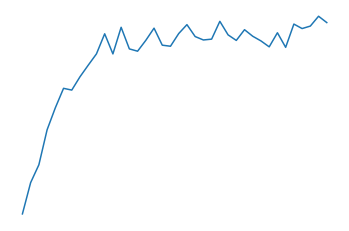


patient 32.0 of 231.0


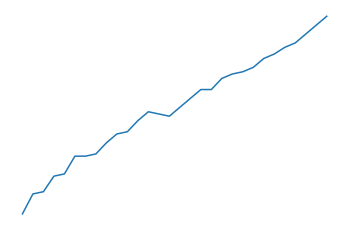

patient 32.0 of 231.0


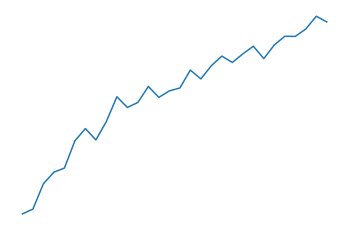

patient 32.0 of 231.0


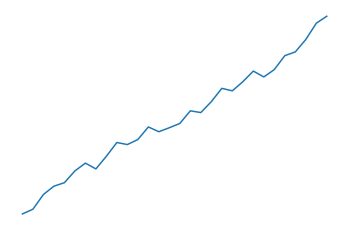

patient 32.0 of 231.0


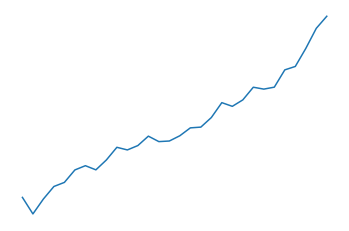

patient 32.0 of 231.0


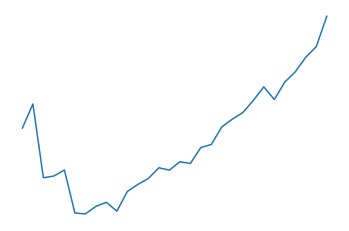

patient 32.0 of 231.0


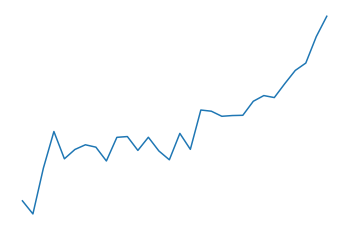

patient 32.0 of 231.0


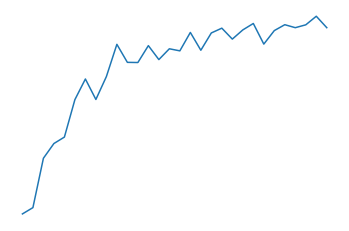


patient 33.0 of 231.0


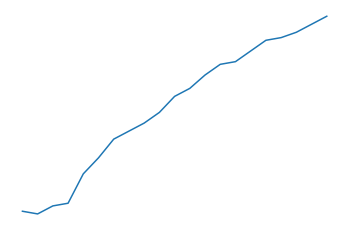

patient 33.0 of 231.0


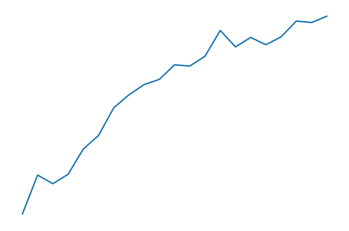

patient 33.0 of 231.0


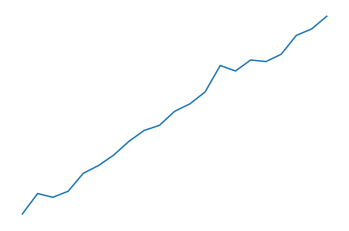

patient 33.0 of 231.0


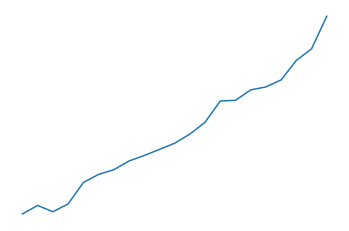

patient 33.0 of 231.0


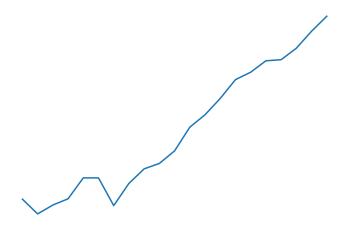

patient 33.0 of 231.0


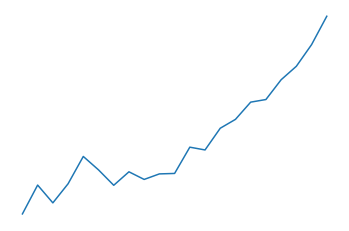

patient 33.0 of 231.0


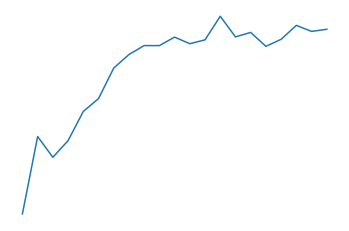


patient 34.0 of 231.0


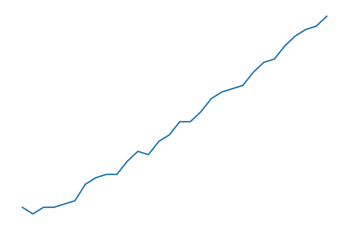

patient 34.0 of 231.0


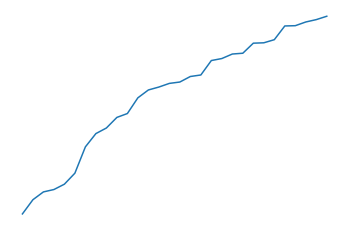

patient 34.0 of 231.0


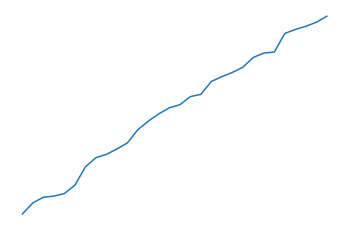

patient 34.0 of 231.0


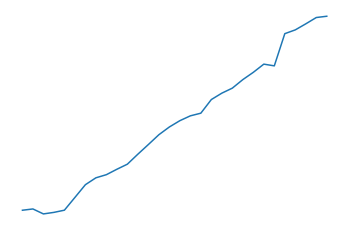

patient 34.0 of 231.0


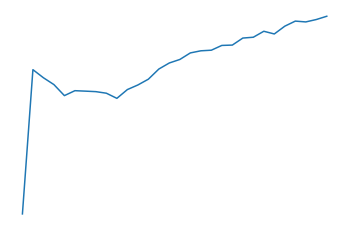

patient 34.0 of 231.0


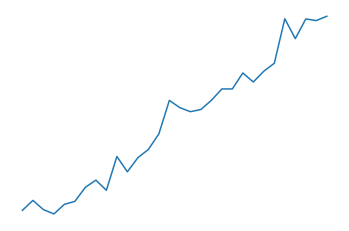

patient 34.0 of 231.0


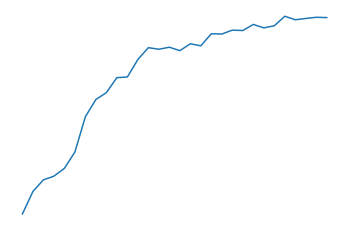


patient 35.0 of 231.0


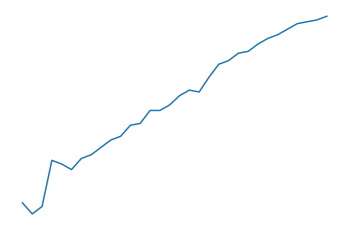

patient 35.0 of 231.0


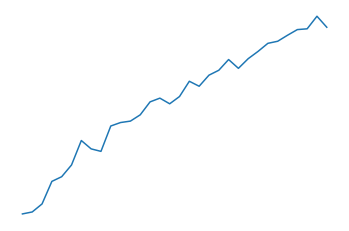

patient 35.0 of 231.0


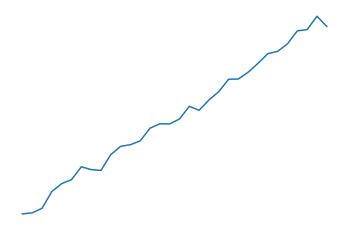

patient 35.0 of 231.0


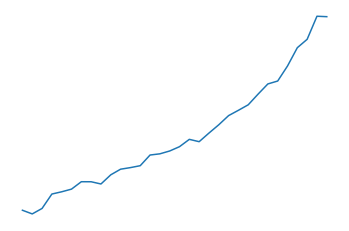

patient 35.0 of 231.0


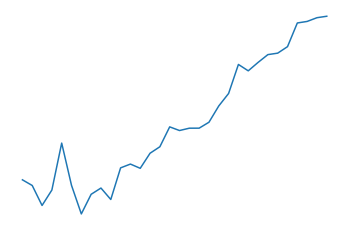

patient 35.0 of 231.0


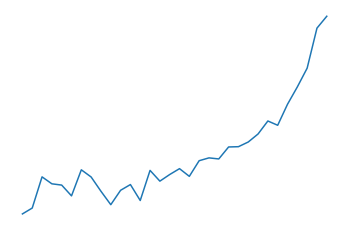

patient 35.0 of 231.0


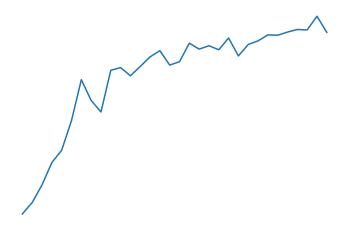


patient 36.0 of 231.0


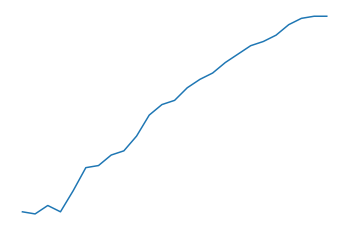

patient 36.0 of 231.0


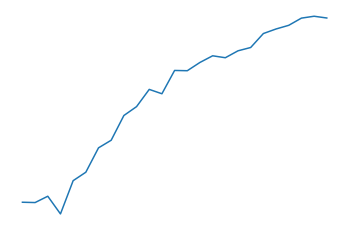

patient 36.0 of 231.0


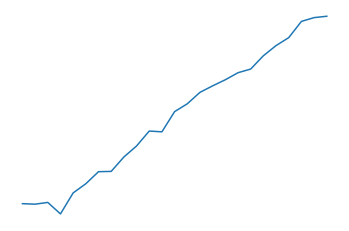

patient 36.0 of 231.0


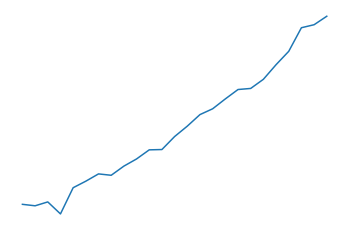

patient 36.0 of 231.0


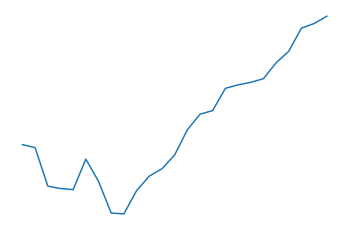

patient 36.0 of 231.0


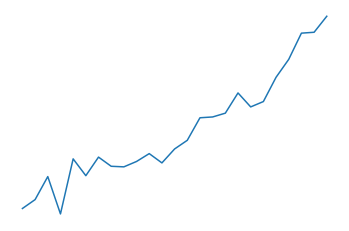

patient 36.0 of 231.0


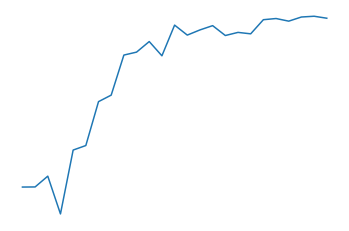


patient 37.0 of 231.0


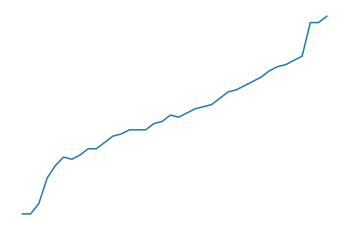

patient 37.0 of 231.0


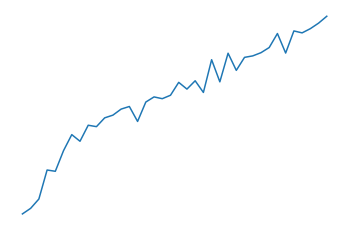

patient 37.0 of 231.0


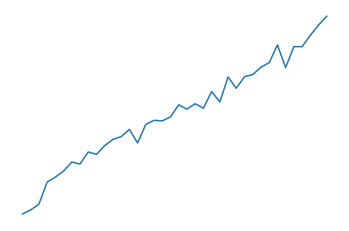

patient 37.0 of 231.0


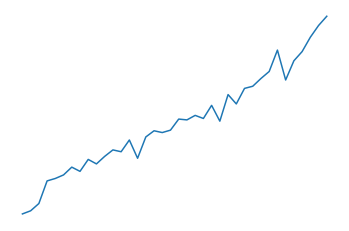

patient 37.0 of 231.0


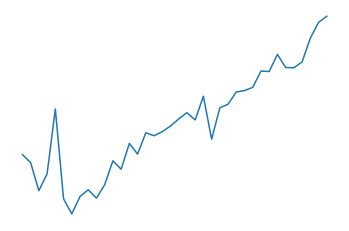

patient 37.0 of 231.0


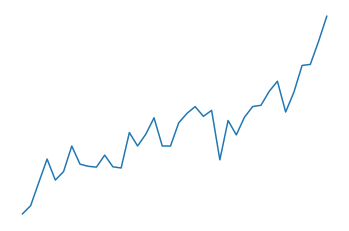

patient 37.0 of 231.0


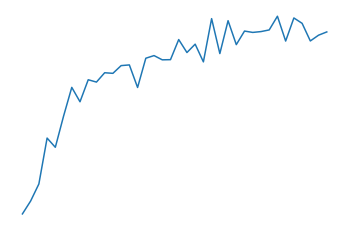


patient 38.0 of 231.0


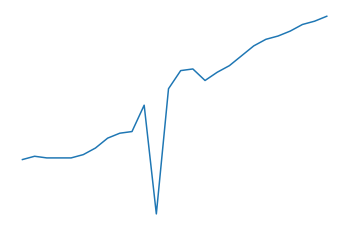

patient 38.0 of 231.0


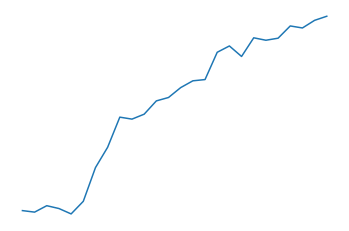

patient 38.0 of 231.0


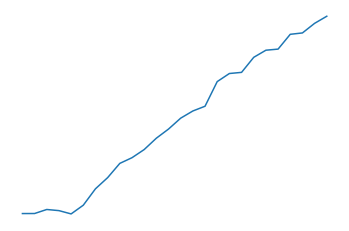

patient 38.0 of 231.0


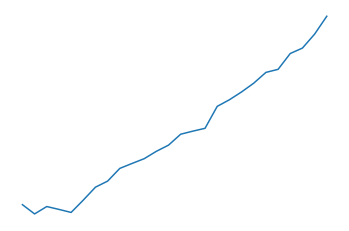

patient 38.0 of 231.0


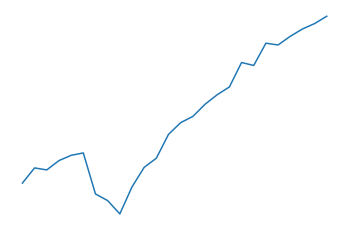

patient 38.0 of 231.0


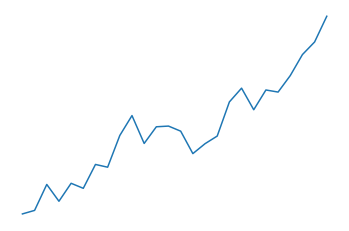

patient 38.0 of 231.0


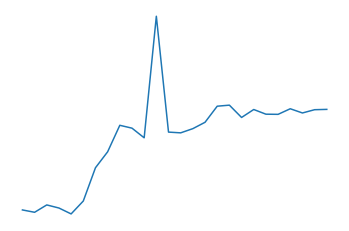


patient 39.0 of 231.0


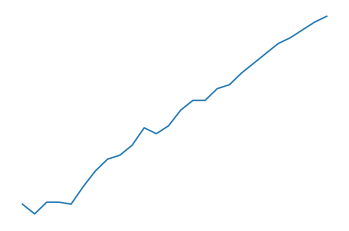

patient 39.0 of 231.0


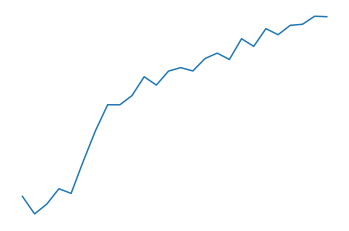

patient 39.0 of 231.0


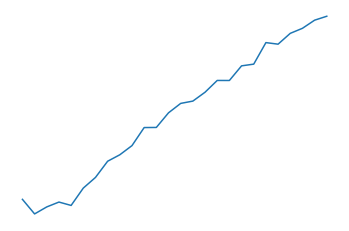

patient 39.0 of 231.0


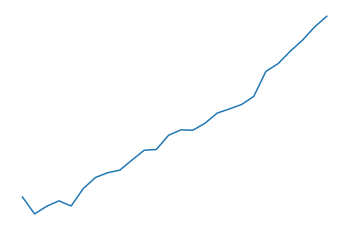

patient 39.0 of 231.0


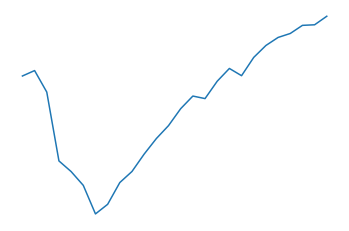

patient 39.0 of 231.0


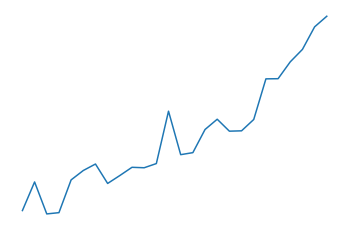

patient 39.0 of 231.0


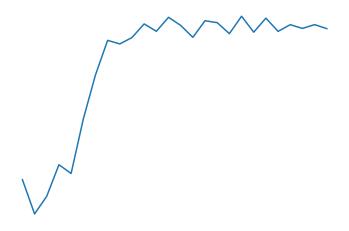


patient 40.0 of 231.0


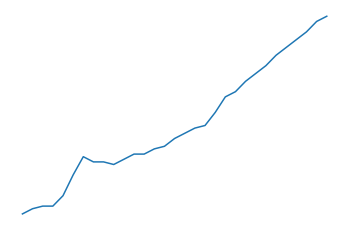

patient 40.0 of 231.0


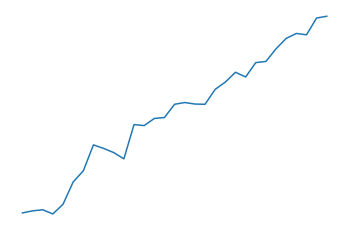

patient 40.0 of 231.0


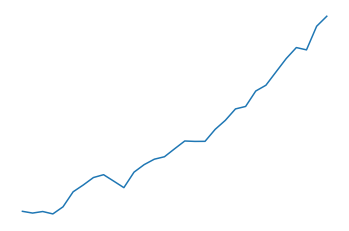

patient 40.0 of 231.0


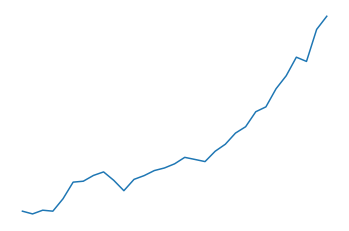

patient 40.0 of 231.0


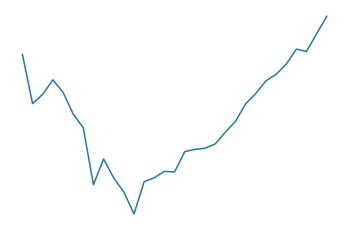

patient 40.0 of 231.0


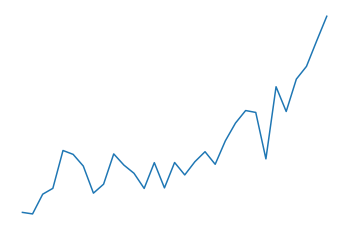

patient 40.0 of 231.0


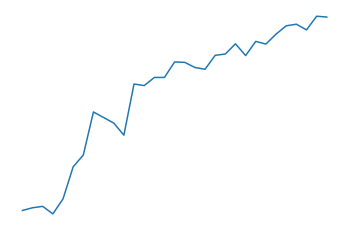


patient 41.0 of 231.0


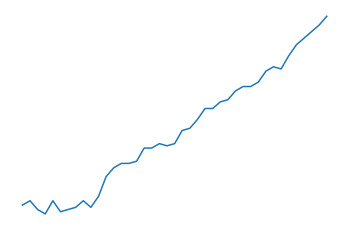

patient 41.0 of 231.0


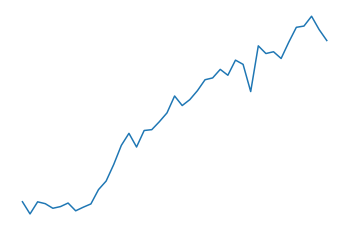

patient 41.0 of 231.0


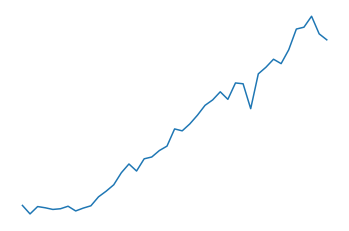

patient 41.0 of 231.0


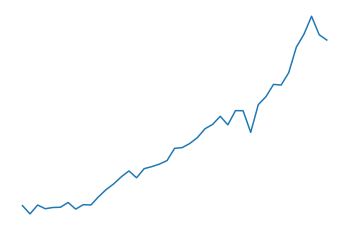

patient 41.0 of 231.0


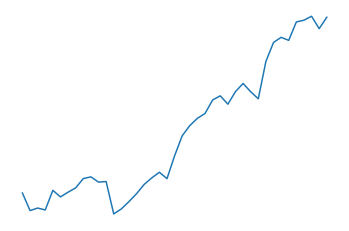

patient 41.0 of 231.0


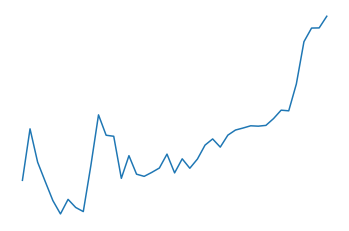

patient 41.0 of 231.0


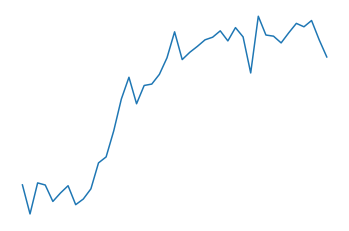


patient 42.0 of 231.0


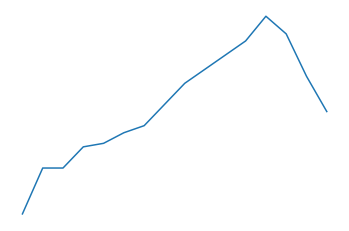

patient 42.0 of 231.0


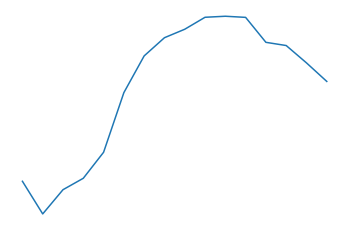

patient 42.0 of 231.0


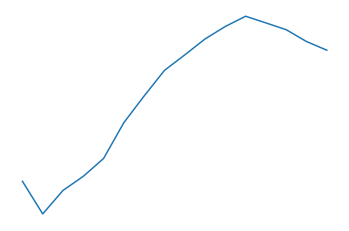

patient 42.0 of 231.0


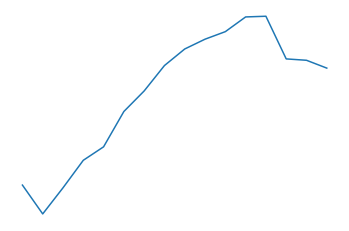

patient 42.0 of 231.0


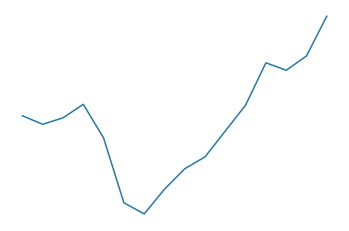

patient 42.0 of 231.0


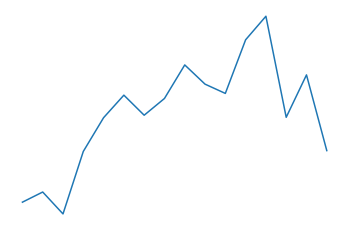

patient 42.0 of 231.0


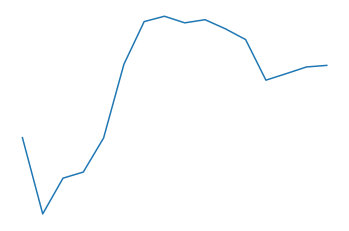


patient 43.0 of 231.0


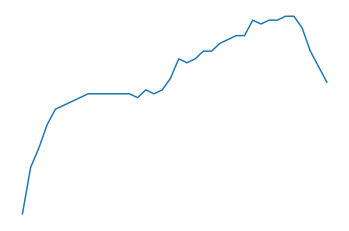

patient 43.0 of 231.0


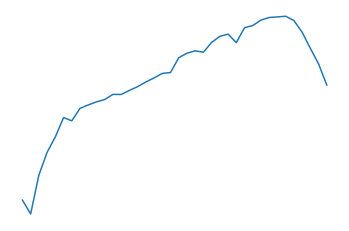

patient 43.0 of 231.0


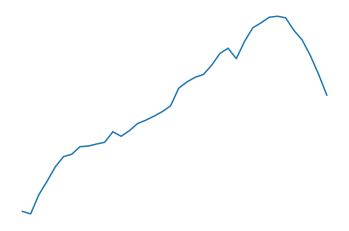

patient 43.0 of 231.0


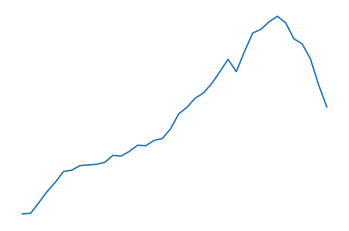

patient 43.0 of 231.0


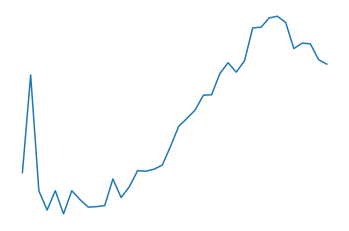

patient 43.0 of 231.0


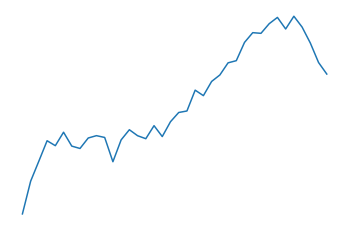

patient 43.0 of 231.0


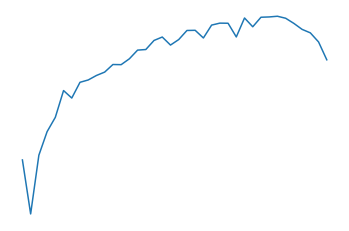


patient 44.0 of 231.0


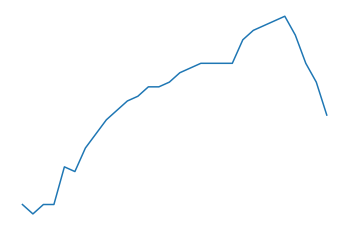

patient 44.0 of 231.0


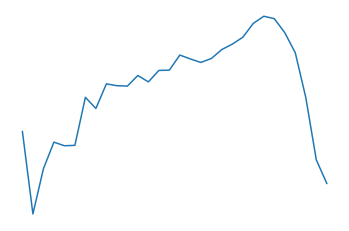

patient 44.0 of 231.0


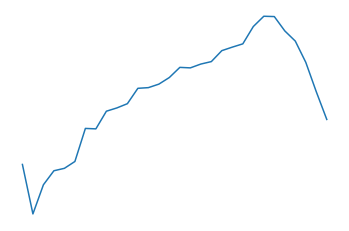

patient 44.0 of 231.0


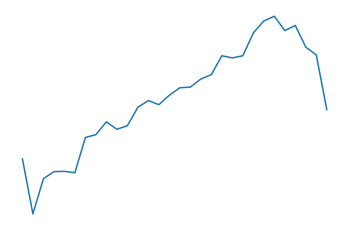

patient 44.0 of 231.0


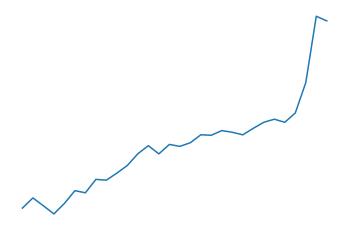

patient 44.0 of 231.0


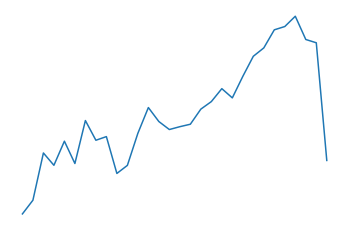

patient 44.0 of 231.0


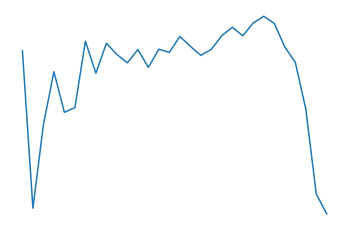


patient 45.0 of 231.0


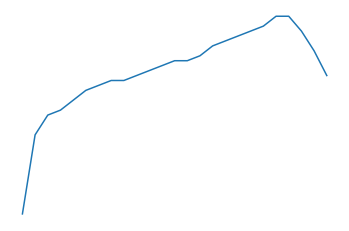

patient 45.0 of 231.0


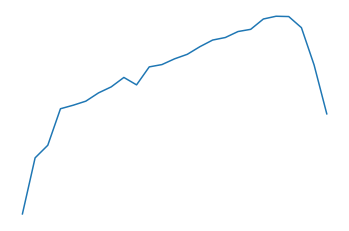

patient 45.0 of 231.0


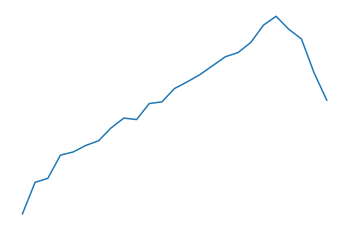

patient 45.0 of 231.0


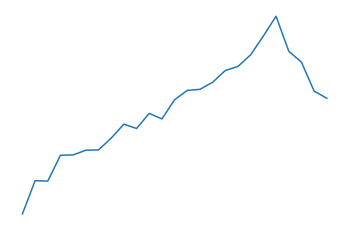

patient 45.0 of 231.0


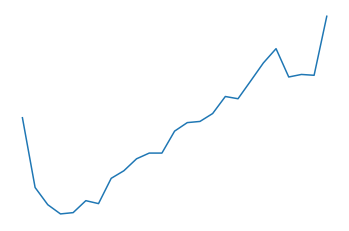

patient 45.0 of 231.0


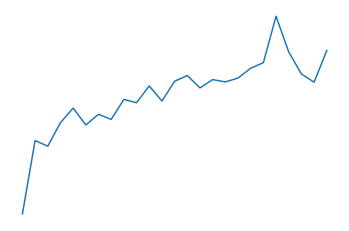

patient 45.0 of 231.0


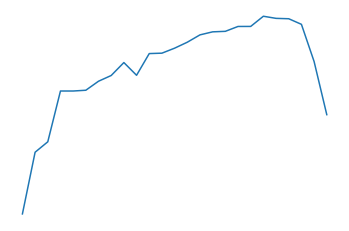


patient 46.0 of 231.0


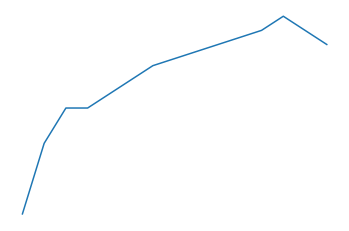

patient 46.0 of 231.0


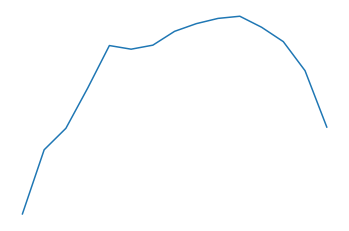

patient 46.0 of 231.0


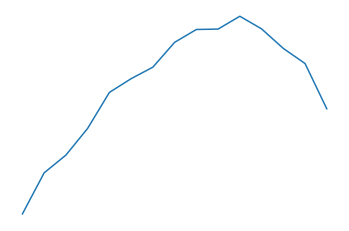

patient 46.0 of 231.0


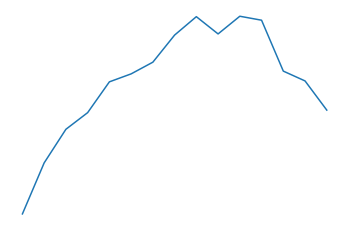

patient 46.0 of 231.0


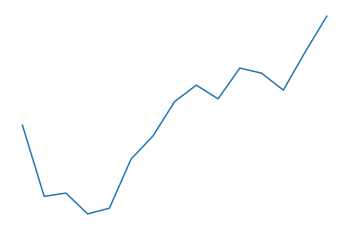

patient 46.0 of 231.0


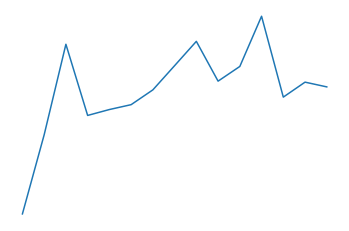

patient 46.0 of 231.0


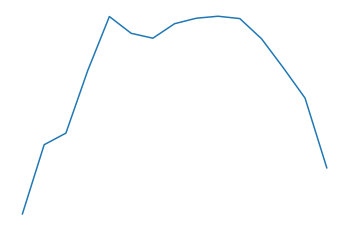


patient 47.0 of 231.0


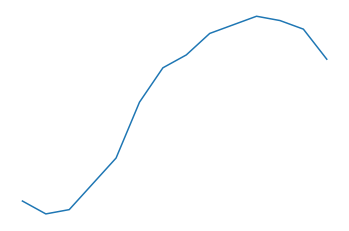

patient 47.0 of 231.0


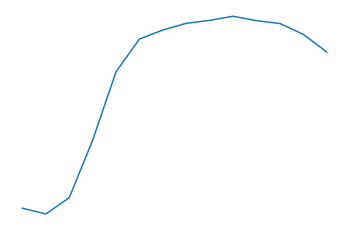

patient 47.0 of 231.0


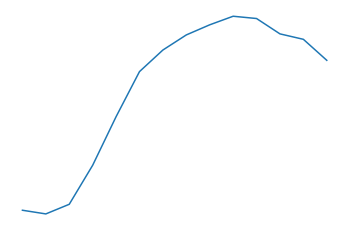

patient 47.0 of 231.0


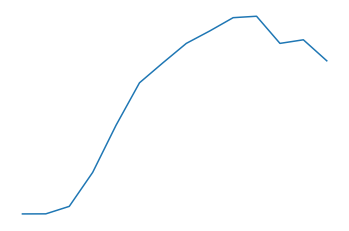

patient 47.0 of 231.0


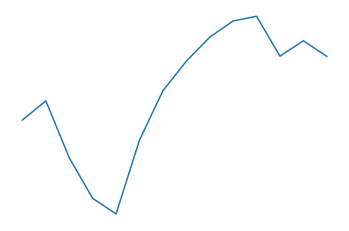

patient 47.0 of 231.0


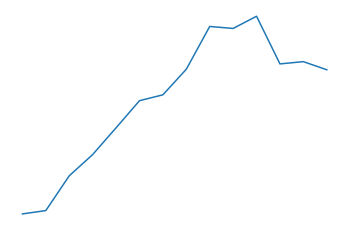

patient 47.0 of 231.0


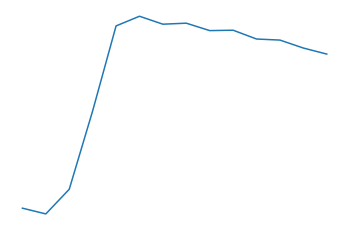


patient 48.0 of 231.0


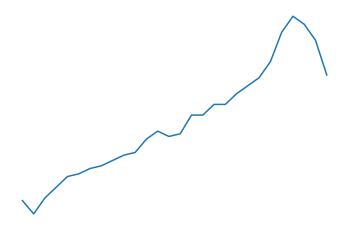

patient 48.0 of 231.0


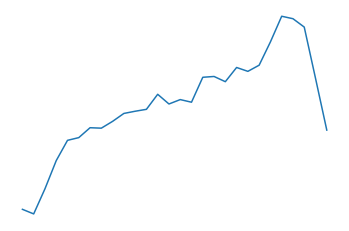

patient 48.0 of 231.0


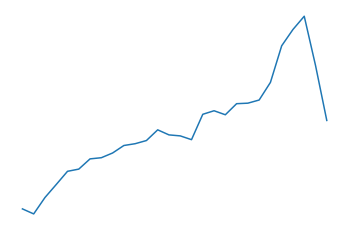

patient 48.0 of 231.0


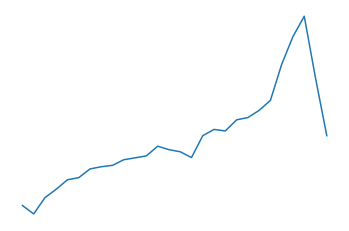

patient 48.0 of 231.0


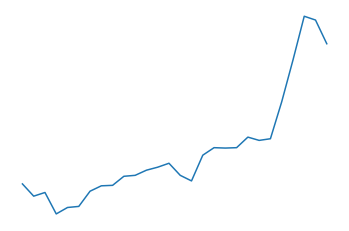

patient 48.0 of 231.0


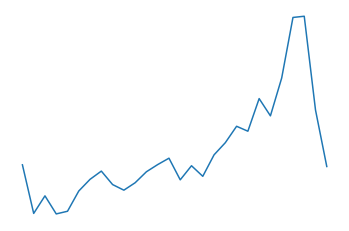

patient 48.0 of 231.0


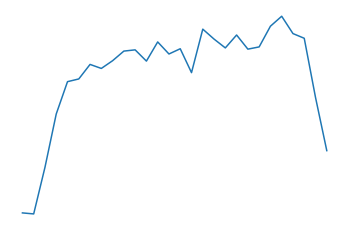


patient 49.0 of 231.0


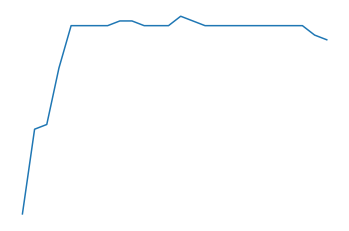

patient 49.0 of 231.0


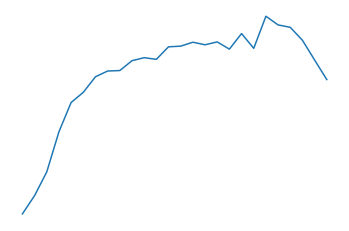

patient 49.0 of 231.0


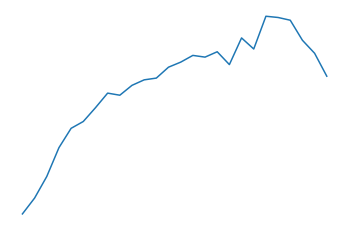

patient 49.0 of 231.0


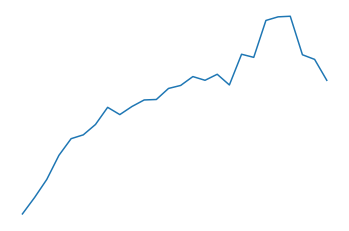

patient 49.0 of 231.0


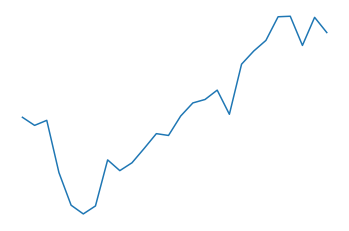

patient 49.0 of 231.0


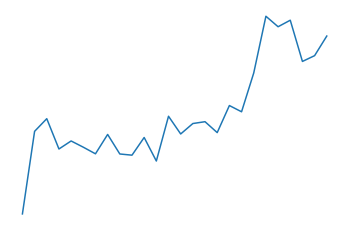

patient 49.0 of 231.0


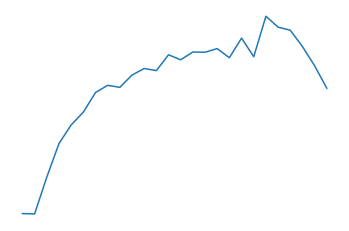


patient 50.0 of 231.0


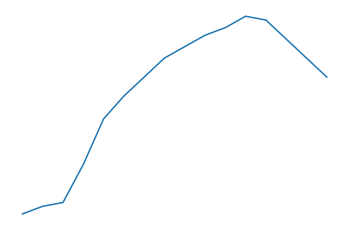

patient 50.0 of 231.0


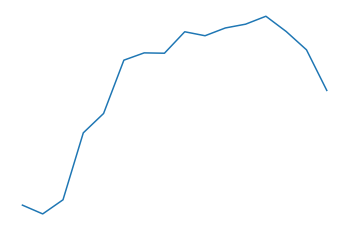

patient 50.0 of 231.0


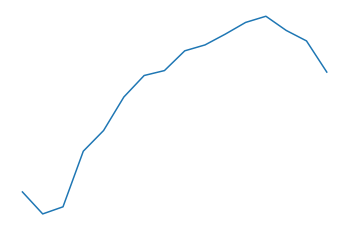

patient 50.0 of 231.0


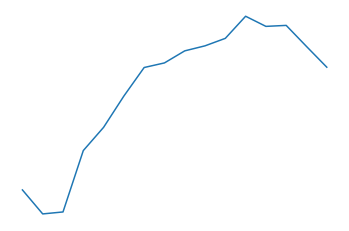

patient 50.0 of 231.0


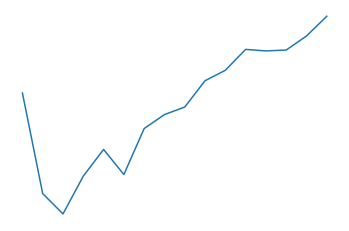

patient 50.0 of 231.0


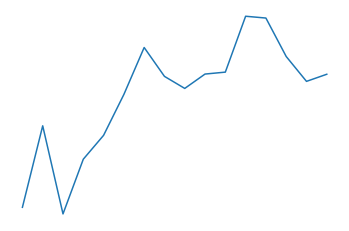

patient 50.0 of 231.0


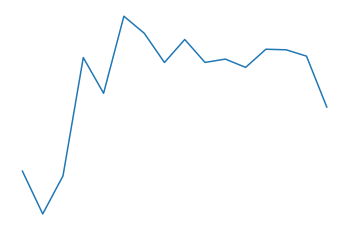


patient 51.0 of 231.0


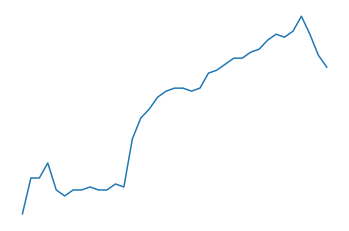

patient 51.0 of 231.0


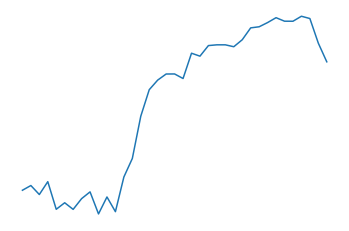

patient 51.0 of 231.0


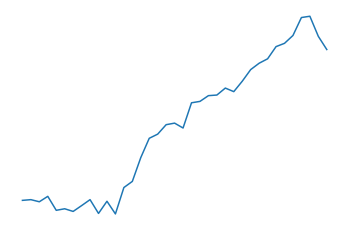

patient 51.0 of 231.0


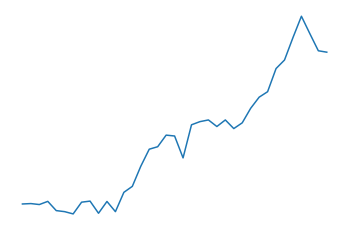

patient 51.0 of 231.0


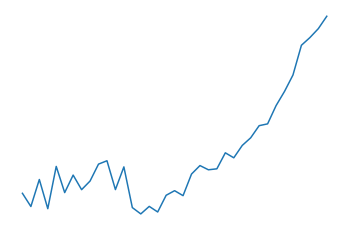

patient 51.0 of 231.0


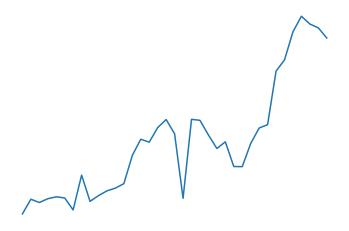

patient 51.0 of 231.0


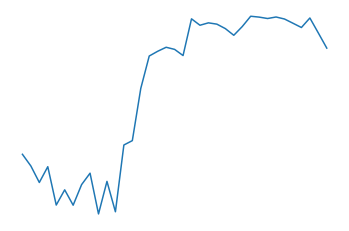


patient 52.0 of 231.0


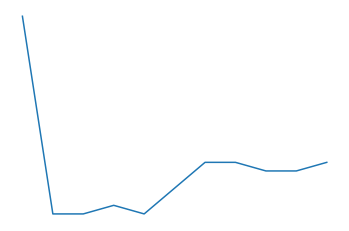

patient 52.0 of 231.0


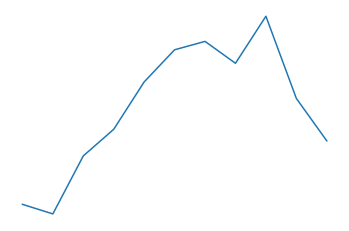

patient 52.0 of 231.0


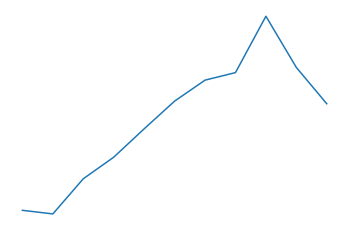

patient 52.0 of 231.0


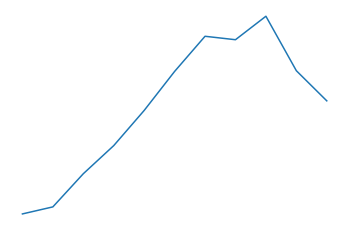

patient 52.0 of 231.0


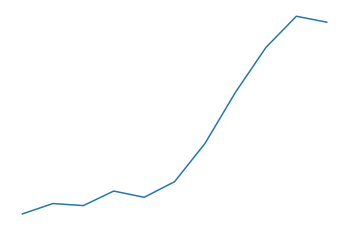

patient 52.0 of 231.0


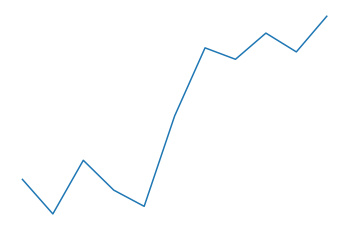

patient 52.0 of 231.0


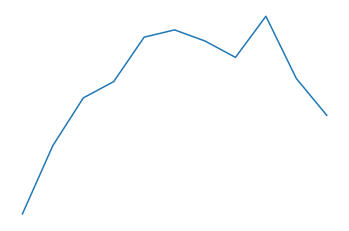


patient 53.0 of 231.0


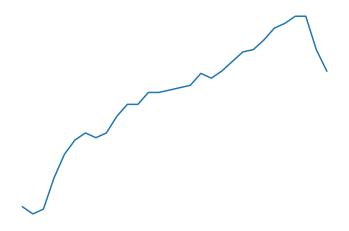

patient 53.0 of 231.0


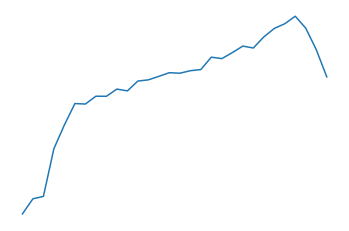

patient 53.0 of 231.0


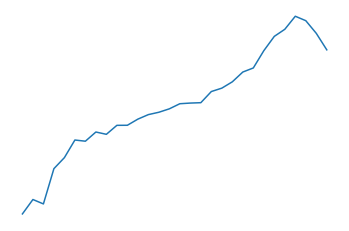

patient 53.0 of 231.0


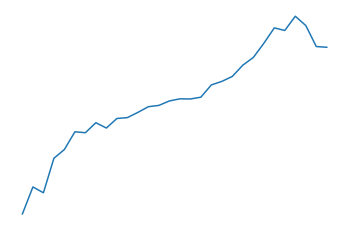

patient 53.0 of 231.0


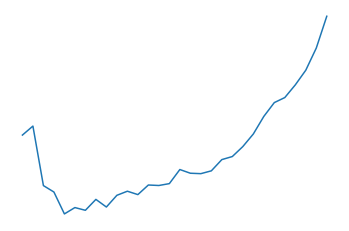

patient 53.0 of 231.0


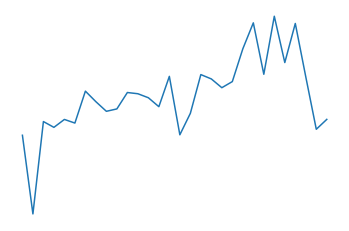

patient 53.0 of 231.0


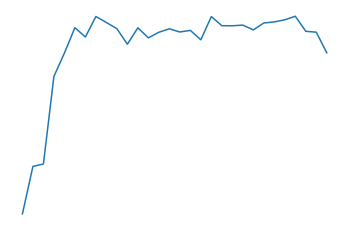


patient 54.0 of 231.0


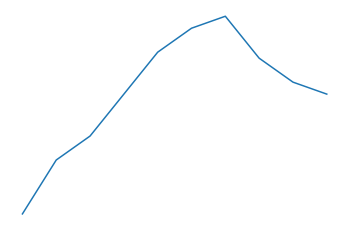

patient 54.0 of 231.0


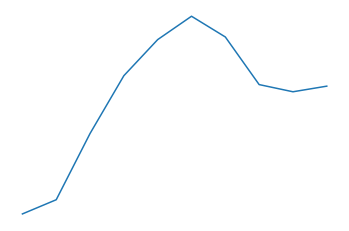

patient 54.0 of 231.0


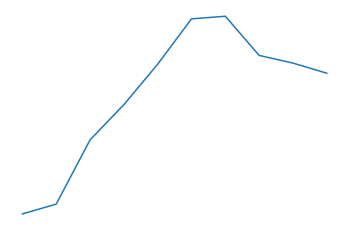

patient 54.0 of 231.0


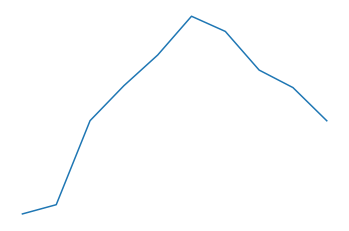

patient 54.0 of 231.0


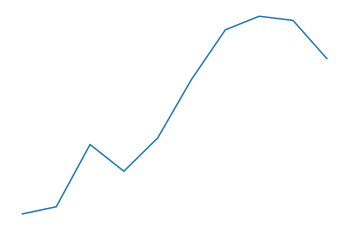

patient 54.0 of 231.0


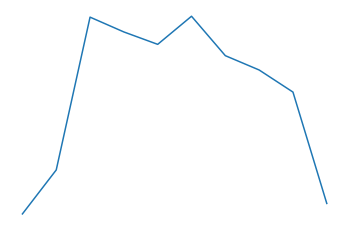

patient 54.0 of 231.0


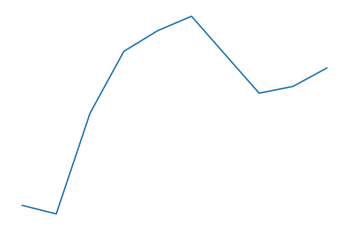


patient 55.0 of 231.0


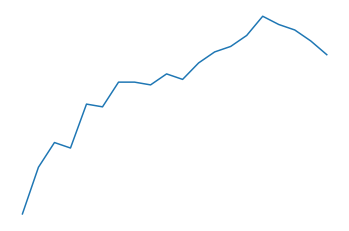

patient 55.0 of 231.0


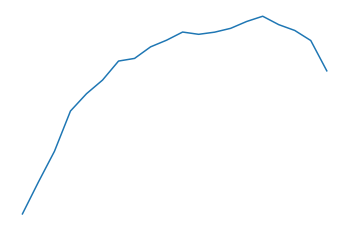

patient 55.0 of 231.0


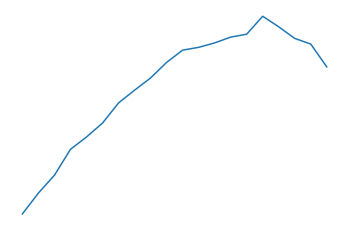

patient 55.0 of 231.0


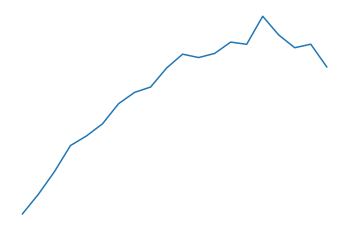

patient 55.0 of 231.0


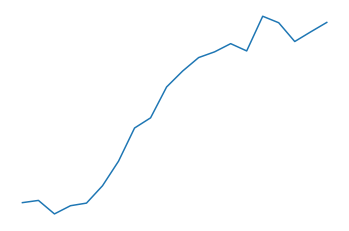

patient 55.0 of 231.0


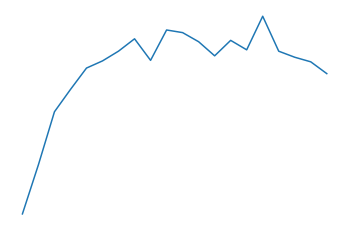

patient 55.0 of 231.0


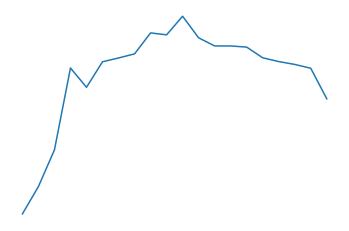


patient 56.0 of 231.0


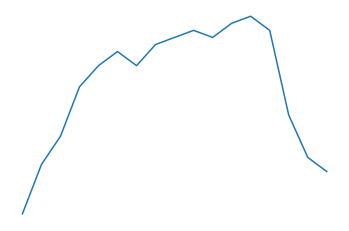

patient 56.0 of 231.0


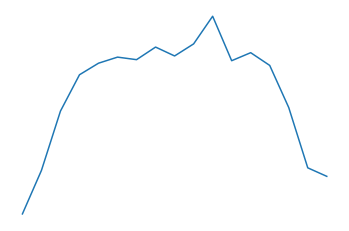

patient 56.0 of 231.0


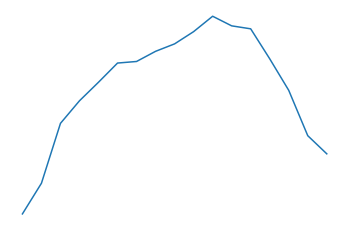

patient 56.0 of 231.0


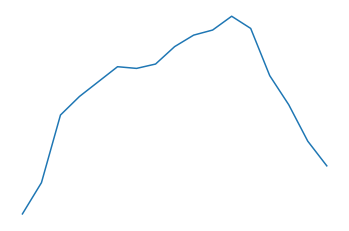

patient 56.0 of 231.0


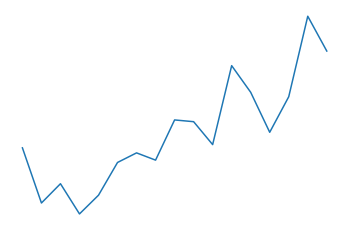

patient 56.0 of 231.0


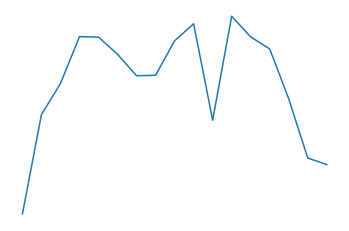

patient 56.0 of 231.0


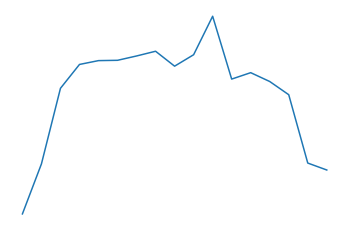


patient 57.0 of 231.0


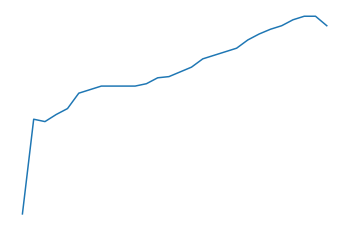

patient 57.0 of 231.0


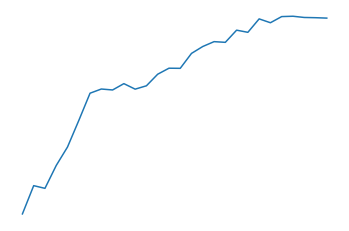

patient 57.0 of 231.0


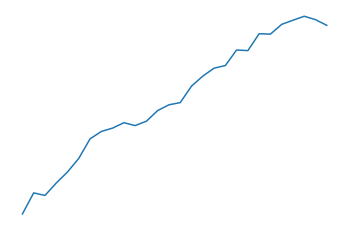

patient 57.0 of 231.0


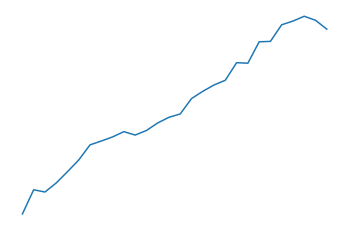

patient 57.0 of 231.0


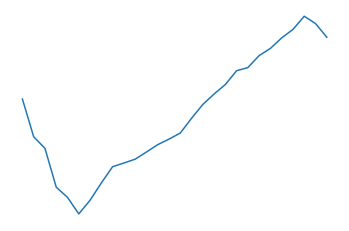

patient 57.0 of 231.0


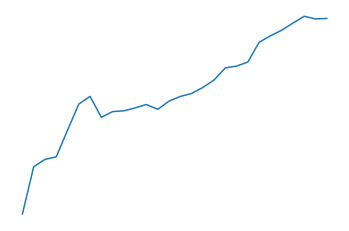

patient 57.0 of 231.0


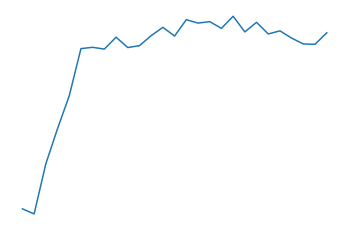


patient 58.0 of 231.0


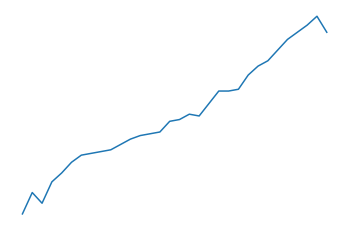

patient 58.0 of 231.0


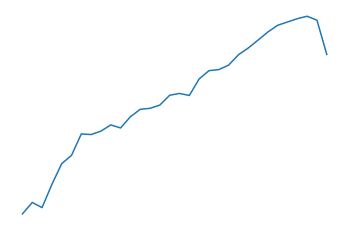

patient 58.0 of 231.0


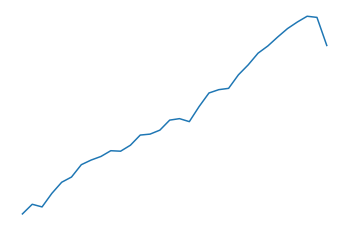

patient 58.0 of 231.0


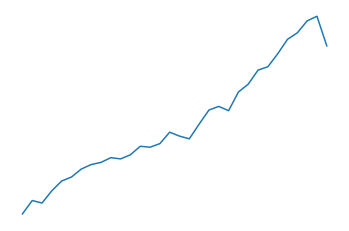

patient 58.0 of 231.0


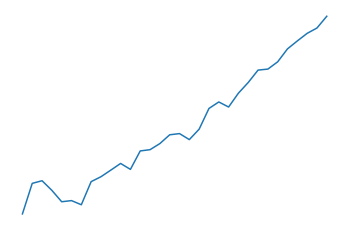

patient 58.0 of 231.0


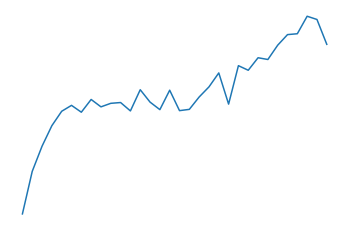

patient 58.0 of 231.0


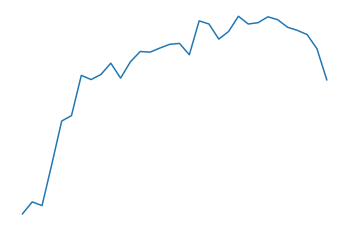


patient 59.0 of 231.0


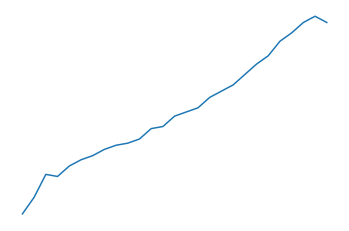

patient 59.0 of 231.0


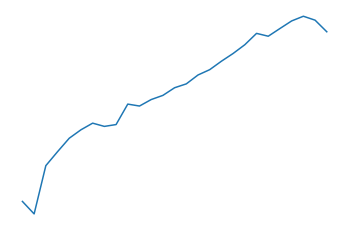

patient 59.0 of 231.0


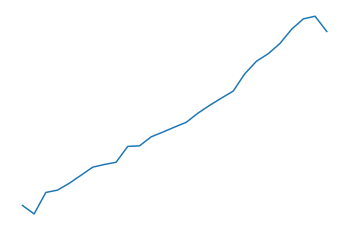

patient 59.0 of 231.0


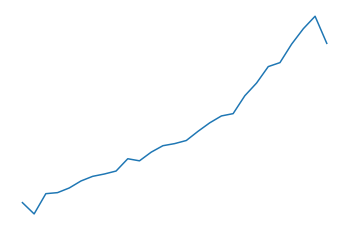

patient 59.0 of 231.0


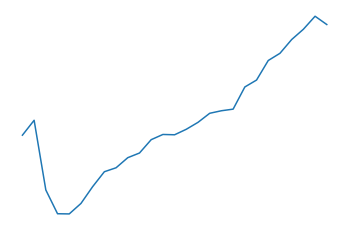

patient 59.0 of 231.0


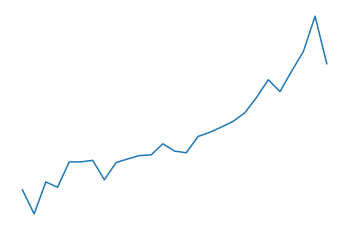

patient 59.0 of 231.0


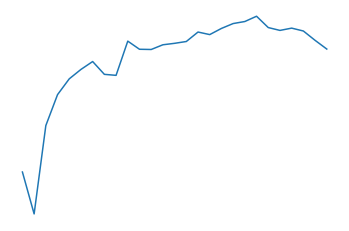


patient 60.0 of 231.0


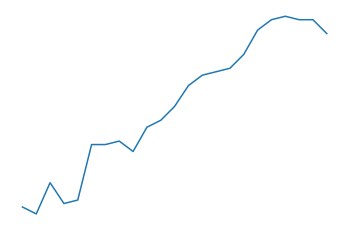

patient 60.0 of 231.0


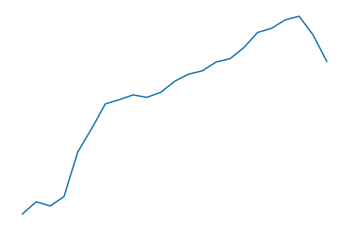

patient 60.0 of 231.0


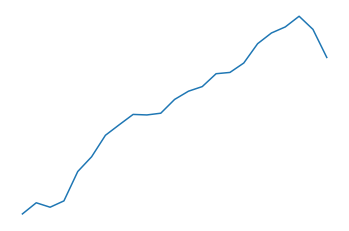

patient 60.0 of 231.0


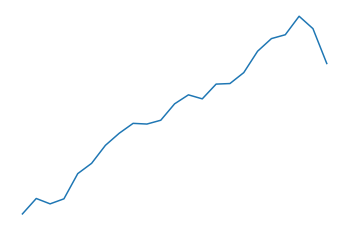

patient 60.0 of 231.0


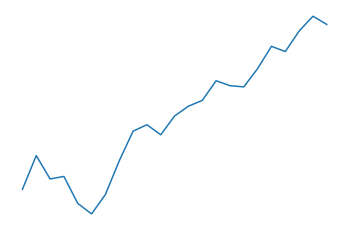

patient 60.0 of 231.0


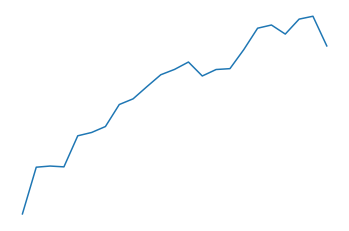

patient 60.0 of 231.0


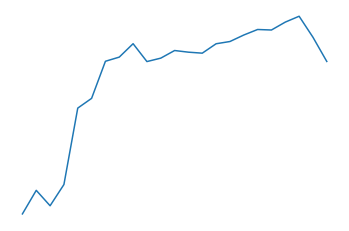


patient 61.0 of 231.0


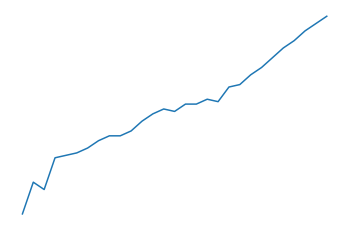

patient 61.0 of 231.0


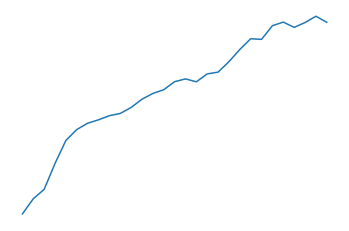

patient 61.0 of 231.0


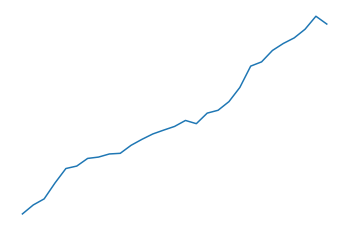

patient 61.0 of 231.0


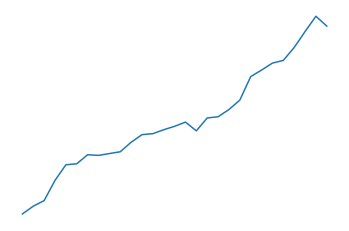

patient 61.0 of 231.0


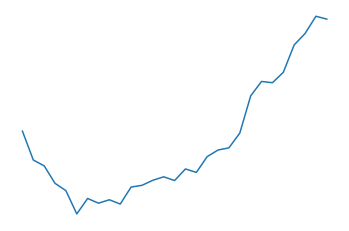

patient 61.0 of 231.0


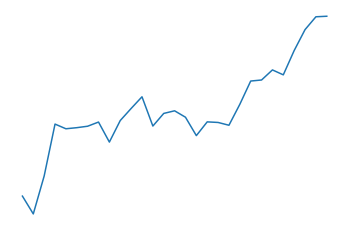

patient 61.0 of 231.0


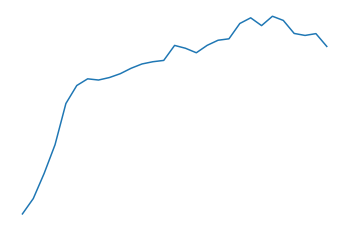


patient 62.0 of 231.0


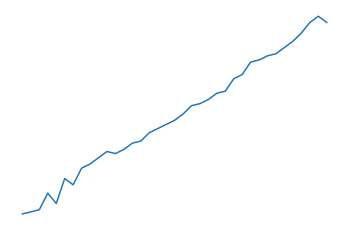

patient 62.0 of 231.0


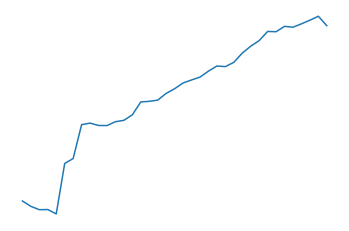

patient 62.0 of 231.0


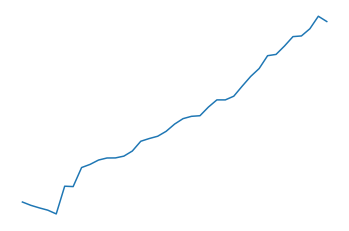

patient 62.0 of 231.0


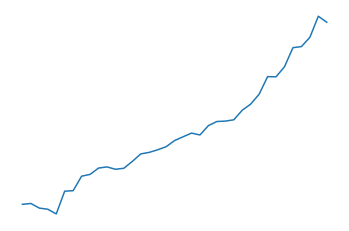

patient 62.0 of 231.0


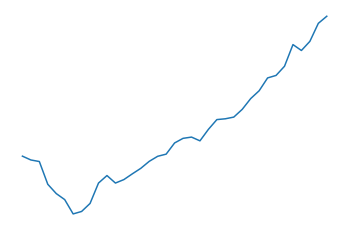

patient 62.0 of 231.0


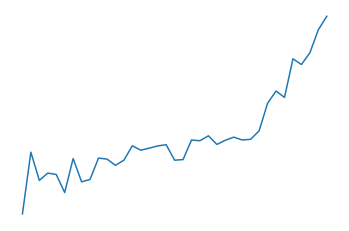

patient 62.0 of 231.0


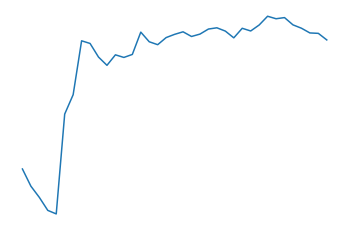


patient 63.0 of 231.0


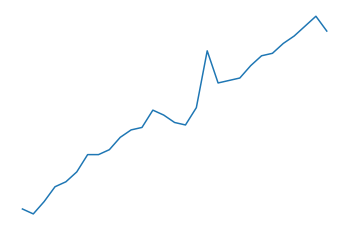

patient 63.0 of 231.0


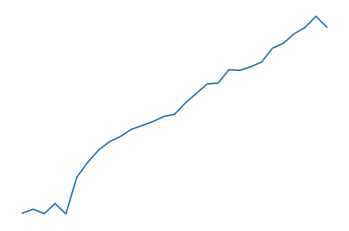

patient 63.0 of 231.0


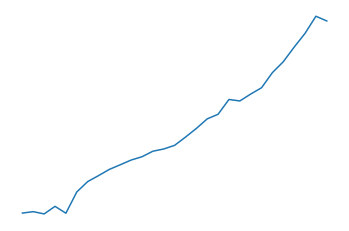

patient 63.0 of 231.0


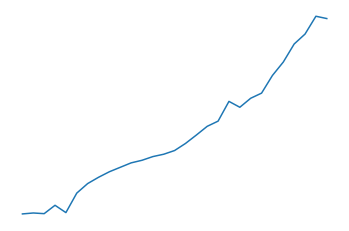

patient 63.0 of 231.0


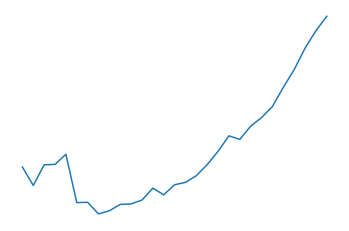

patient 63.0 of 231.0


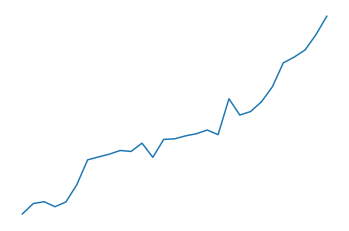

patient 63.0 of 231.0


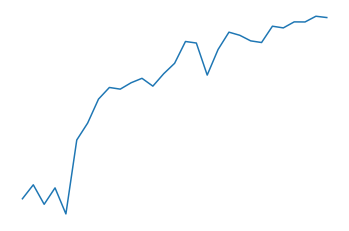


patient 64.0 of 231.0


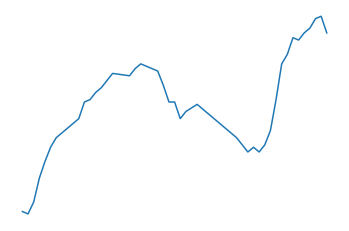

patient 64.0 of 231.0


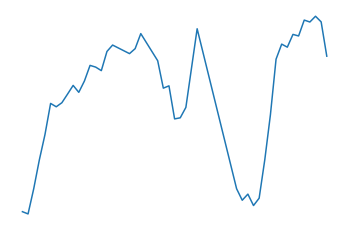

patient 64.0 of 231.0


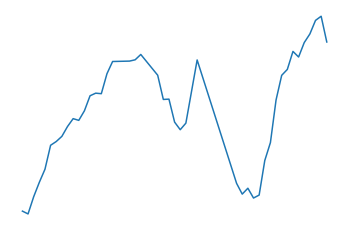

patient 64.0 of 231.0


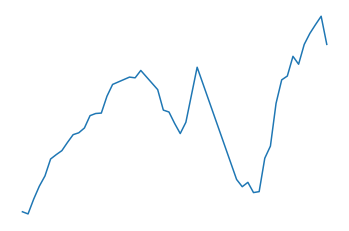

patient 64.0 of 231.0


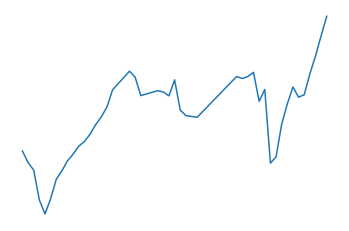

patient 64.0 of 231.0


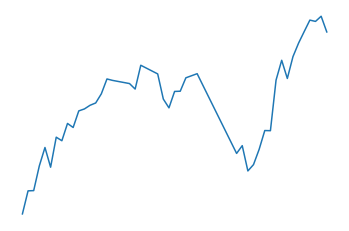

patient 64.0 of 231.0


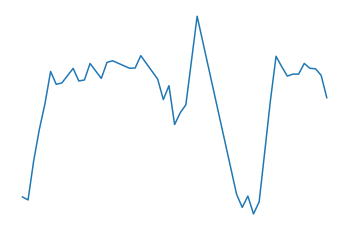


patient 65.1 of 231.0


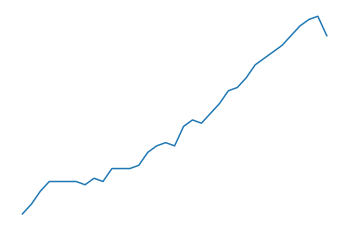

patient 65.1 of 231.0


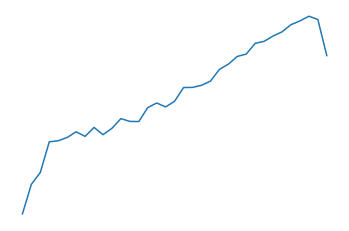

patient 65.1 of 231.0


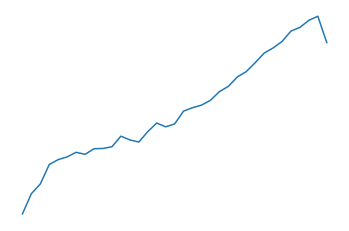

patient 65.1 of 231.0


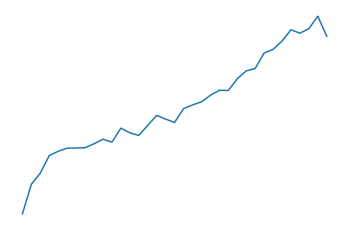

patient 65.1 of 231.0


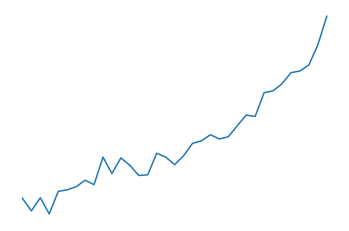

patient 65.1 of 231.0


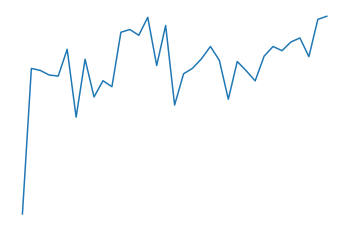

patient 65.1 of 231.0


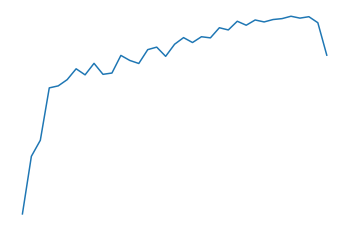


patient 65.2 of 231.0


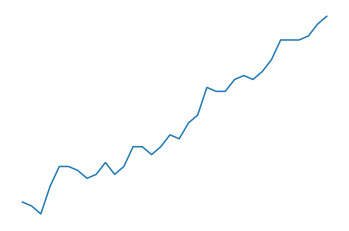

patient 65.2 of 231.0


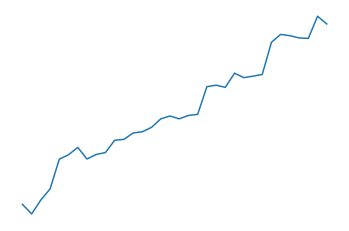

patient 65.2 of 231.0


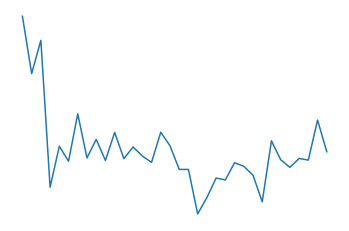

patient 65.2 of 231.0


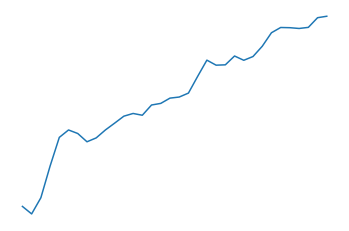

patient 65.2 of 231.0


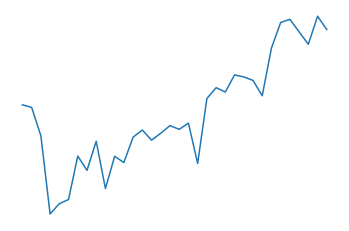

patient 65.2 of 231.0


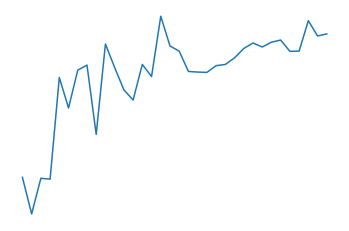

patient 65.2 of 231.0


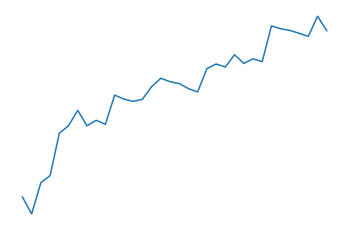


patient 66.0 of 231.0


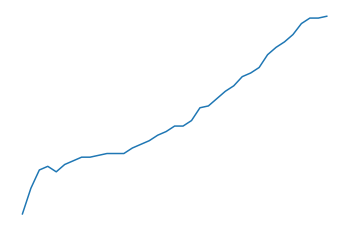

patient 66.0 of 231.0


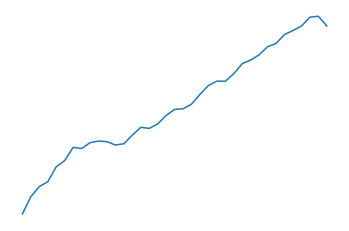

patient 66.0 of 231.0


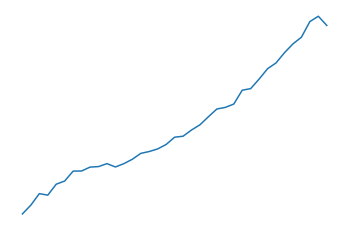

patient 66.0 of 231.0


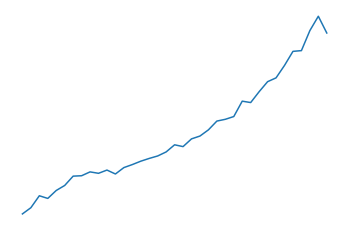

patient 66.0 of 231.0


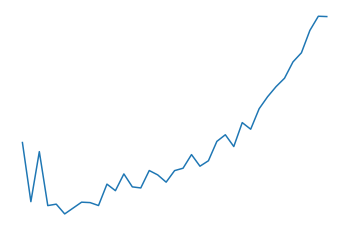

patient 66.0 of 231.0


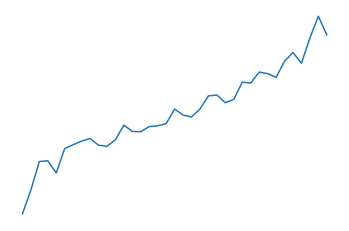

patient 66.0 of 231.0


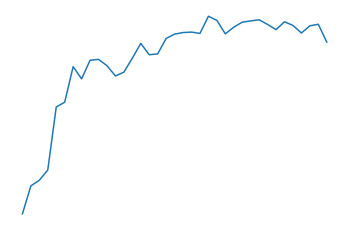


patient 67.0 of 231.0


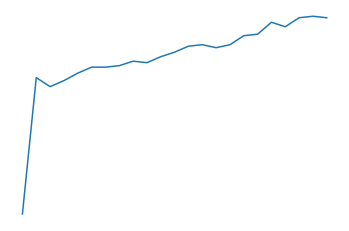

patient 67.0 of 231.0


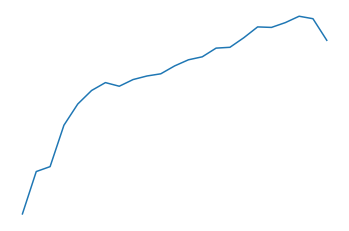

patient 67.0 of 231.0


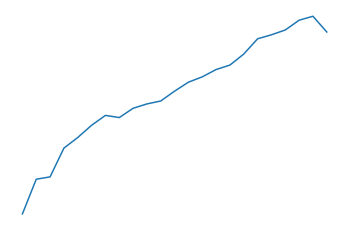

patient 67.0 of 231.0


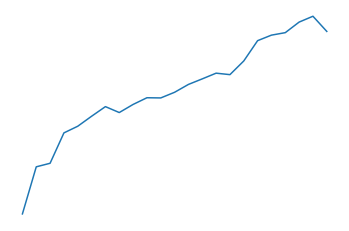

patient 67.0 of 231.0


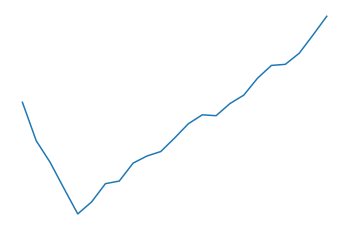

patient 67.0 of 231.0


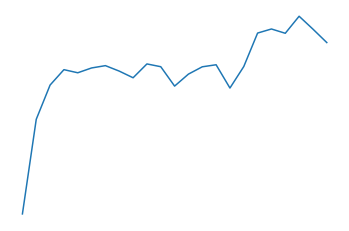

patient 67.0 of 231.0


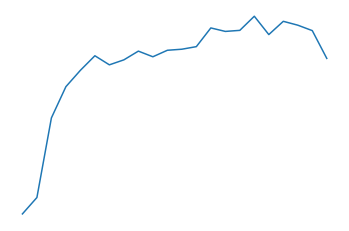


patient 68.0 of 231.0


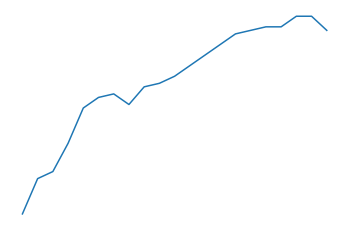

patient 68.0 of 231.0


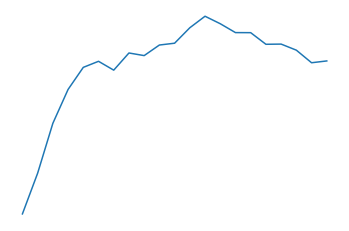

patient 68.0 of 231.0


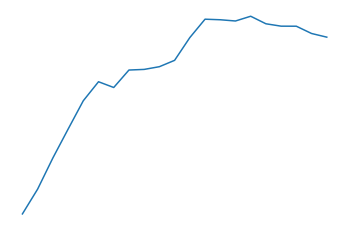

patient 68.0 of 231.0


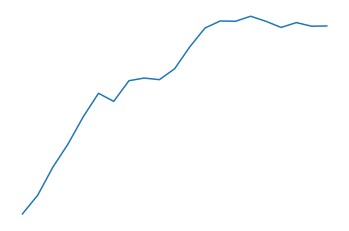

patient 68.0 of 231.0


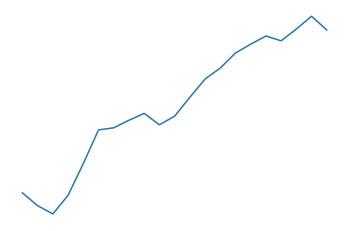

patient 68.0 of 231.0


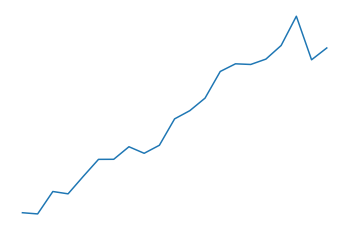

patient 68.0 of 231.0


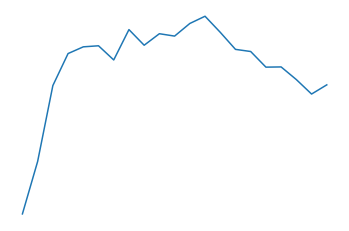


patient 69.0 of 231.0


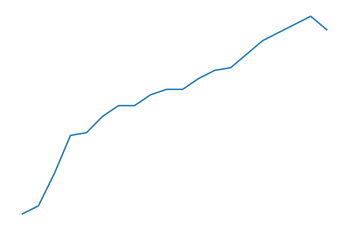

patient 69.0 of 231.0


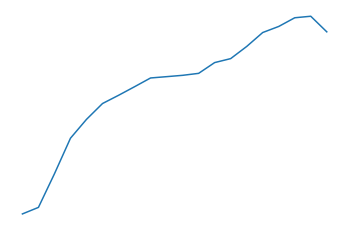

patient 69.0 of 231.0


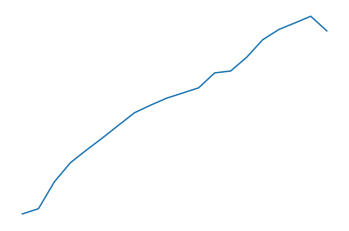

patient 69.0 of 231.0


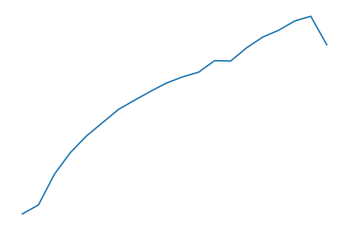

patient 69.0 of 231.0


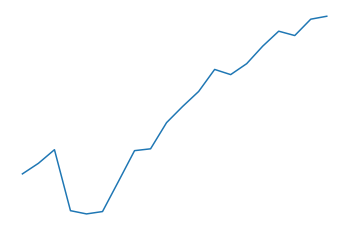

patient 69.0 of 231.0


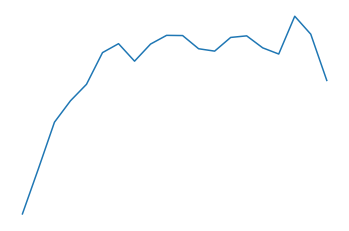

patient 69.0 of 231.0


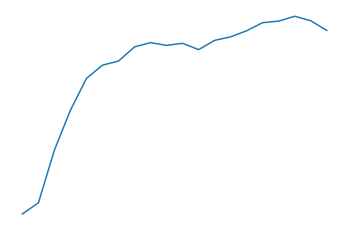


patient 70.0 of 231.0


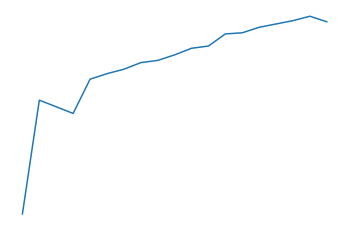

patient 70.0 of 231.0


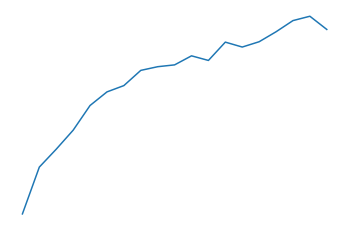

patient 70.0 of 231.0


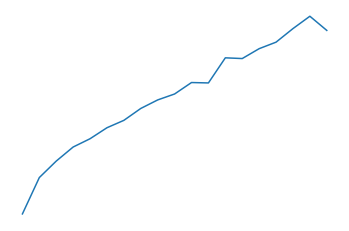

patient 70.0 of 231.0


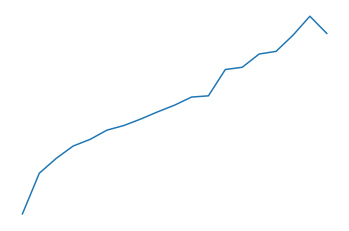

patient 70.0 of 231.0


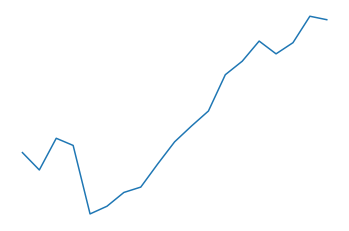

patient 70.0 of 231.0


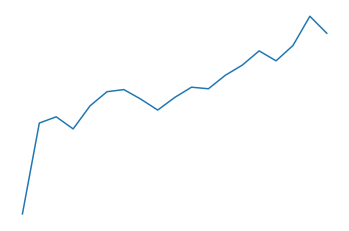

patient 70.0 of 231.0


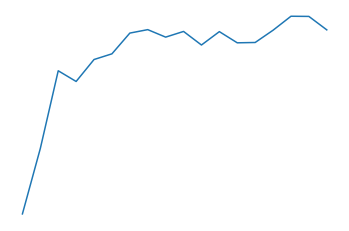


patient 71.0 of 231.0


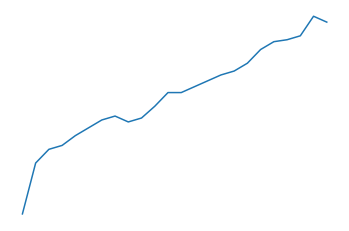

patient 71.0 of 231.0


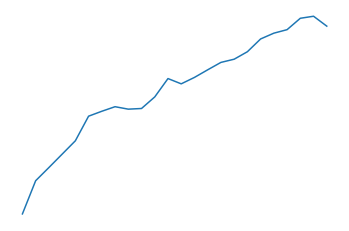

patient 71.0 of 231.0


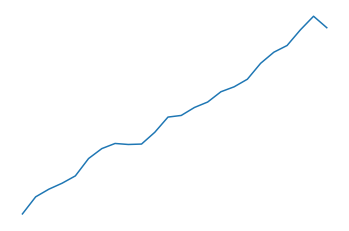

patient 71.0 of 231.0


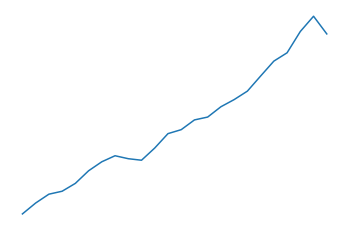

patient 71.0 of 231.0


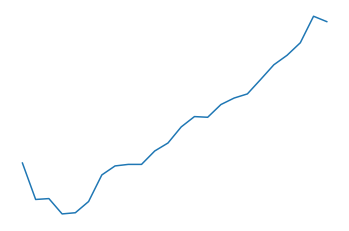

patient 71.0 of 231.0


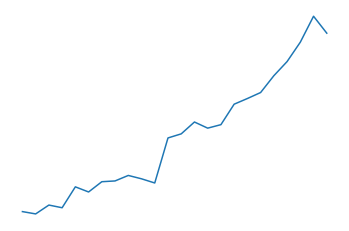

patient 71.0 of 231.0


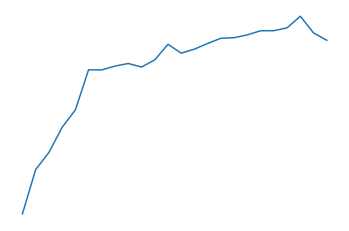


patient 72.0 of 231.0


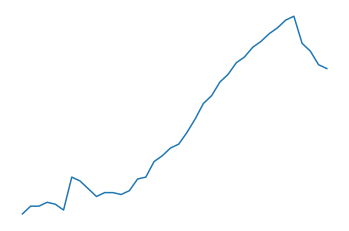

patient 72.0 of 231.0


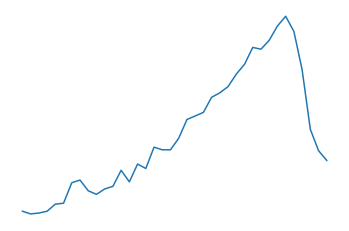

patient 72.0 of 231.0


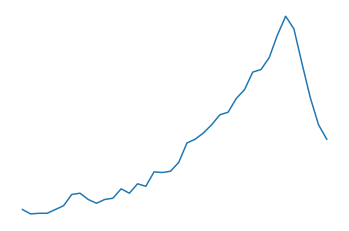

patient 72.0 of 231.0


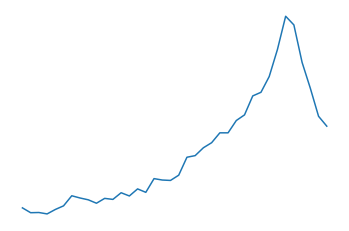

patient 72.0 of 231.0


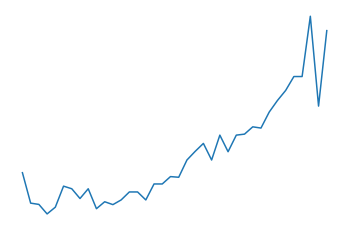

patient 72.0 of 231.0


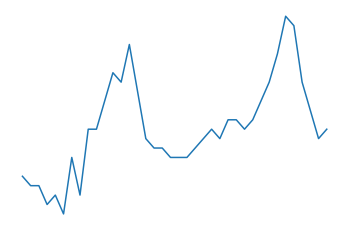

patient 72.0 of 231.0


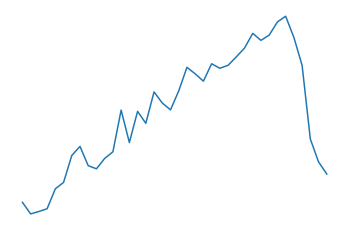


patient 73.0 of 231.0


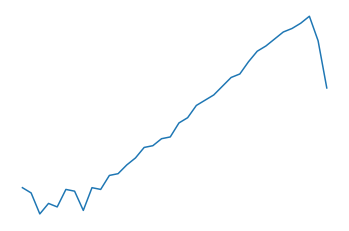

patient 73.0 of 231.0


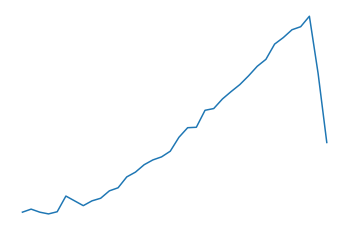

patient 73.0 of 231.0


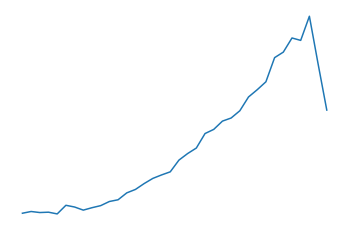

patient 73.0 of 231.0


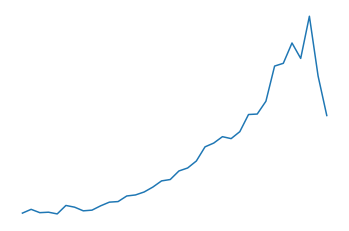

patient 73.0 of 231.0


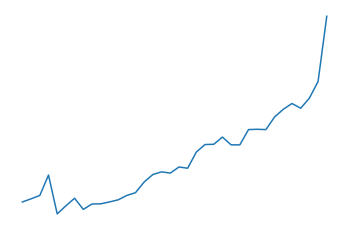

patient 73.0 of 231.0


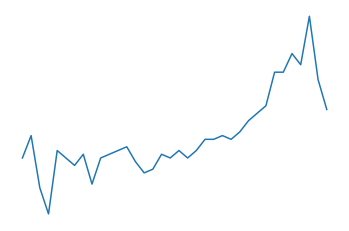

patient 73.0 of 231.0


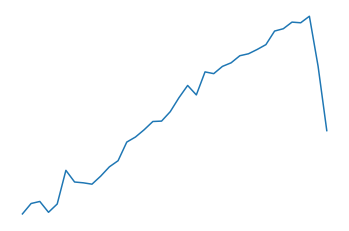


patient 74.0 of 231.0


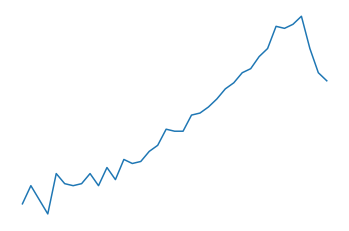

patient 74.0 of 231.0


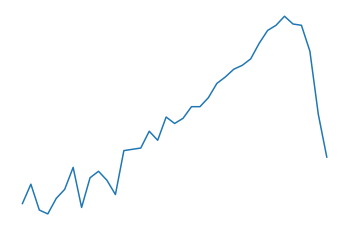

patient 74.0 of 231.0


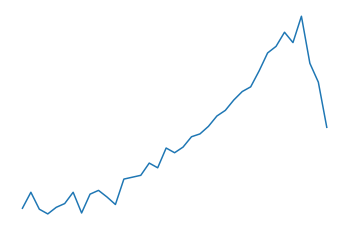

patient 74.0 of 231.0


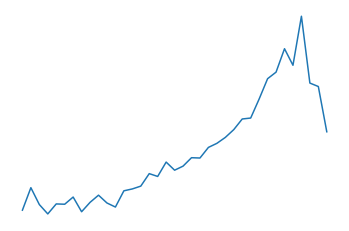

patient 74.0 of 231.0


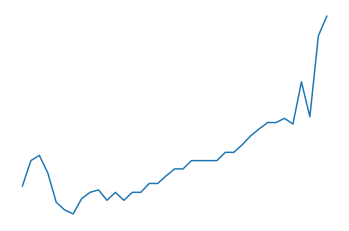

patient 74.0 of 231.0


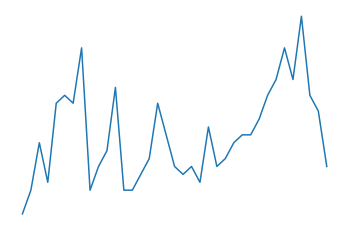

patient 74.0 of 231.0


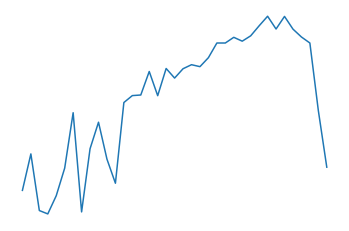


patient 75.0 of 231.0


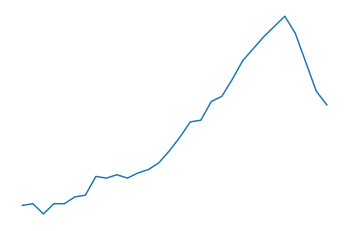

patient 75.0 of 231.0


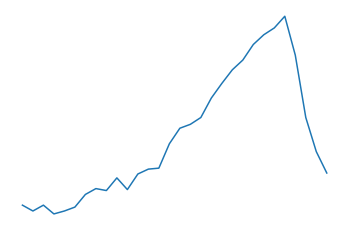

patient 75.0 of 231.0


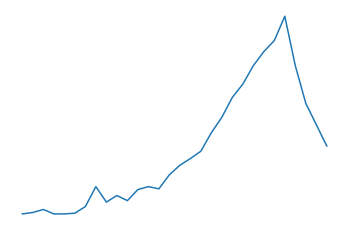

patient 75.0 of 231.0


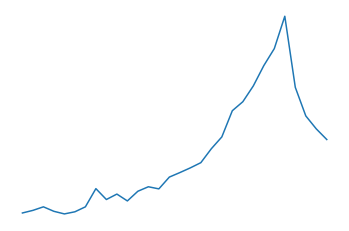

patient 75.0 of 231.0


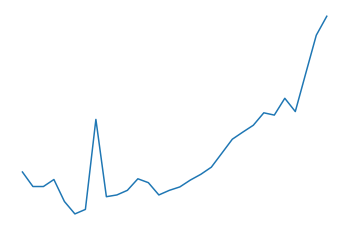

patient 75.0 of 231.0


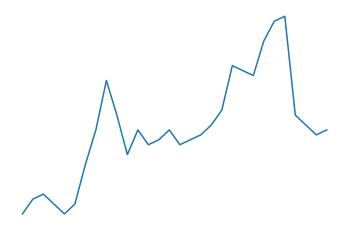

patient 75.0 of 231.0


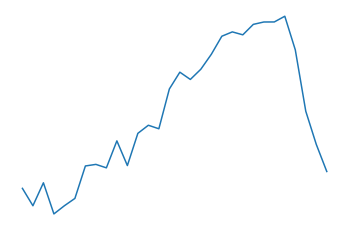


patient 76.0 of 231.0


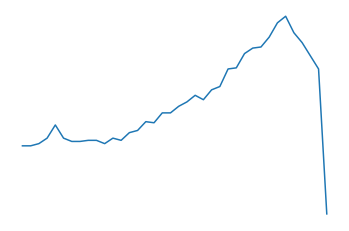

patient 76.0 of 231.0


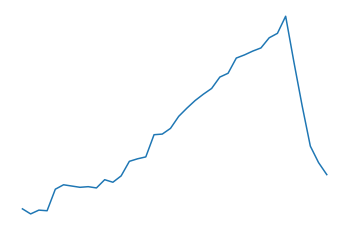

patient 76.0 of 231.0


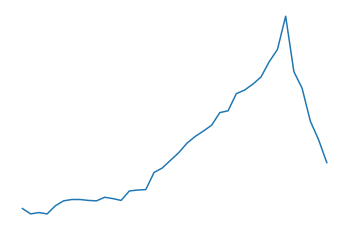

patient 76.0 of 231.0


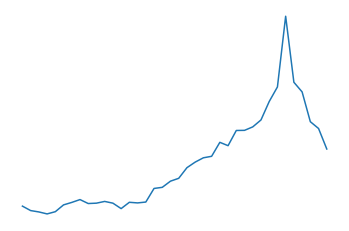

patient 76.0 of 231.0


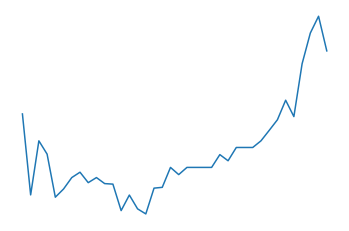

patient 76.0 of 231.0


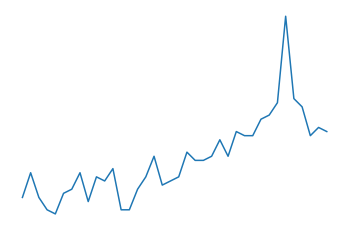

patient 76.0 of 231.0


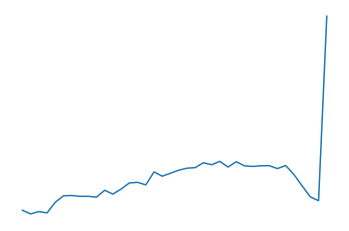


patient 77.1 of 231.0


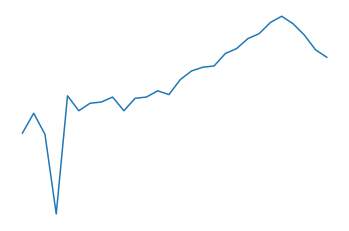

patient 77.1 of 231.0


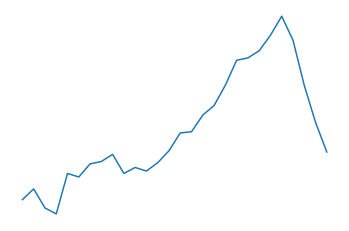

patient 77.1 of 231.0


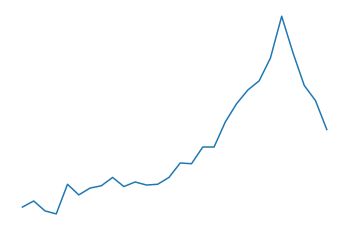

patient 77.1 of 231.0


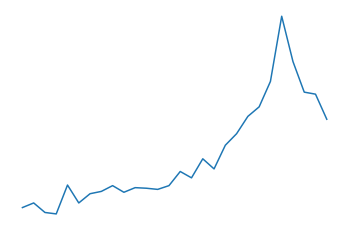

patient 77.1 of 231.0


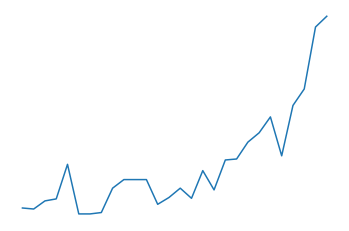

patient 77.1 of 231.0


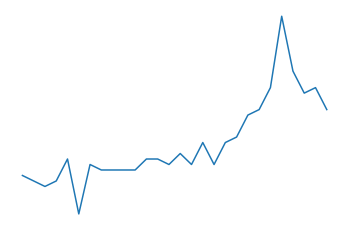

patient 77.1 of 231.0


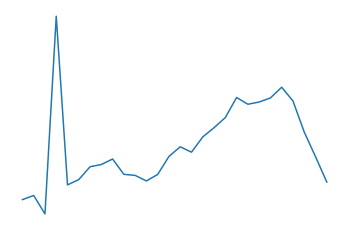


patient 77.2 of 231.0


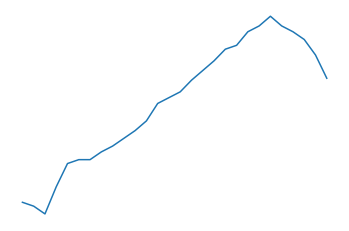

patient 77.2 of 231.0


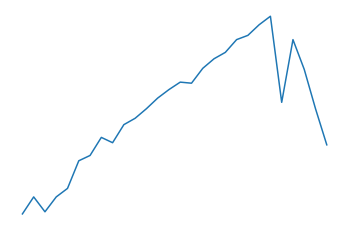

patient 77.2 of 231.0


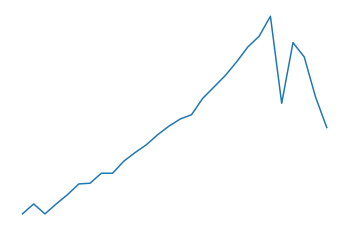

patient 77.2 of 231.0


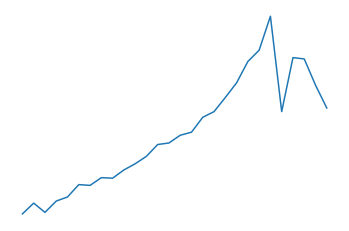

patient 77.2 of 231.0


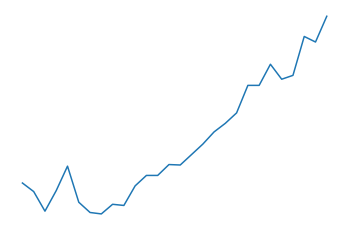

patient 77.2 of 231.0


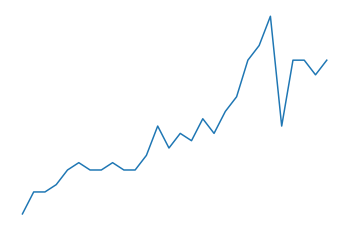

patient 77.2 of 231.0


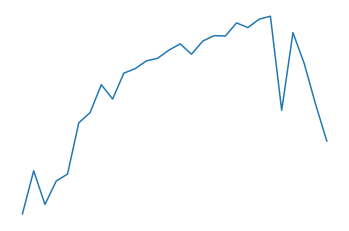


patient 78.1 of 231.0


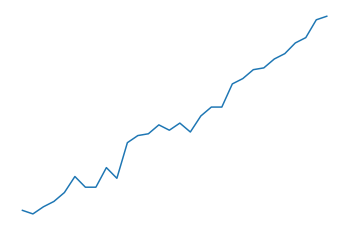

patient 78.1 of 231.0


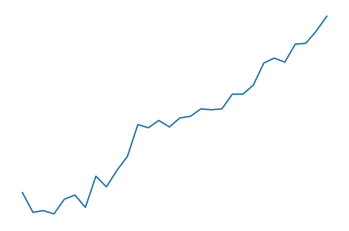

patient 78.1 of 231.0


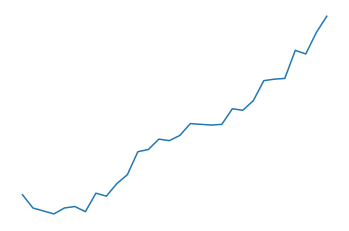

patient 78.1 of 231.0


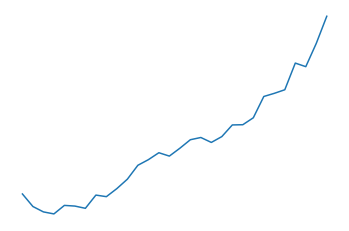

patient 78.1 of 231.0


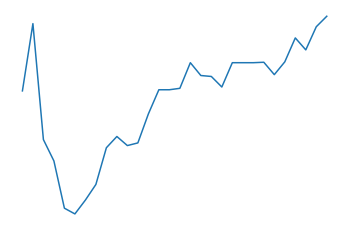

patient 78.1 of 231.0


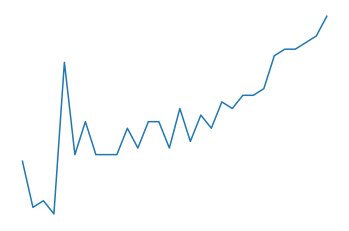

patient 78.1 of 231.0


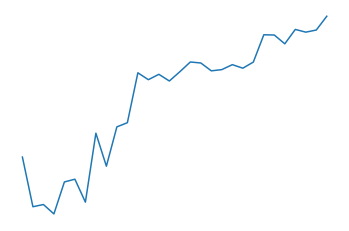


patient 78.2 of 231.0


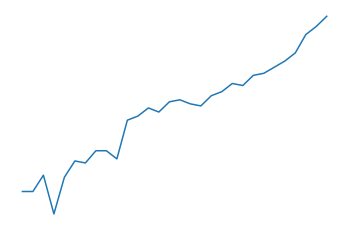

patient 78.2 of 231.0


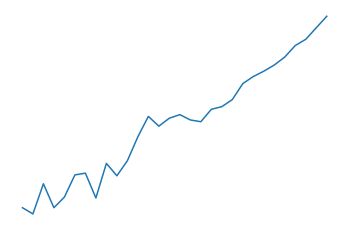

patient 78.2 of 231.0


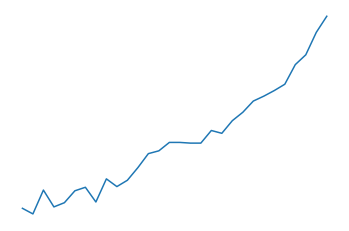

patient 78.2 of 231.0


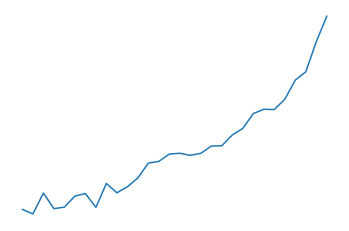

patient 78.2 of 231.0


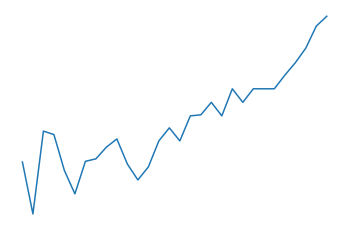

patient 78.2 of 231.0


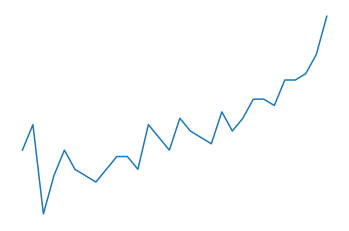

patient 78.2 of 231.0


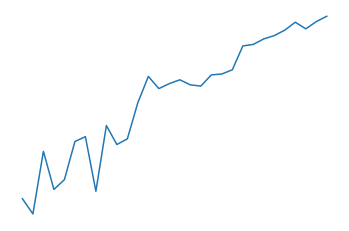


patient 79.0 of 231.0


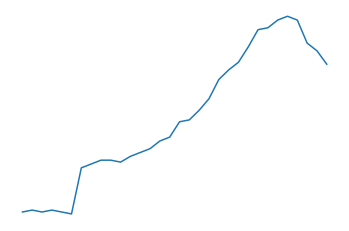

patient 79.0 of 231.0


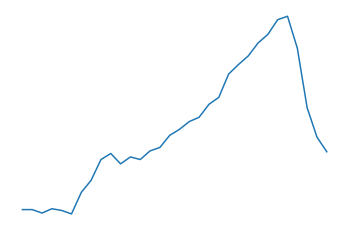

patient 79.0 of 231.0


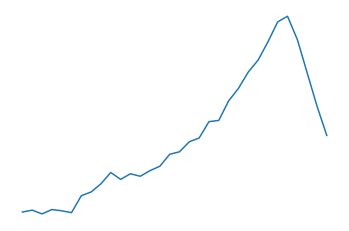

patient 79.0 of 231.0


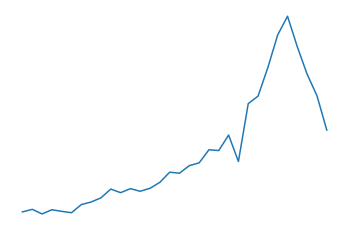

patient 79.0 of 231.0


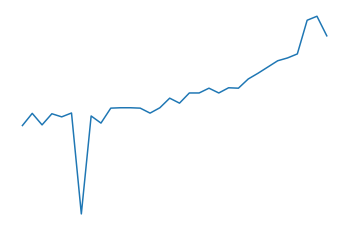

patient 79.0 of 231.0


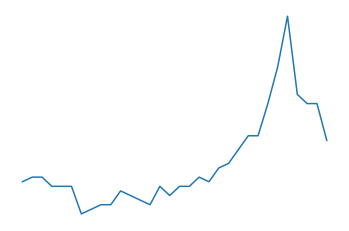

patient 79.0 of 231.0


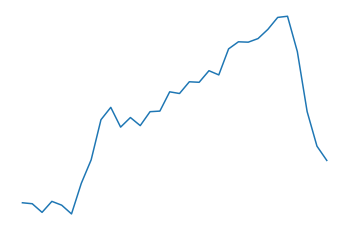


patient 80.1 of 231.0


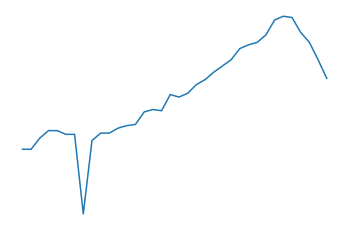

patient 80.1 of 231.0


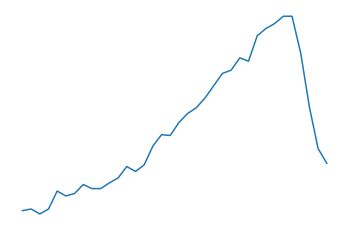

patient 80.1 of 231.0


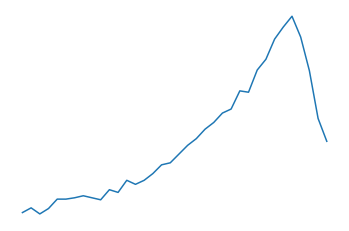

patient 80.1 of 231.0


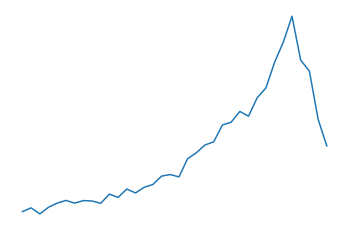

patient 80.1 of 231.0


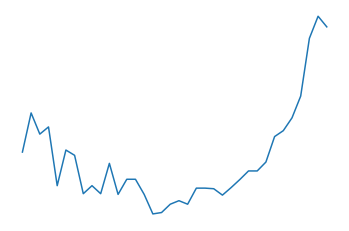

patient 80.1 of 231.0


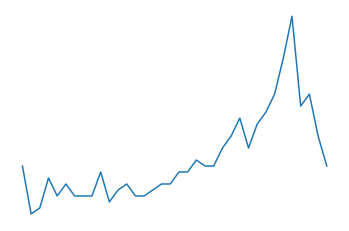

patient 80.1 of 231.0


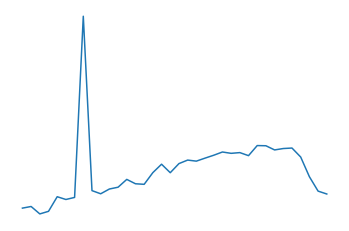


patient 81.0 of 231.0


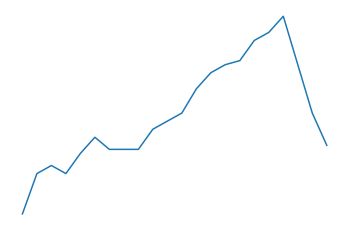

patient 81.0 of 231.0


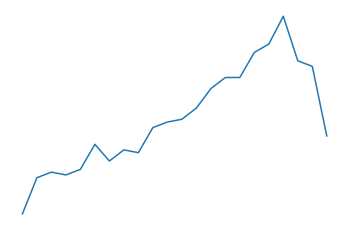

patient 81.0 of 231.0


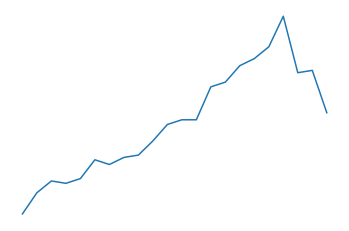

patient 81.0 of 231.0


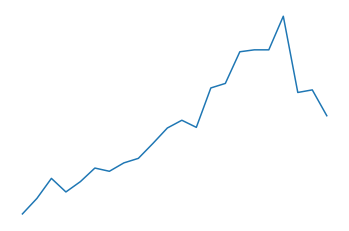

patient 81.0 of 231.0


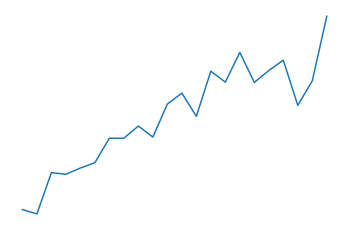

patient 81.0 of 231.0


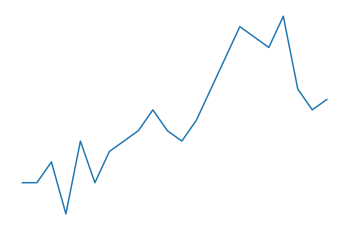

patient 81.0 of 231.0


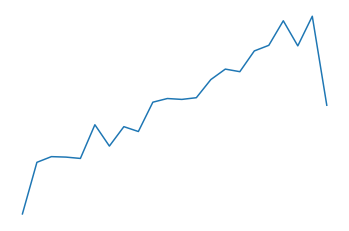


patient 82.0 of 231.0


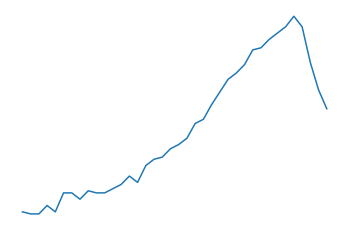

patient 82.0 of 231.0


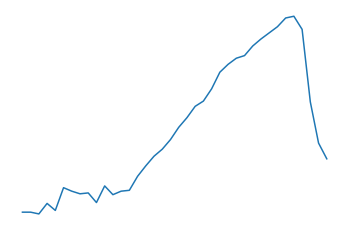

patient 82.0 of 231.0


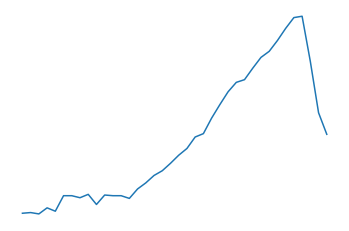

patient 82.0 of 231.0


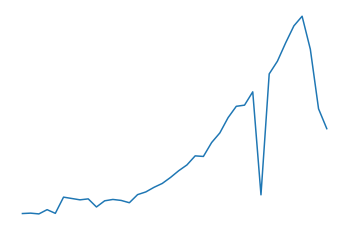

patient 82.0 of 231.0


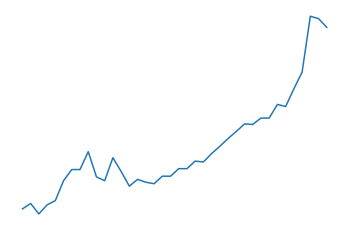

patient 82.0 of 231.0


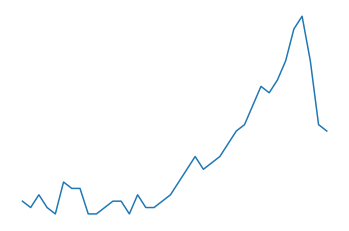

patient 82.0 of 231.0


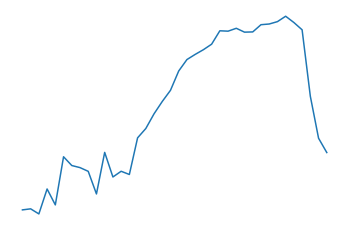


patient 83.0 of 231.0


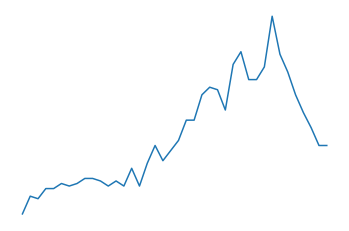

patient 83.0 of 231.0


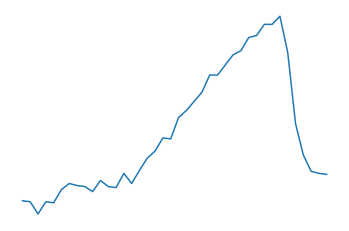

patient 83.0 of 231.0


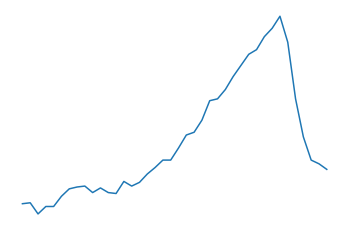

patient 83.0 of 231.0


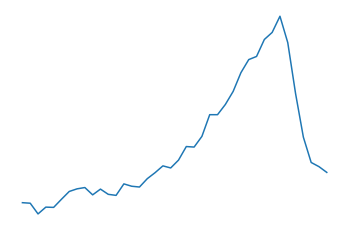

patient 83.0 of 231.0


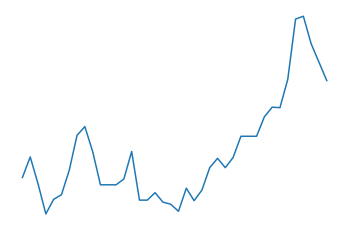

patient 83.0 of 231.0


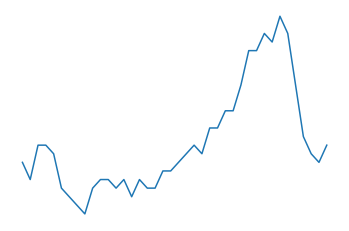

patient 83.0 of 231.0


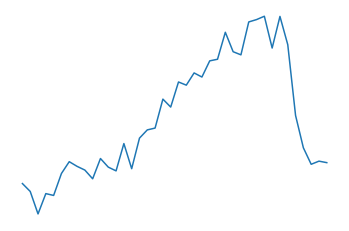


patient 84.0 of 231.0


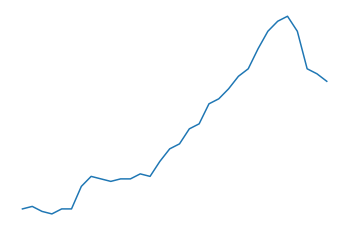

patient 84.0 of 231.0


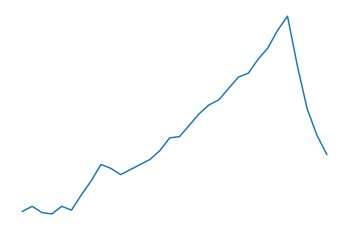

patient 84.0 of 231.0


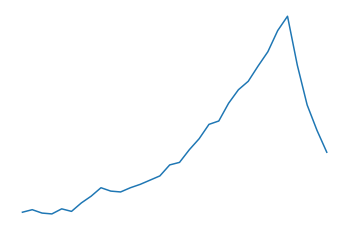

patient 84.0 of 231.0


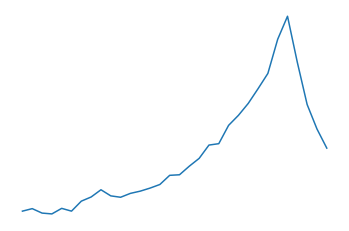

patient 84.0 of 231.0


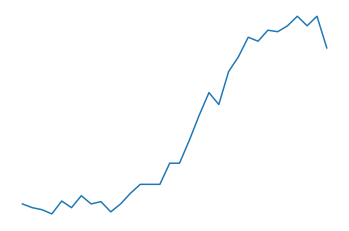

patient 84.0 of 231.0


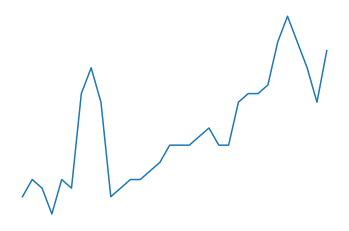

patient 84.0 of 231.0


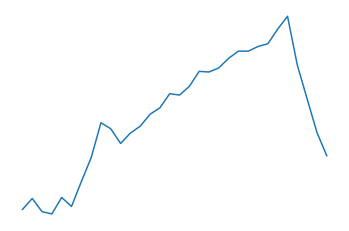


patient 85.0 of 231.0


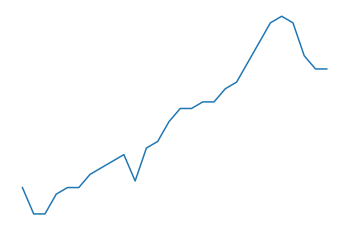

patient 85.0 of 231.0


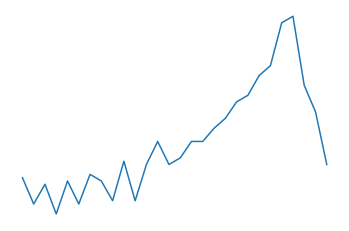

patient 85.0 of 231.0


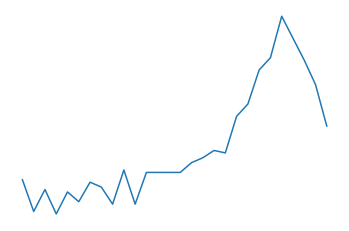

patient 85.0 of 231.0


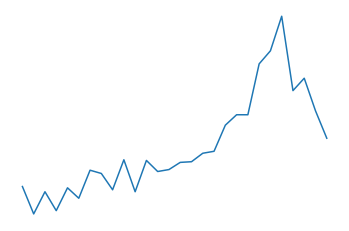

patient 85.0 of 231.0


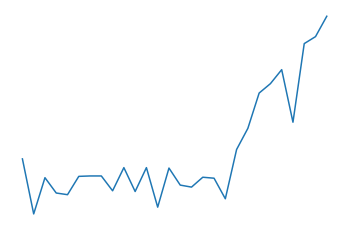

patient 85.0 of 231.0


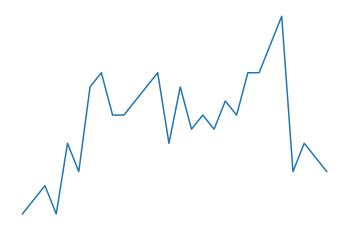

patient 85.0 of 231.0


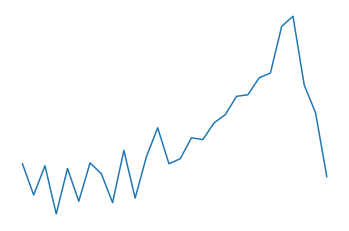


patient 86.0 of 231.0


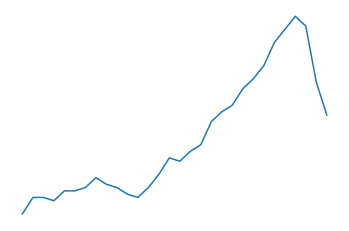

patient 86.0 of 231.0


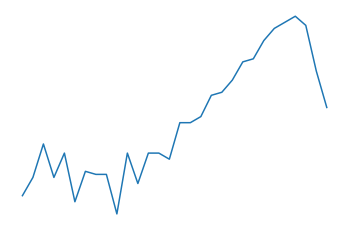

patient 86.0 of 231.0


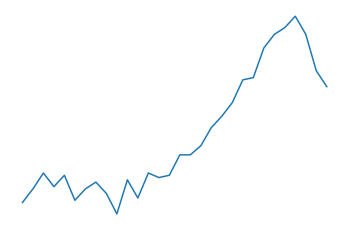

patient 86.0 of 231.0


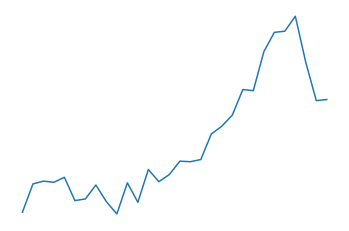

patient 86.0 of 231.0


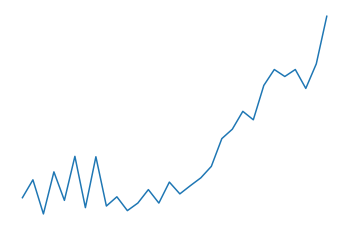

patient 86.0 of 231.0


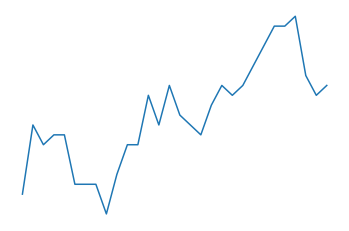

patient 86.0 of 231.0


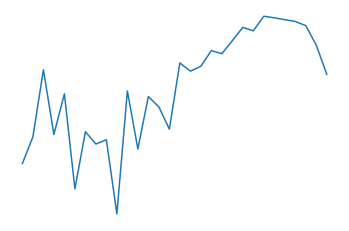


patient 87.0 of 231.0


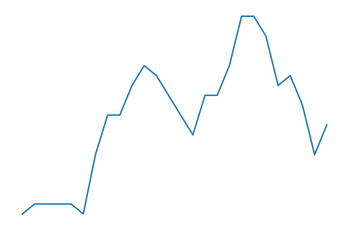

patient 87.0 of 231.0


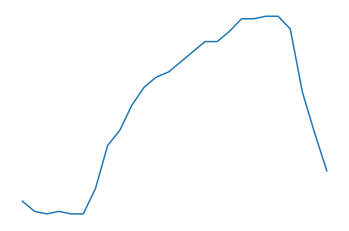

patient 87.0 of 231.0


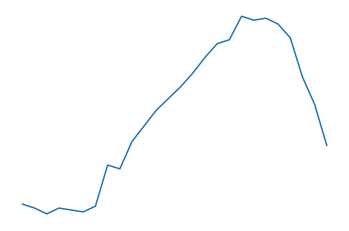

patient 87.0 of 231.0


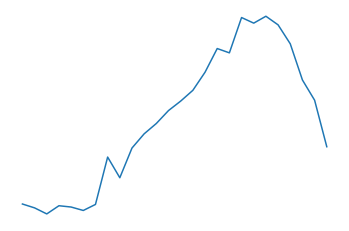

patient 87.0 of 231.0


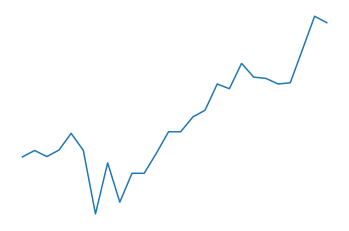

patient 87.0 of 231.0


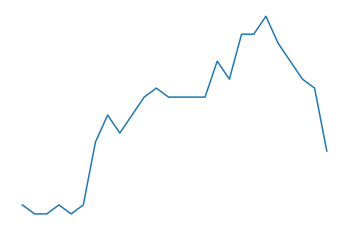

patient 87.0 of 231.0


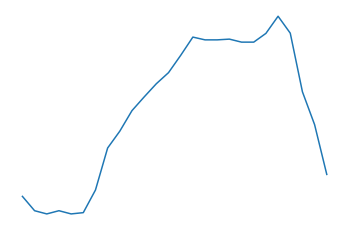


patient 88.0 of 231.0


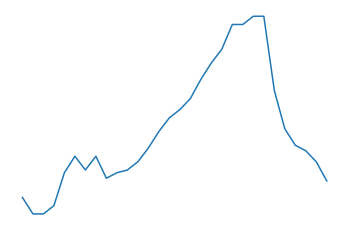

patient 88.0 of 231.0


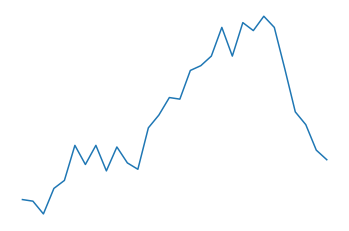

patient 88.0 of 231.0


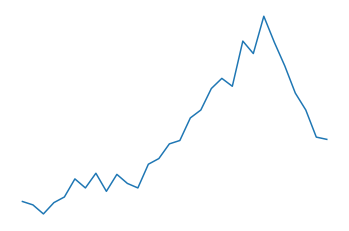

patient 88.0 of 231.0


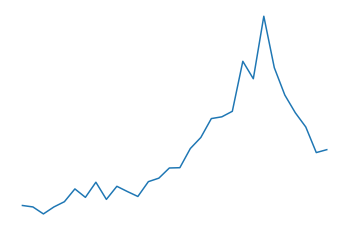

patient 88.0 of 231.0


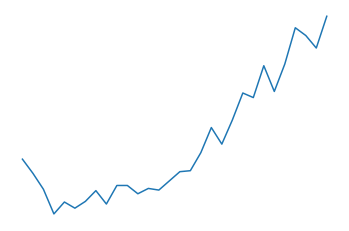

patient 88.0 of 231.0


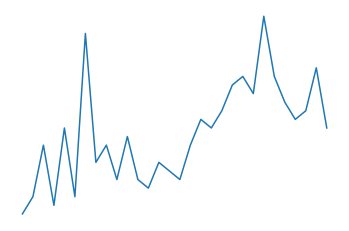

patient 88.0 of 231.0


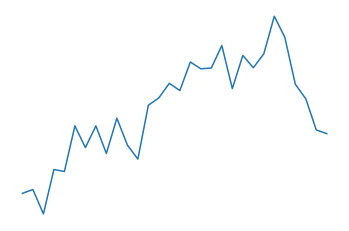


patient 89.0 of 231.0


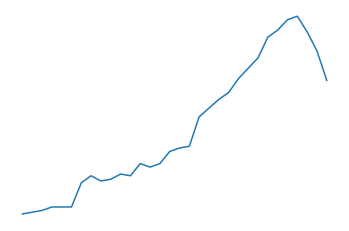

patient 89.0 of 231.0


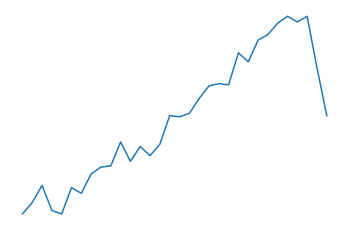

patient 89.0 of 231.0


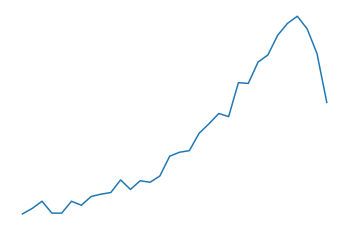

patient 89.0 of 231.0


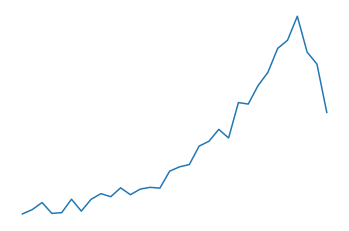

patient 89.0 of 231.0


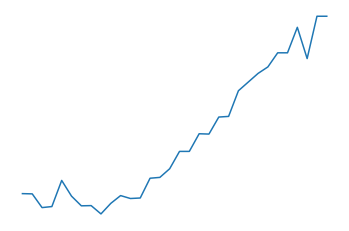

patient 89.0 of 231.0


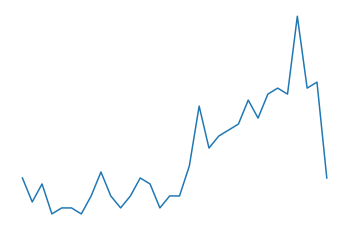

patient 89.0 of 231.0


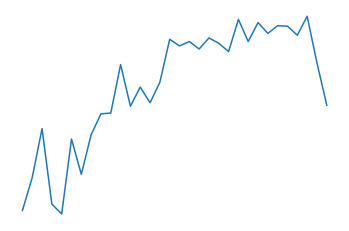


patient 90.0 of 231.0


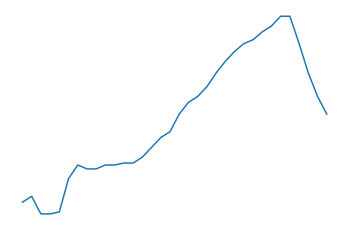

patient 90.0 of 231.0


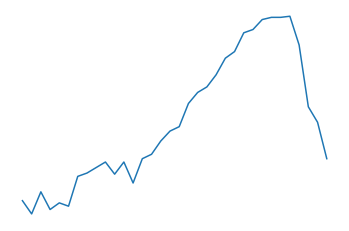

patient 90.0 of 231.0


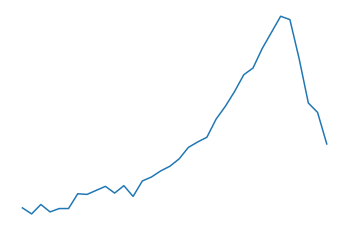

patient 90.0 of 231.0


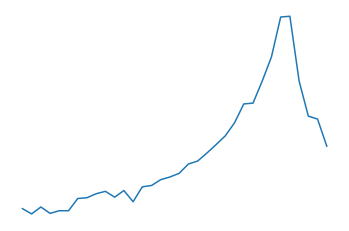

patient 90.0 of 231.0


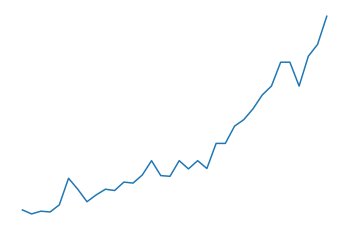

patient 90.0 of 231.0


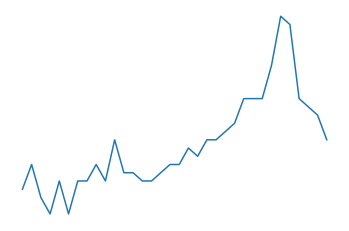

patient 90.0 of 231.0


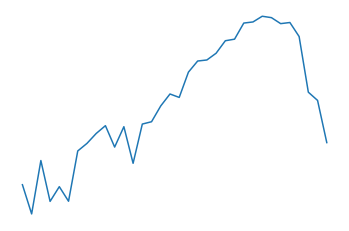


patient 91.0 of 231.0


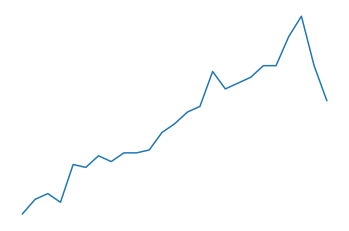

patient 91.0 of 231.0


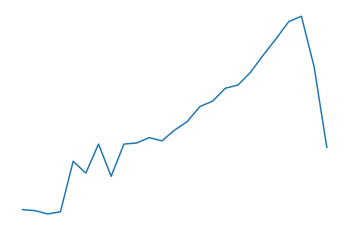

patient 91.0 of 231.0


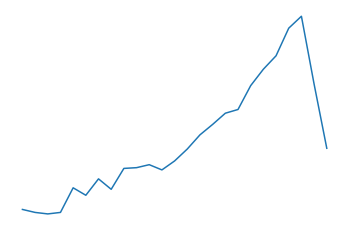

patient 91.0 of 231.0


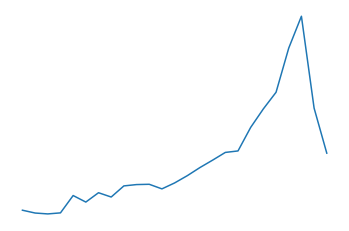

patient 91.0 of 231.0


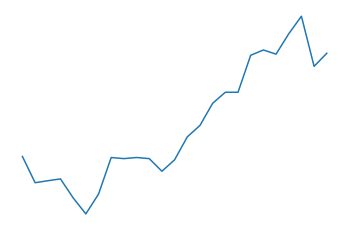

patient 91.0 of 231.0


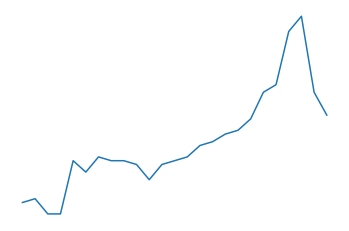

patient 91.0 of 231.0


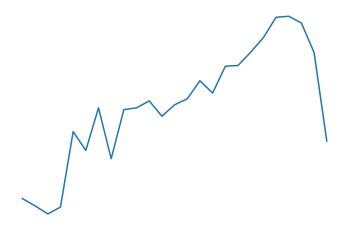


patient 92.0 of 231.0


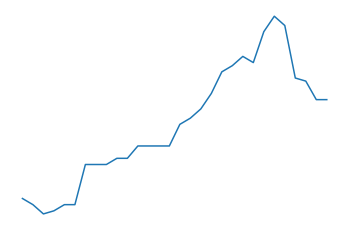

patient 92.0 of 231.0


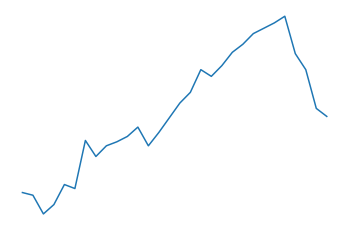

patient 92.0 of 231.0


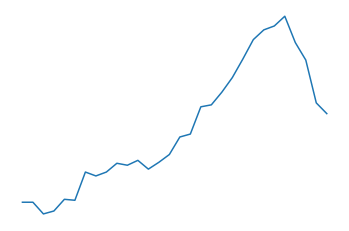

patient 92.0 of 231.0


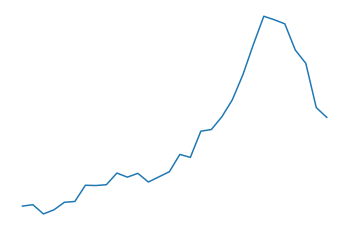

patient 92.0 of 231.0


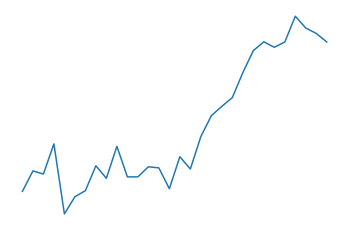

patient 92.0 of 231.0


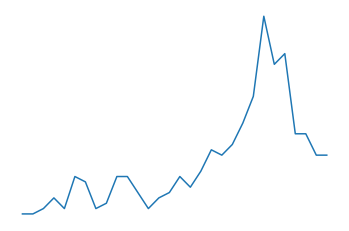

patient 92.0 of 231.0


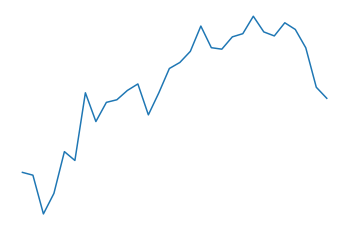


patient 93.0 of 231.0


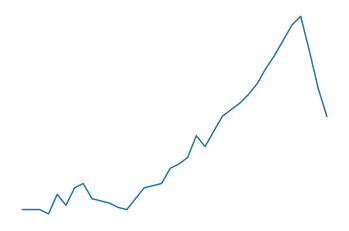

patient 93.0 of 231.0


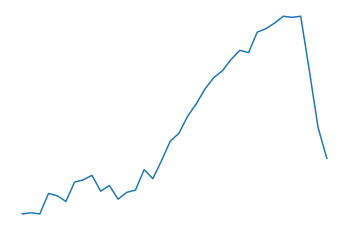

patient 93.0 of 231.0


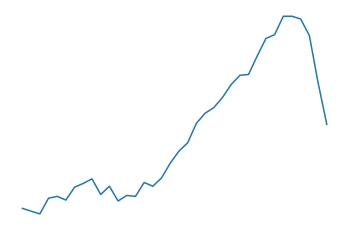

patient 93.0 of 231.0


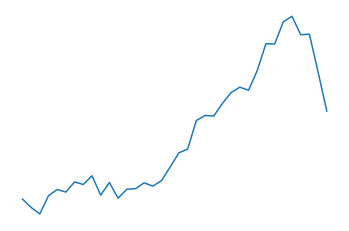

patient 93.0 of 231.0


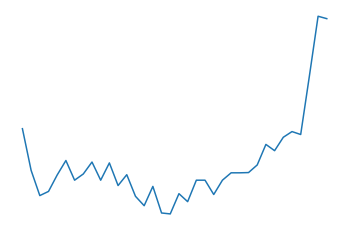

patient 93.0 of 231.0


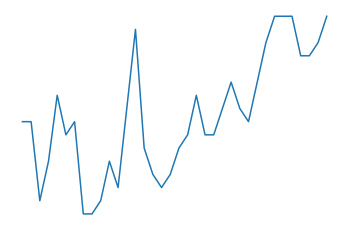

patient 93.0 of 231.0


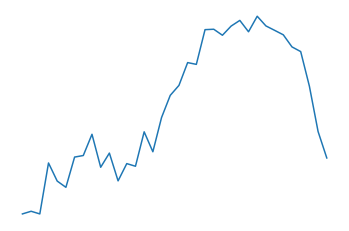


patient 94.0 of 231.0


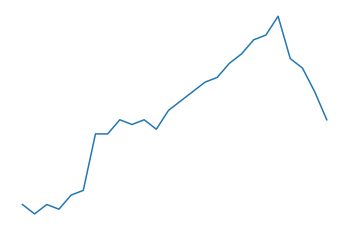

patient 94.0 of 231.0


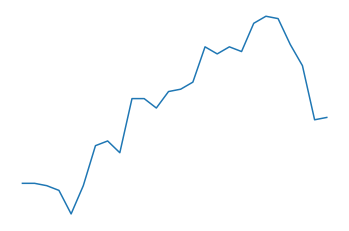

patient 94.0 of 231.0


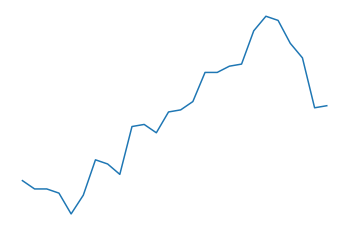

patient 94.0 of 231.0


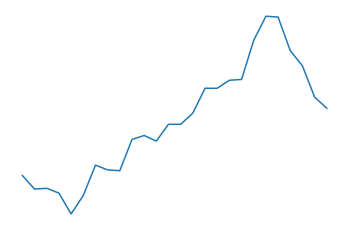

patient 94.0 of 231.0


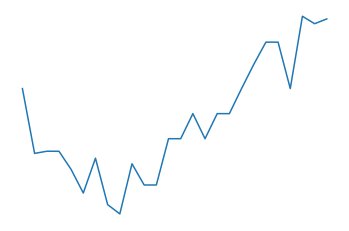

patient 94.0 of 231.0


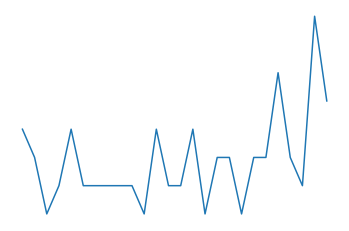

patient 94.0 of 231.0


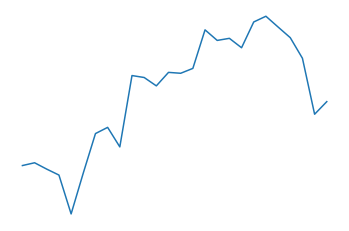


patient 95.0 of 231.0


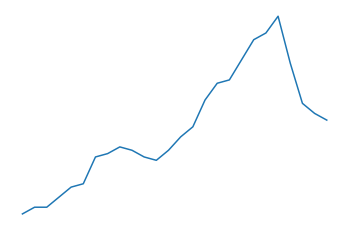

patient 95.0 of 231.0


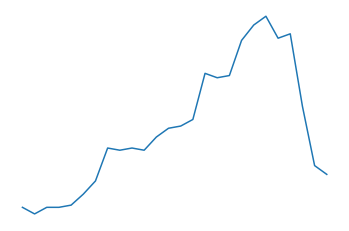

patient 95.0 of 231.0


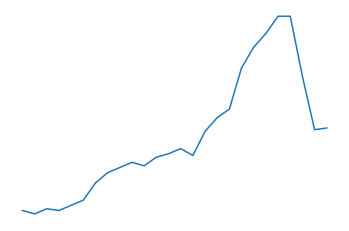

patient 95.0 of 231.0


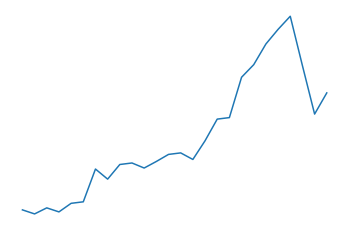

patient 95.0 of 231.0


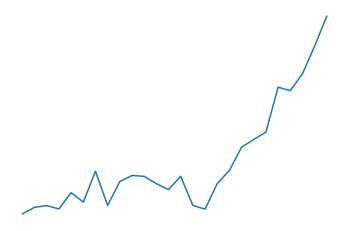

patient 95.0 of 231.0


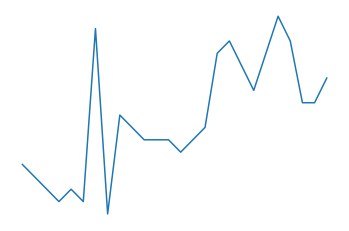

patient 95.0 of 231.0


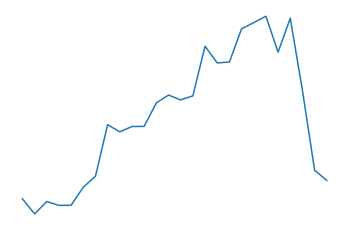


patient 96.0 of 231.0


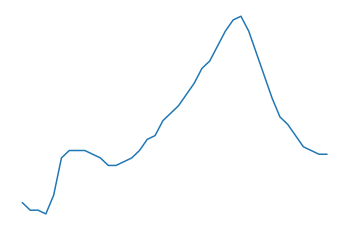

patient 96.0 of 231.0


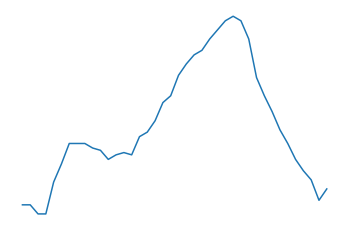

patient 96.0 of 231.0


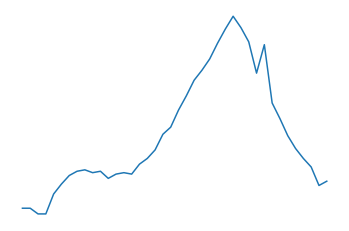

patient 96.0 of 231.0


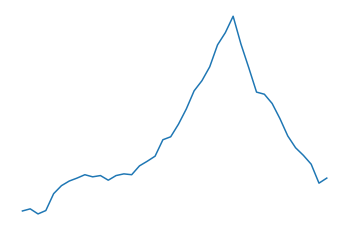

patient 96.0 of 231.0


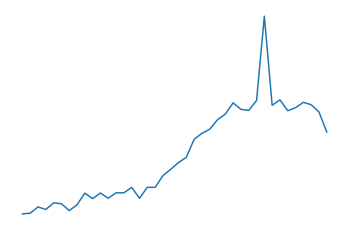

patient 96.0 of 231.0


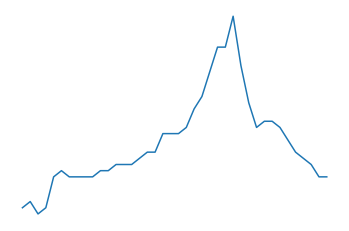

patient 96.0 of 231.0


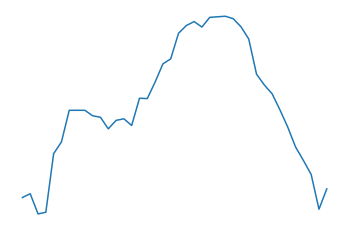


patient 97.0 of 231.0


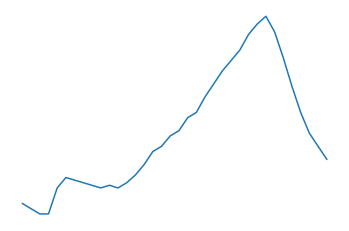

patient 97.0 of 231.0


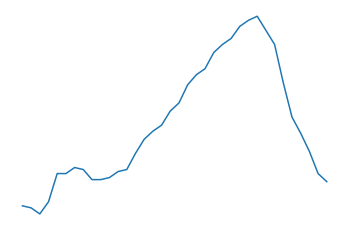

patient 97.0 of 231.0


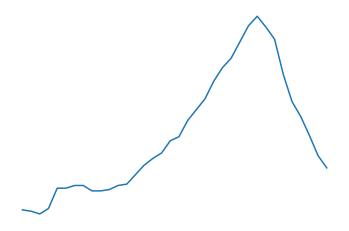

patient 97.0 of 231.0


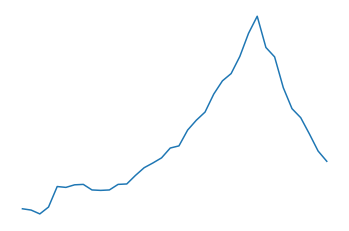

patient 97.0 of 231.0


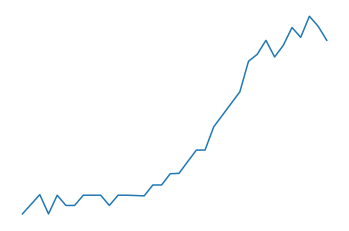

patient 97.0 of 231.0


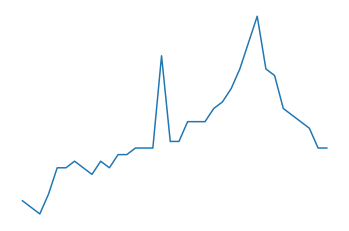

patient 97.0 of 231.0


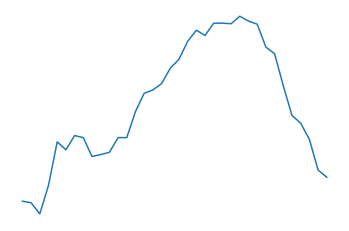


patient 98.0 of 231.0


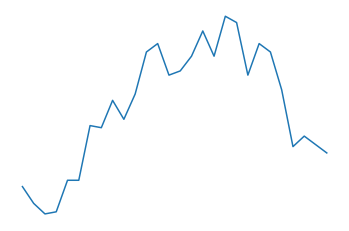

patient 98.0 of 231.0


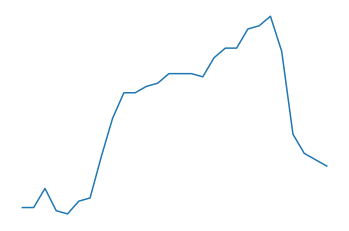

patient 98.0 of 231.0


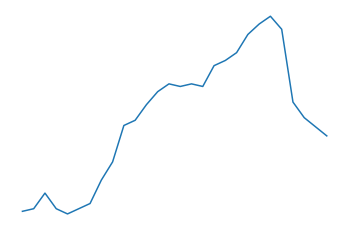

patient 98.0 of 231.0


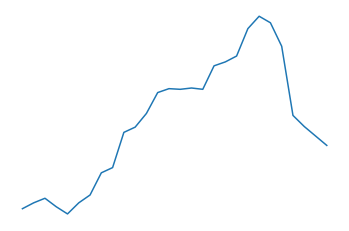

patient 98.0 of 231.0


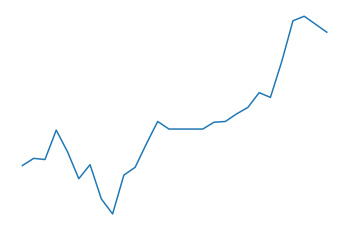

patient 98.0 of 231.0


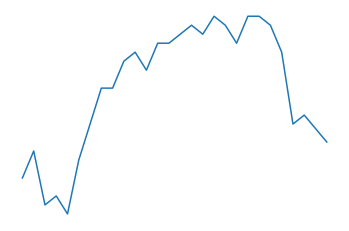

patient 98.0 of 231.0


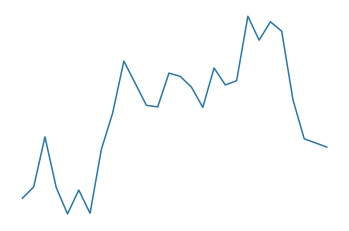


patient 99.0 of 231.0


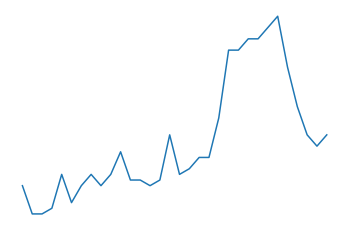

patient 99.0 of 231.0


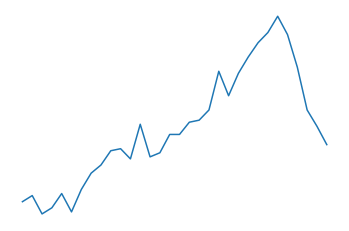

patient 99.0 of 231.0


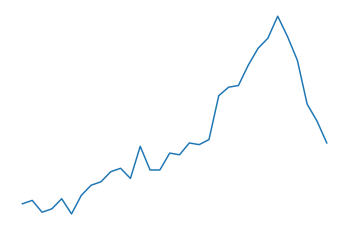

patient 99.0 of 231.0


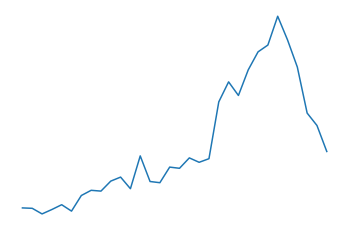

patient 99.0 of 231.0


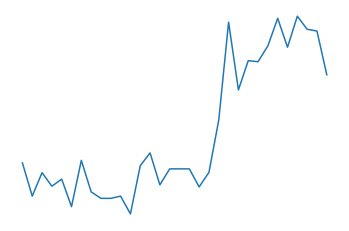

patient 99.0 of 231.0


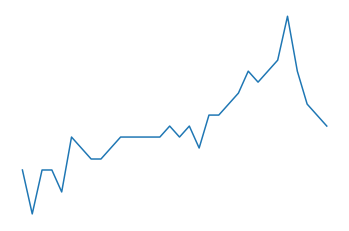

patient 99.0 of 231.0


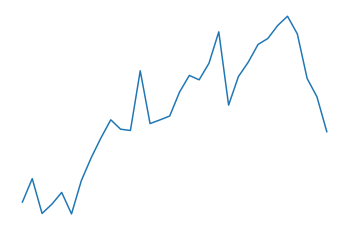


patient 100.0 of 231.0


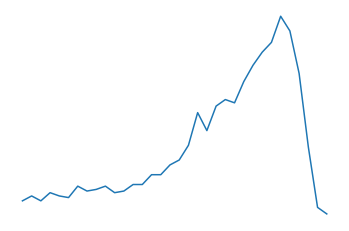

patient 100.0 of 231.0


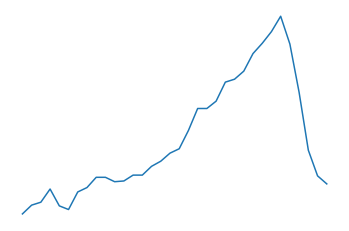

patient 100.0 of 231.0


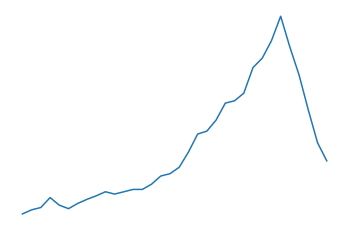

patient 100.0 of 231.0


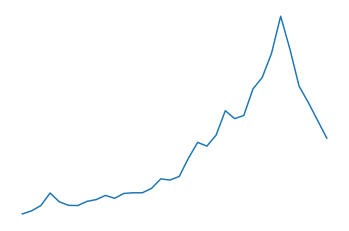

patient 100.0 of 231.0


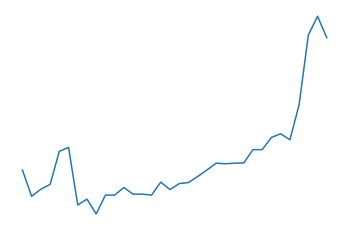

patient 100.0 of 231.0


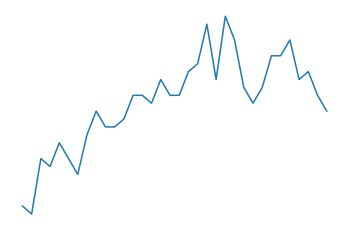

patient 100.0 of 231.0


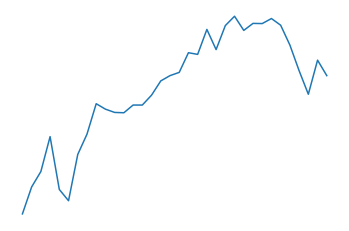


patient 101.0 of 231.0


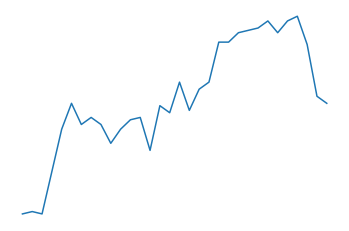

patient 101.0 of 231.0


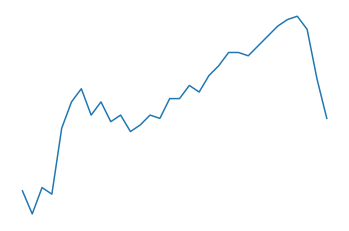

patient 101.0 of 231.0


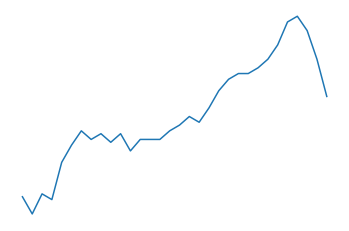

patient 101.0 of 231.0


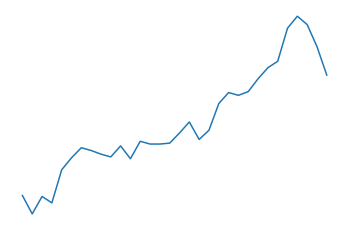

patient 101.0 of 231.0


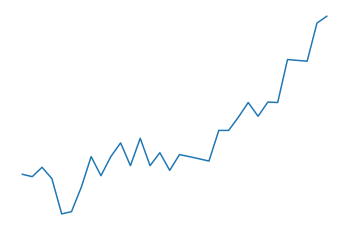

patient 101.0 of 231.0


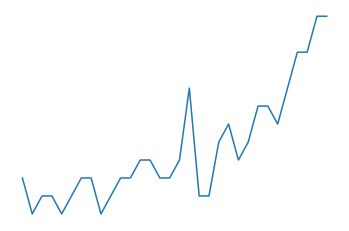

patient 101.0 of 231.0


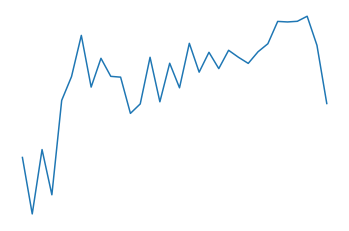


patient 102.0 of 231.0


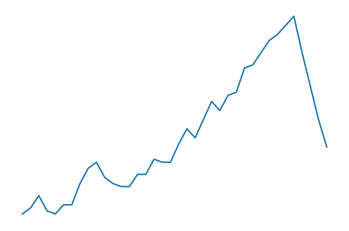

patient 102.0 of 231.0


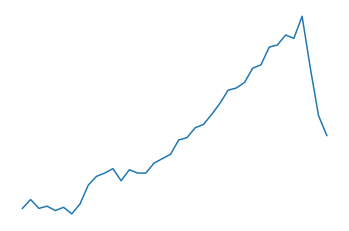

patient 102.0 of 231.0


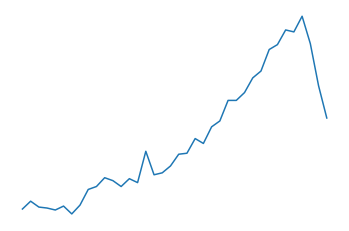

patient 102.0 of 231.0


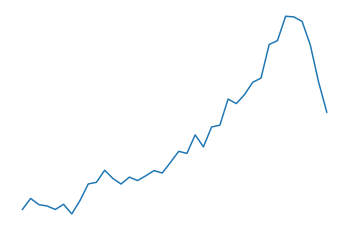

patient 102.0 of 231.0


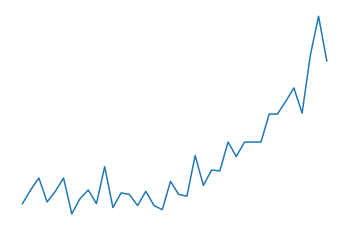

patient 102.0 of 231.0


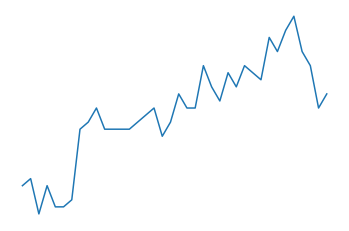

patient 102.0 of 231.0


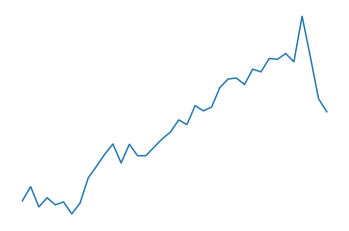


patient 103.0 of 231.0


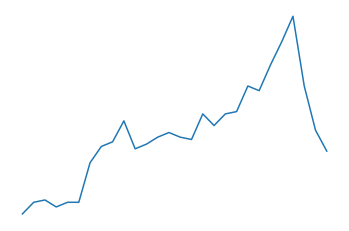

patient 103.0 of 231.0


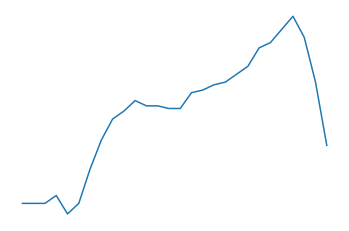

patient 103.0 of 231.0


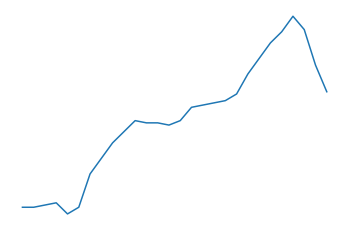

patient 103.0 of 231.0


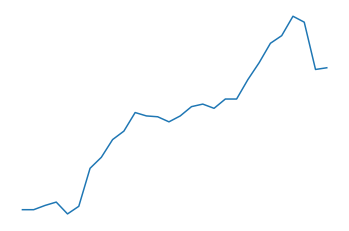

patient 103.0 of 231.0


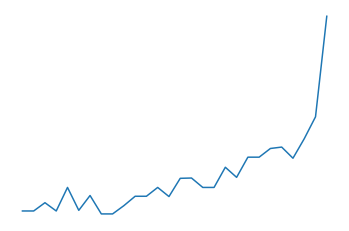

patient 103.0 of 231.0


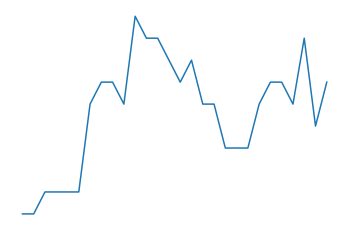

patient 103.0 of 231.0


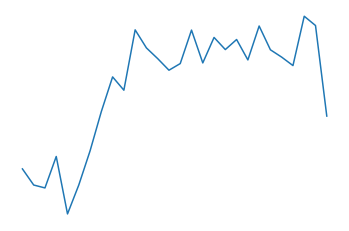


patient 104.0 of 231.0


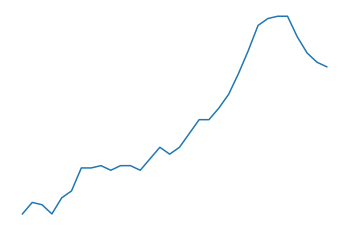

patient 104.0 of 231.0


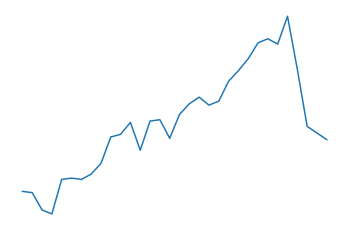

patient 104.0 of 231.0


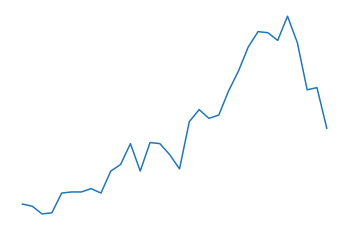

patient 104.0 of 231.0


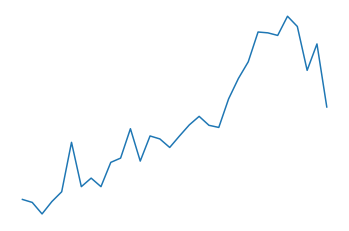

patient 104.0 of 231.0


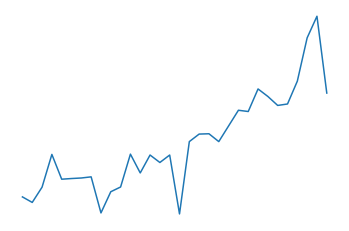

patient 104.0 of 231.0


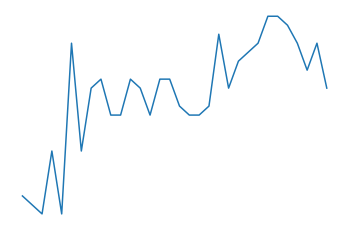

patient 104.0 of 231.0


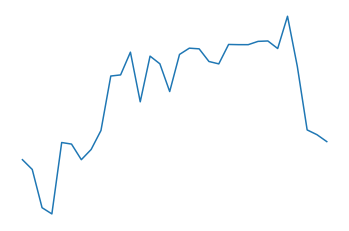


patient 105.0 of 231.0


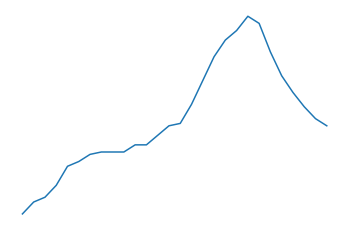

patient 105.0 of 231.0


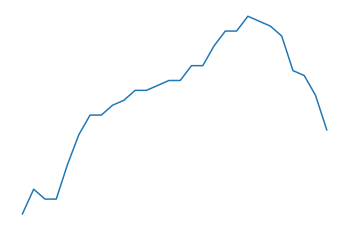

patient 105.0 of 231.0


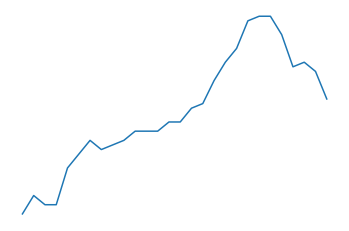

patient 105.0 of 231.0


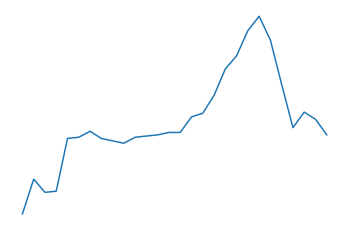

patient 105.0 of 231.0


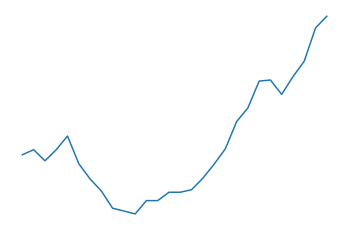

patient 105.0 of 231.0


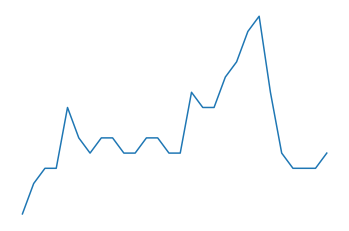

patient 105.0 of 231.0


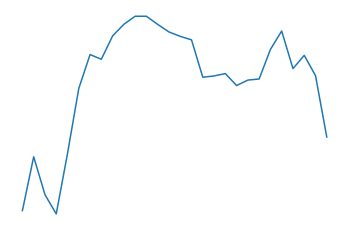


patient 106.0 of 231.0


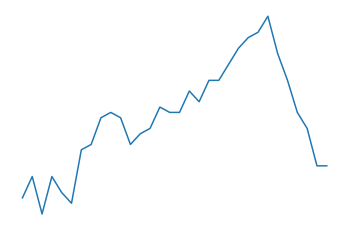

patient 106.0 of 231.0


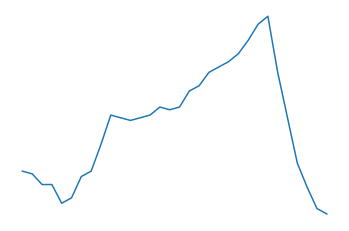

patient 106.0 of 231.0


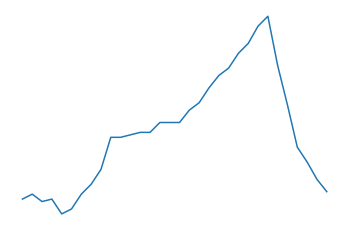

patient 106.0 of 231.0


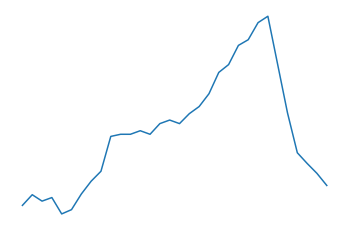

patient 106.0 of 231.0


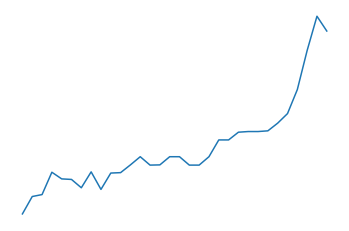

patient 106.0 of 231.0


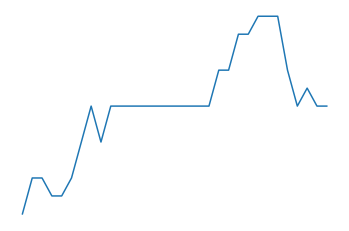

patient 106.0 of 231.0


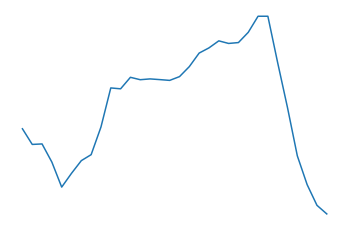


patient 107.0 of 231.0


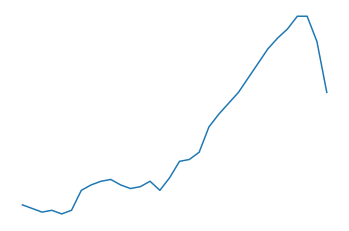

patient 107.0 of 231.0


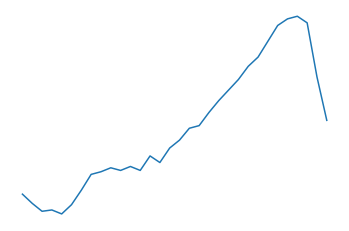

patient 107.0 of 231.0


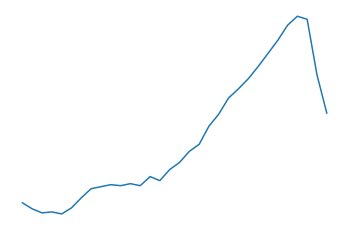

patient 107.0 of 231.0


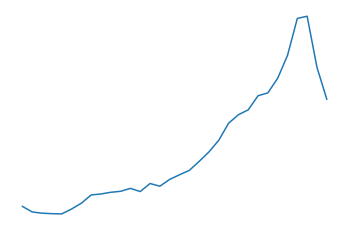

patient 107.0 of 231.0


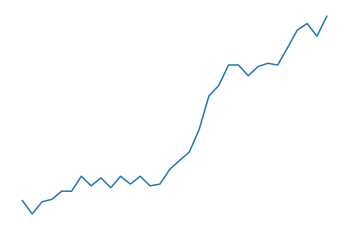

patient 107.0 of 231.0


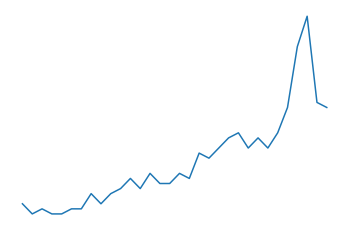

patient 107.0 of 231.0


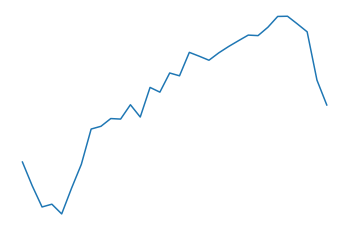


patient 108.0 of 231.0


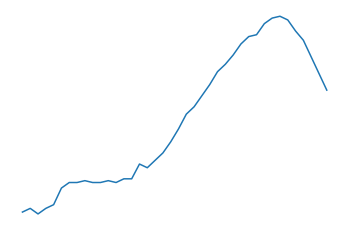

patient 108.0 of 231.0


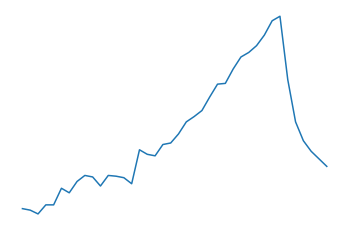

patient 108.0 of 231.0


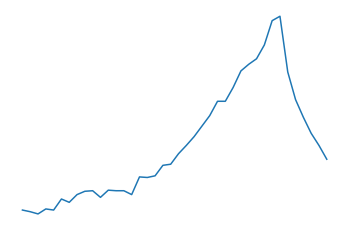

patient 108.0 of 231.0


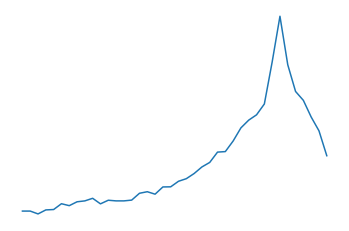

patient 108.0 of 231.0


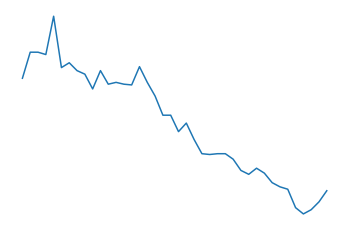

patient 108.0 of 231.0


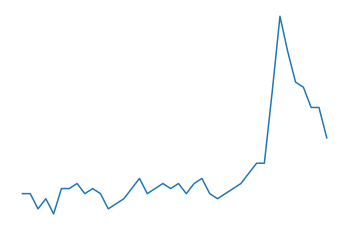

patient 108.0 of 231.0


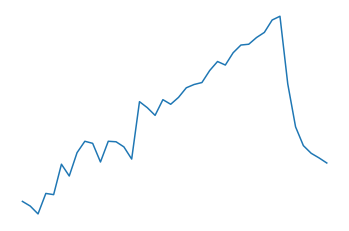


patient 109.0 of 231.0


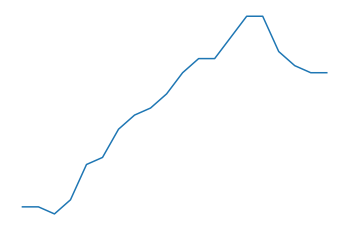

patient 109.0 of 231.0


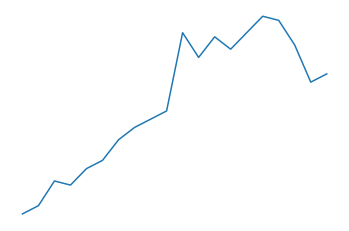

patient 109.0 of 231.0


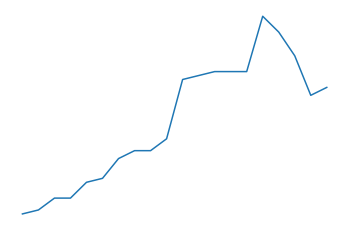

patient 109.0 of 231.0


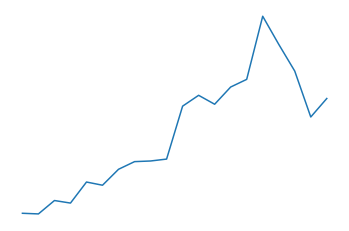

patient 109.0 of 231.0


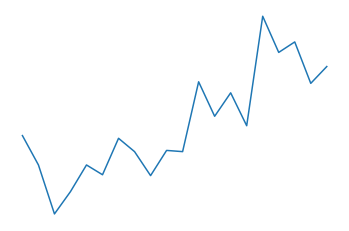

patient 109.0 of 231.0


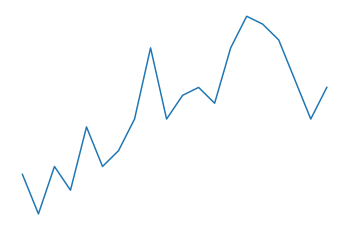

patient 109.0 of 231.0


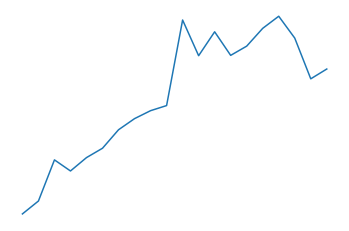


patient 110.0 of 231.0


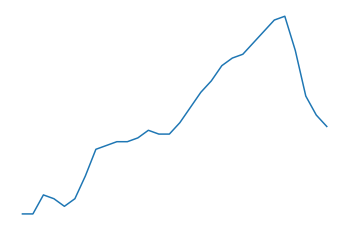

patient 110.0 of 231.0


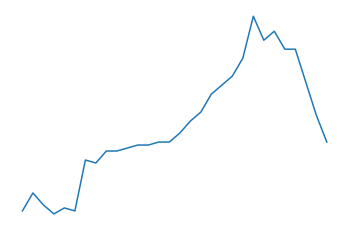

patient 110.0 of 231.0


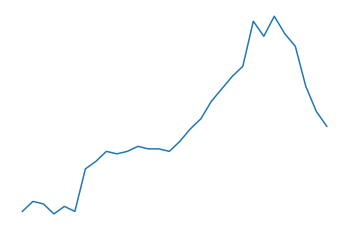

patient 110.0 of 231.0


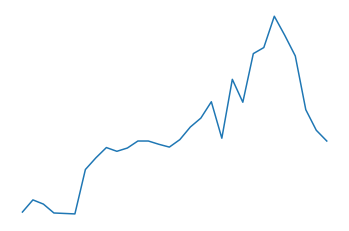

patient 110.0 of 231.0


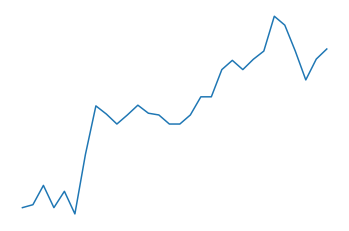

patient 110.0 of 231.0


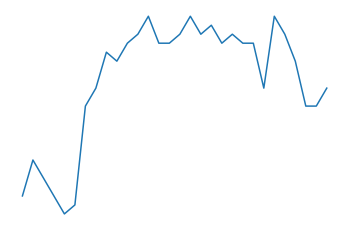

patient 110.0 of 231.0


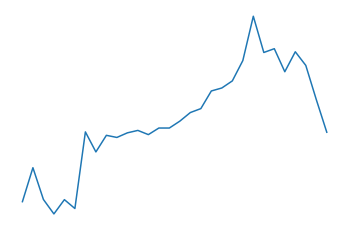


patient 111.0 of 231.0


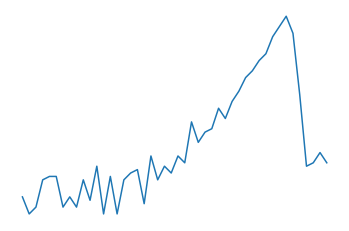

patient 111.0 of 231.0


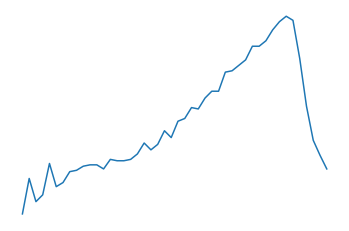

patient 111.0 of 231.0


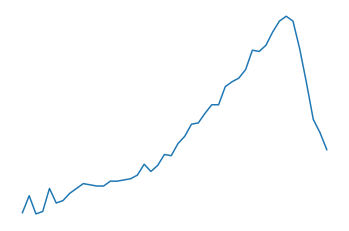

patient 111.0 of 231.0


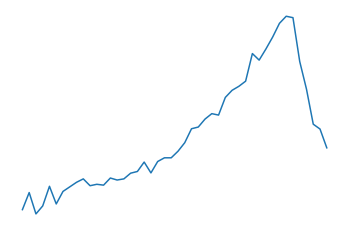

patient 111.0 of 231.0


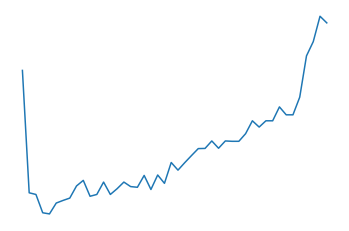

patient 111.0 of 231.0


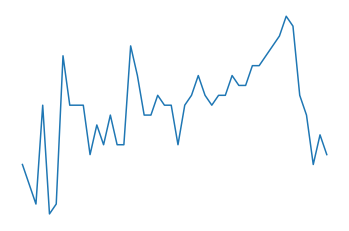

patient 111.0 of 231.0


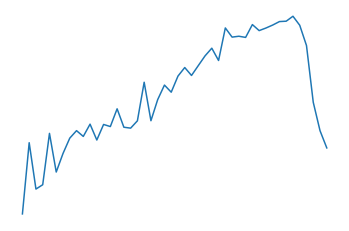


patient 112.0 of 231.0


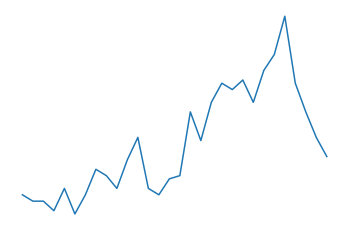

patient 112.0 of 231.0


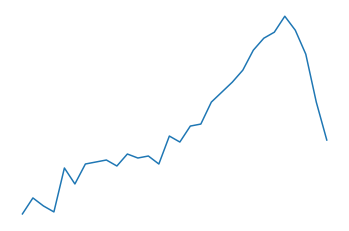

patient 112.0 of 231.0


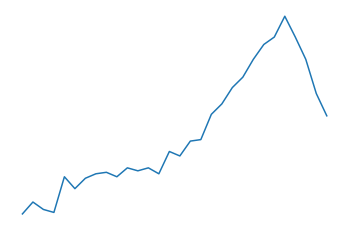

patient 112.0 of 231.0


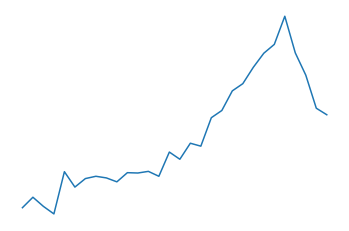

patient 112.0 of 231.0


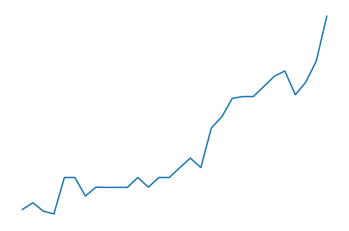

patient 112.0 of 231.0


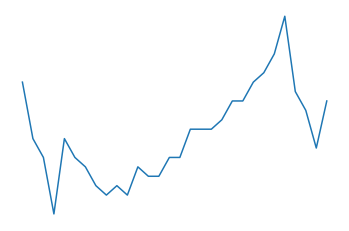

patient 112.0 of 231.0


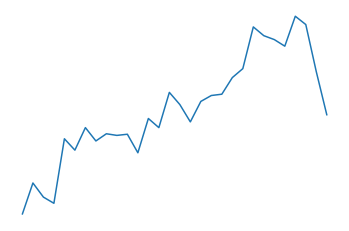


patient 113.0 of 231.0


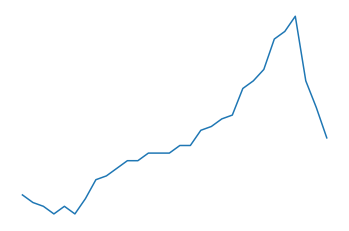

patient 113.0 of 231.0


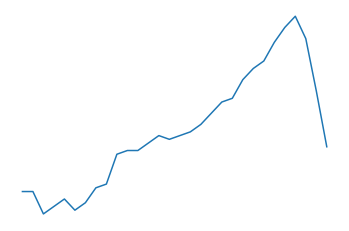

patient 113.0 of 231.0


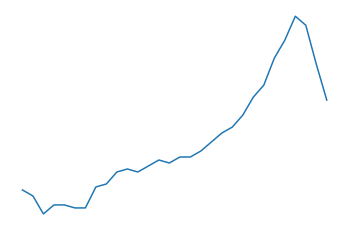

patient 113.0 of 231.0


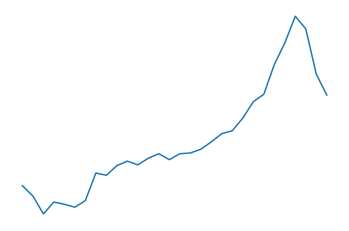

patient 113.0 of 231.0


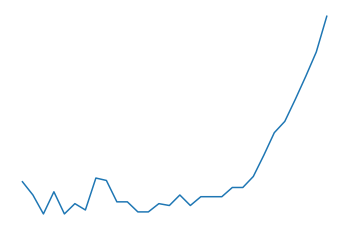

patient 113.0 of 231.0


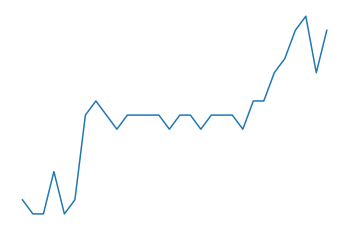

patient 113.0 of 231.0


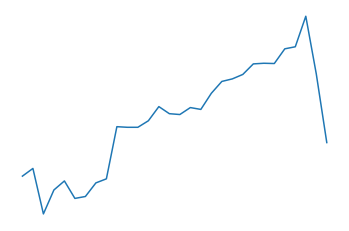


patient 114.0 of 231.0


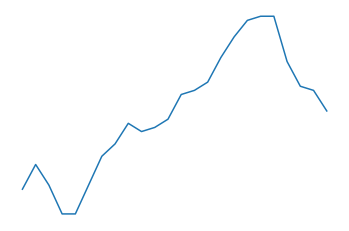

patient 114.0 of 231.0


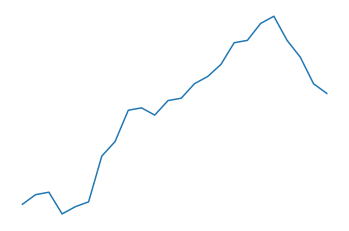

patient 114.0 of 231.0


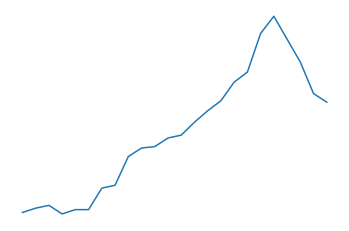

patient 114.0 of 231.0


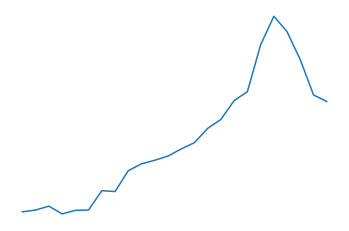

patient 114.0 of 231.0


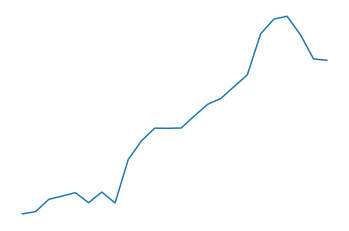

patient 114.0 of 231.0


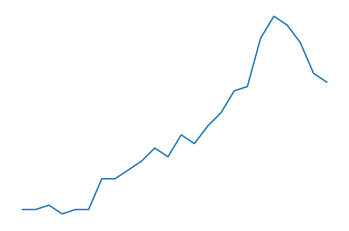

patient 114.0 of 231.0


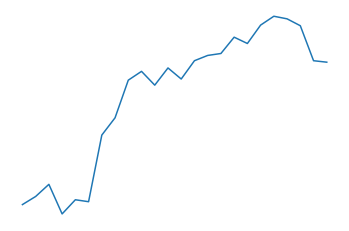


patient 115.0 of 231.0


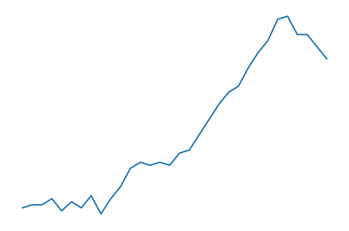

patient 115.0 of 231.0


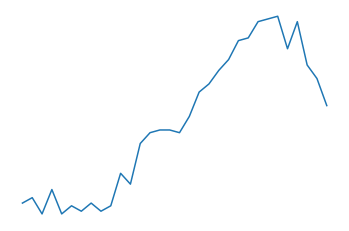

patient 115.0 of 231.0


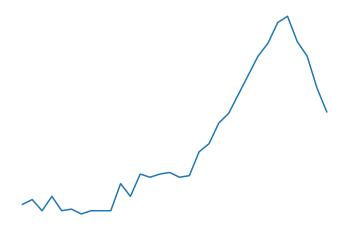

patient 115.0 of 231.0


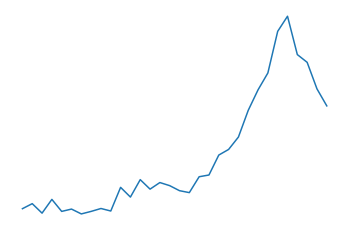

patient 115.0 of 231.0


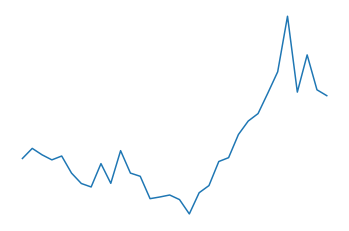

patient 115.0 of 231.0


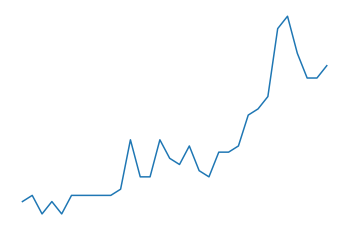

patient 115.0 of 231.0


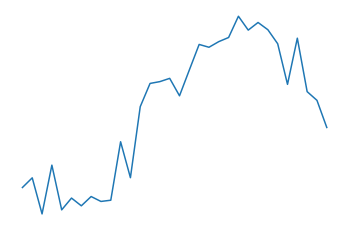


patient 116.0 of 231.0


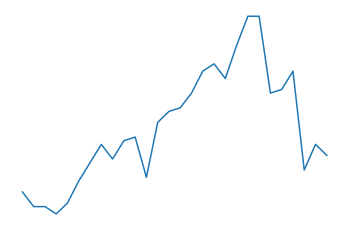

patient 116.0 of 231.0


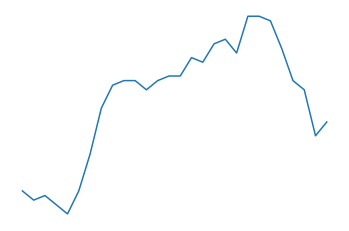

patient 116.0 of 231.0


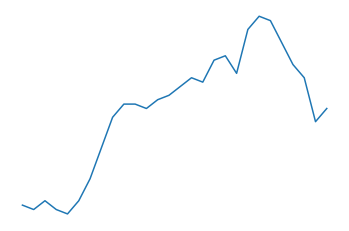

patient 116.0 of 231.0


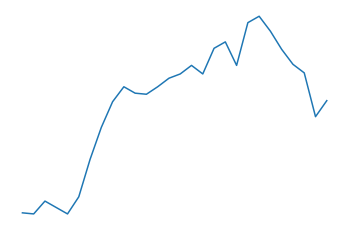

patient 116.0 of 231.0


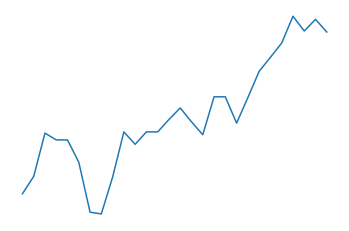

patient 116.0 of 231.0


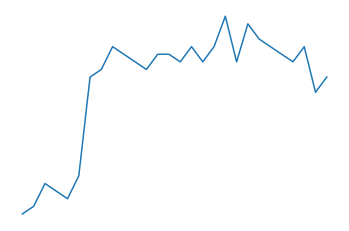

patient 116.0 of 231.0


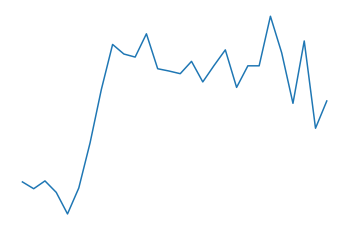


patient 117.0 of 231.0


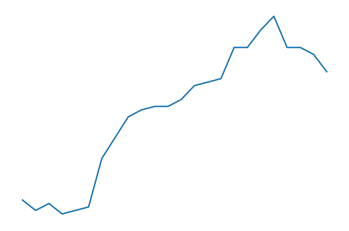

patient 117.0 of 231.0


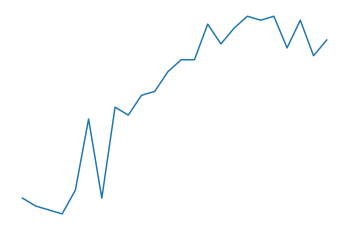

patient 117.0 of 231.0


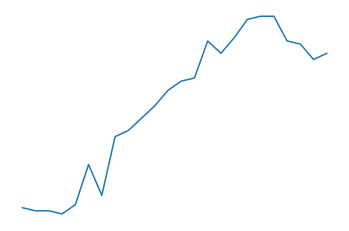

patient 117.0 of 231.0


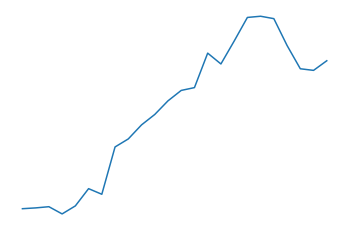

patient 117.0 of 231.0


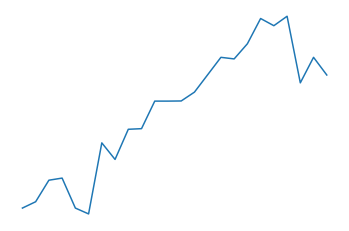

patient 117.0 of 231.0


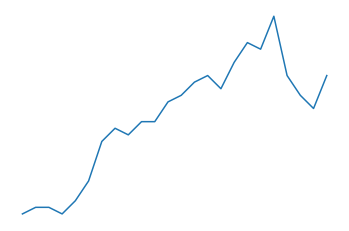

patient 117.0 of 231.0


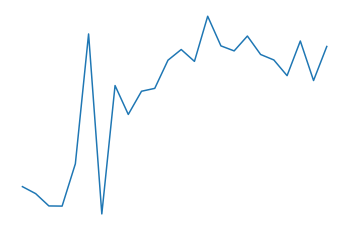


patient 118.0 of 231.0


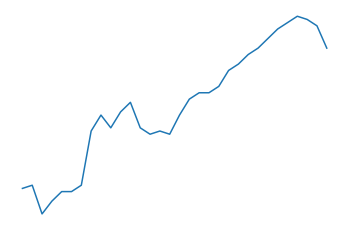

patient 118.0 of 231.0


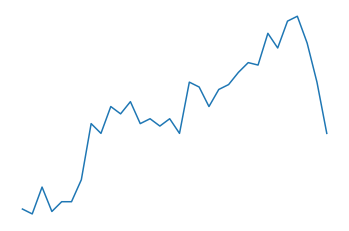

patient 118.0 of 231.0


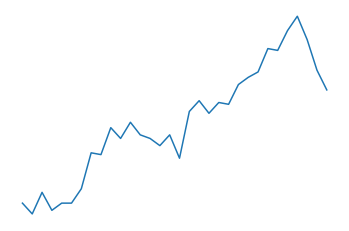

patient 118.0 of 231.0


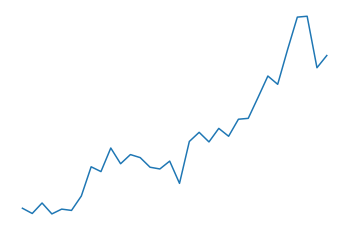

patient 118.0 of 231.0


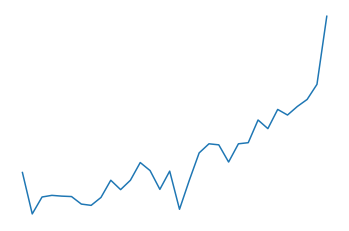

patient 118.0 of 231.0


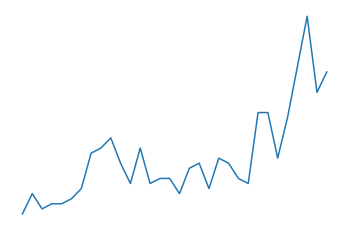

patient 118.0 of 231.0


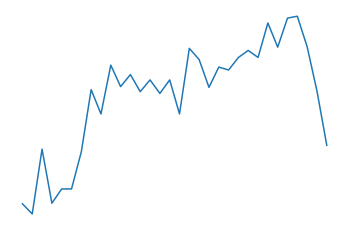


patient 119.0 of 231.0


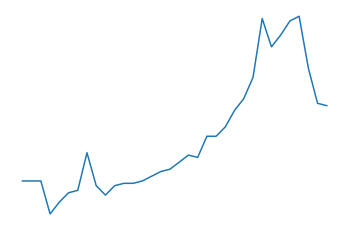

patient 119.0 of 231.0


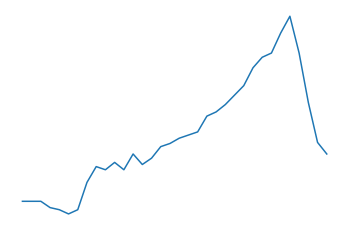

patient 119.0 of 231.0


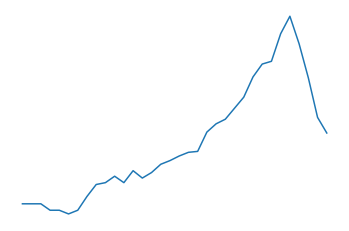

patient 119.0 of 231.0


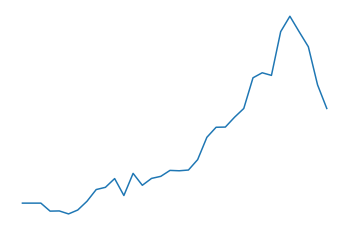

patient 119.0 of 231.0


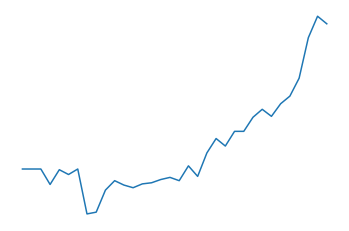

patient 119.0 of 231.0


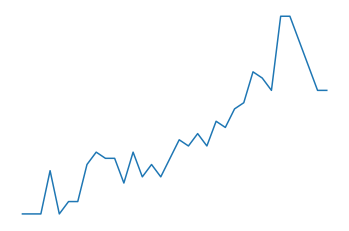

patient 119.0 of 231.0


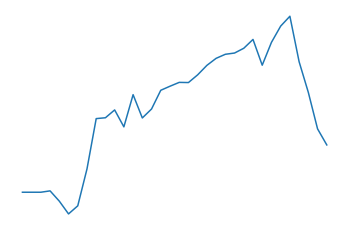


patient 120.0 of 231.0


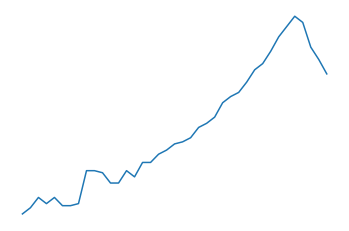

patient 120.0 of 231.0


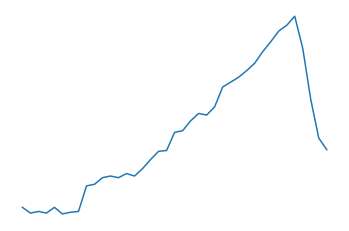

patient 120.0 of 231.0


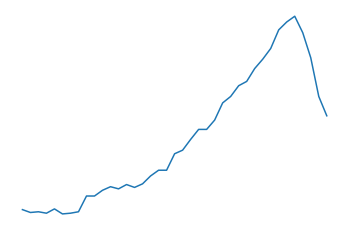

patient 120.0 of 231.0


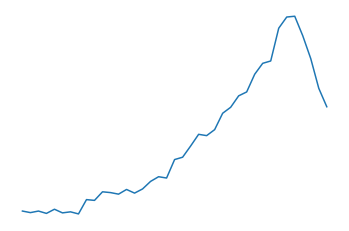

patient 120.0 of 231.0


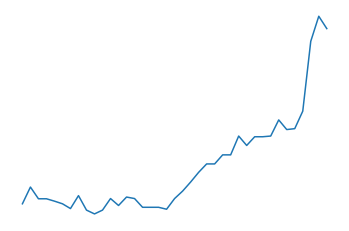

patient 120.0 of 231.0


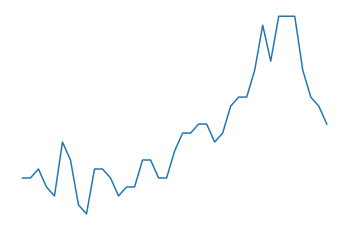

patient 120.0 of 231.0


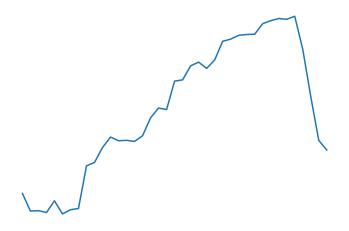


patient 121.0 of 231.0


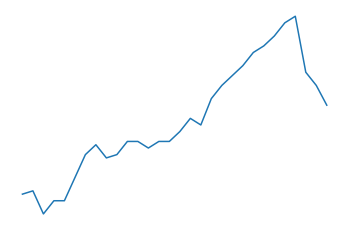

patient 121.0 of 231.0


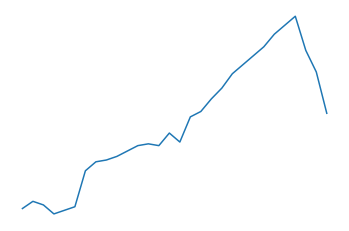

patient 121.0 of 231.0


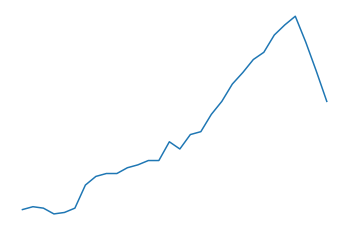

patient 121.0 of 231.0


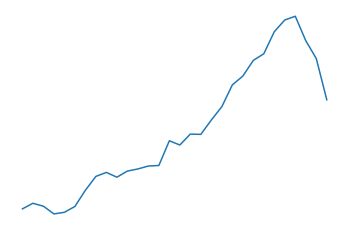

patient 121.0 of 231.0


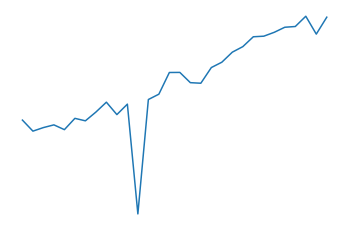

patient 121.0 of 231.0


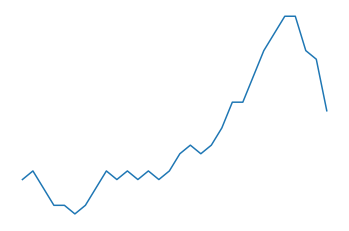

patient 121.0 of 231.0


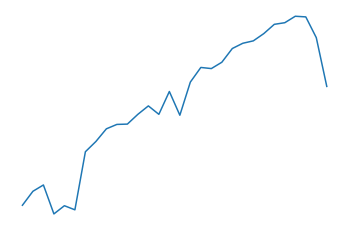


patient 122.0 of 231.0


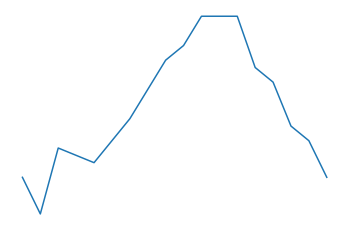

patient 122.0 of 231.0


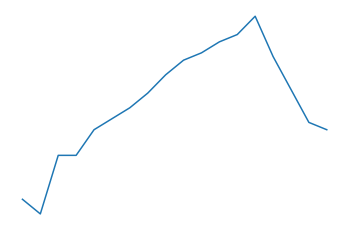

patient 122.0 of 231.0


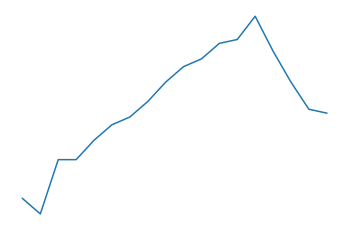

patient 122.0 of 231.0


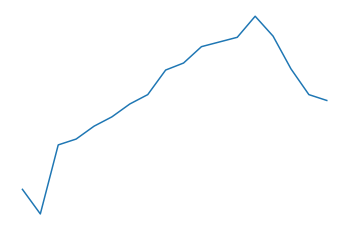

patient 122.0 of 231.0


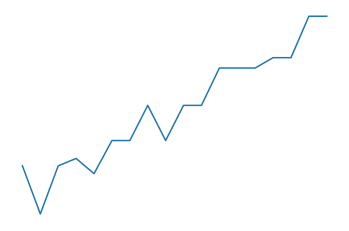

patient 122.0 of 231.0


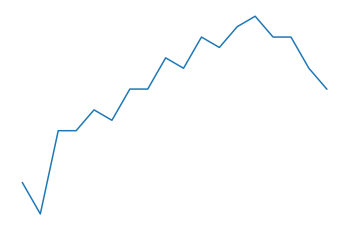

patient 122.0 of 231.0


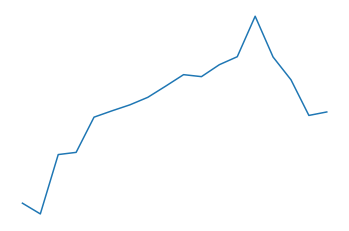


patient 123.0 of 231.0


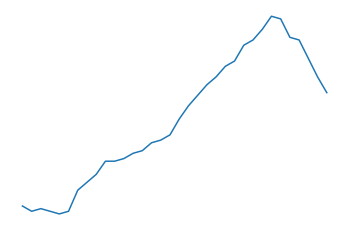

patient 123.0 of 231.0


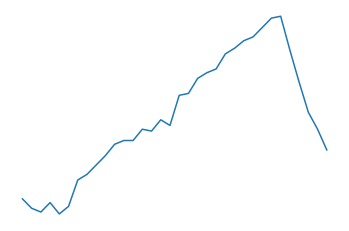

patient 123.0 of 231.0


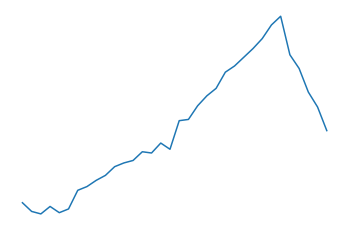

patient 123.0 of 231.0


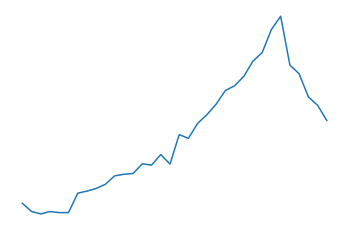

patient 123.0 of 231.0


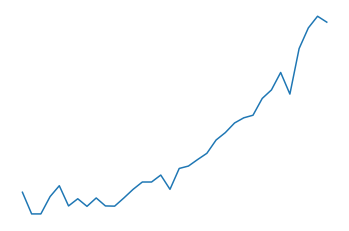

patient 123.0 of 231.0


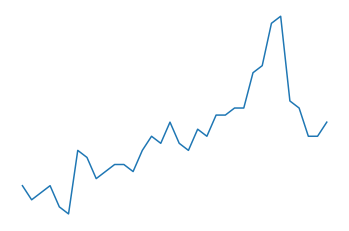

patient 123.0 of 231.0


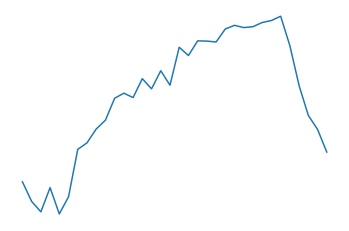


patient 124.0 of 231.0


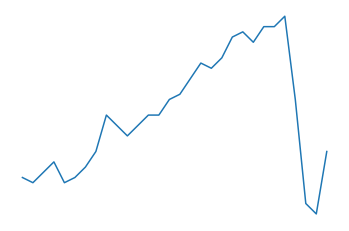

patient 124.0 of 231.0


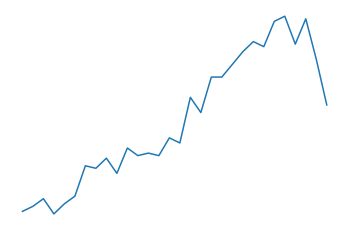

patient 124.0 of 231.0


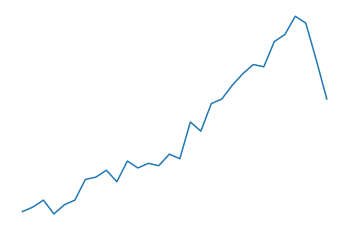

patient 124.0 of 231.0


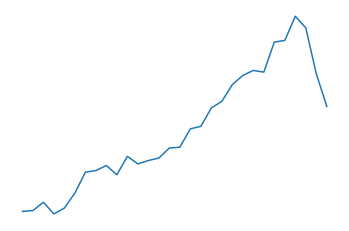

patient 124.0 of 231.0


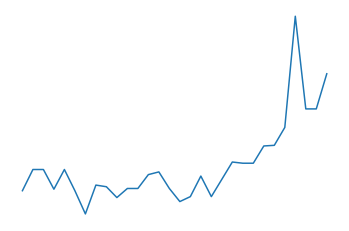

patient 124.0 of 231.0


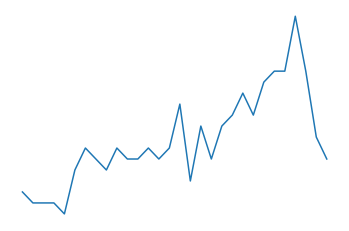

patient 124.0 of 231.0


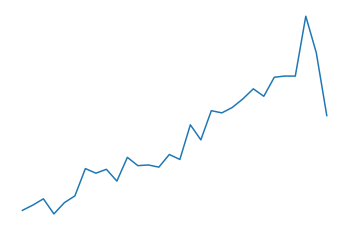


patient 125.0 of 231.0


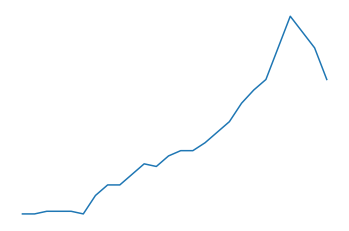

patient 125.0 of 231.0


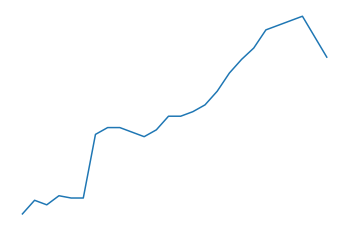

patient 125.0 of 231.0


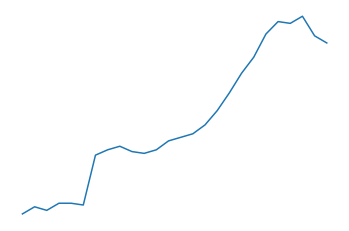

patient 125.0 of 231.0


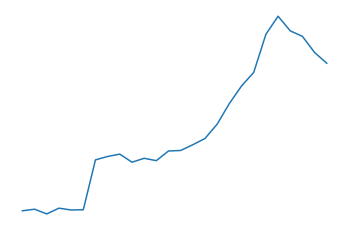

patient 125.0 of 231.0


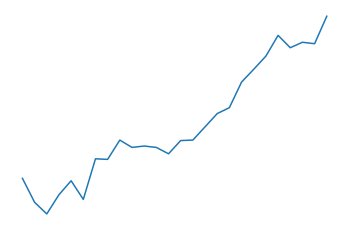

patient 125.0 of 231.0


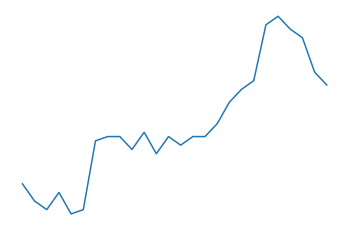

patient 125.0 of 231.0


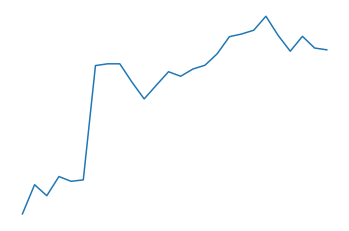


patient 126.0 of 231.0


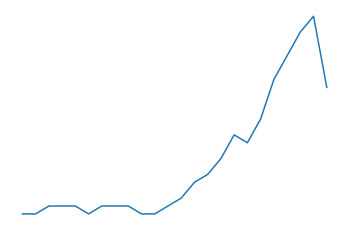

patient 126.0 of 231.0


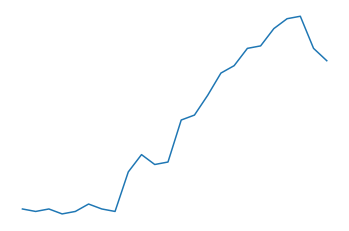

patient 126.0 of 231.0


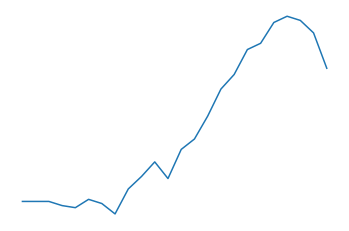

patient 126.0 of 231.0


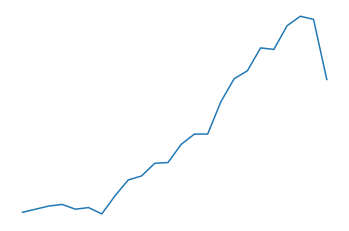

patient 126.0 of 231.0


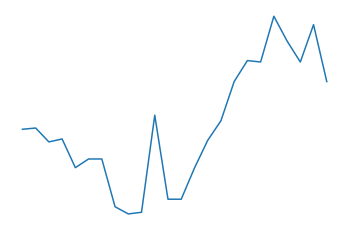

patient 126.0 of 231.0


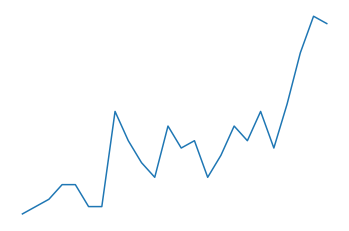

patient 126.0 of 231.0


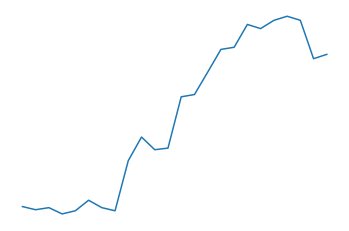


patient 127.0 of 231.0


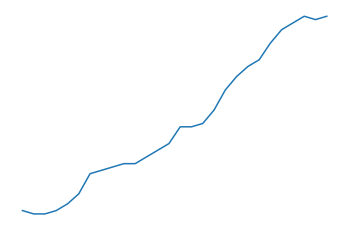

patient 127.0 of 231.0


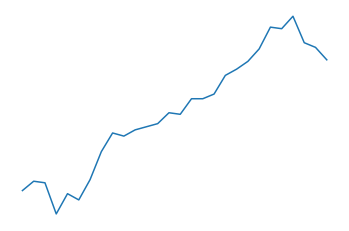

patient 127.0 of 231.0


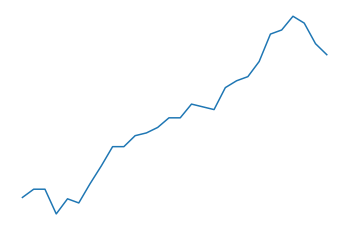

patient 127.0 of 231.0


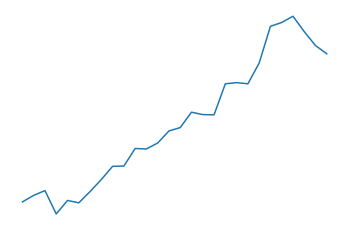

patient 127.0 of 231.0


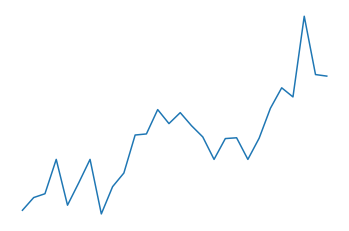

patient 127.0 of 231.0


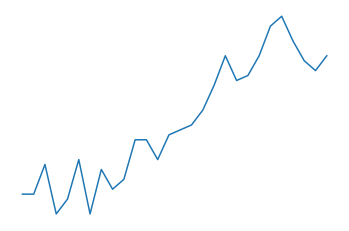

patient 127.0 of 231.0


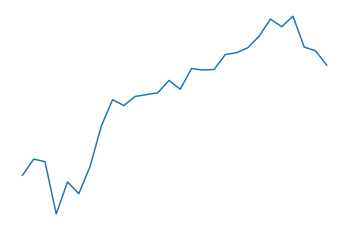


patient 128.0 of 231.0


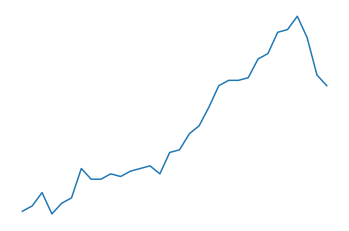

patient 128.0 of 231.0


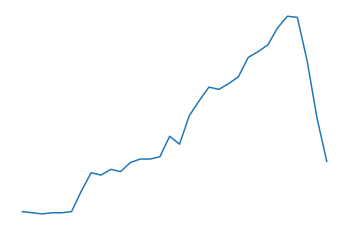

patient 128.0 of 231.0


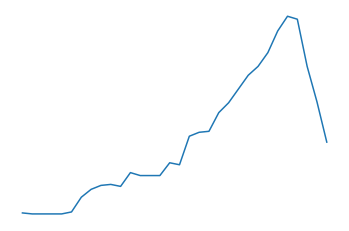

patient 128.0 of 231.0


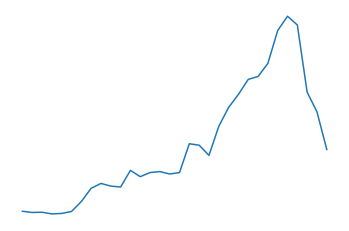

patient 128.0 of 231.0


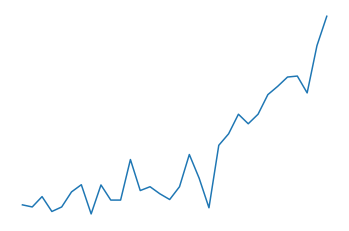

patient 128.0 of 231.0


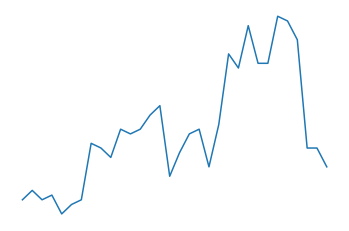

patient 128.0 of 231.0


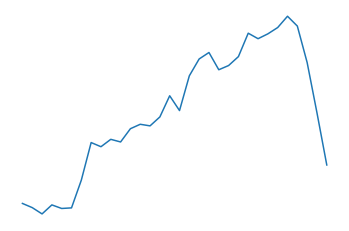


patient 129.0 of 231.0


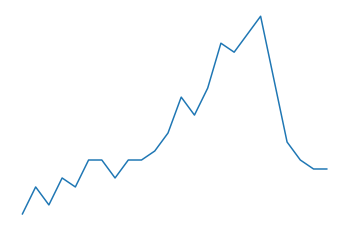

patient 129.0 of 231.0


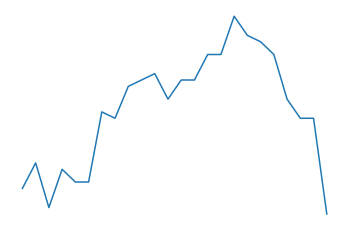

patient 129.0 of 231.0


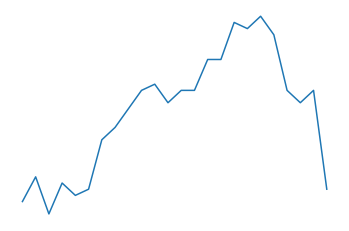

patient 129.0 of 231.0


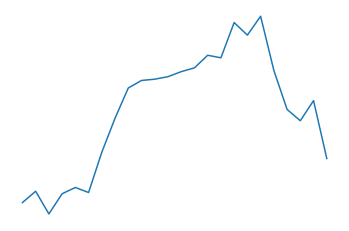

patient 129.0 of 231.0


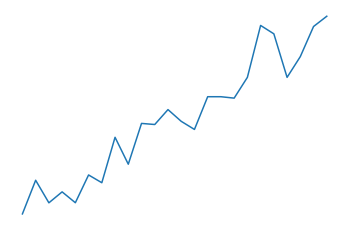

patient 129.0 of 231.0


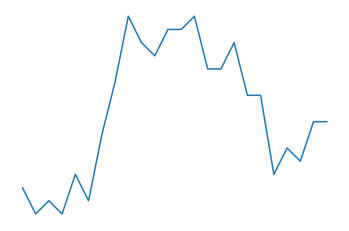

patient 129.0 of 231.0


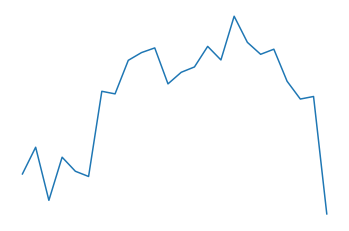


patient 130.0 of 231.0


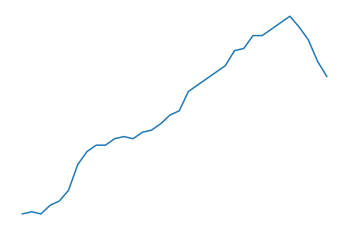

patient 130.0 of 231.0


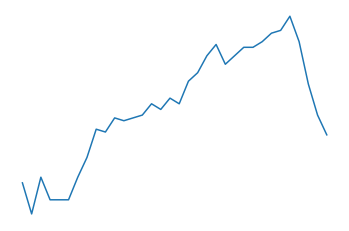

patient 130.0 of 231.0


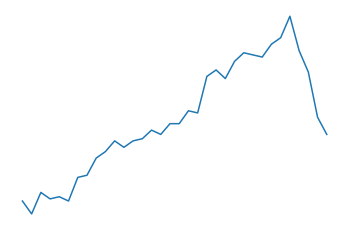

patient 130.0 of 231.0


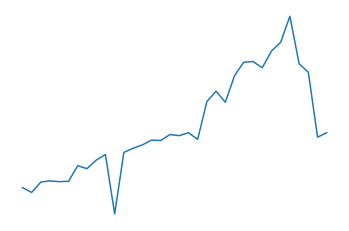

patient 130.0 of 231.0


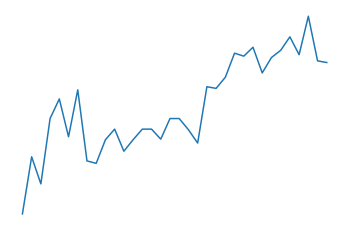

patient 130.0 of 231.0


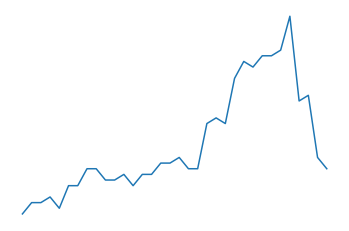

patient 130.0 of 231.0


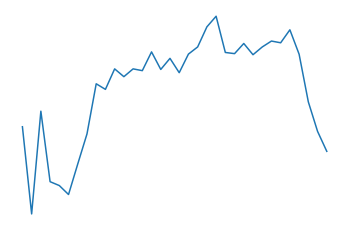


patient 131.0 of 231.0


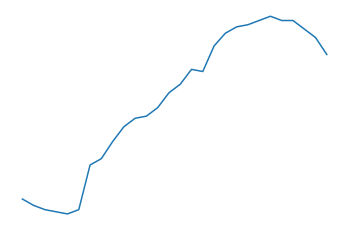

patient 131.0 of 231.0


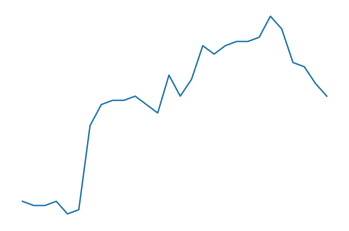

patient 131.0 of 231.0


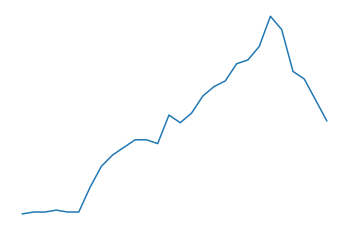

patient 131.0 of 231.0


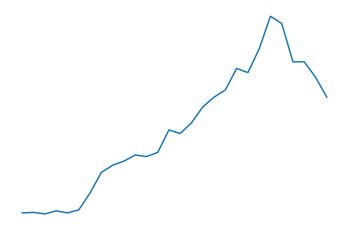

patient 131.0 of 231.0


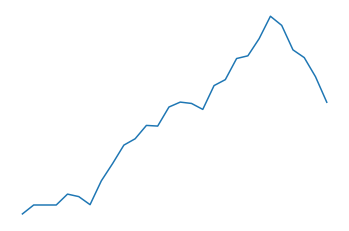

patient 131.0 of 231.0


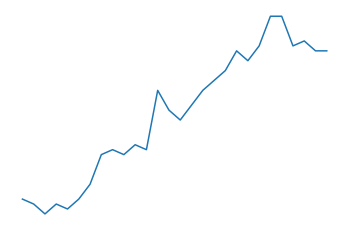

patient 131.0 of 231.0


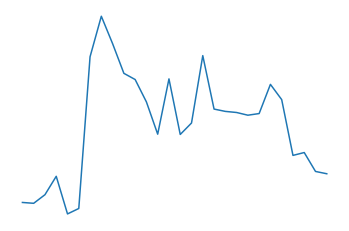


patient 132.0 of 231.0


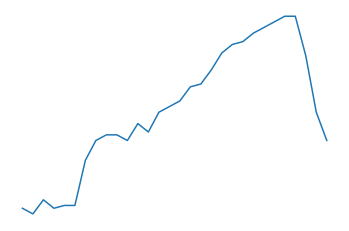

patient 132.0 of 231.0


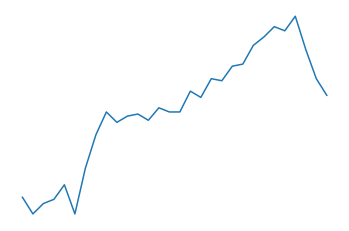

patient 132.0 of 231.0


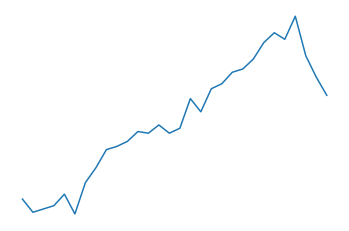

patient 132.0 of 231.0


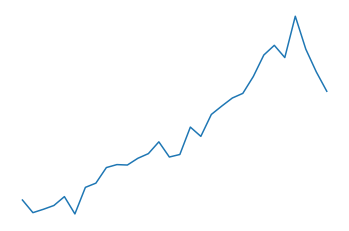

patient 132.0 of 231.0


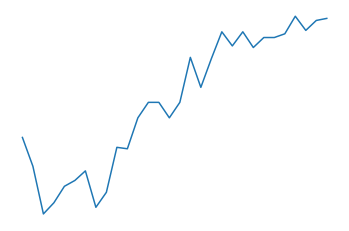

patient 132.0 of 231.0


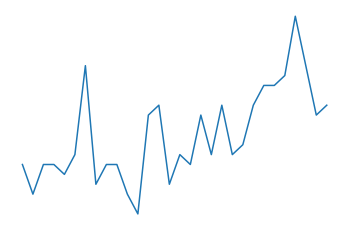

patient 132.0 of 231.0


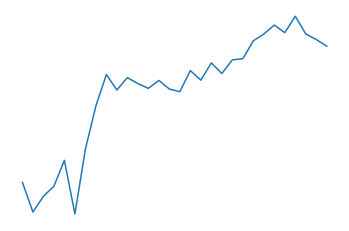


patient 133.0 of 231.0


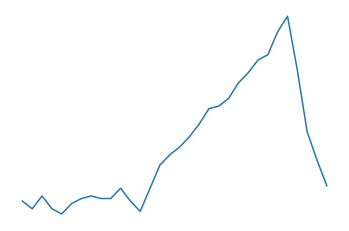

patient 133.0 of 231.0


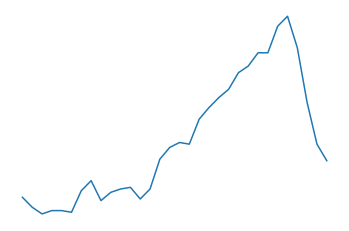

patient 133.0 of 231.0


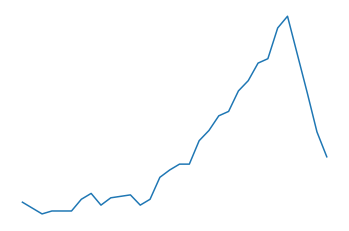

patient 133.0 of 231.0


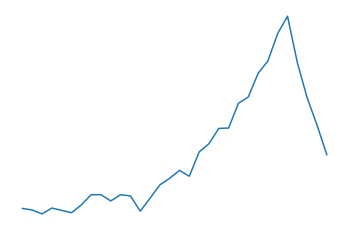

patient 133.0 of 231.0


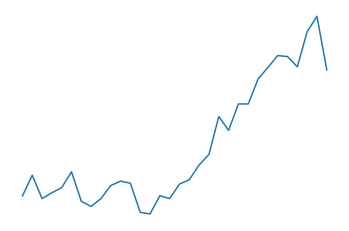

patient 133.0 of 231.0


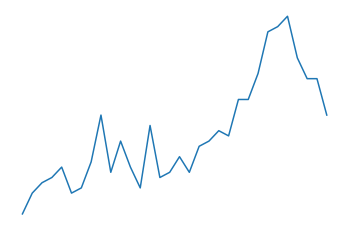

patient 133.0 of 231.0


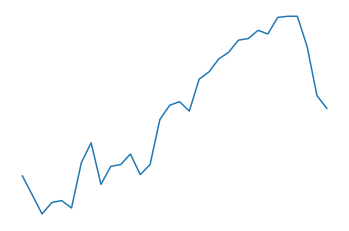


patient 134.0 of 231.0


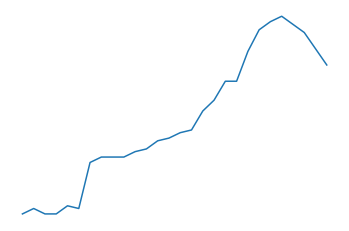

patient 134.0 of 231.0


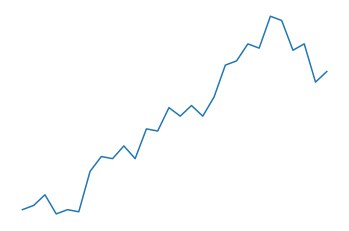

patient 134.0 of 231.0


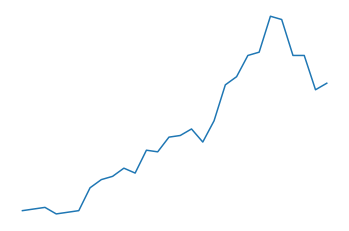

patient 134.0 of 231.0


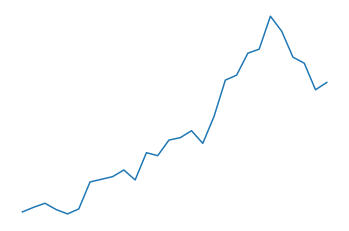

patient 134.0 of 231.0


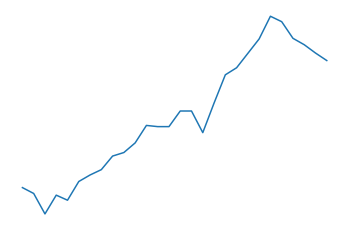

patient 134.0 of 231.0


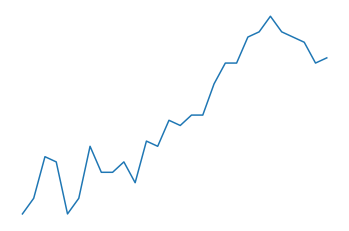

patient 134.0 of 231.0


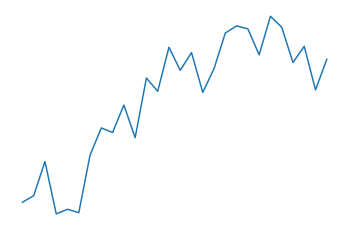


patient 135.0 of 231.0


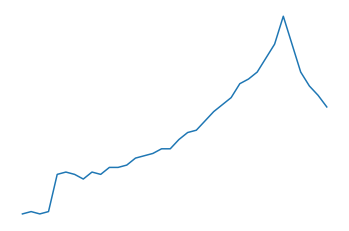

patient 135.0 of 231.0


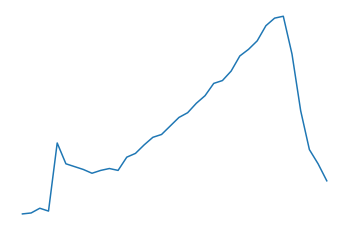

patient 135.0 of 231.0


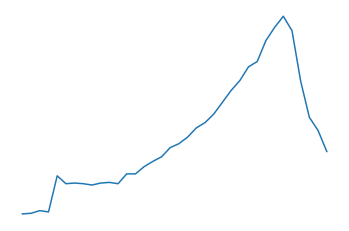

patient 135.0 of 231.0


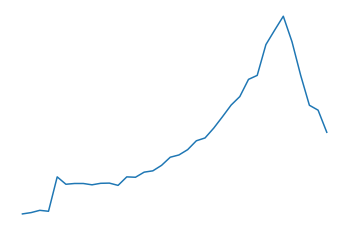

patient 135.0 of 231.0


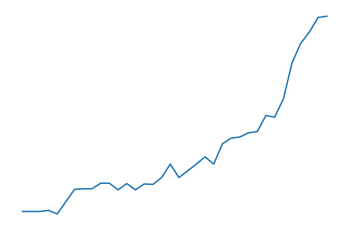

patient 135.0 of 231.0


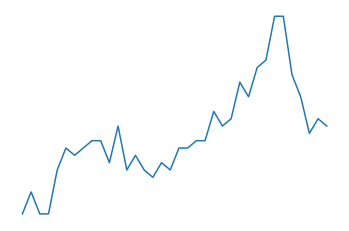

patient 135.0 of 231.0


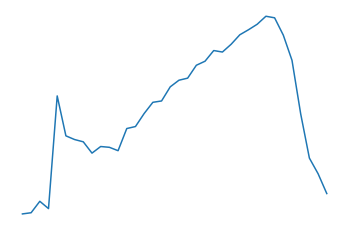


patient 136.0 of 231.0


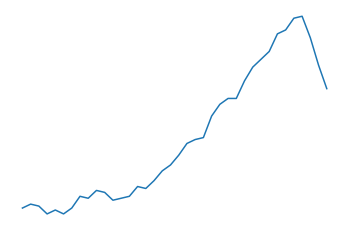

patient 136.0 of 231.0


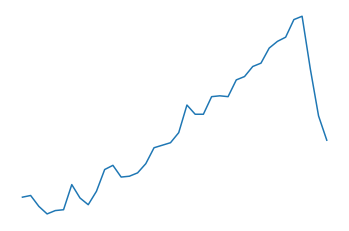

patient 136.0 of 231.0


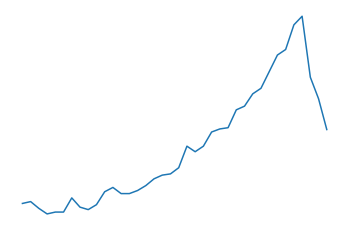

patient 136.0 of 231.0


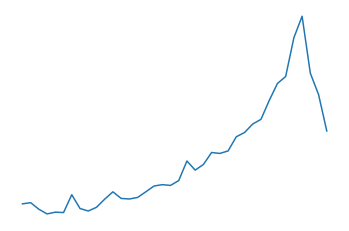

patient 136.0 of 231.0


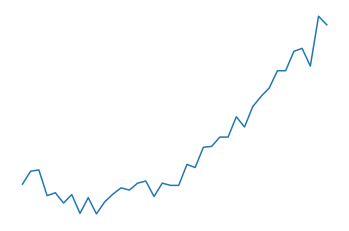

patient 136.0 of 231.0


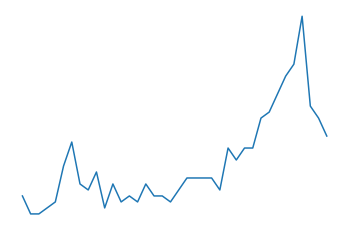

patient 136.0 of 231.0


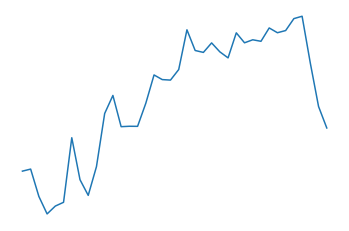


patient 137.0 of 231.0


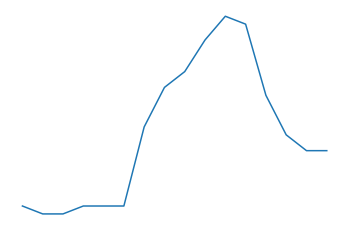

patient 137.0 of 231.0


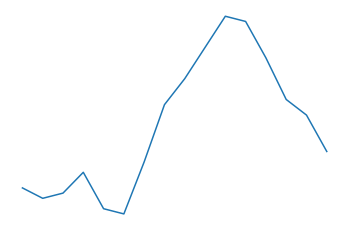

patient 137.0 of 231.0


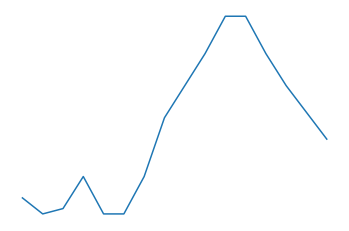

patient 137.0 of 231.0


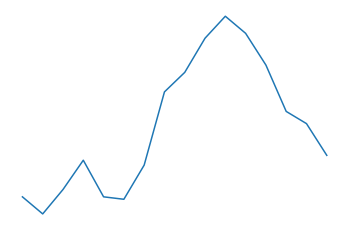

patient 137.0 of 231.0


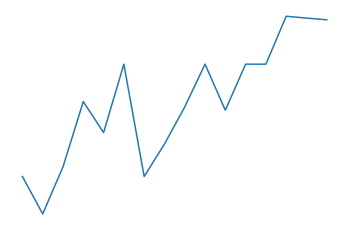

patient 137.0 of 231.0


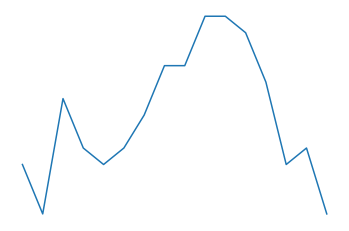

patient 137.0 of 231.0


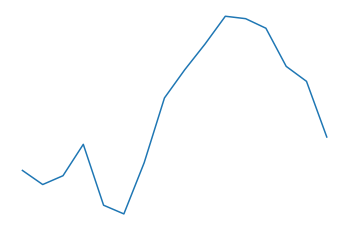


patient 138.0 of 231.0


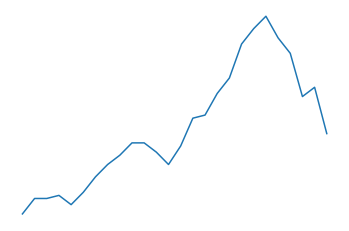

patient 138.0 of 231.0


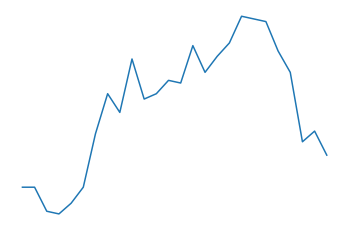

patient 138.0 of 231.0


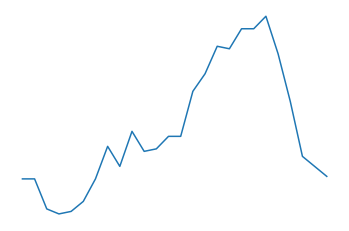

patient 138.0 of 231.0


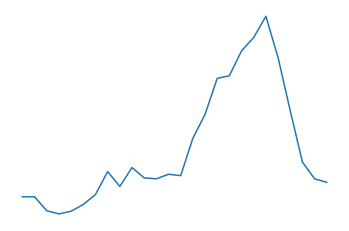

patient 138.0 of 231.0


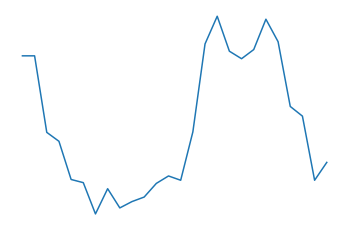

patient 138.0 of 231.0


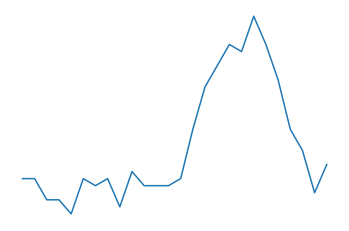

patient 138.0 of 231.0


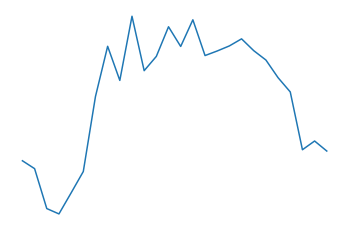


patient 139.0 of 231.0


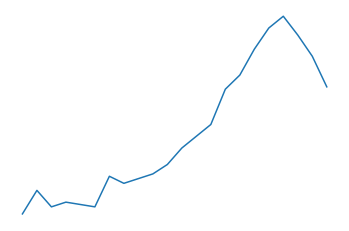

patient 139.0 of 231.0


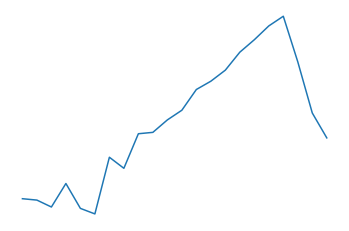

patient 139.0 of 231.0


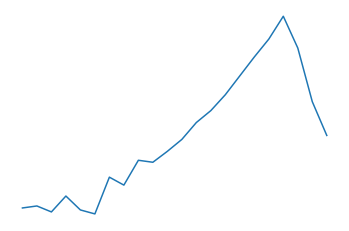

patient 139.0 of 231.0


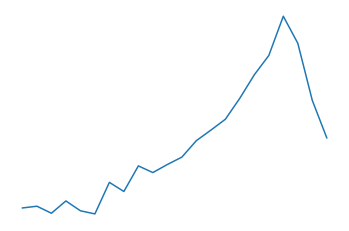

patient 139.0 of 231.0


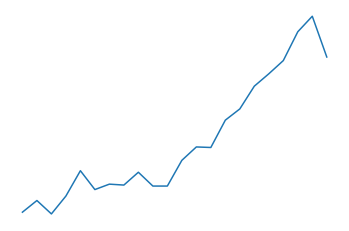

patient 139.0 of 231.0


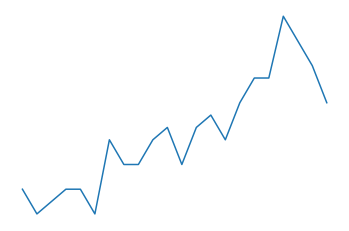

patient 139.0 of 231.0


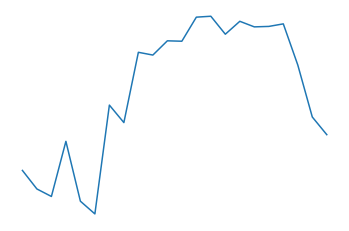


patient 140.0 of 231.0


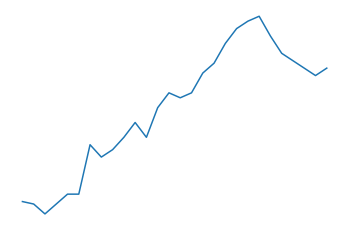

patient 140.0 of 231.0


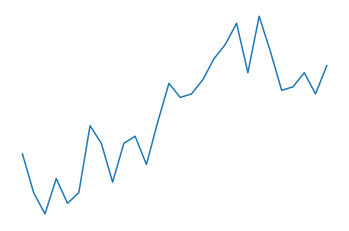

patient 140.0 of 231.0


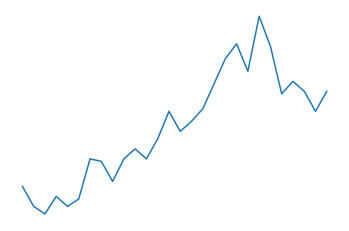

patient 140.0 of 231.0


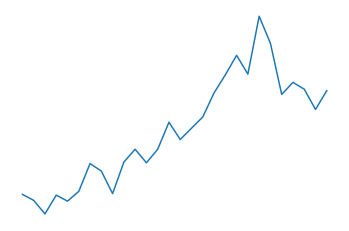

patient 140.0 of 231.0


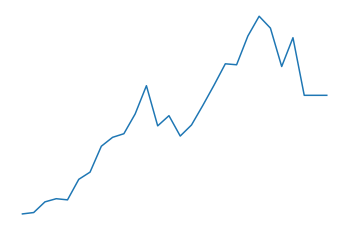

patient 140.0 of 231.0


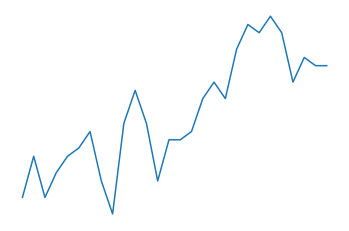

patient 140.0 of 231.0


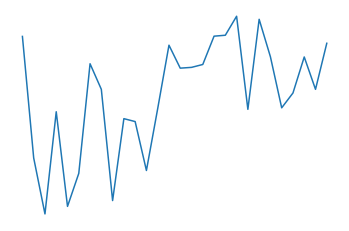


patient 141.0 of 231.0


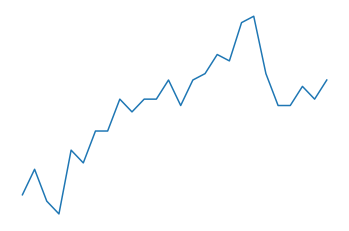

patient 141.0 of 231.0


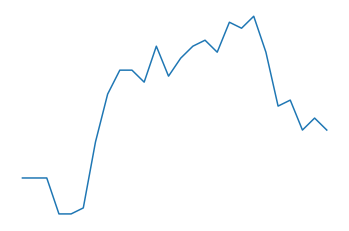

patient 141.0 of 231.0


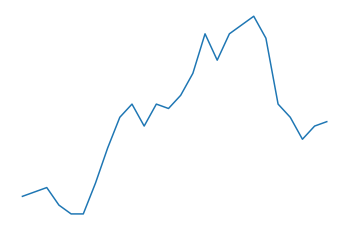

patient 141.0 of 231.0


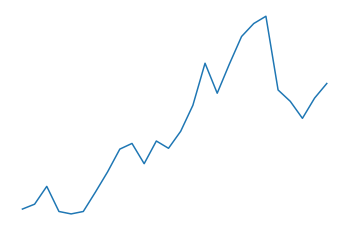

patient 141.0 of 231.0


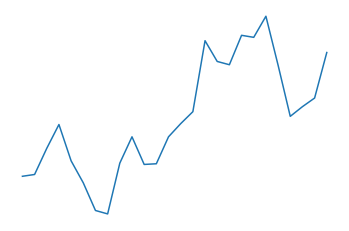

patient 141.0 of 231.0


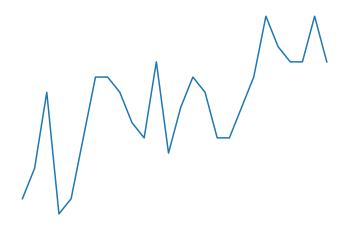

patient 141.0 of 231.0


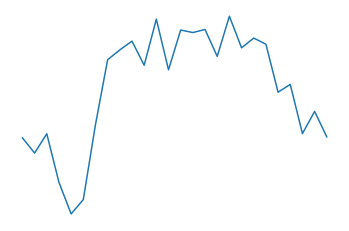


patient 142.0 of 231.0


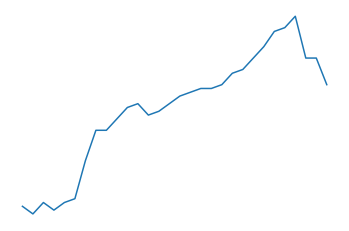

patient 142.0 of 231.0


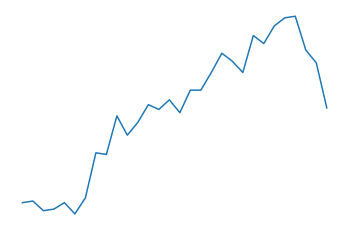

patient 142.0 of 231.0


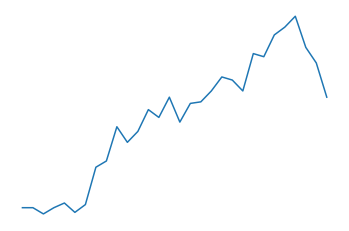

patient 142.0 of 231.0


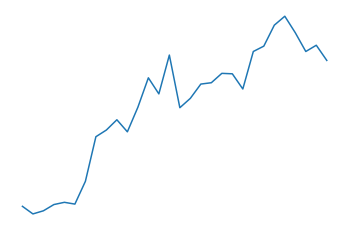

patient 142.0 of 231.0


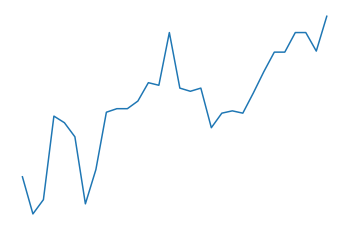

patient 142.0 of 231.0


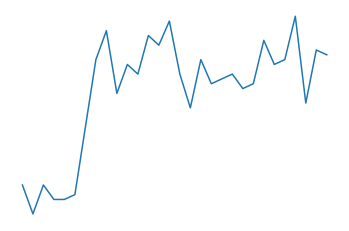

patient 142.0 of 231.0


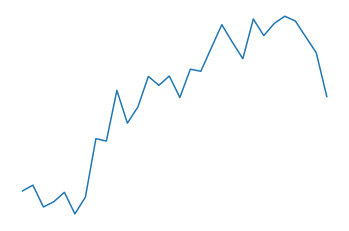


patient 143.0 of 231.0


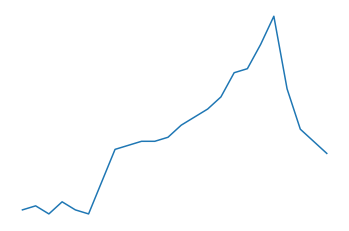

patient 143.0 of 231.0


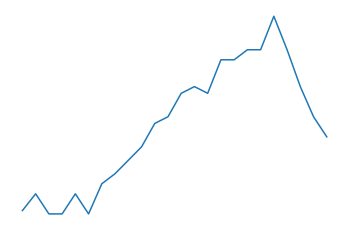

patient 143.0 of 231.0


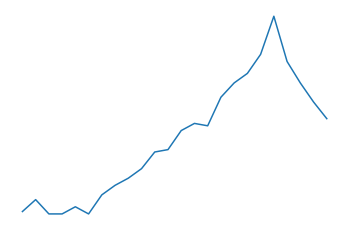

patient 143.0 of 231.0


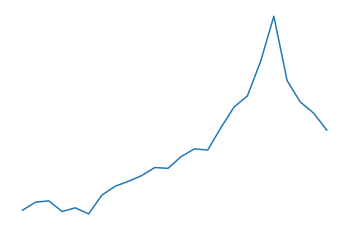

patient 143.0 of 231.0


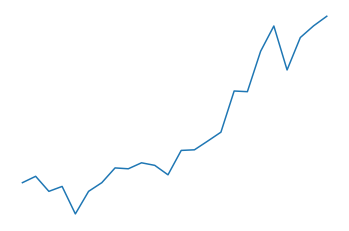

patient 143.0 of 231.0


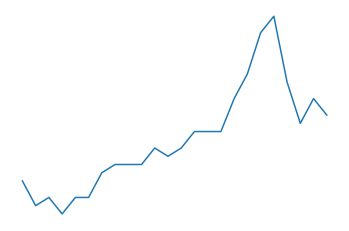

patient 143.0 of 231.0


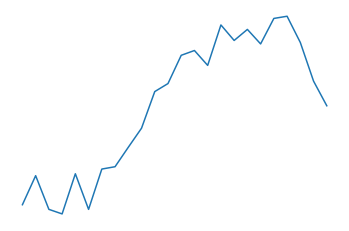


patient 144.0 of 231.0


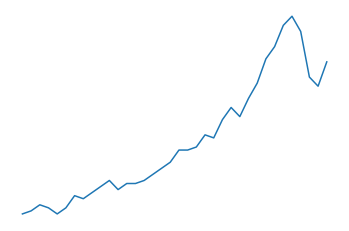

patient 144.0 of 231.0


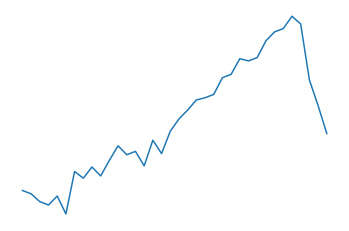

patient 144.0 of 231.0


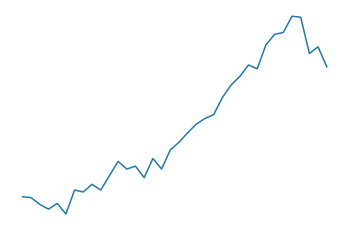

patient 144.0 of 231.0


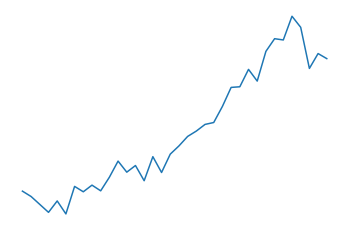

patient 144.0 of 231.0


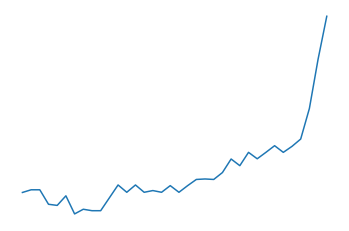

patient 144.0 of 231.0


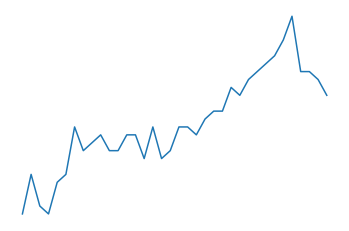

patient 144.0 of 231.0


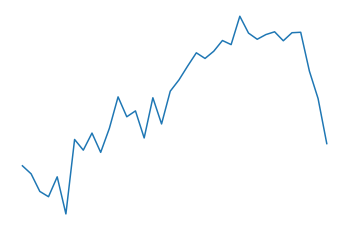


patient 145.0 of 231.0


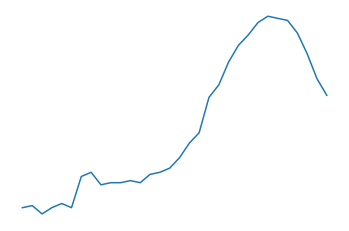

patient 145.0 of 231.0


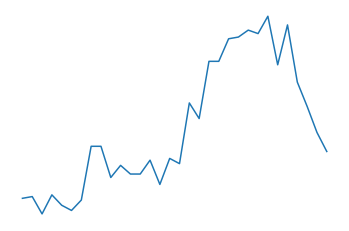

patient 145.0 of 231.0


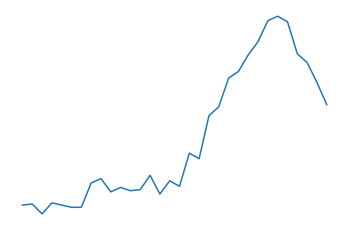

patient 145.0 of 231.0


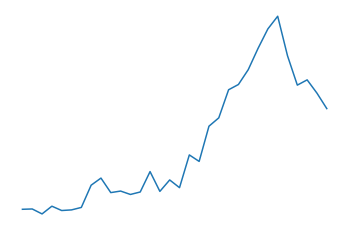

patient 145.0 of 231.0


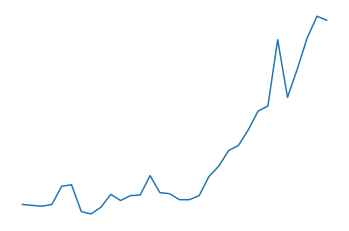

patient 145.0 of 231.0


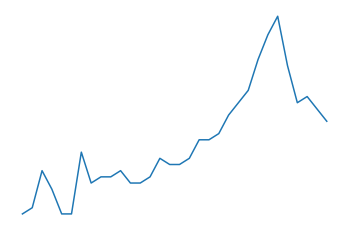

patient 145.0 of 231.0


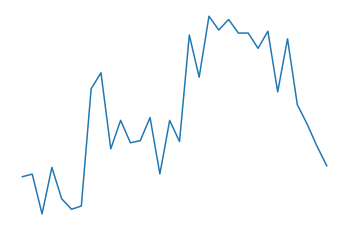


patient 146.0 of 231.0


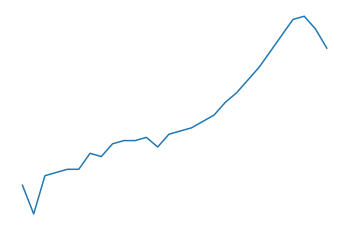

patient 146.0 of 231.0


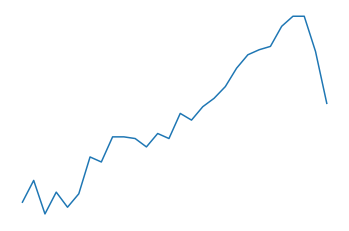

patient 146.0 of 231.0


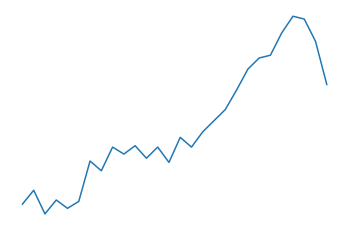

patient 146.0 of 231.0


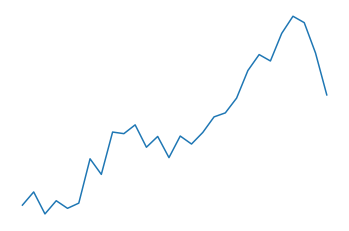

patient 146.0 of 231.0


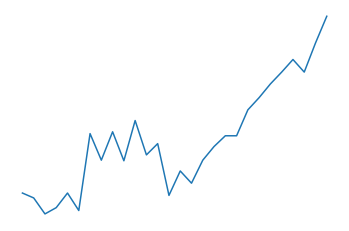

patient 146.0 of 231.0


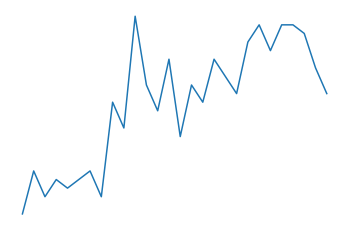

patient 146.0 of 231.0


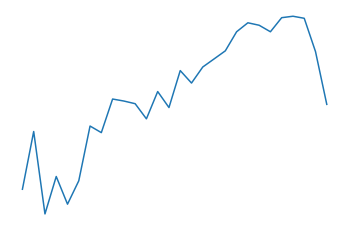


patient 147.0 of 231.0


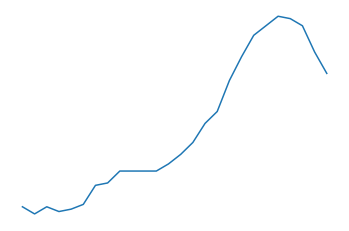

patient 147.0 of 231.0


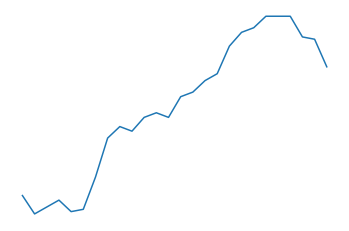

patient 147.0 of 231.0


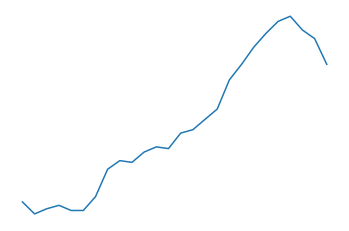

patient 147.0 of 231.0


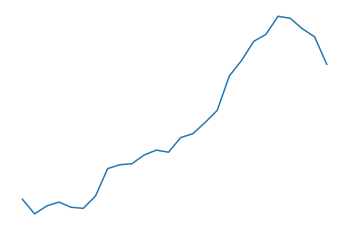

patient 147.0 of 231.0


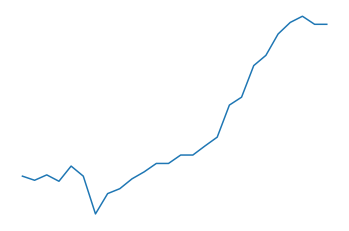

patient 147.0 of 231.0


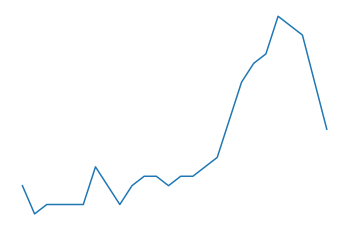

patient 147.0 of 231.0


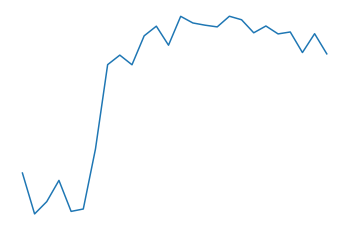


patient 148.1 of 231.0


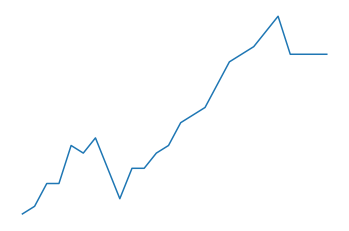

patient 148.1 of 231.0


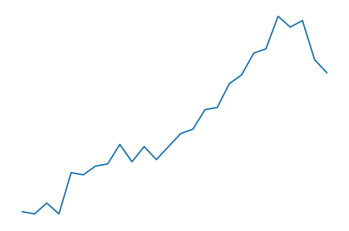

patient 148.1 of 231.0


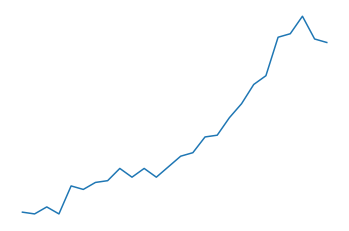

patient 148.1 of 231.0


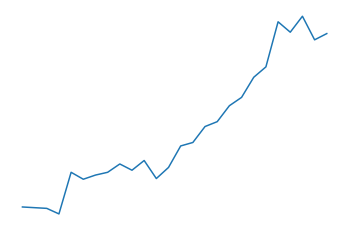

patient 148.1 of 231.0


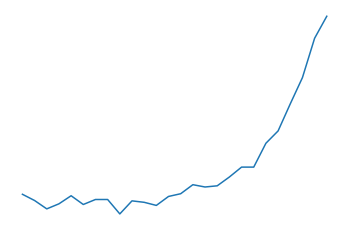

patient 148.1 of 231.0


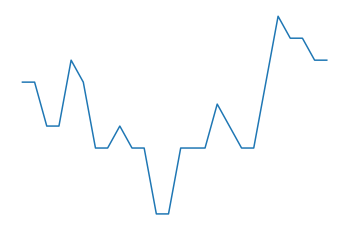

patient 148.1 of 231.0


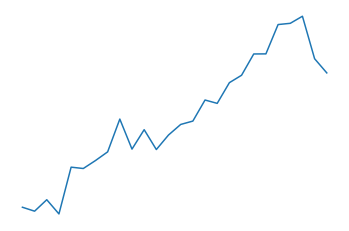


patient 148.2 of 231.0


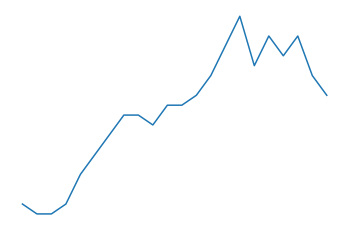

patient 148.2 of 231.0


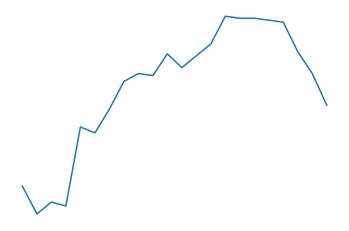

patient 148.2 of 231.0


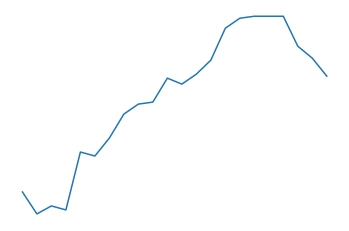

patient 148.2 of 231.0


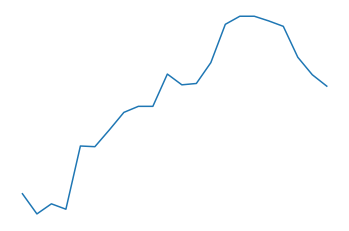

patient 148.2 of 231.0


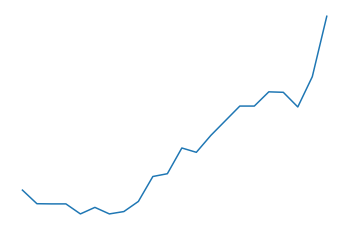

patient 148.2 of 231.0


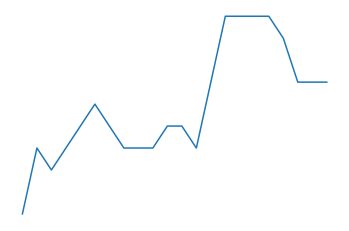

patient 148.2 of 231.0


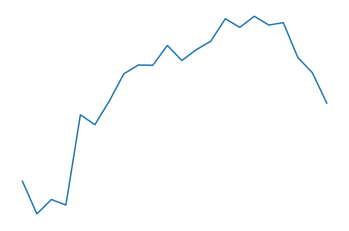


patient 149.0 of 231.0


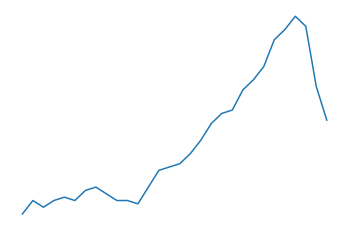

patient 149.0 of 231.0


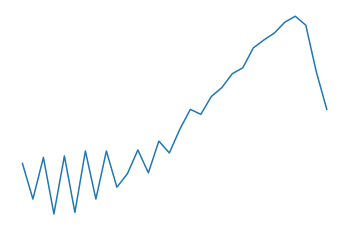

patient 149.0 of 231.0


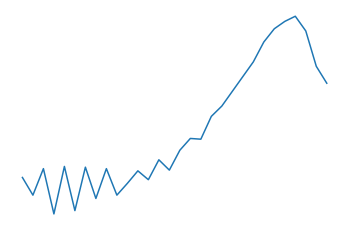

patient 149.0 of 231.0


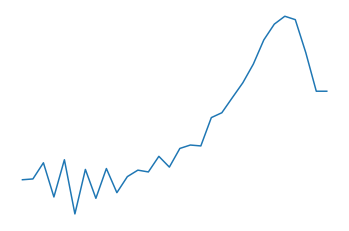

patient 149.0 of 231.0


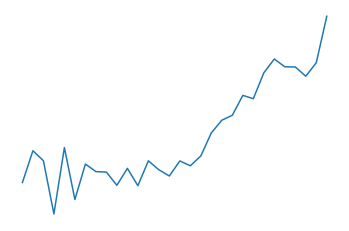

patient 149.0 of 231.0


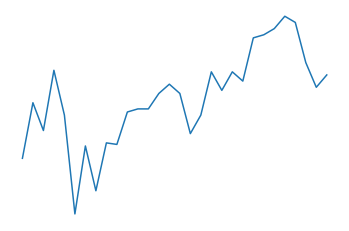

patient 149.0 of 231.0


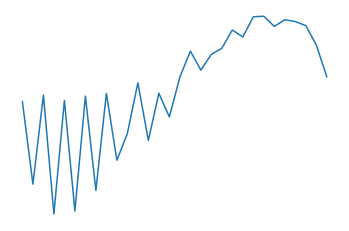


patient 150.0 of 231.0


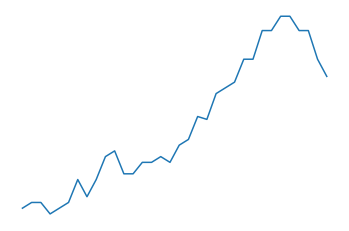

patient 150.0 of 231.0


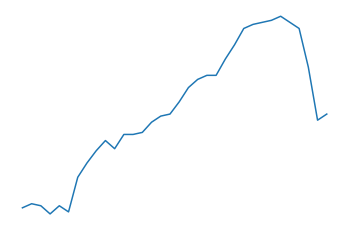

patient 150.0 of 231.0


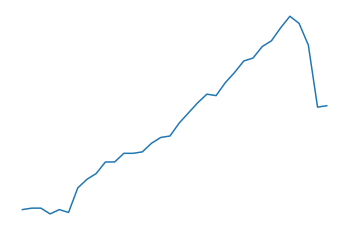

patient 150.0 of 231.0


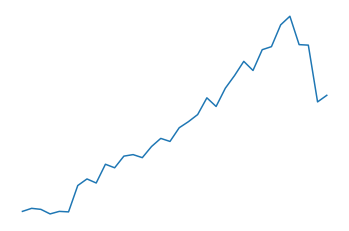

patient 150.0 of 231.0


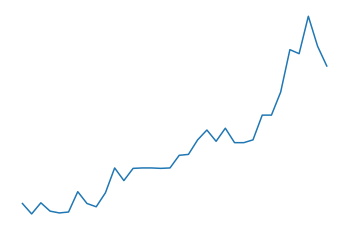

patient 150.0 of 231.0


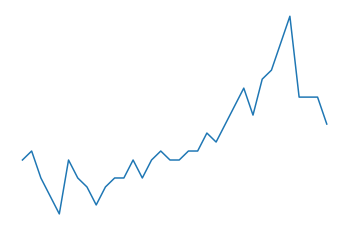

patient 150.0 of 231.0


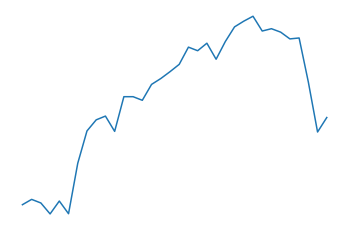


patient 151.0 of 231.0


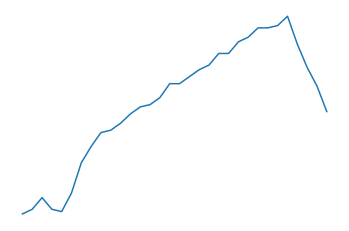

patient 151.0 of 231.0


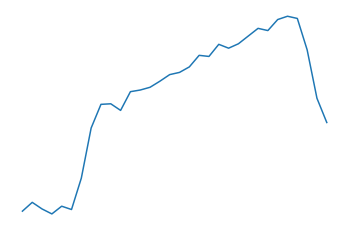

patient 151.0 of 231.0


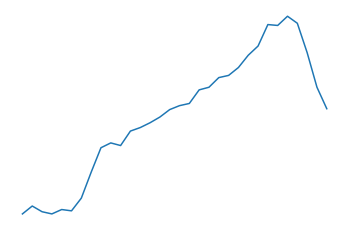

patient 151.0 of 231.0


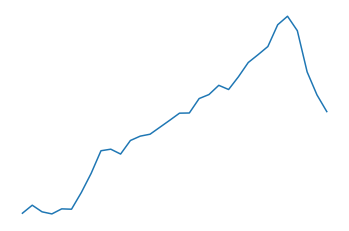

patient 151.0 of 231.0


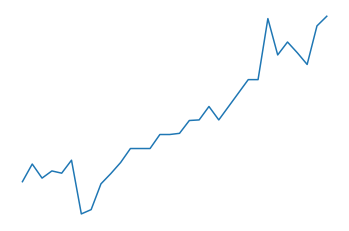

patient 151.0 of 231.0


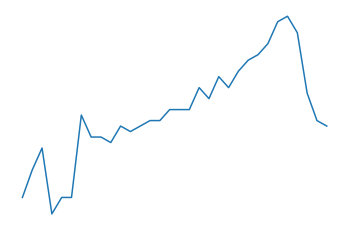

patient 151.0 of 231.0


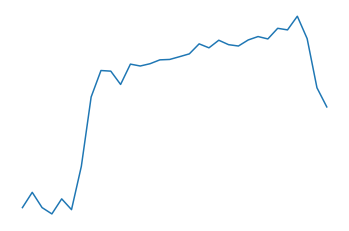


patient 152.1 of 231.0


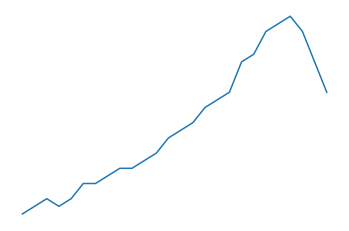

patient 152.1 of 231.0


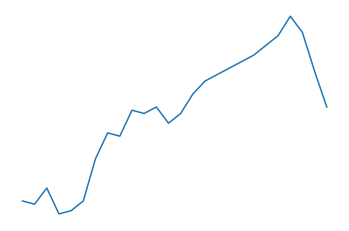

patient 152.1 of 231.0


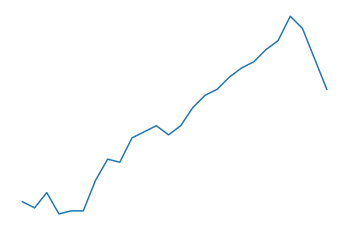

patient 152.1 of 231.0


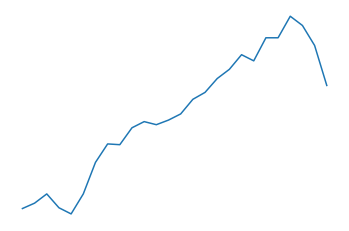

patient 152.1 of 231.0


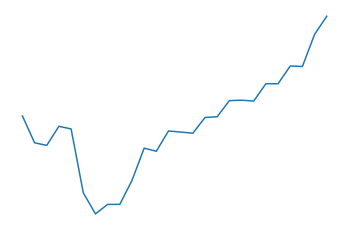

patient 152.1 of 231.0


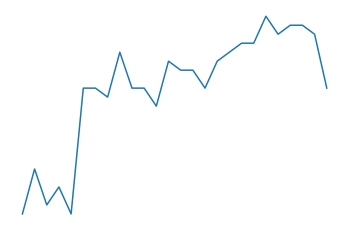

patient 152.1 of 231.0


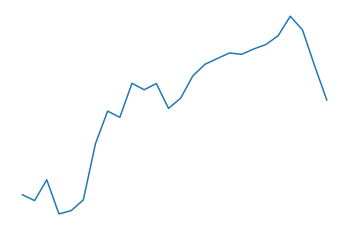


patient 152.2 of 231.0


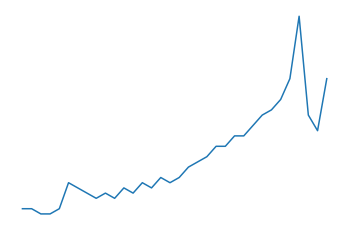

patient 152.2 of 231.0


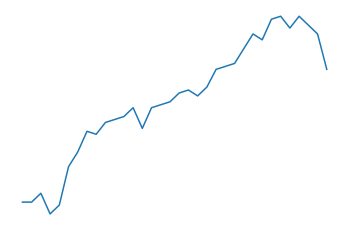

patient 152.2 of 231.0


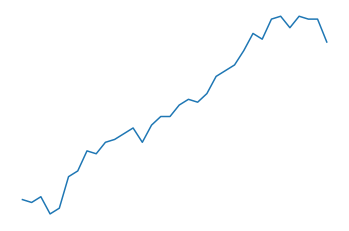

patient 152.2 of 231.0


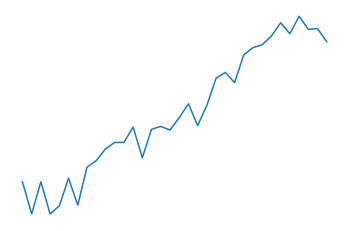

patient 152.2 of 231.0


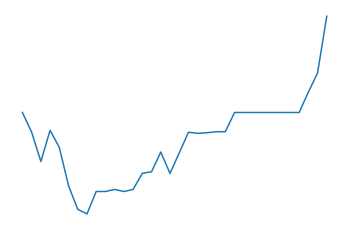

patient 152.2 of 231.0


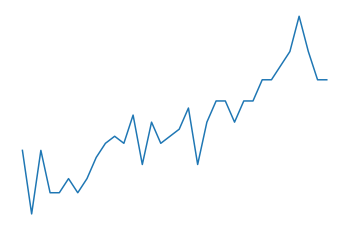

patient 152.2 of 231.0


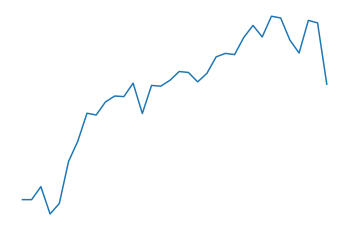


patient 153.0 of 231.0


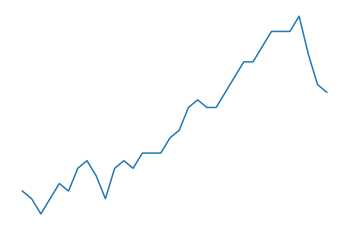

patient 153.0 of 231.0


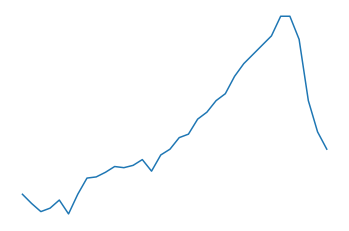

patient 153.0 of 231.0


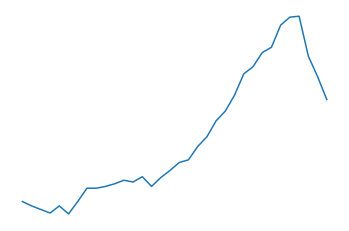

patient 153.0 of 231.0


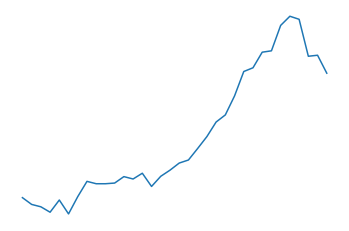

patient 153.0 of 231.0


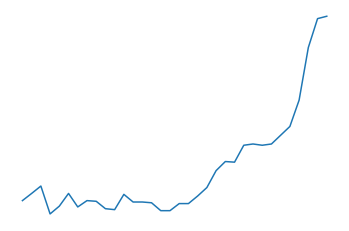

patient 153.0 of 231.0


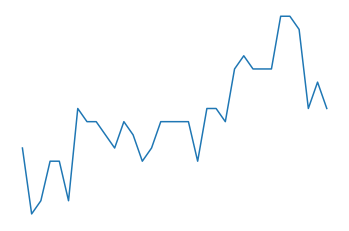

patient 153.0 of 231.0


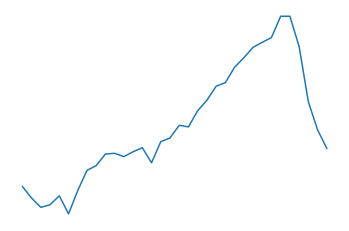


patient 154.0 of 231.0


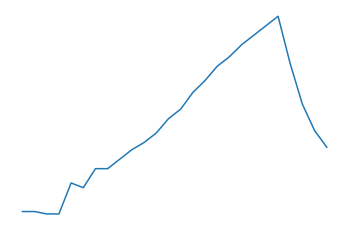

patient 154.0 of 231.0


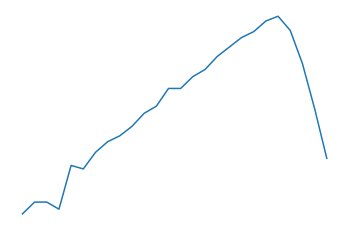

patient 154.0 of 231.0


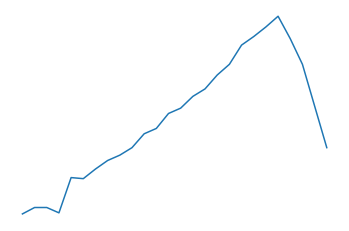

patient 154.0 of 231.0


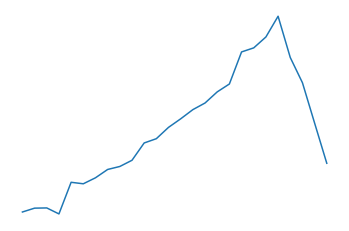

patient 154.0 of 231.0


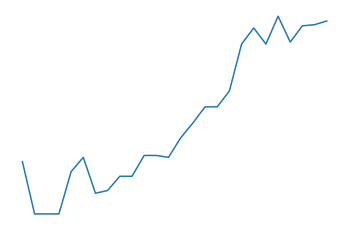

patient 154.0 of 231.0


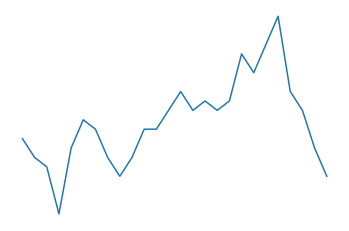

patient 154.0 of 231.0


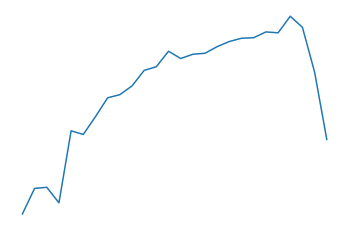


patient 155.0 of 231.0


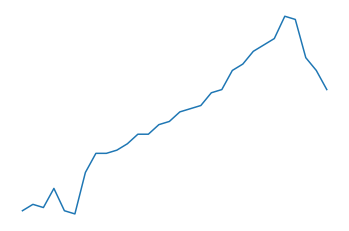

patient 155.0 of 231.0


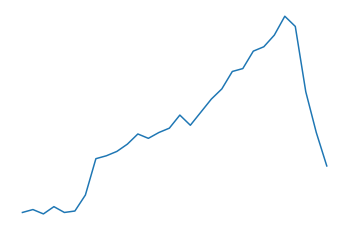

patient 155.0 of 231.0


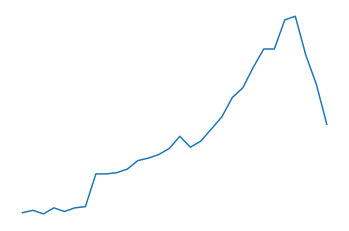

patient 155.0 of 231.0


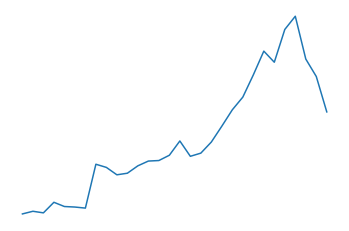

patient 155.0 of 231.0


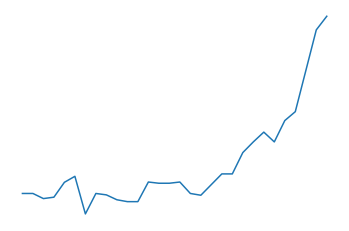

patient 155.0 of 231.0


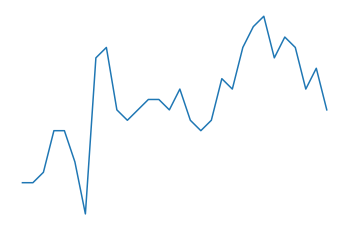

patient 155.0 of 231.0


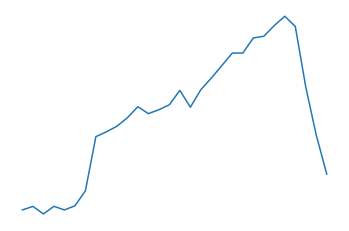


patient 156.0 of 231.0


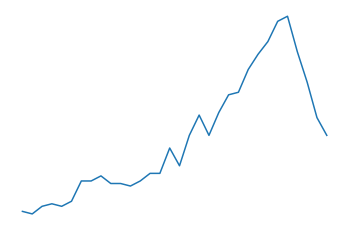

patient 156.0 of 231.0


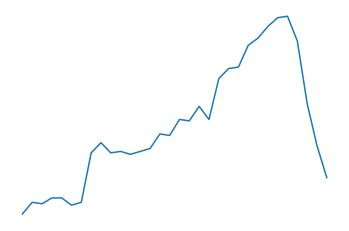

patient 156.0 of 231.0


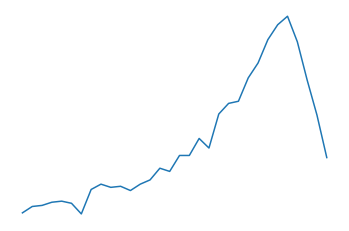

patient 156.0 of 231.0


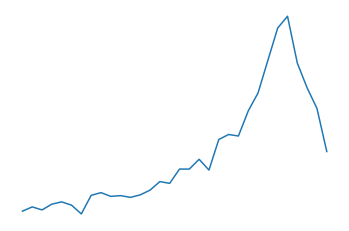

patient 156.0 of 231.0


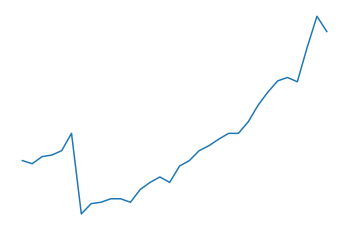

patient 156.0 of 231.0


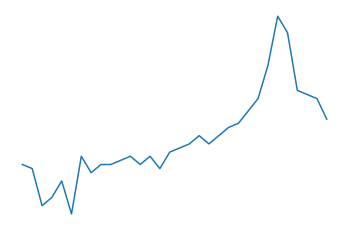

patient 156.0 of 231.0


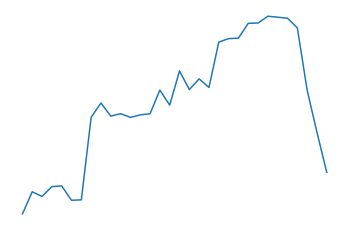


patient 157.0 of 231.0


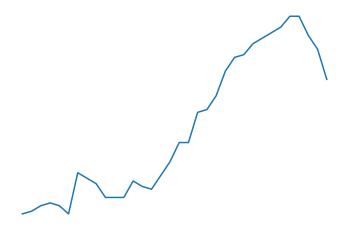

patient 157.0 of 231.0


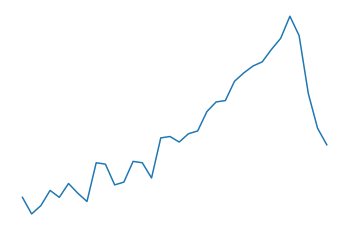

patient 157.0 of 231.0


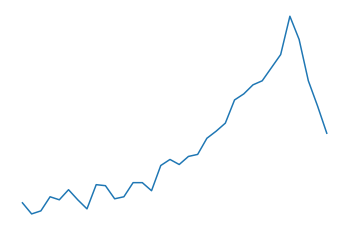

patient 157.0 of 231.0


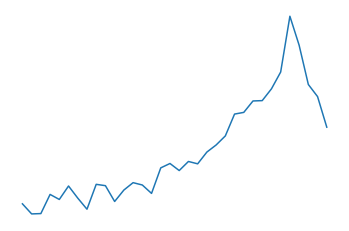

patient 157.0 of 231.0


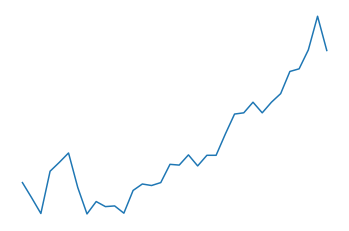

patient 157.0 of 231.0


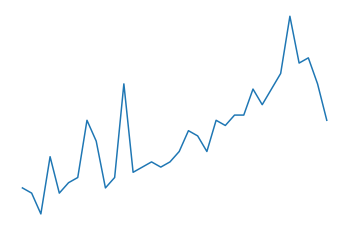

patient 157.0 of 231.0


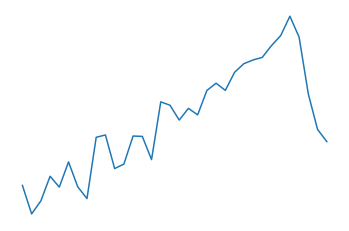


patient 158.0 of 231.0


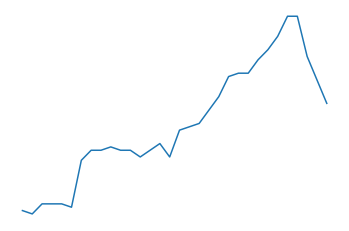

patient 158.0 of 231.0


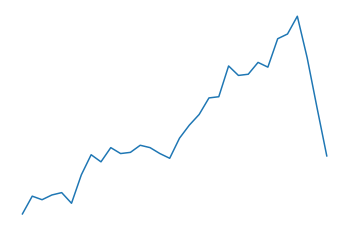

patient 158.0 of 231.0


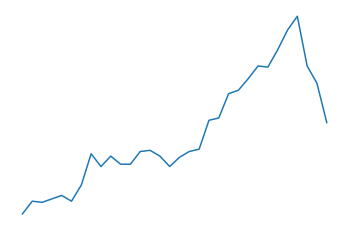

patient 158.0 of 231.0


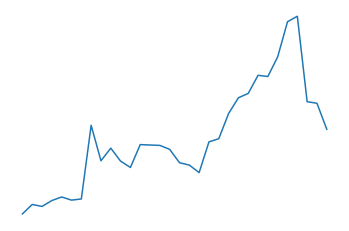

patient 158.0 of 231.0


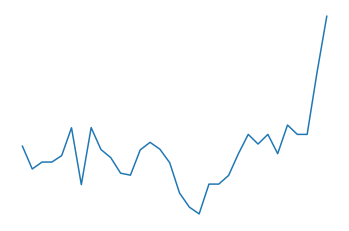

patient 158.0 of 231.0


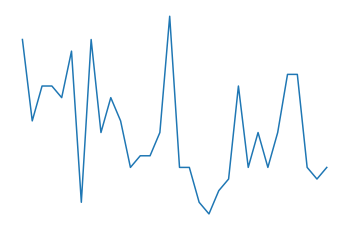

patient 158.0 of 231.0


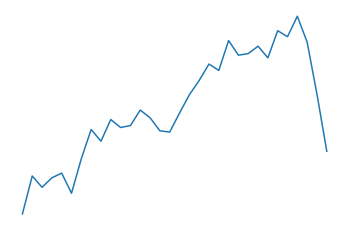


patient 159.0 of 231.0


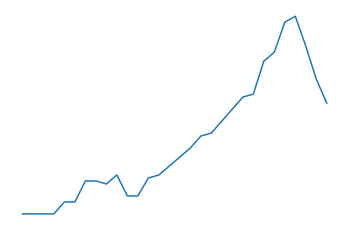

patient 159.0 of 231.0


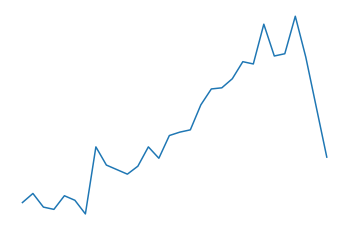

patient 159.0 of 231.0


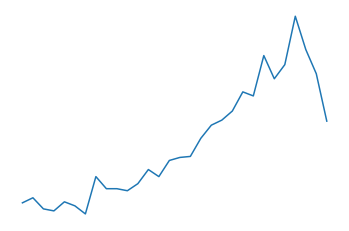

patient 159.0 of 231.0


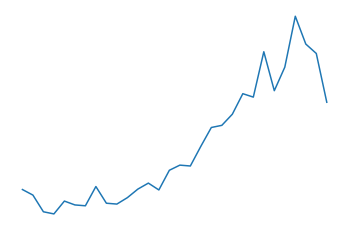

patient 159.0 of 231.0


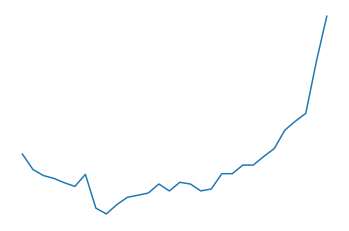

patient 159.0 of 231.0


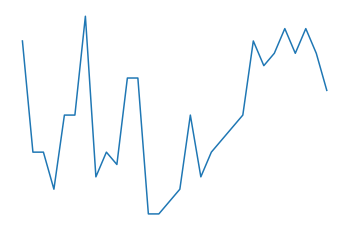

patient 159.0 of 231.0


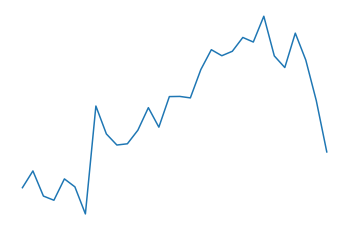


patient 160.0 of 231.0


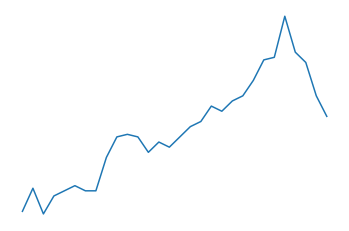

patient 160.0 of 231.0


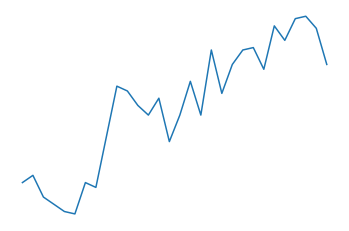

patient 160.0 of 231.0


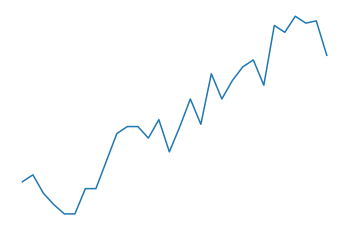

patient 160.0 of 231.0


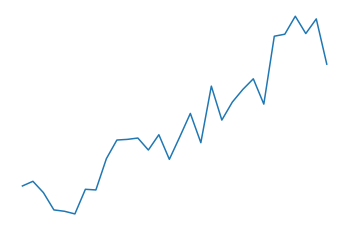

patient 160.0 of 231.0


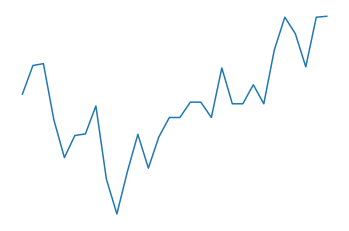

patient 160.0 of 231.0


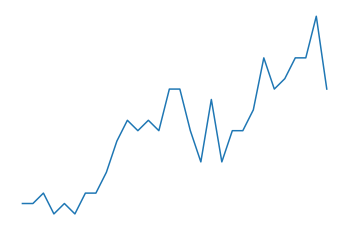

patient 160.0 of 231.0


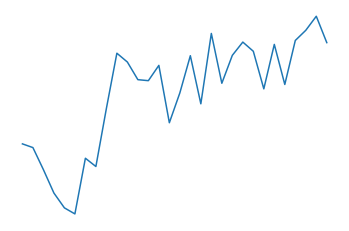


patient 161.0 of 231.0


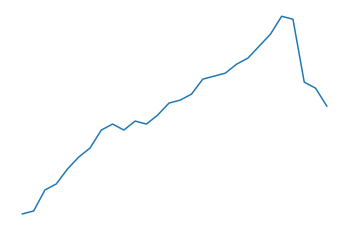

patient 161.0 of 231.0


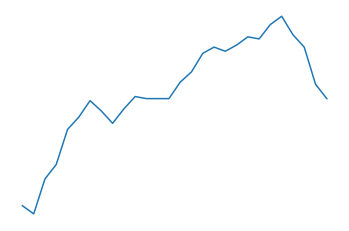

patient 161.0 of 231.0


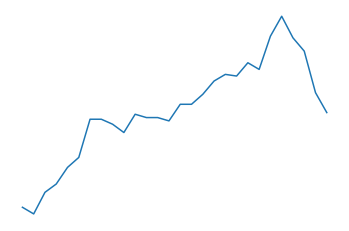

patient 161.0 of 231.0


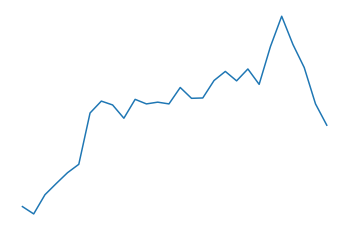

patient 161.0 of 231.0


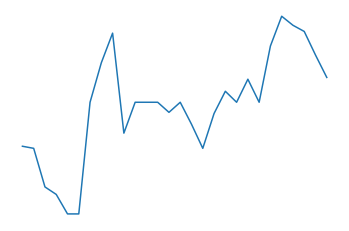

patient 161.0 of 231.0


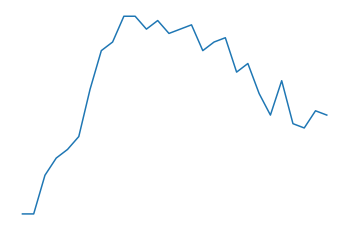

patient 161.0 of 231.0


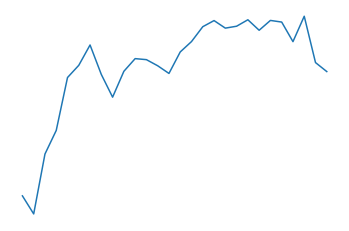


patient 162.0 of 231.0


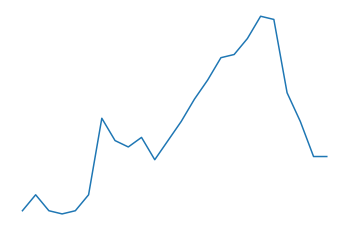

patient 162.0 of 231.0


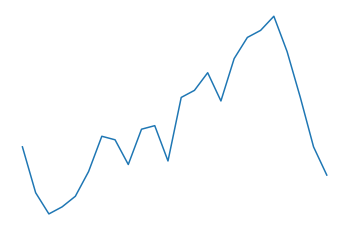

patient 162.0 of 231.0


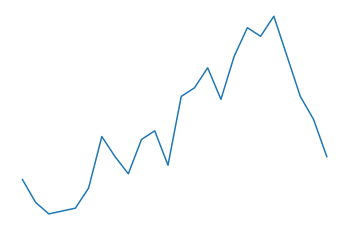

patient 162.0 of 231.0


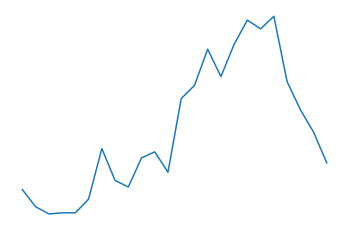

patient 162.0 of 231.0


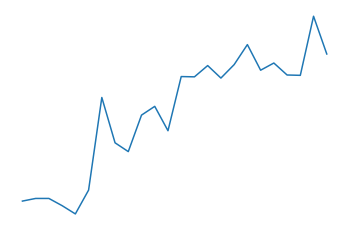

patient 162.0 of 231.0


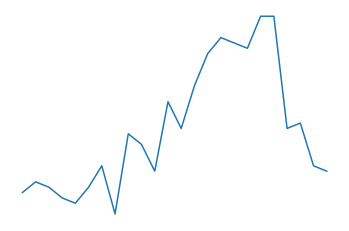

patient 162.0 of 231.0


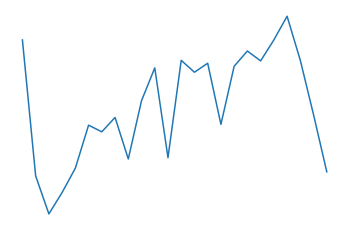


patient 163.0 of 231.0


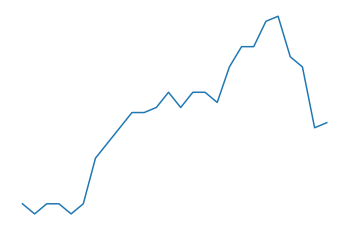

patient 163.0 of 231.0


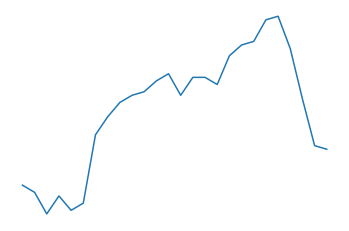

patient 163.0 of 231.0


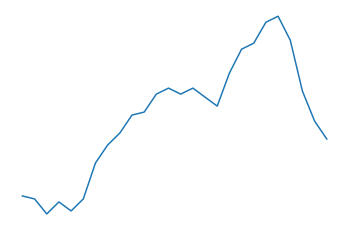

patient 163.0 of 231.0


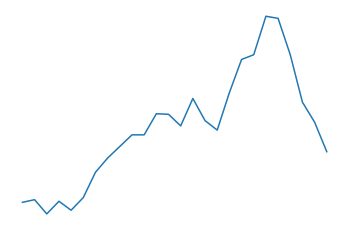

patient 163.0 of 231.0


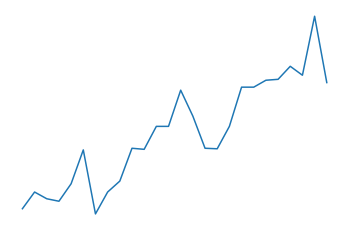

patient 163.0 of 231.0


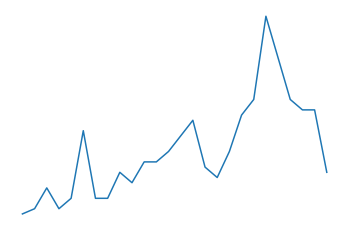

patient 163.0 of 231.0


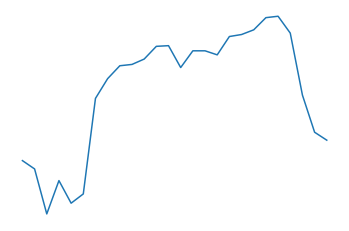


patient 164.0 of 231.0


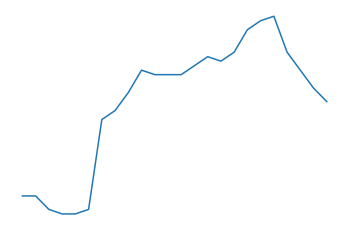

patient 164.0 of 231.0


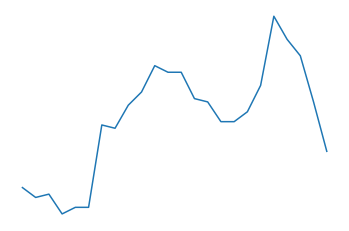

patient 164.0 of 231.0


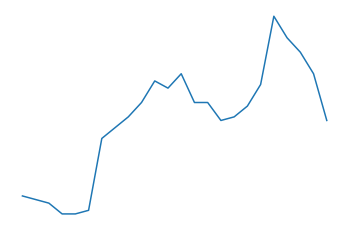

patient 164.0 of 231.0


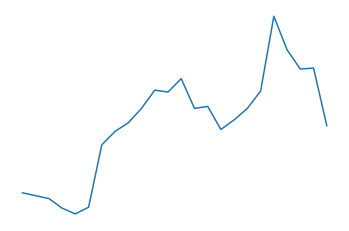

patient 164.0 of 231.0


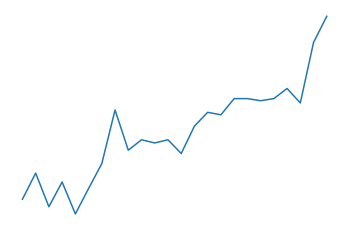

patient 164.0 of 231.0


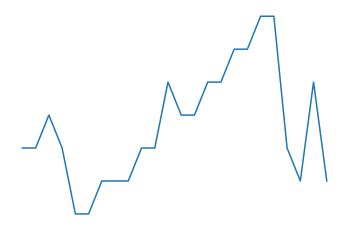

patient 164.0 of 231.0


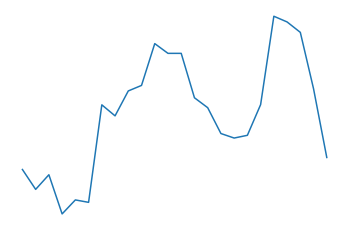


patient 165.0 of 231.0


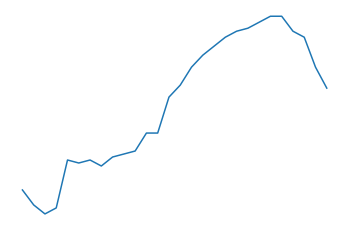

patient 165.0 of 231.0


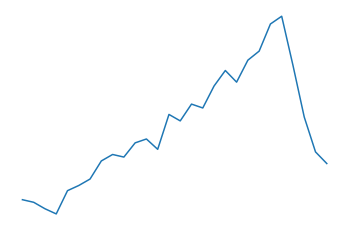

patient 165.0 of 231.0


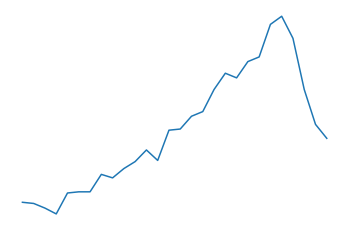

patient 165.0 of 231.0


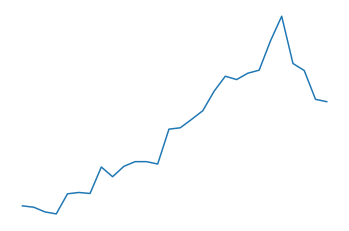

patient 165.0 of 231.0


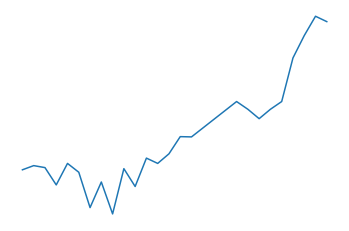

patient 165.0 of 231.0


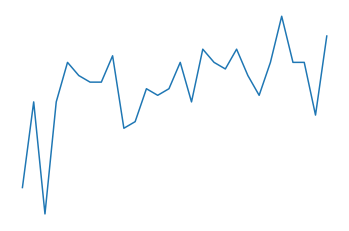

patient 165.0 of 231.0


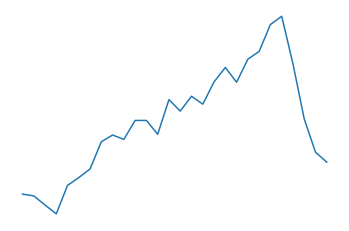


patient 166.0 of 231.0


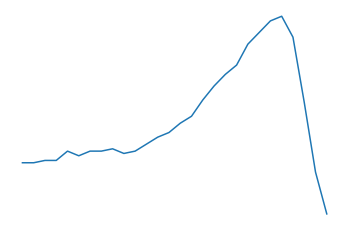

patient 166.0 of 231.0


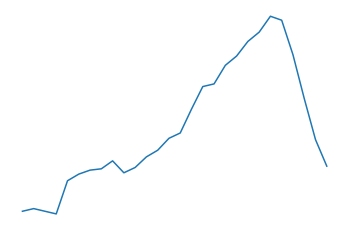

patient 166.0 of 231.0


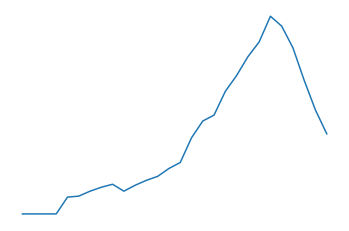

patient 166.0 of 231.0


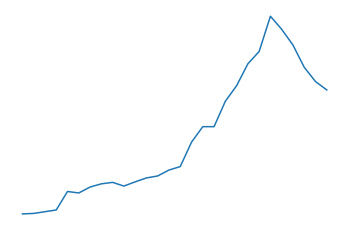

patient 166.0 of 231.0


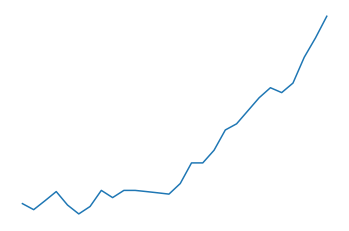

patient 166.0 of 231.0


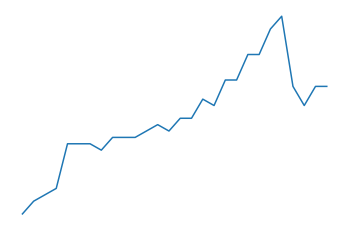

patient 166.0 of 231.0


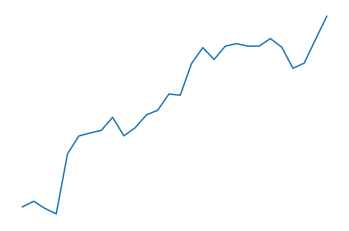


patient 167.0 of 231.0


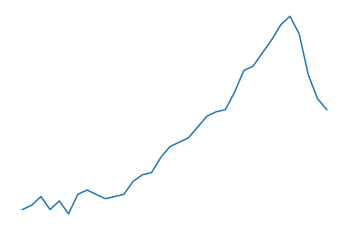

patient 167.0 of 231.0


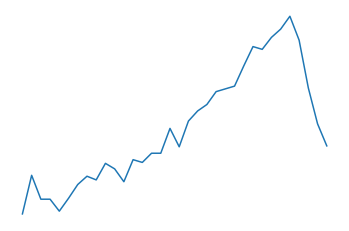

patient 167.0 of 231.0


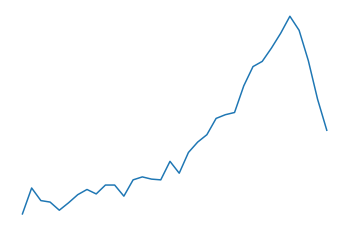

patient 167.0 of 231.0


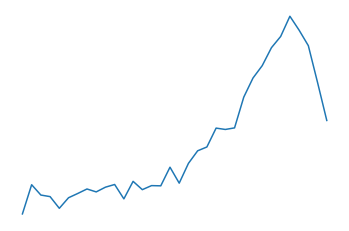

patient 167.0 of 231.0


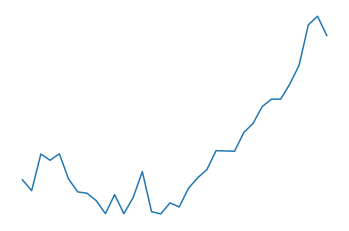

patient 167.0 of 231.0


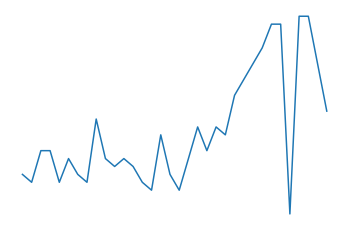

patient 167.0 of 231.0


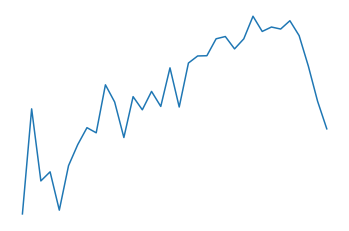


patient 168.0 of 231.0


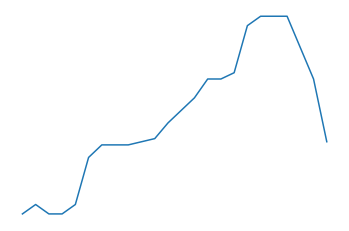

patient 168.0 of 231.0


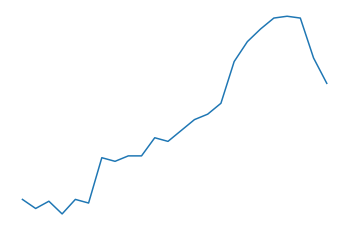

patient 168.0 of 231.0


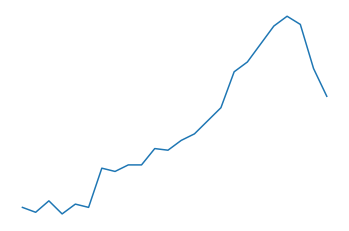

patient 168.0 of 231.0


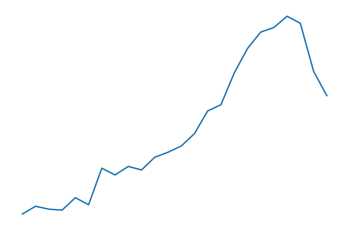

patient 168.0 of 231.0


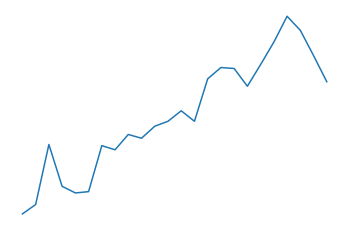

patient 168.0 of 231.0


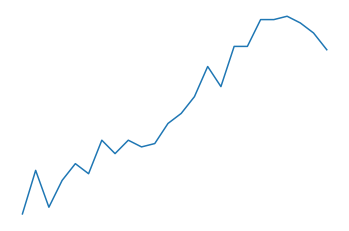

patient 168.0 of 231.0


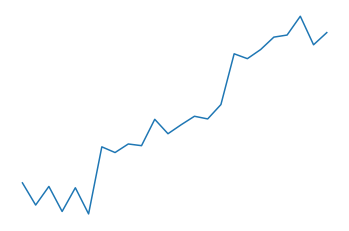


patient 169.0 of 231.0


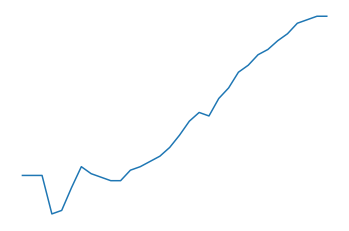

patient 169.0 of 231.0


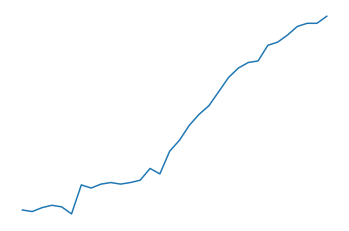

patient 169.0 of 231.0


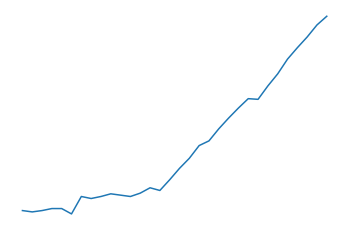

patient 169.0 of 231.0


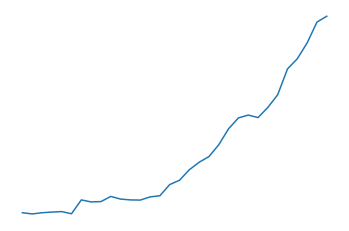

patient 169.0 of 231.0


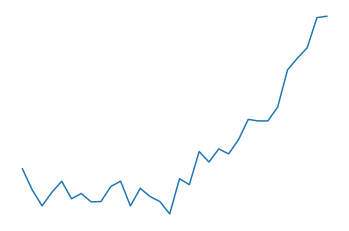

patient 169.0 of 231.0


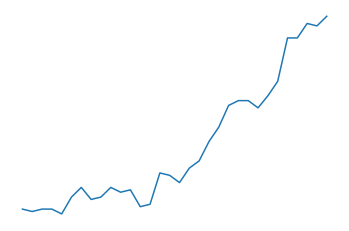

patient 169.0 of 231.0


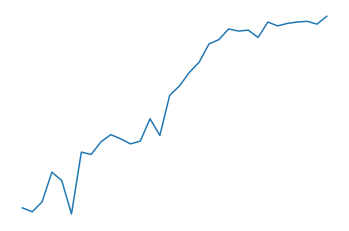


patient 170.0 of 231.0


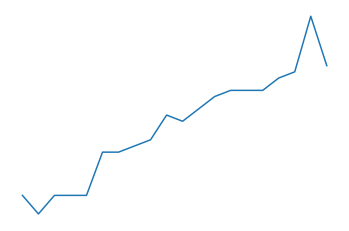

patient 170.0 of 231.0


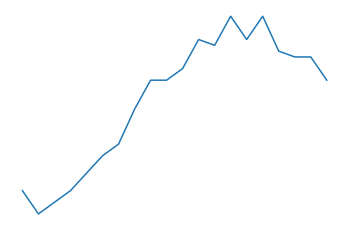

patient 170.0 of 231.0


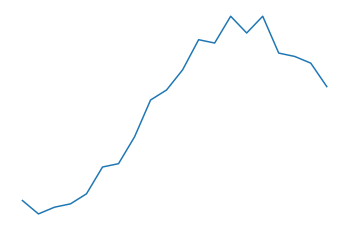

patient 170.0 of 231.0


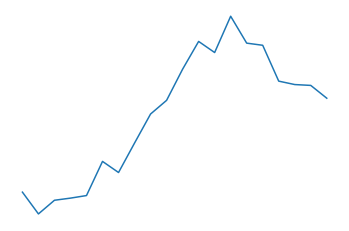

patient 170.0 of 231.0


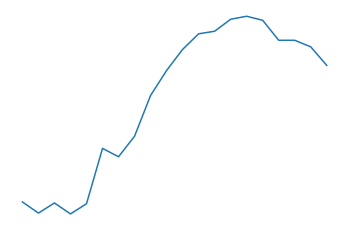

patient 170.0 of 231.0


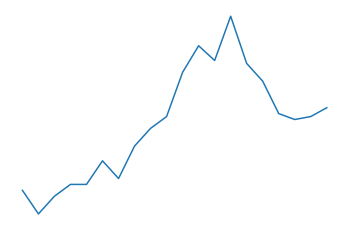

patient 170.0 of 231.0


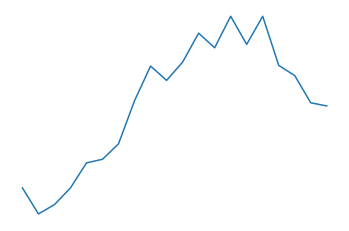


patient 171.0 of 231.0


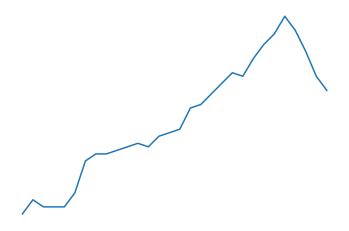

patient 171.0 of 231.0


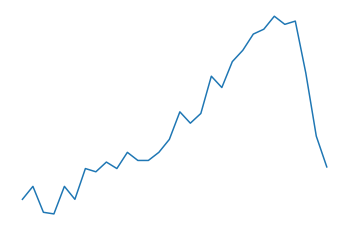

patient 171.0 of 231.0


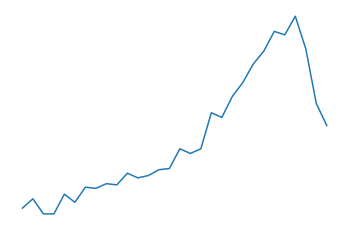

patient 171.0 of 231.0


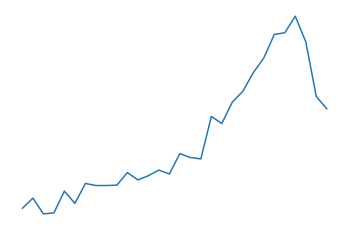

patient 171.0 of 231.0


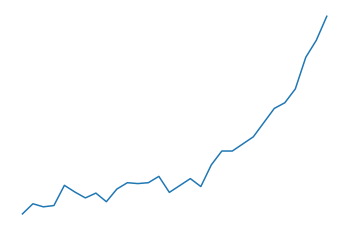

patient 171.0 of 231.0


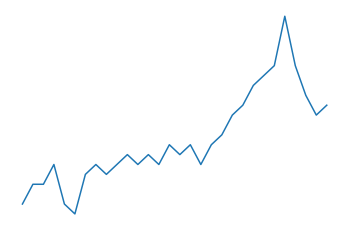

patient 171.0 of 231.0


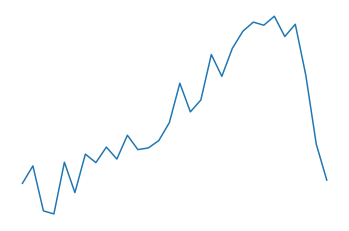


patient 172.0 of 231.0


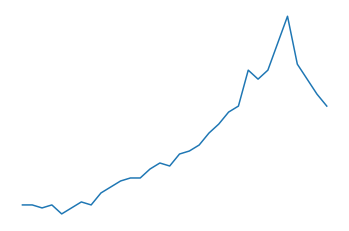

patient 172.0 of 231.0


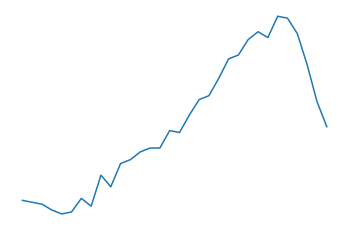

patient 172.0 of 231.0


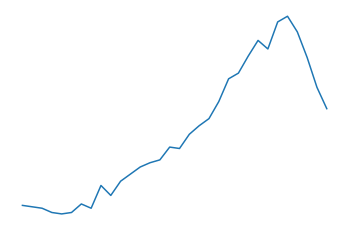

patient 172.0 of 231.0


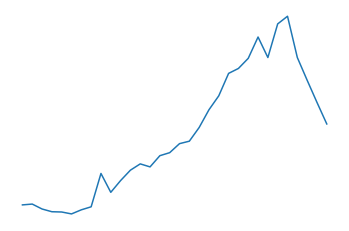

patient 172.0 of 231.0


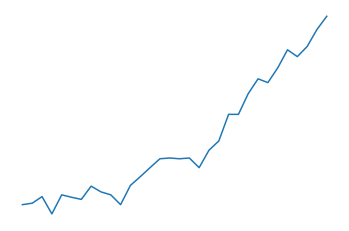

patient 172.0 of 231.0


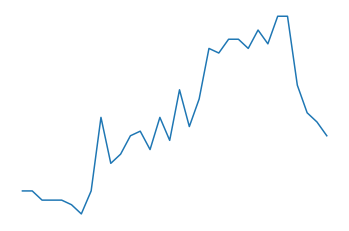

patient 172.0 of 231.0


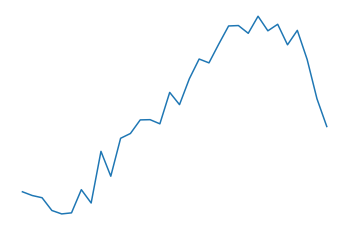


patient 173.0 of 231.0


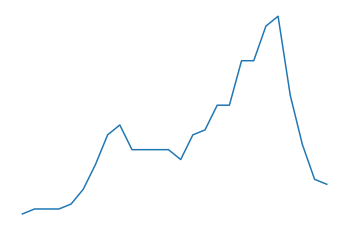

patient 173.0 of 231.0


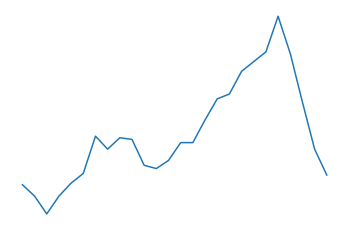

patient 173.0 of 231.0


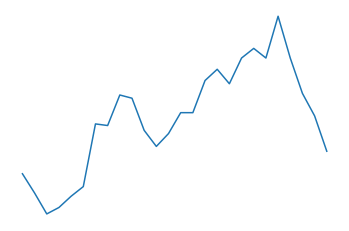

patient 173.0 of 231.0


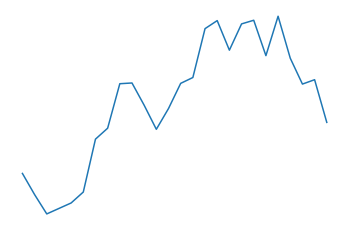

patient 173.0 of 231.0


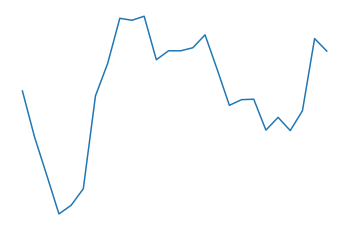

patient 173.0 of 231.0


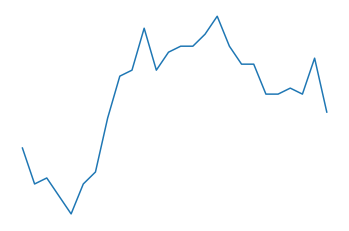

patient 173.0 of 231.0


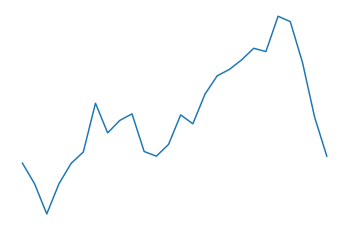


patient 174.0 of 231.0


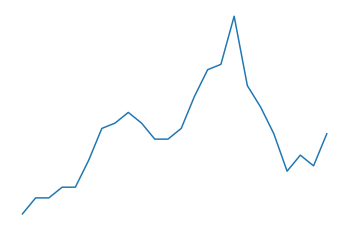

patient 174.0 of 231.0


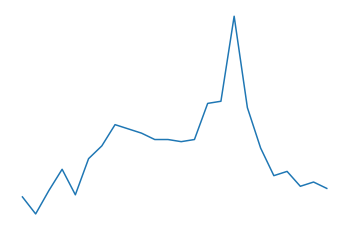

patient 174.0 of 231.0


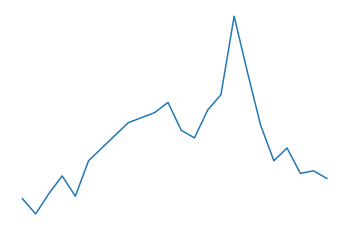

patient 174.0 of 231.0


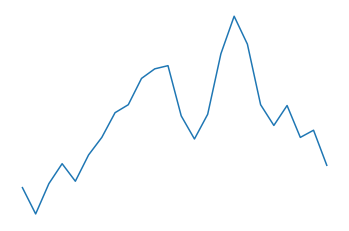

patient 174.0 of 231.0


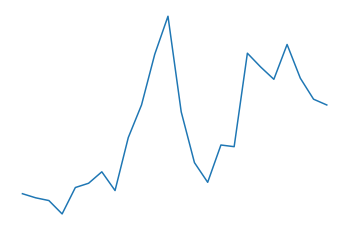

patient 174.0 of 231.0


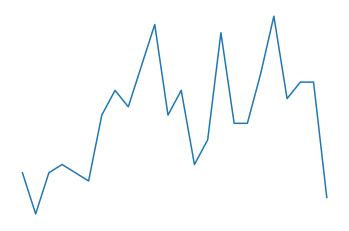

patient 174.0 of 231.0


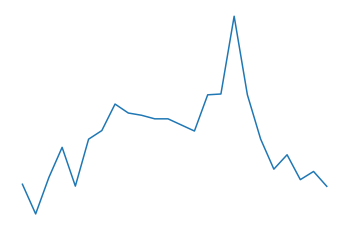


patient 175.0 of 231.0


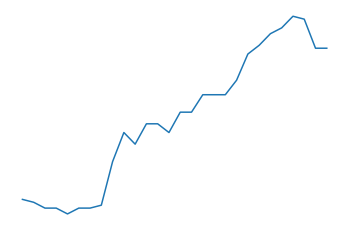

patient 175.0 of 231.0


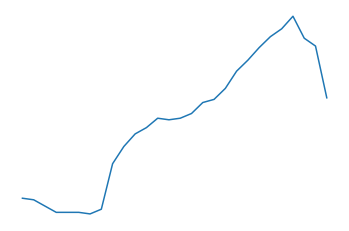

patient 175.0 of 231.0


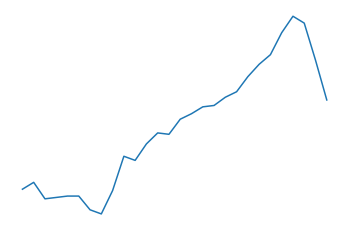

patient 175.0 of 231.0


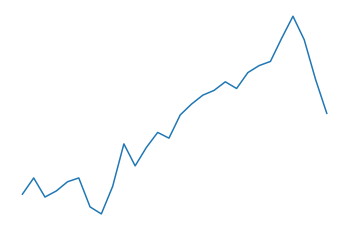

patient 175.0 of 231.0


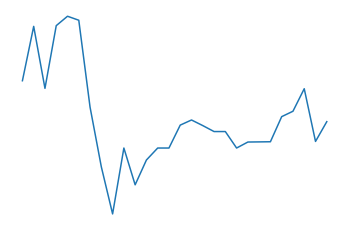

patient 175.0 of 231.0


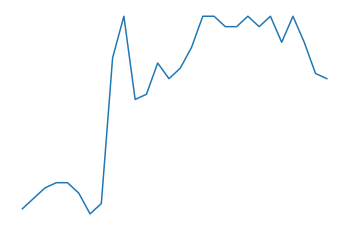

patient 175.0 of 231.0


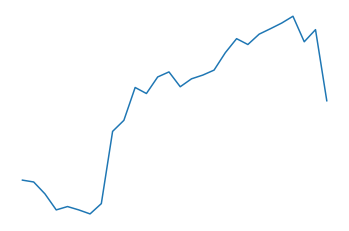


patient 176.0 of 231.0


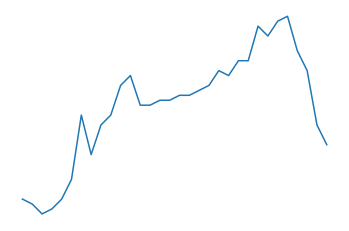

patient 176.0 of 231.0


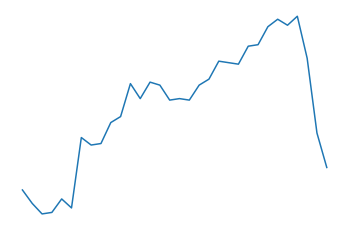

patient 176.0 of 231.0


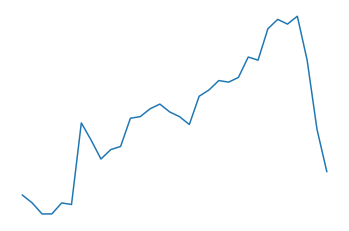

patient 176.0 of 231.0


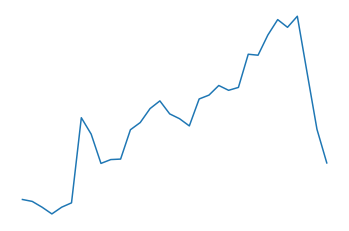

patient 176.0 of 231.0


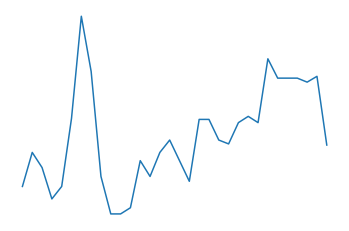

patient 176.0 of 231.0


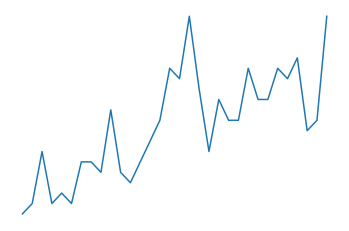

patient 176.0 of 231.0


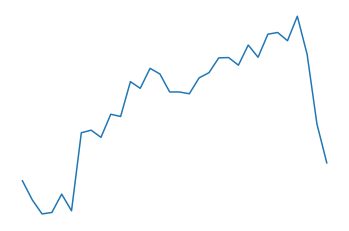


patient 177.0 of 231.0


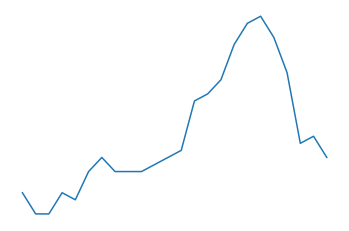

patient 177.0 of 231.0


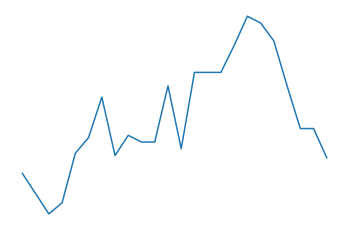

patient 177.0 of 231.0


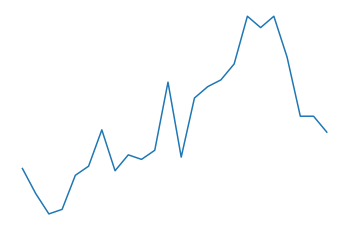

patient 177.0 of 231.0


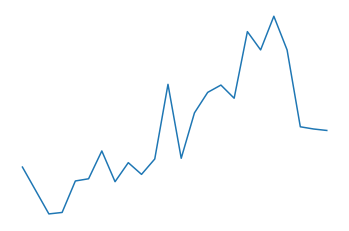

patient 177.0 of 231.0


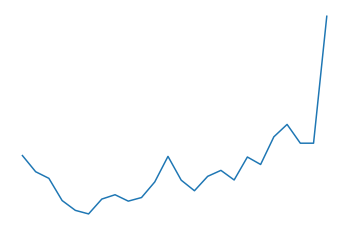

patient 177.0 of 231.0


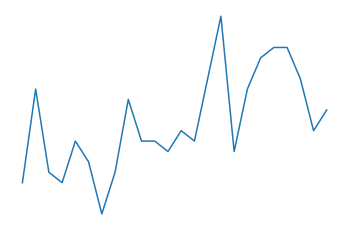

patient 177.0 of 231.0


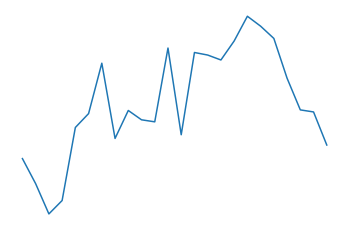


patient 178.1 of 231.0


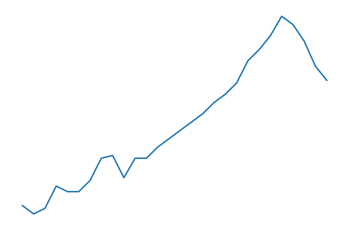

patient 178.1 of 231.0


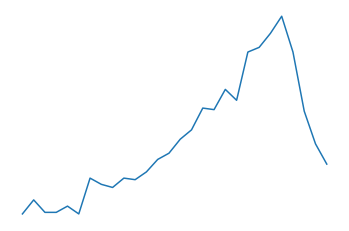

patient 178.1 of 231.0


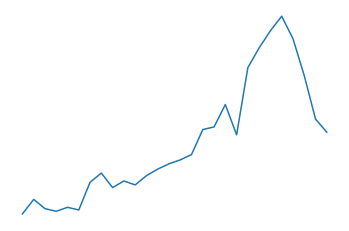

patient 178.1 of 231.0


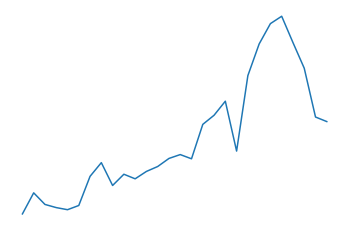

patient 178.1 of 231.0


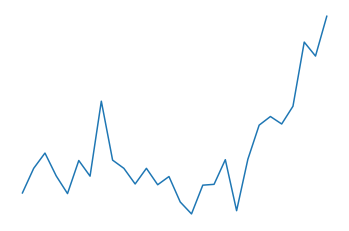

patient 178.1 of 231.0


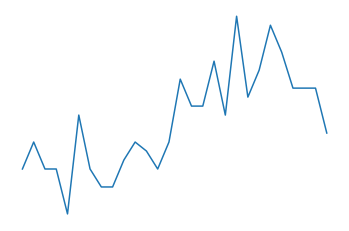

patient 178.1 of 231.0


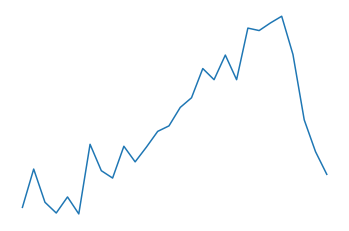


patient 178.2 of 231.0


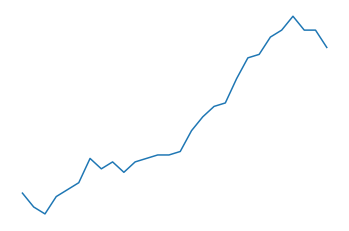

patient 178.2 of 231.0


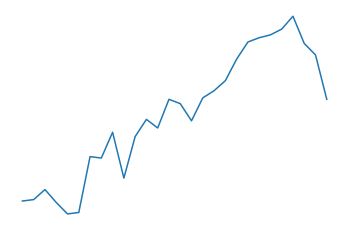

patient 178.2 of 231.0


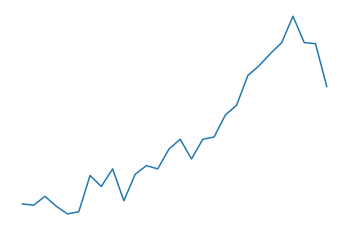

patient 178.2 of 231.0


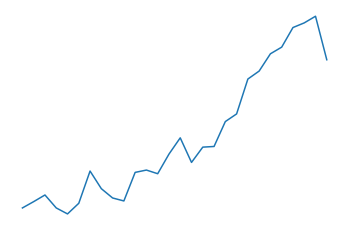

patient 178.2 of 231.0


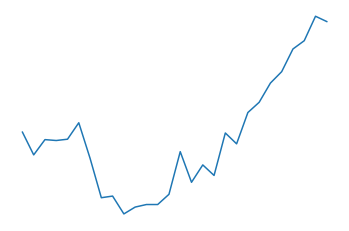

patient 178.2 of 231.0


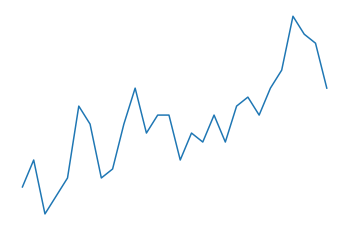

patient 178.2 of 231.0


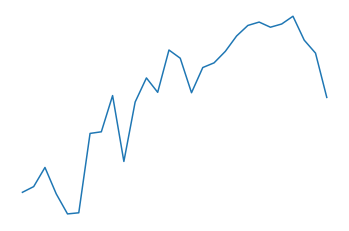


patient 179.0 of 231.0


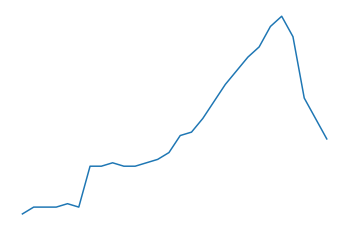

patient 179.0 of 231.0


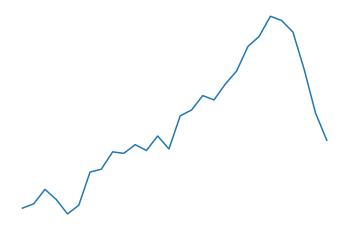

patient 179.0 of 231.0


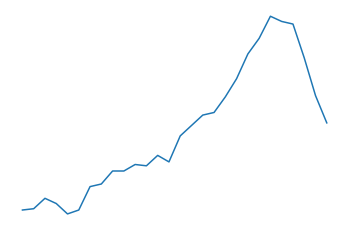

patient 179.0 of 231.0


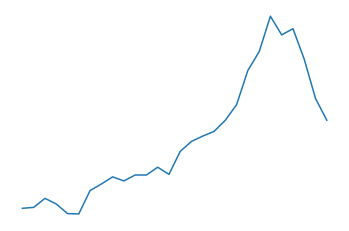

patient 179.0 of 231.0


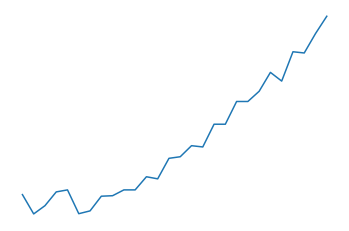

patient 179.0 of 231.0


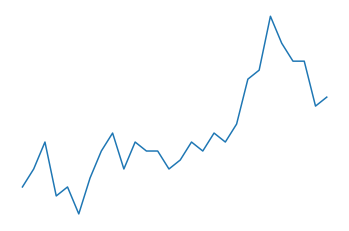

patient 179.0 of 231.0


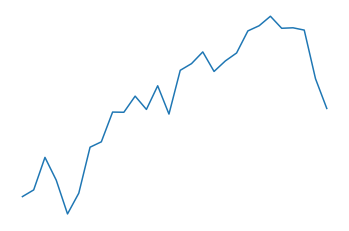


patient 180.0 of 231.0


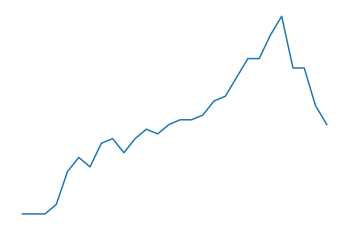

patient 180.0 of 231.0


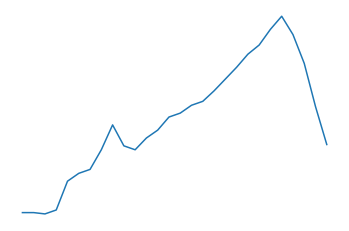

patient 180.0 of 231.0


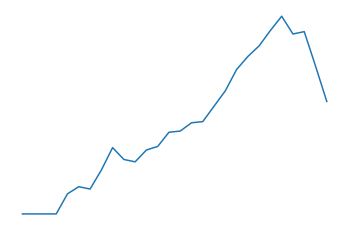

patient 180.0 of 231.0


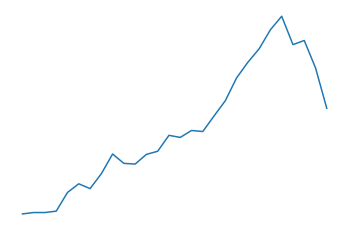

patient 180.0 of 231.0


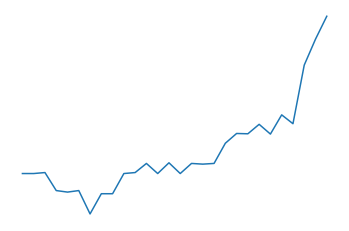

patient 180.0 of 231.0


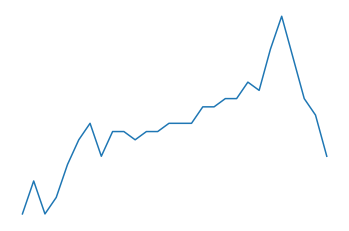

patient 180.0 of 231.0


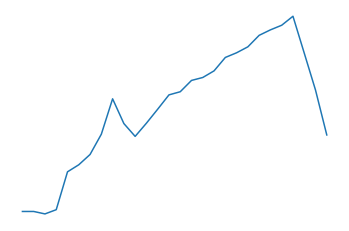


patient 181.0 of 231.0


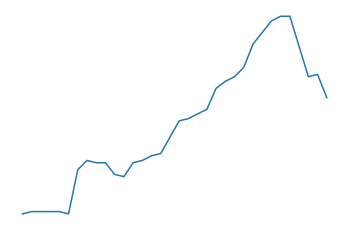

patient 181.0 of 231.0


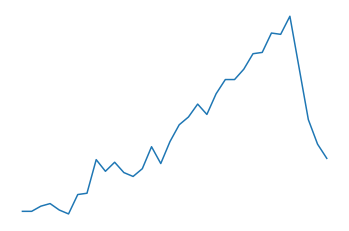

patient 181.0 of 231.0


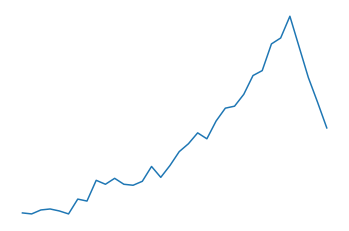

patient 181.0 of 231.0


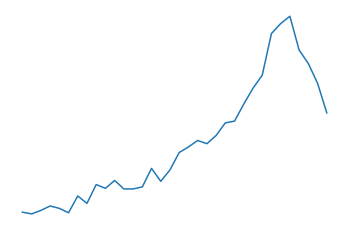

patient 181.0 of 231.0


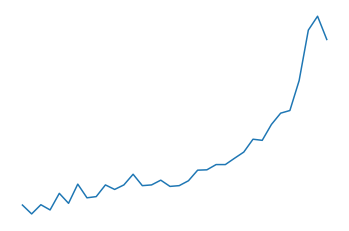

patient 181.0 of 231.0


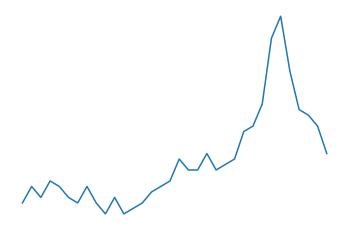

patient 181.0 of 231.0


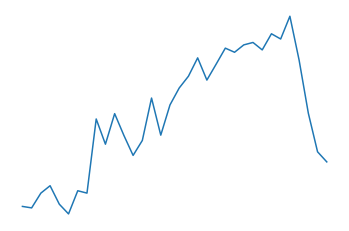


patient 182.0 of 231.0


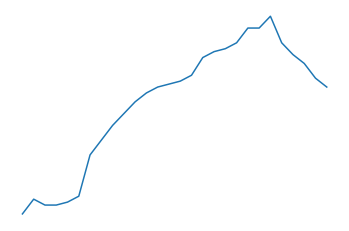

patient 182.0 of 231.0


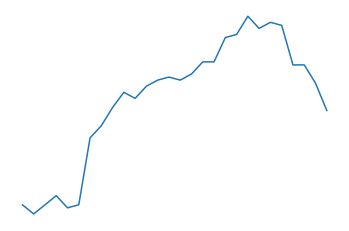

patient 182.0 of 231.0


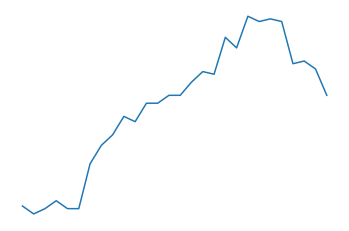

patient 182.0 of 231.0


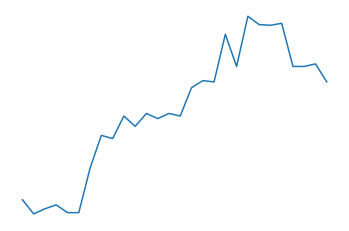

patient 182.0 of 231.0


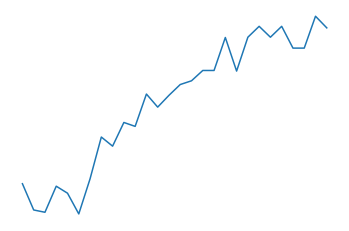

patient 182.0 of 231.0


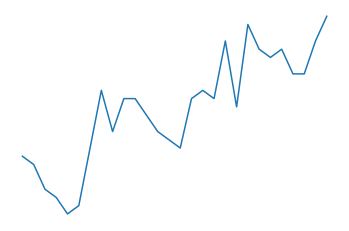

patient 182.0 of 231.0


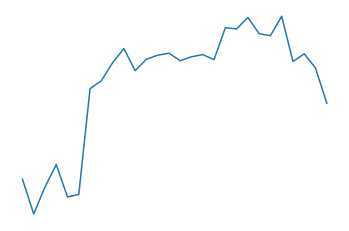


patient 183.0 of 231.0


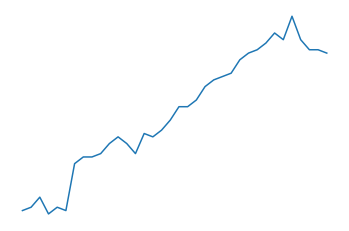

patient 183.0 of 231.0


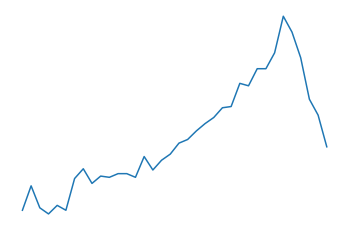

patient 183.0 of 231.0


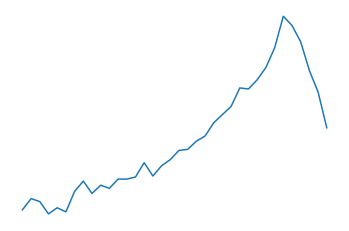

patient 183.0 of 231.0


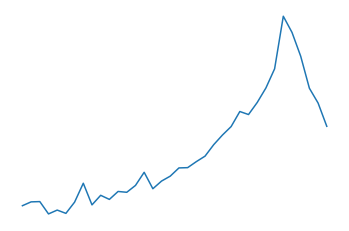

patient 183.0 of 231.0


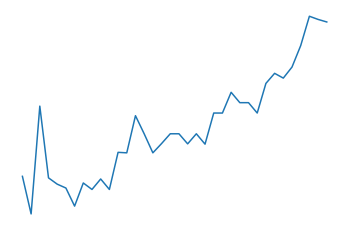

patient 183.0 of 231.0


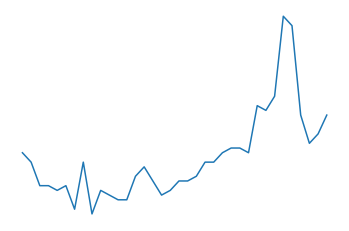

patient 183.0 of 231.0


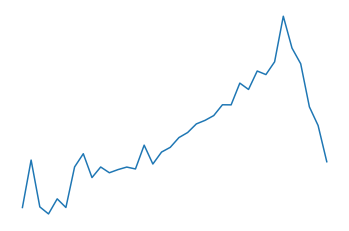


patient 184.0 of 231.0


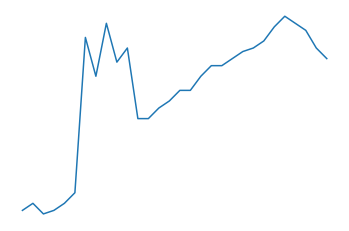

patient 184.0 of 231.0


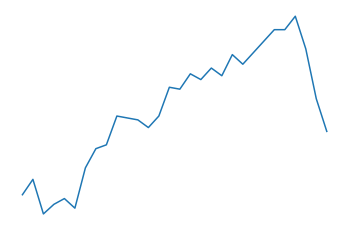

patient 184.0 of 231.0


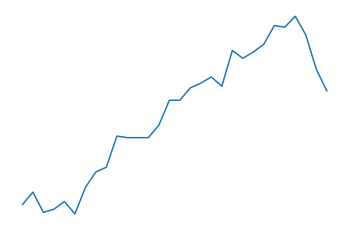

patient 184.0 of 231.0


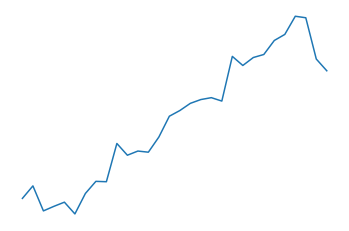

patient 184.0 of 231.0


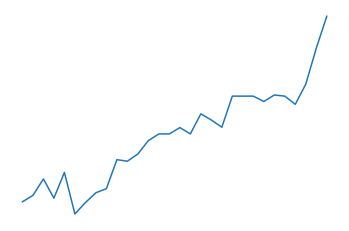

patient 184.0 of 231.0


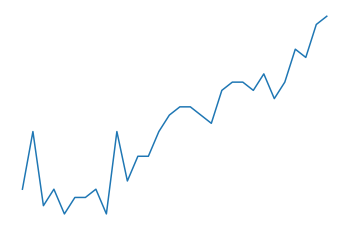

patient 184.0 of 231.0


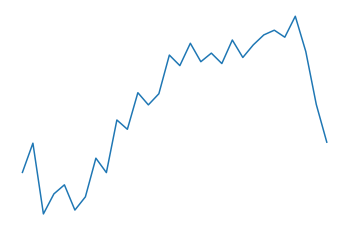


patient 185.0 of 231.0


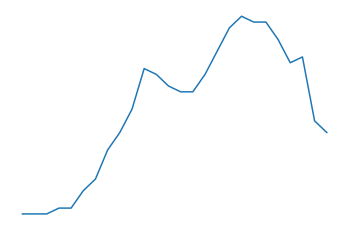

patient 185.0 of 231.0


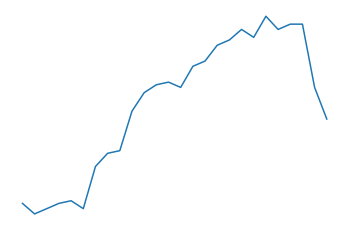

patient 185.0 of 231.0


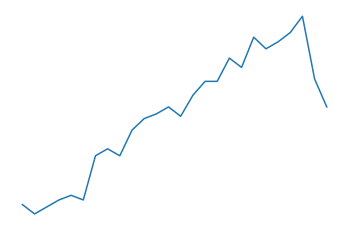

patient 185.0 of 231.0


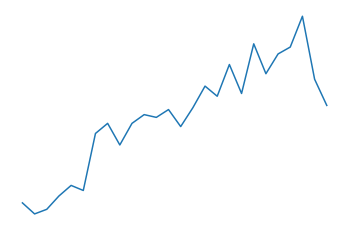

patient 185.0 of 231.0


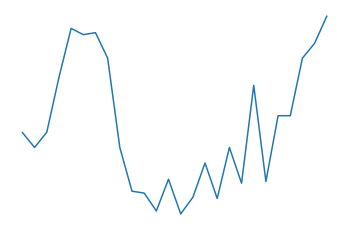

patient 185.0 of 231.0


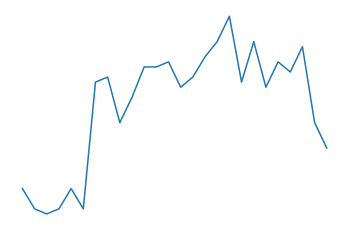

patient 185.0 of 231.0


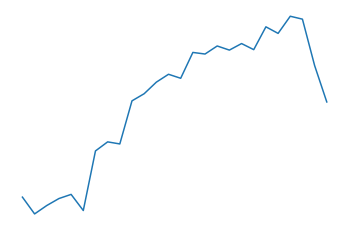


patient 186.0 of 231.0


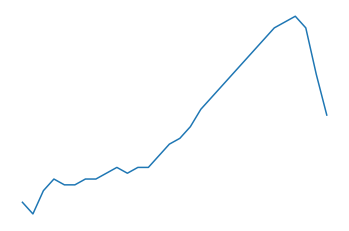

patient 186.0 of 231.0


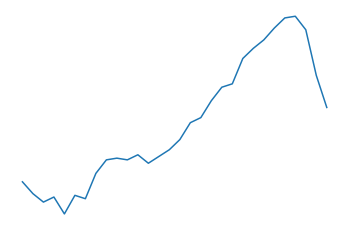

patient 186.0 of 231.0


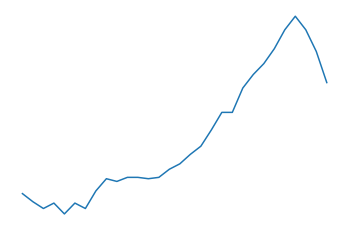

patient 186.0 of 231.0


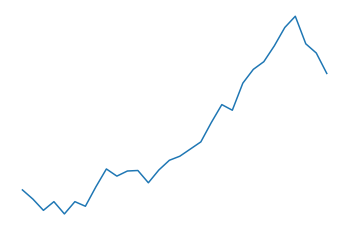

patient 186.0 of 231.0


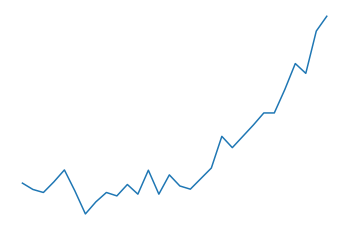

patient 186.0 of 231.0


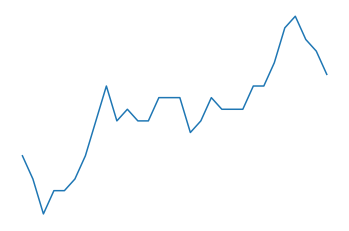

patient 186.0 of 231.0


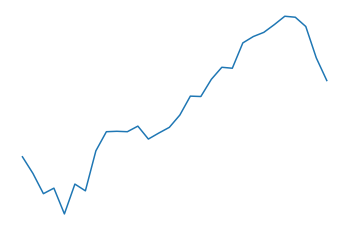


patient 187.0 of 231.0


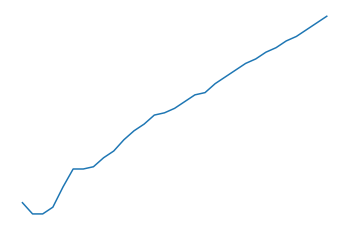

patient 187.0 of 231.0


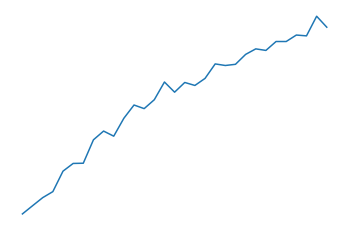

patient 187.0 of 231.0


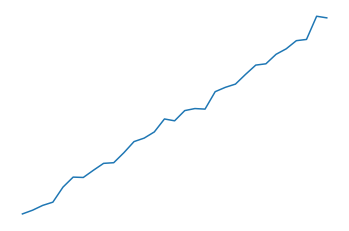

patient 187.0 of 231.0


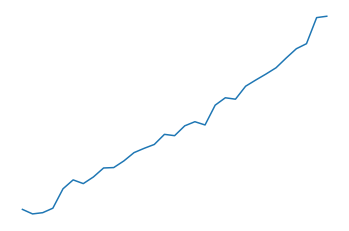

patient 187.0 of 231.0


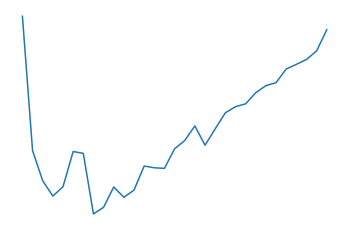

patient 187.0 of 231.0


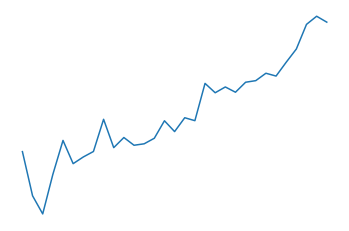

patient 187.0 of 231.0


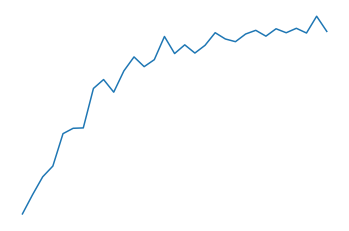


patient 188.0 of 231.0


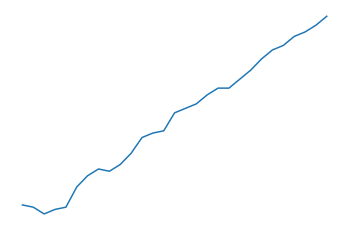

patient 188.0 of 231.0


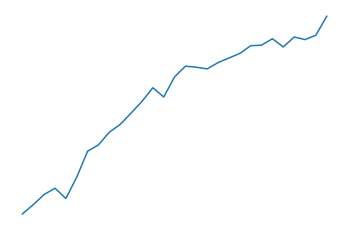

patient 188.0 of 231.0


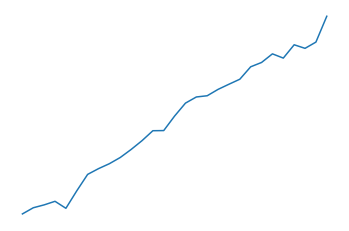

patient 188.0 of 231.0


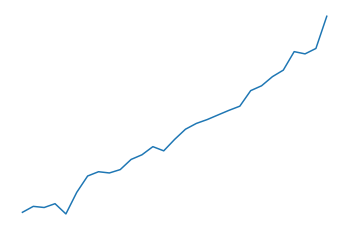

patient 188.0 of 231.0


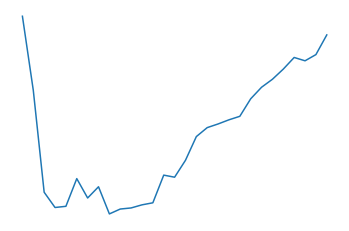

patient 188.0 of 231.0


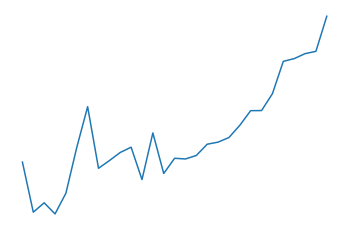

patient 188.0 of 231.0


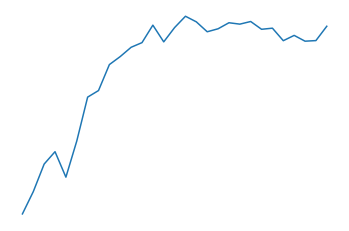


patient 189.0 of 231.0


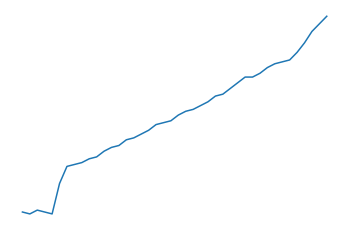

patient 189.0 of 231.0


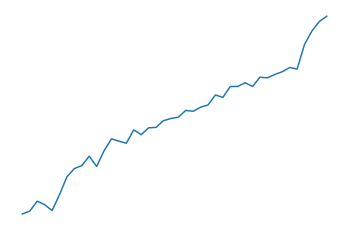

patient 189.0 of 231.0


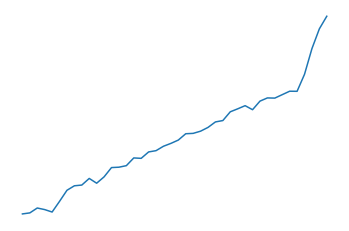

patient 189.0 of 231.0


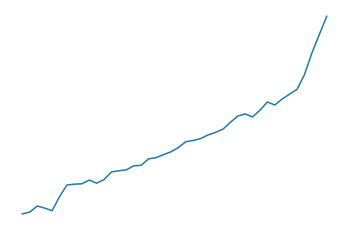

patient 189.0 of 231.0


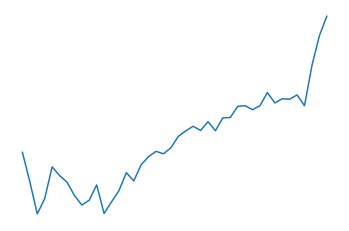

patient 189.0 of 231.0


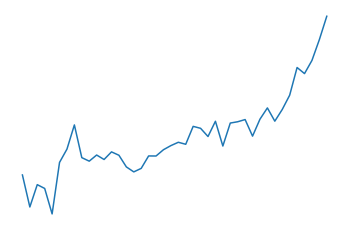

patient 189.0 of 231.0


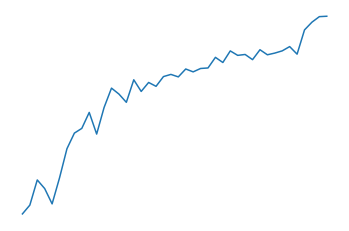


patient 190.0 of 231.0


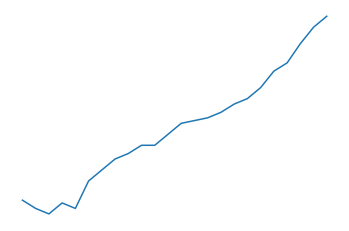

patient 190.0 of 231.0


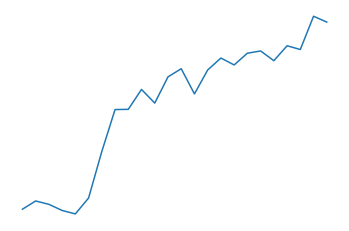

patient 190.0 of 231.0


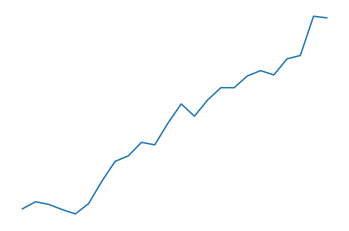

patient 190.0 of 231.0


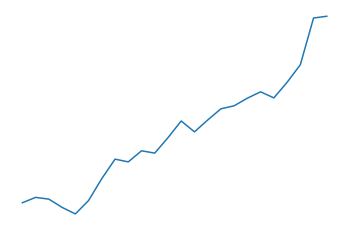

patient 190.0 of 231.0


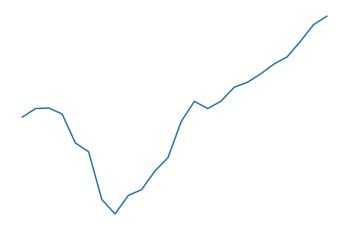

patient 190.0 of 231.0


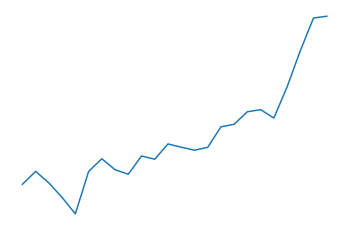

patient 190.0 of 231.0


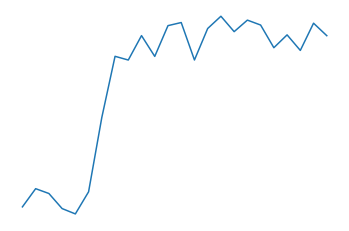


patient 191.0 of 231.0


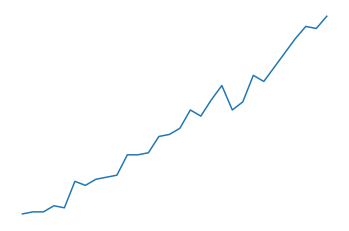

patient 191.0 of 231.0


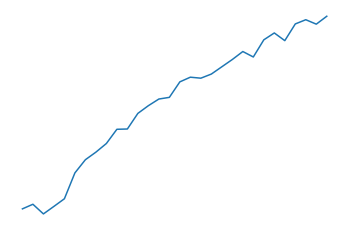

patient 191.0 of 231.0


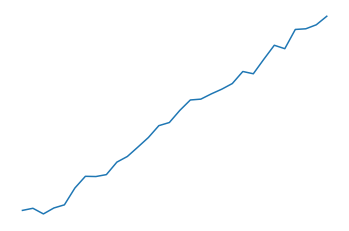

patient 191.0 of 231.0


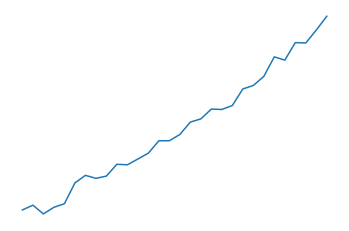

patient 191.0 of 231.0


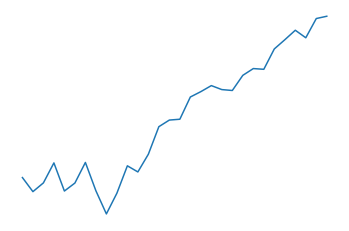

patient 191.0 of 231.0


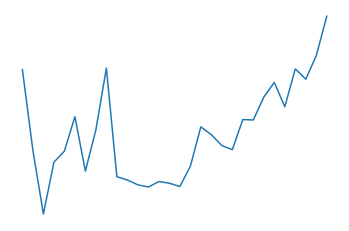

patient 191.0 of 231.0


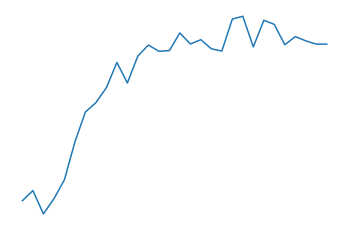


patient 192.0 of 231.0


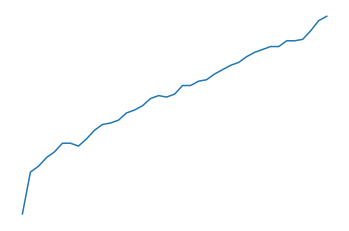

patient 192.0 of 231.0


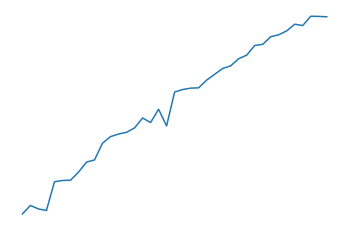

patient 192.0 of 231.0


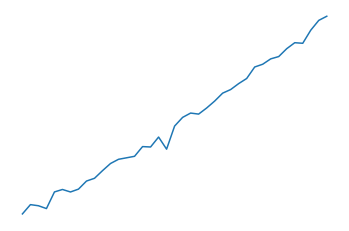

patient 192.0 of 231.0


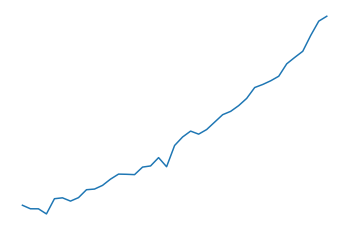

patient 192.0 of 231.0


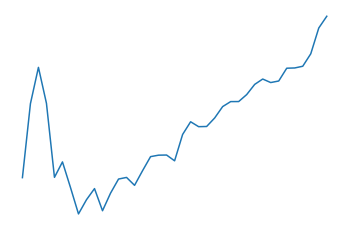

patient 192.0 of 231.0


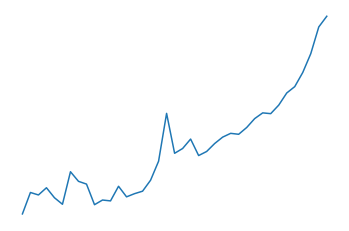

patient 192.0 of 231.0


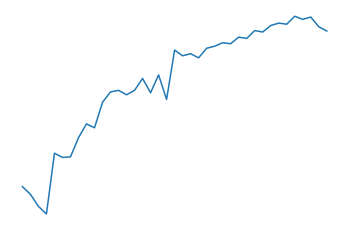


patient 193.0 of 231.0


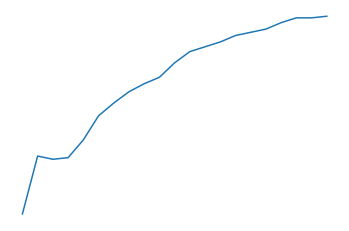

patient 193.0 of 231.0


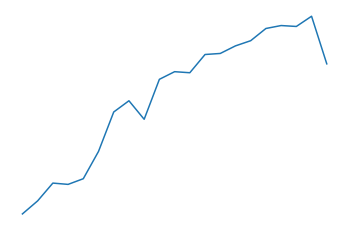

patient 193.0 of 231.0


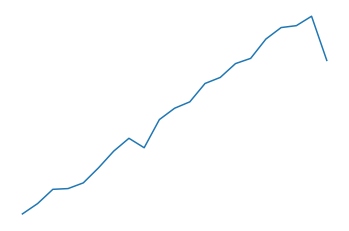

patient 193.0 of 231.0


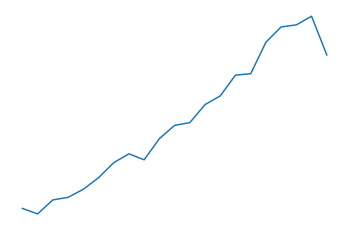

patient 193.0 of 231.0


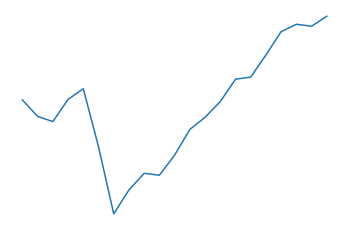

patient 193.0 of 231.0


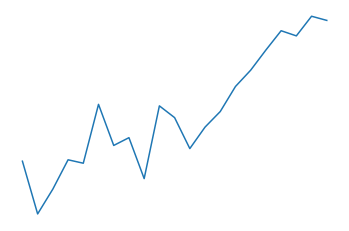

patient 193.0 of 231.0


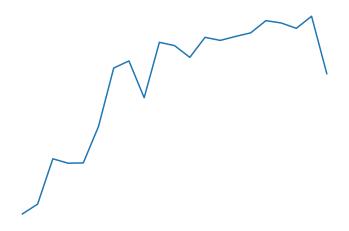


patient 194.0 of 231.0


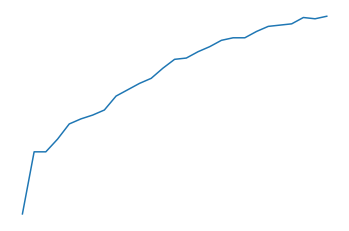

patient 194.0 of 231.0


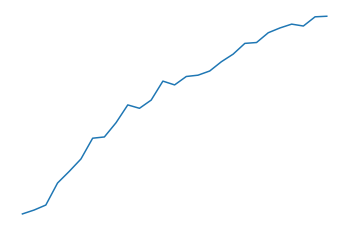

patient 194.0 of 231.0


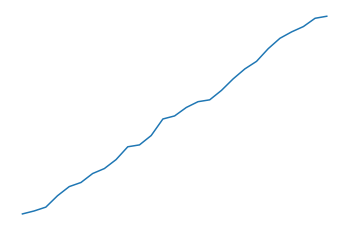

patient 194.0 of 231.0


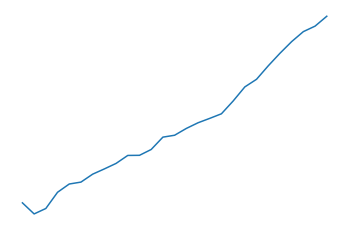

patient 194.0 of 231.0


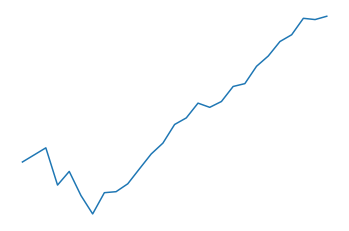

patient 194.0 of 231.0


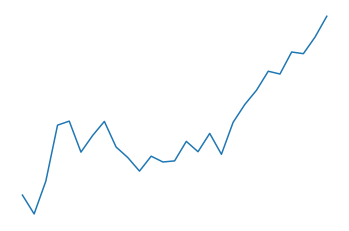

patient 194.0 of 231.0


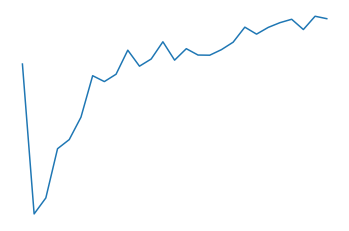


patient 195.0 of 231.0


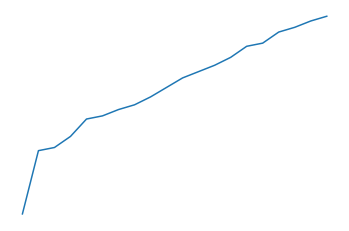

patient 195.0 of 231.0


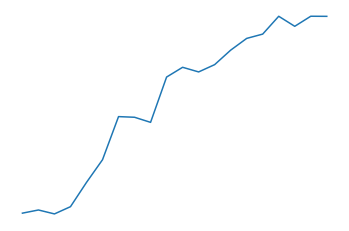

patient 195.0 of 231.0


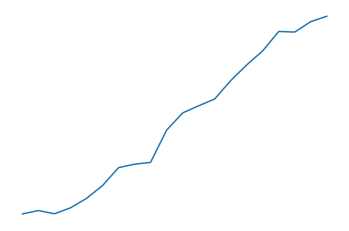

patient 195.0 of 231.0


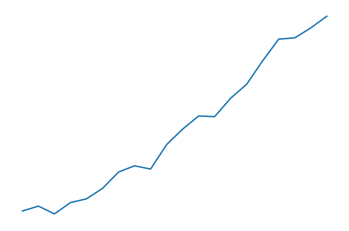

patient 195.0 of 231.0


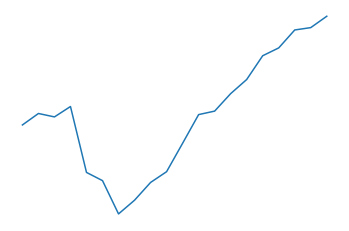

patient 195.0 of 231.0


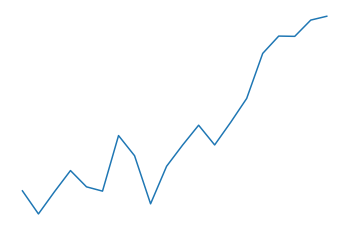

patient 195.0 of 231.0


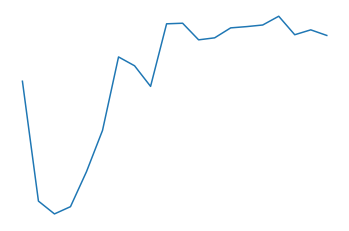


patient 196.0 of 231.0


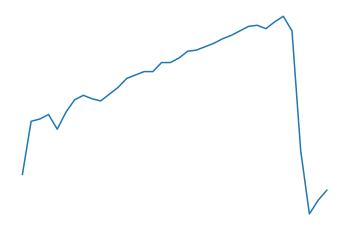

patient 196.0 of 231.0


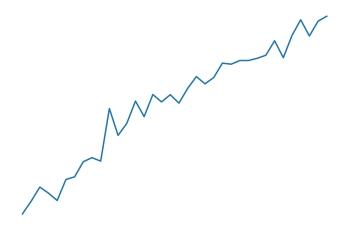

patient 196.0 of 231.0


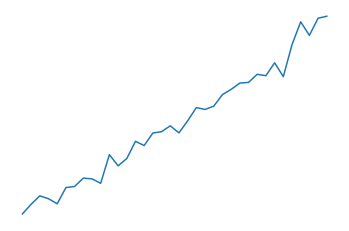

patient 196.0 of 231.0


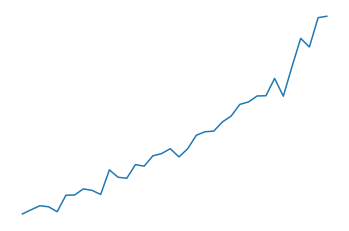

patient 196.0 of 231.0


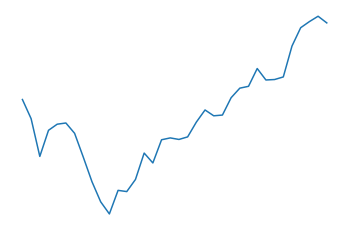

patient 196.0 of 231.0


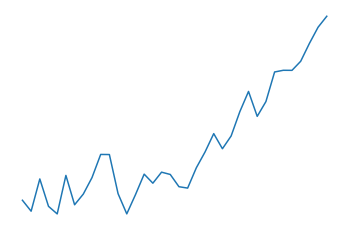

patient 196.0 of 231.0


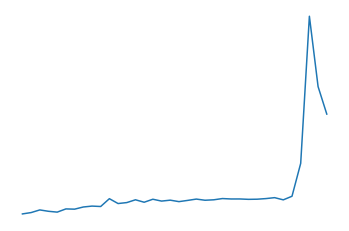


patient 197.0 of 231.0


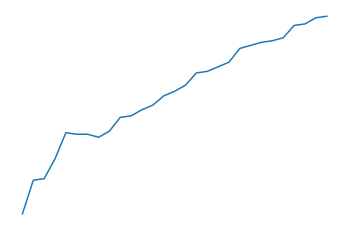

patient 197.0 of 231.0


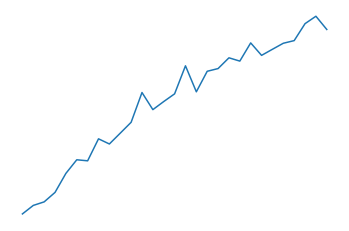

patient 197.0 of 231.0


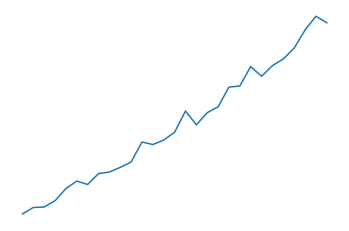

patient 197.0 of 231.0


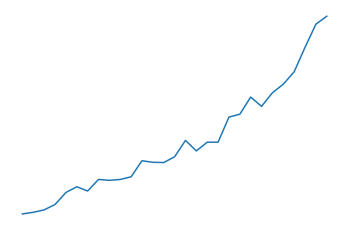

patient 197.0 of 231.0


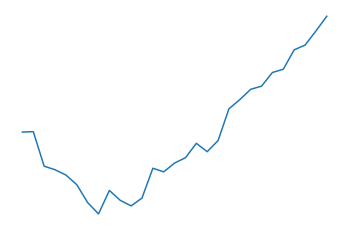

patient 197.0 of 231.0


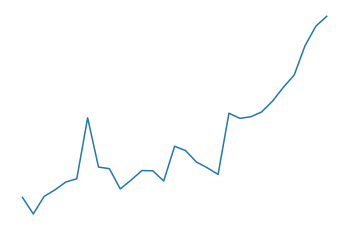

patient 197.0 of 231.0


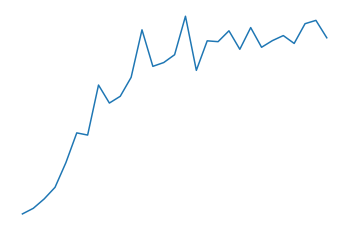


patient 198.0 of 231.0


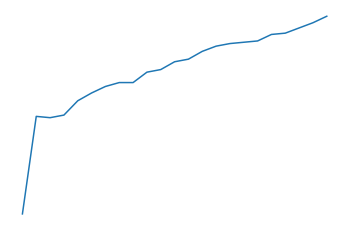

patient 198.0 of 231.0


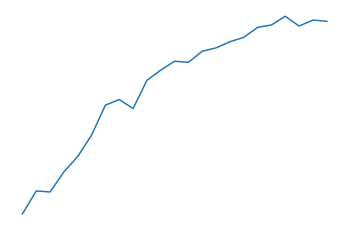

patient 198.0 of 231.0


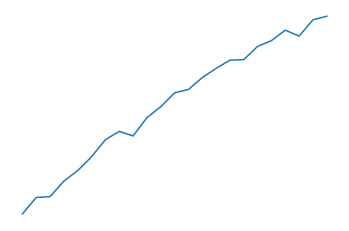

patient 198.0 of 231.0


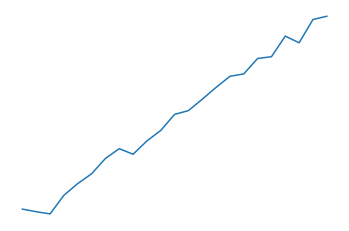

patient 198.0 of 231.0


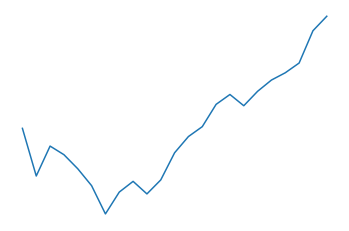

patient 198.0 of 231.0


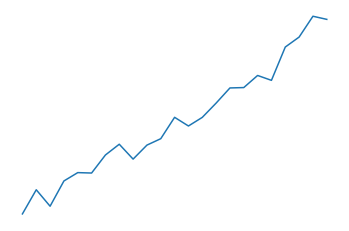

patient 198.0 of 231.0


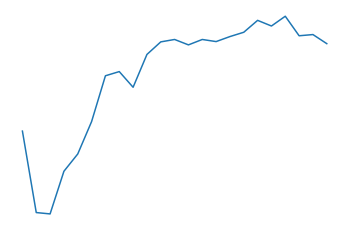


patient 199.0 of 231.0


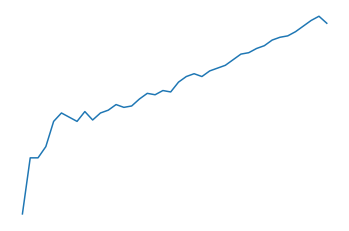

patient 199.0 of 231.0


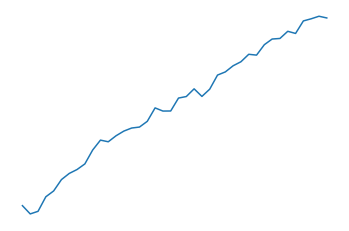

patient 199.0 of 231.0


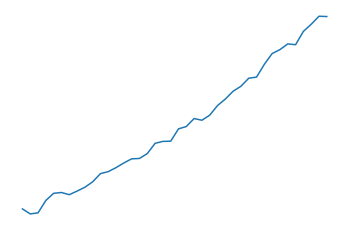

patient 199.0 of 231.0


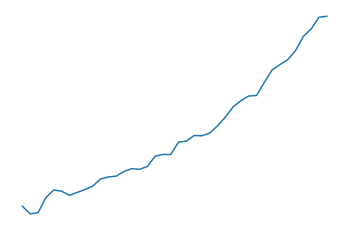

patient 199.0 of 231.0


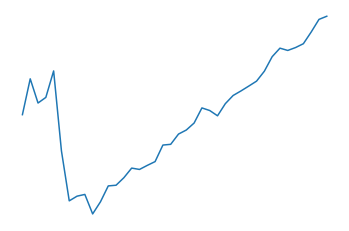

patient 199.0 of 231.0


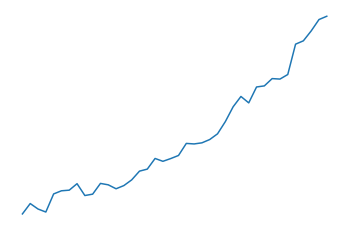

patient 199.0 of 231.0


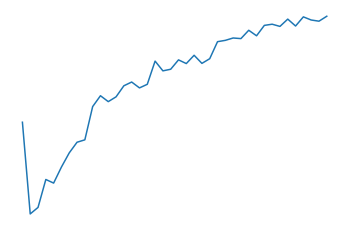


patient 200.0 of 231.0


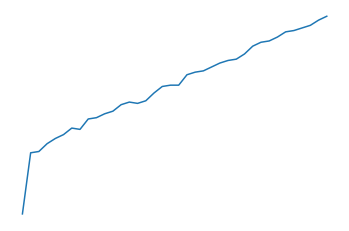

patient 200.0 of 231.0


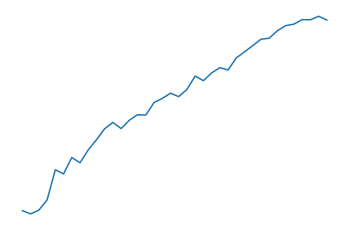

patient 200.0 of 231.0


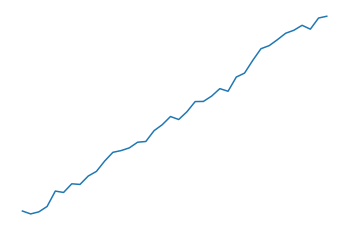

patient 200.0 of 231.0


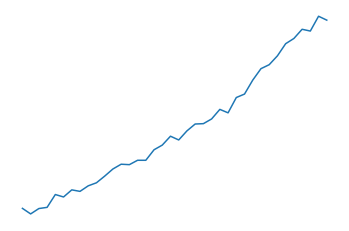

patient 200.0 of 231.0


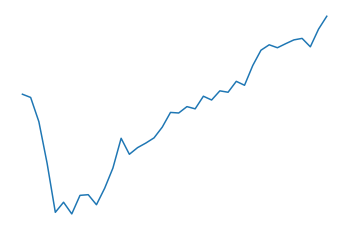

patient 200.0 of 231.0


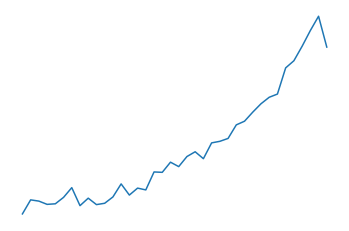

patient 200.0 of 231.0


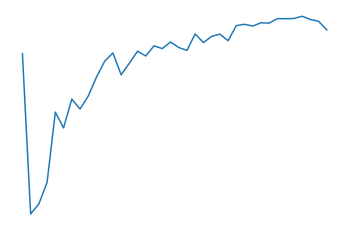


patient 201.0 of 231.0


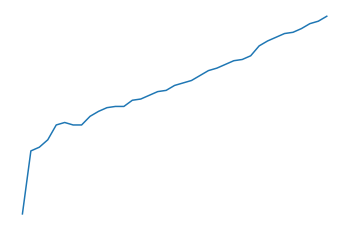

patient 201.0 of 231.0


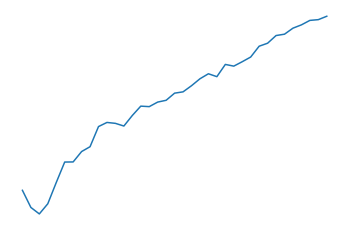

patient 201.0 of 231.0


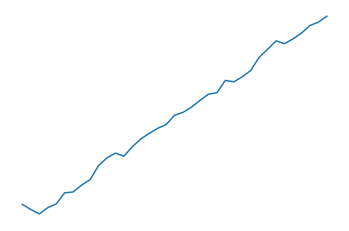

patient 201.0 of 231.0


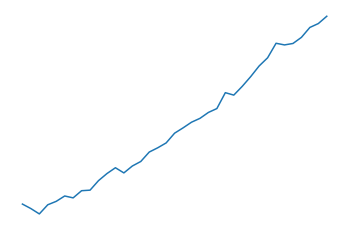

patient 201.0 of 231.0


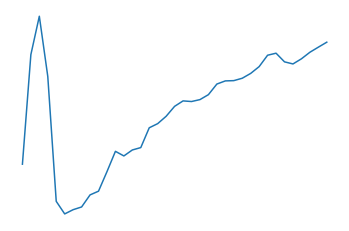

patient 201.0 of 231.0


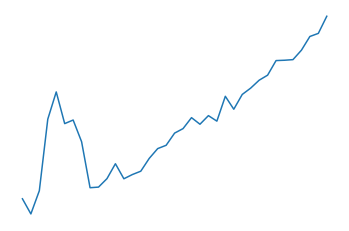

patient 201.0 of 231.0


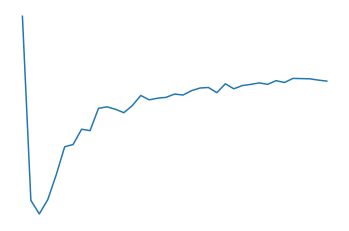


patient 202.0 of 231.0


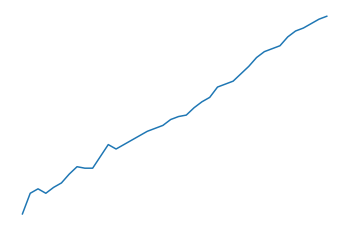

patient 202.0 of 231.0


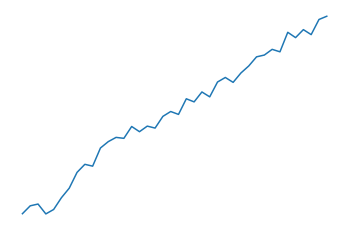

patient 202.0 of 231.0


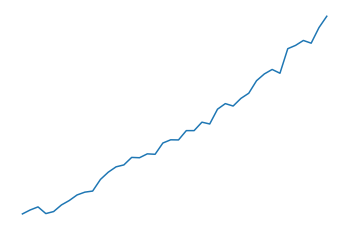

patient 202.0 of 231.0


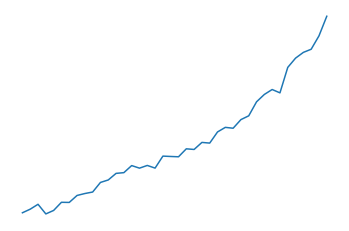

patient 202.0 of 231.0


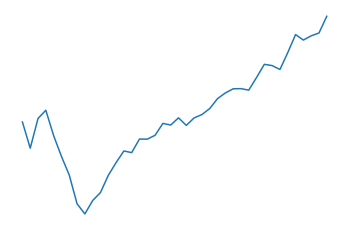

patient 202.0 of 231.0


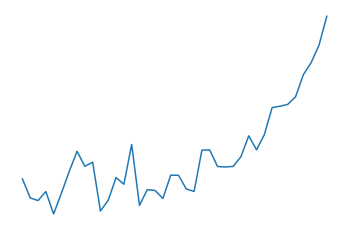

patient 202.0 of 231.0


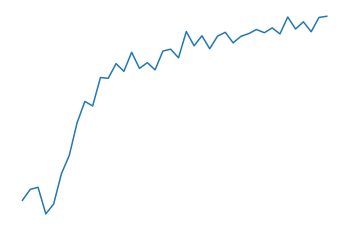


patient 203.0 of 231.0


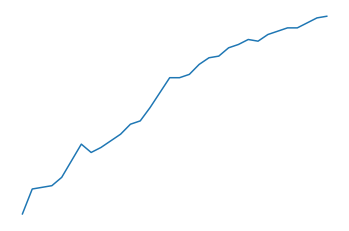

patient 203.0 of 231.0


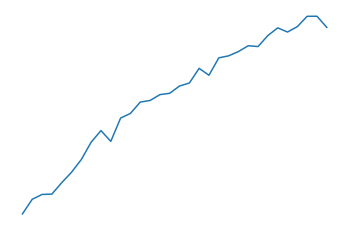

patient 203.0 of 231.0


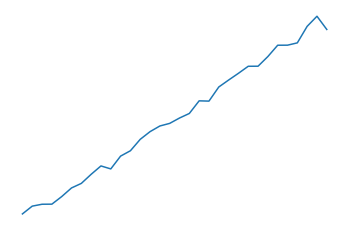

patient 203.0 of 231.0


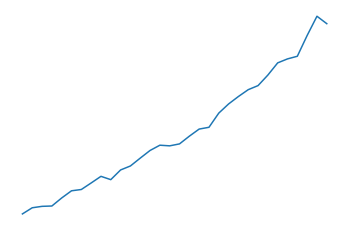

patient 203.0 of 231.0


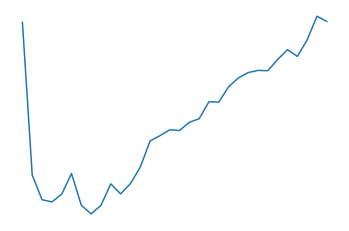

patient 203.0 of 231.0


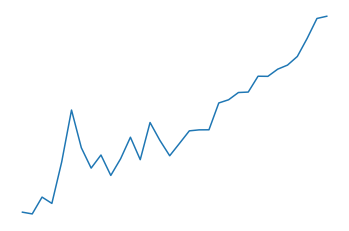

patient 203.0 of 231.0


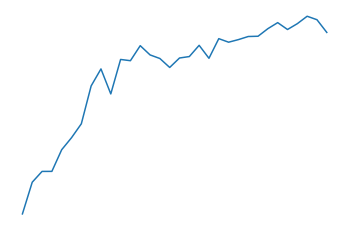


patient 204.0 of 231.0


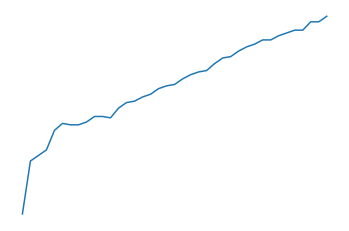

patient 204.0 of 231.0


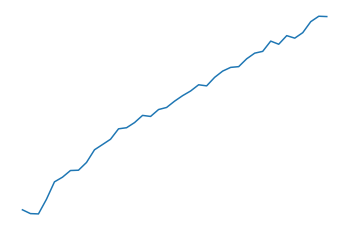

patient 204.0 of 231.0


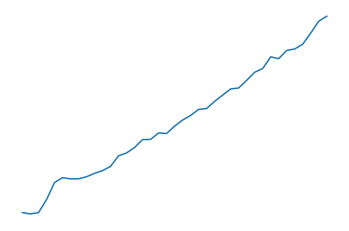

patient 204.0 of 231.0


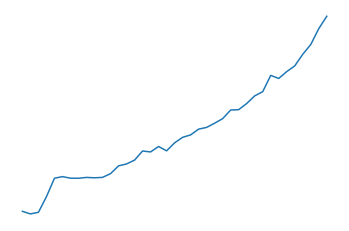

patient 204.0 of 231.0


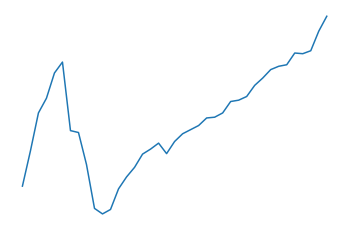

patient 204.0 of 231.0


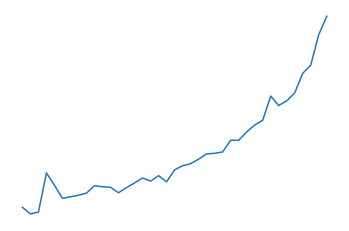

patient 204.0 of 231.0


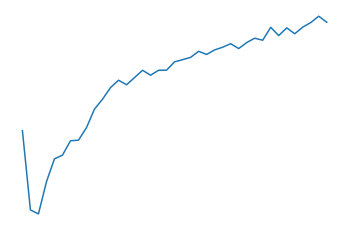


patient 205.0 of 231.0


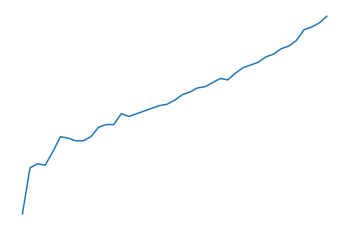

patient 205.0 of 231.0


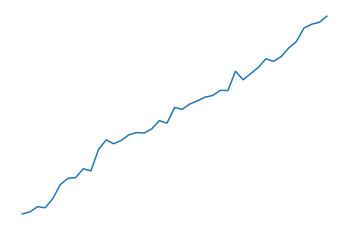

patient 205.0 of 231.0


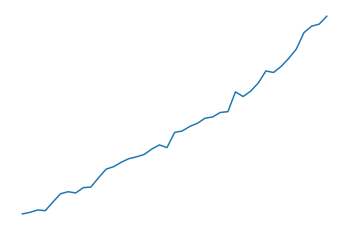

patient 205.0 of 231.0


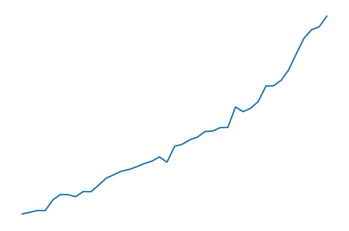

patient 205.0 of 231.0


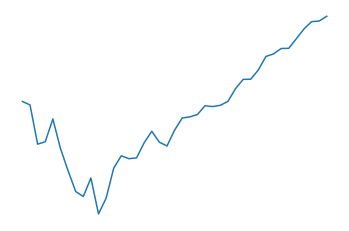

patient 205.0 of 231.0


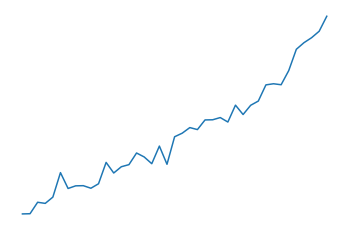

patient 205.0 of 231.0


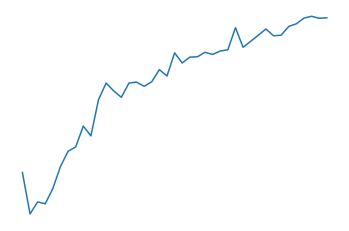


patient 206.0 of 231.0


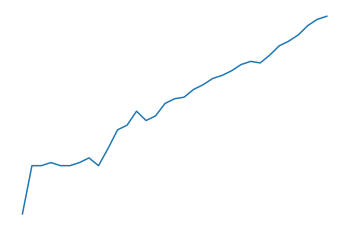

patient 206.0 of 231.0


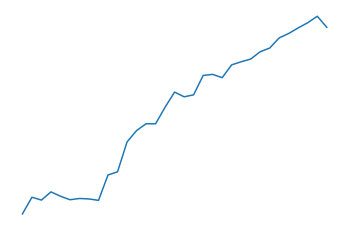

patient 206.0 of 231.0


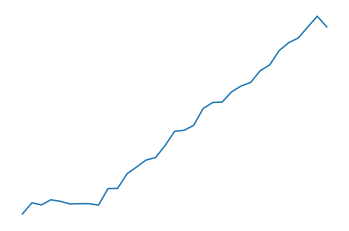

patient 206.0 of 231.0


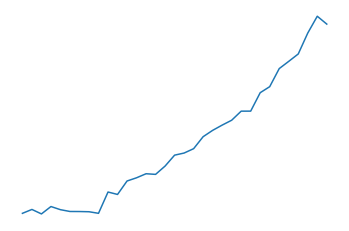

patient 206.0 of 231.0


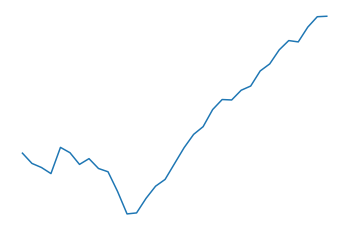

patient 206.0 of 231.0


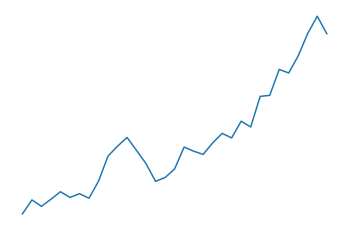

patient 206.0 of 231.0


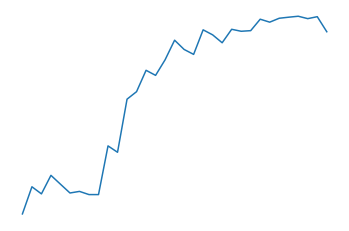


patient 207.0 of 231.0


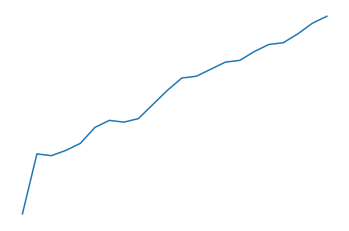

patient 207.0 of 231.0


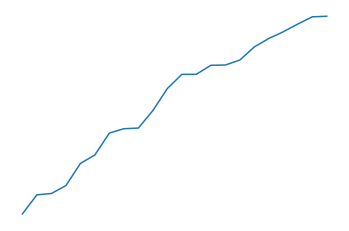

patient 207.0 of 231.0


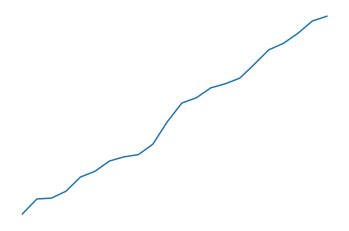

patient 207.0 of 231.0


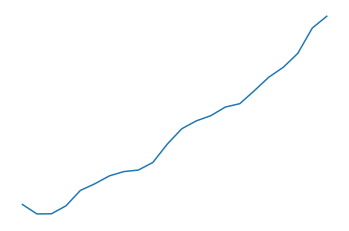

patient 207.0 of 231.0


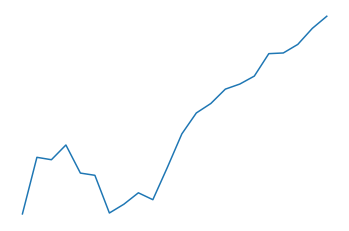

patient 207.0 of 231.0


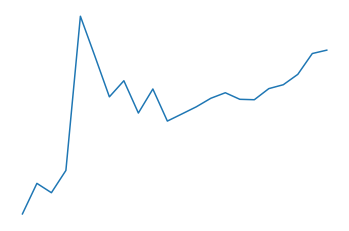

patient 207.0 of 231.0


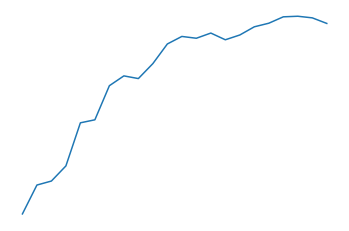


patient 208.0 of 231.0


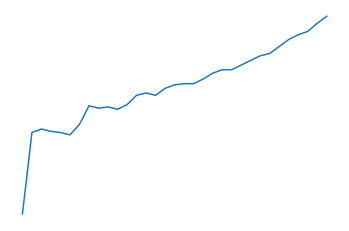

patient 208.0 of 231.0


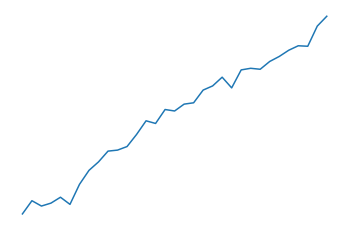

patient 208.0 of 231.0


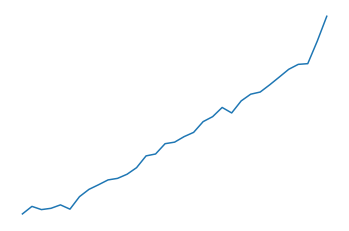

patient 208.0 of 231.0


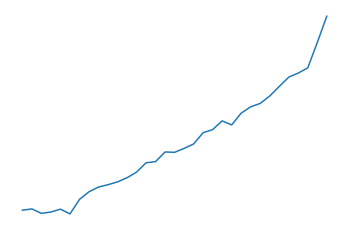

patient 208.0 of 231.0


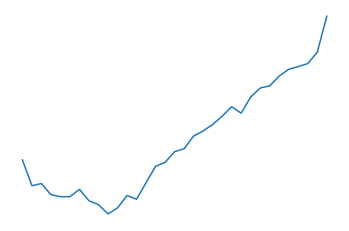

patient 208.0 of 231.0


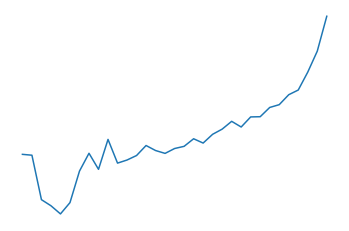

patient 208.0 of 231.0


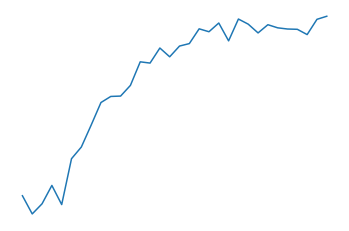


patient 209.0 of 231.0


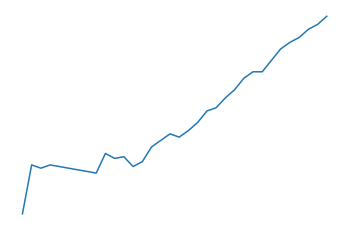

patient 209.0 of 231.0


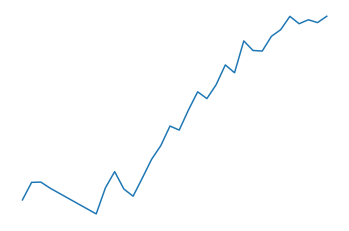

patient 209.0 of 231.0


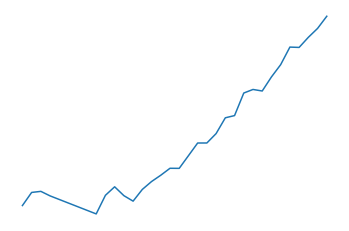

patient 209.0 of 231.0


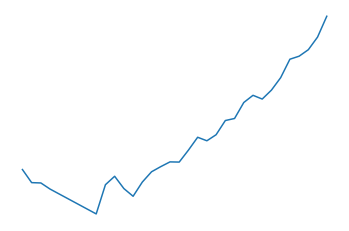

patient 209.0 of 231.0


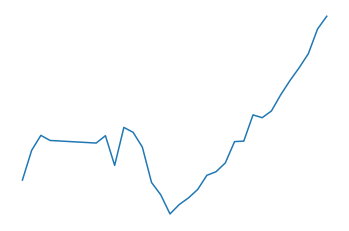

patient 209.0 of 231.0


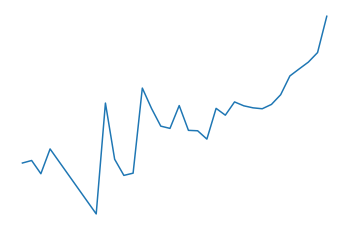

patient 209.0 of 231.0


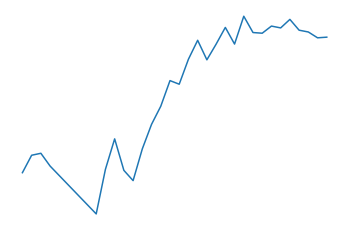


patient 211.0 of 231.0


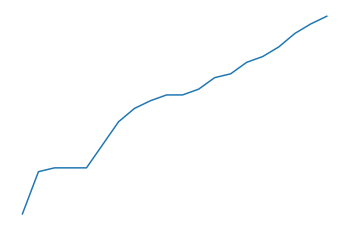

patient 211.0 of 231.0


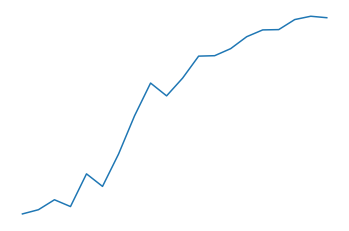

patient 211.0 of 231.0


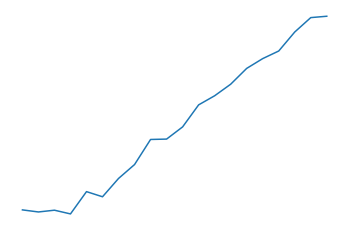

patient 211.0 of 231.0


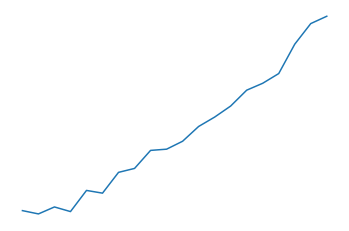

patient 211.0 of 231.0


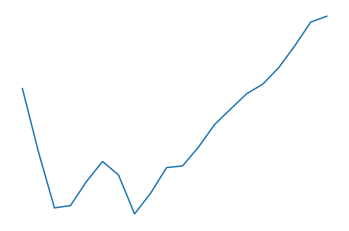

patient 211.0 of 231.0


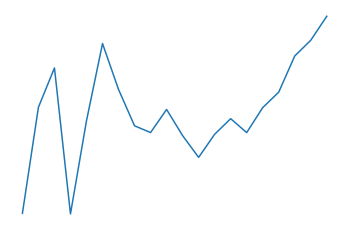

patient 211.0 of 231.0


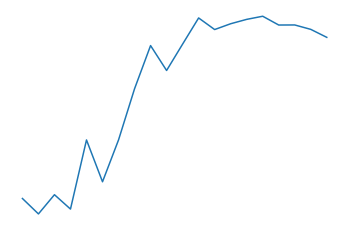


patient 212.0 of 231.0


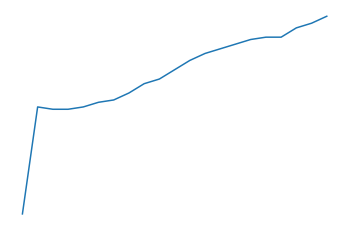

patient 212.0 of 231.0


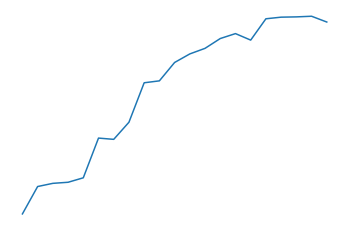

patient 212.0 of 231.0


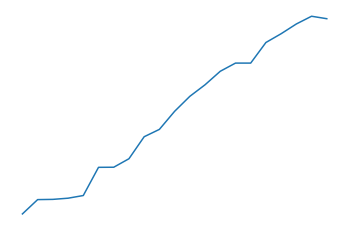

patient 212.0 of 231.0


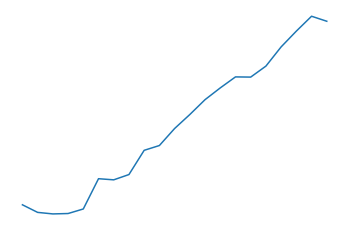

patient 212.0 of 231.0


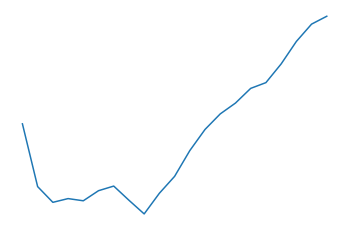

patient 212.0 of 231.0


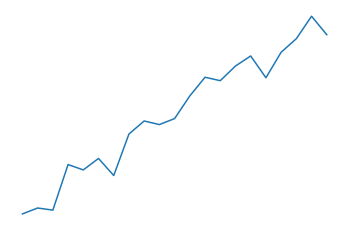

patient 212.0 of 231.0


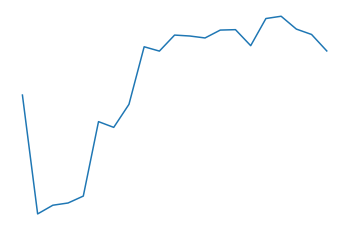


patient 213.0 of 231.0


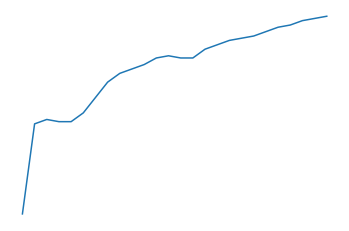

patient 213.0 of 231.0


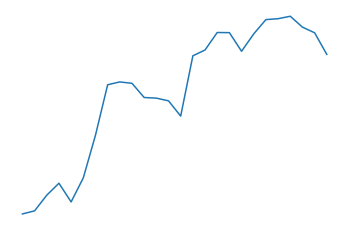

patient 213.0 of 231.0


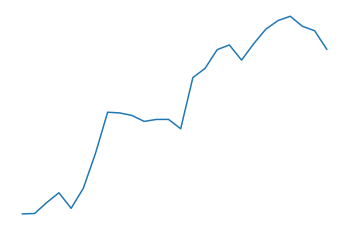

patient 213.0 of 231.0


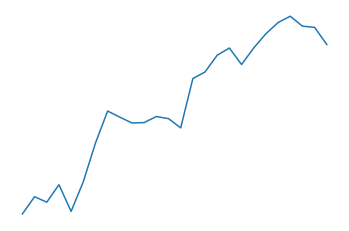

patient 213.0 of 231.0


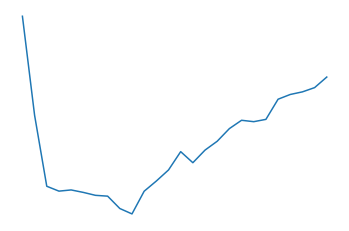

patient 213.0 of 231.0


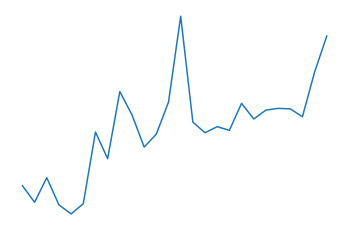

patient 213.0 of 231.0


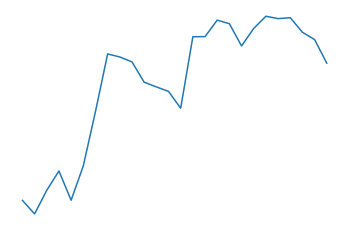


patient 214.0 of 231.0


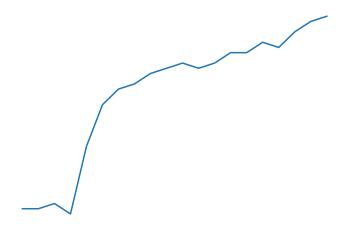

patient 214.0 of 231.0


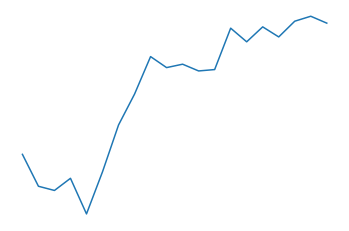

patient 214.0 of 231.0


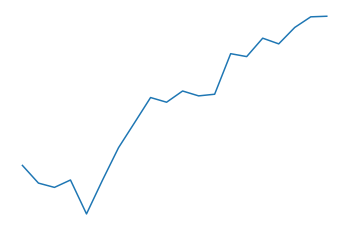

patient 214.0 of 231.0


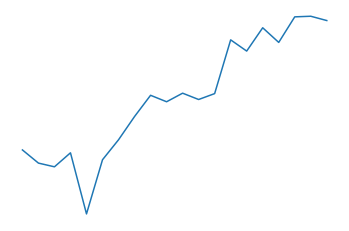

patient 214.0 of 231.0


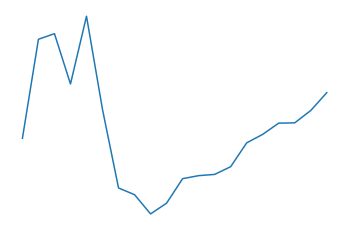

patient 214.0 of 231.0


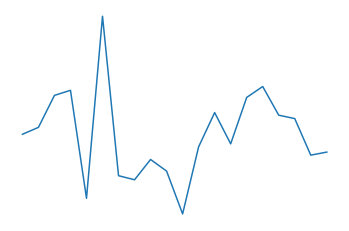

patient 214.0 of 231.0


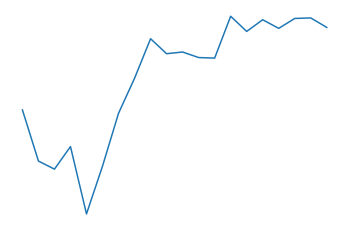


patient 216.0 of 231.0


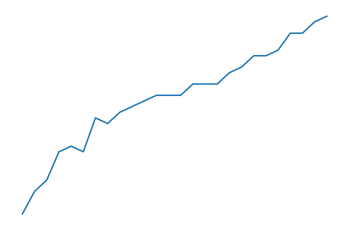

patient 216.0 of 231.0


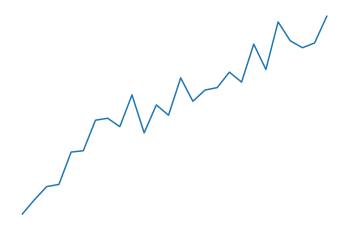

patient 216.0 of 231.0


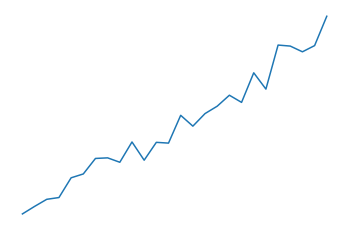

patient 216.0 of 231.0


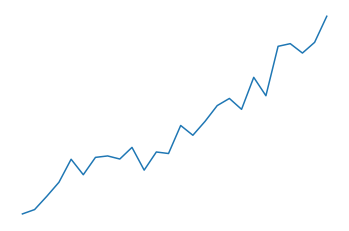

patient 216.0 of 231.0


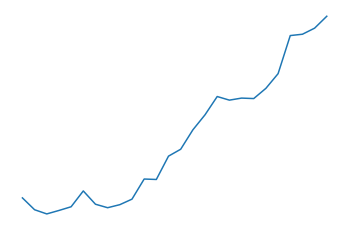

patient 216.0 of 231.0


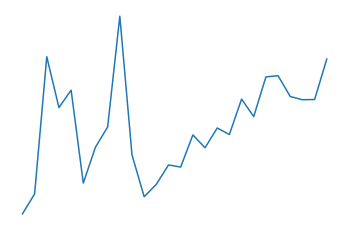

patient 216.0 of 231.0


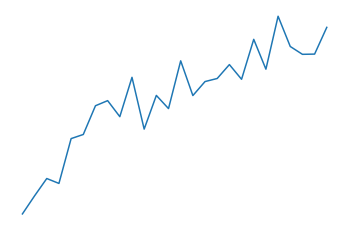


patient 219.0 of 231.0


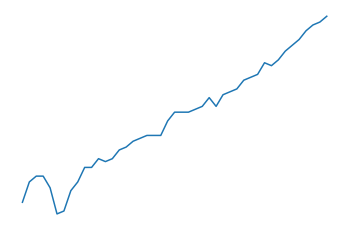

patient 219.0 of 231.0


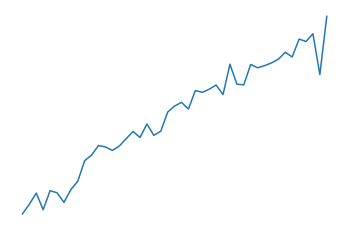

patient 219.0 of 231.0


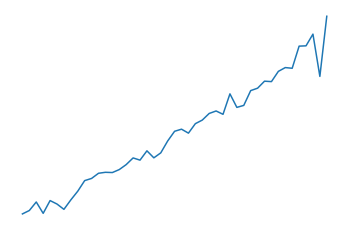

patient 219.0 of 231.0


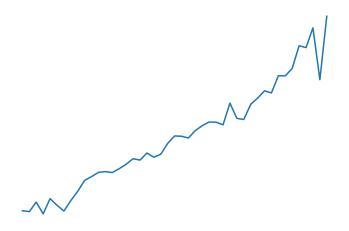

patient 219.0 of 231.0


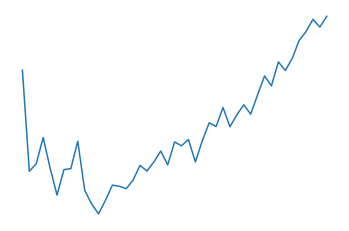

patient 219.0 of 231.0


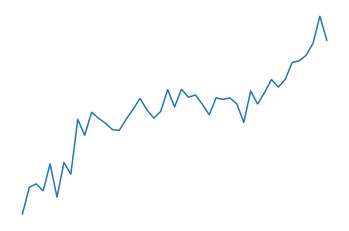

patient 219.0 of 231.0


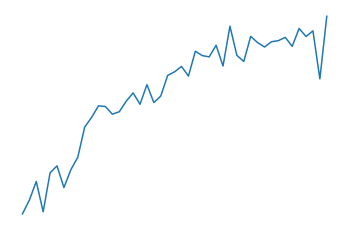


patient 220.0 of 231.0


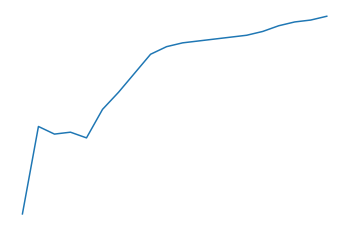

patient 220.0 of 231.0


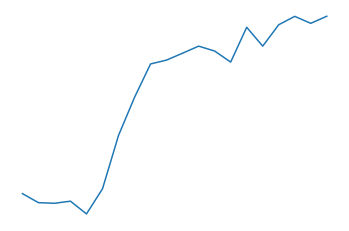

patient 220.0 of 231.0


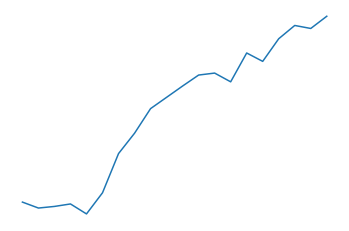

patient 220.0 of 231.0


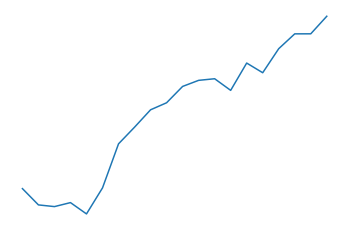

patient 220.0 of 231.0


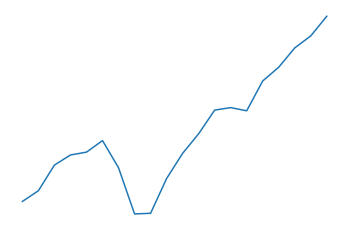

patient 220.0 of 231.0


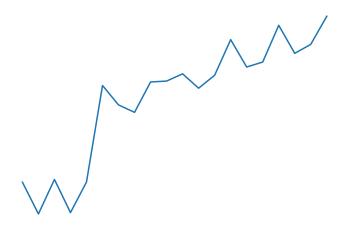

patient 220.0 of 231.0


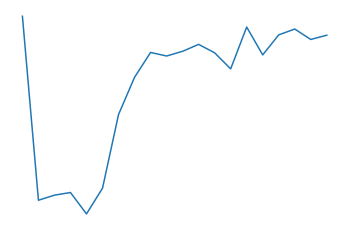


patient 221.0 of 231.0


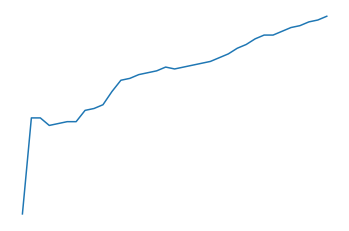

patient 221.0 of 231.0


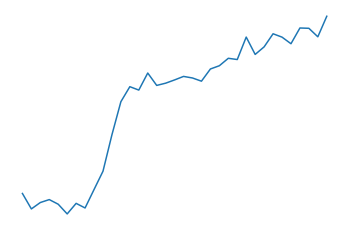

patient 221.0 of 231.0


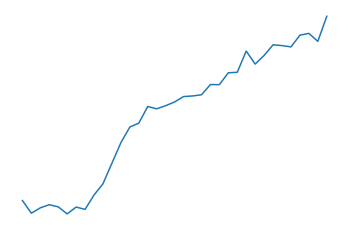

patient 221.0 of 231.0


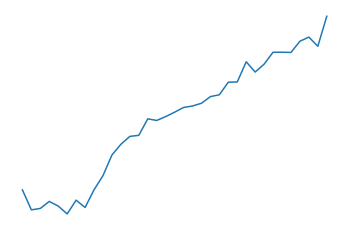

patient 221.0 of 231.0


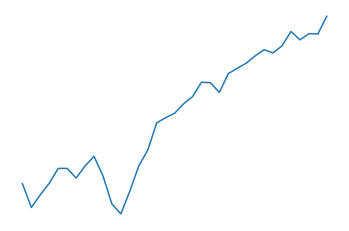

patient 221.0 of 231.0


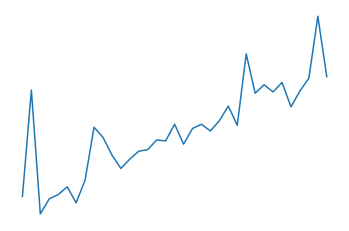

patient 221.0 of 231.0


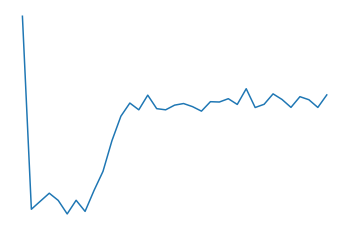


patient 222.0 of 231.0


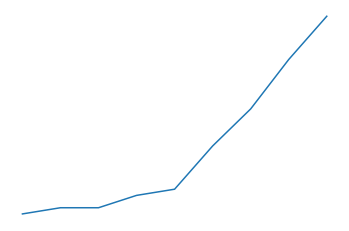

patient 222.0 of 231.0


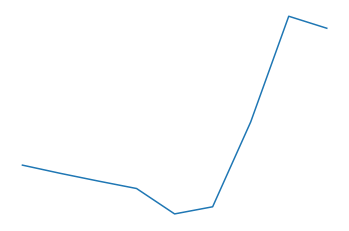

patient 222.0 of 231.0


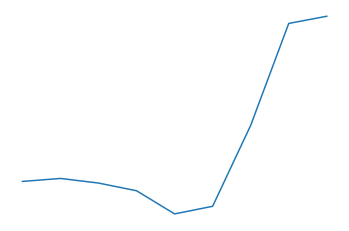

patient 222.0 of 231.0


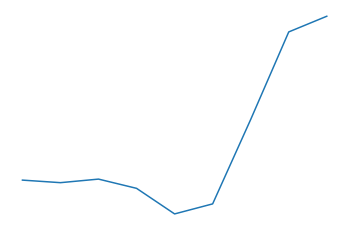

patient 222.0 of 231.0


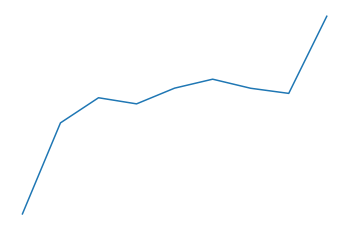

patient 222.0 of 231.0


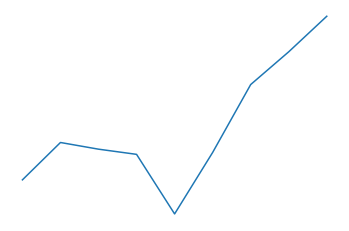

patient 222.0 of 231.0


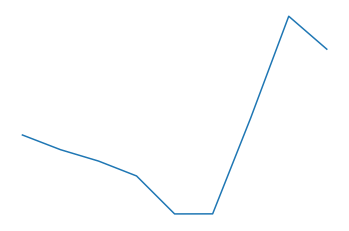


patient 223.0 of 231.0


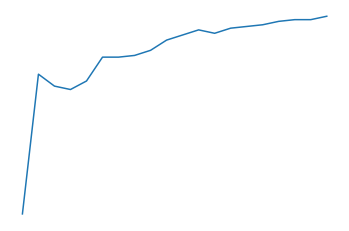

patient 223.0 of 231.0


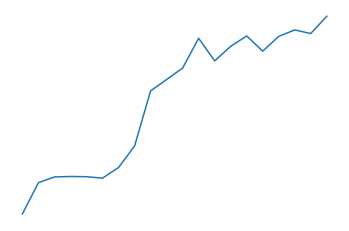

patient 223.0 of 231.0


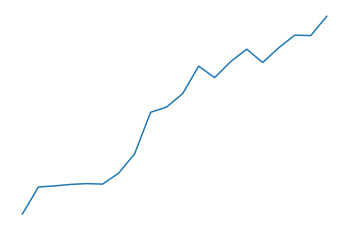

patient 223.0 of 231.0


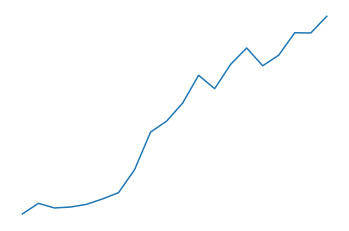

patient 223.0 of 231.0


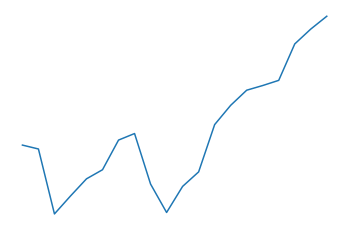

patient 223.0 of 231.0


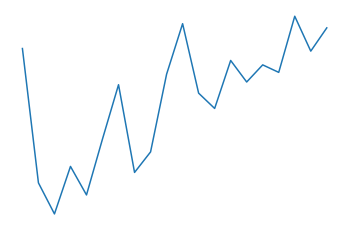

patient 223.0 of 231.0


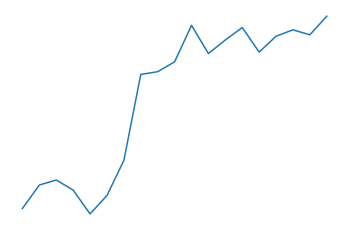


patient 224.0 of 231.0


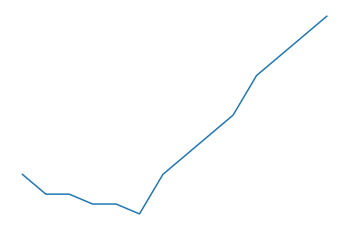

patient 224.0 of 231.0


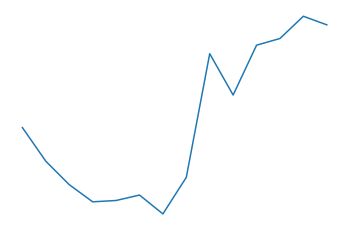

patient 224.0 of 231.0


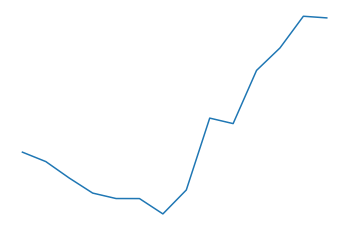

patient 224.0 of 231.0


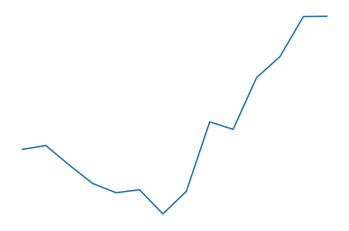

patient 224.0 of 231.0


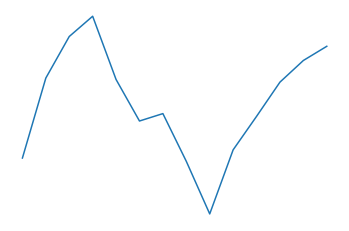

patient 224.0 of 231.0


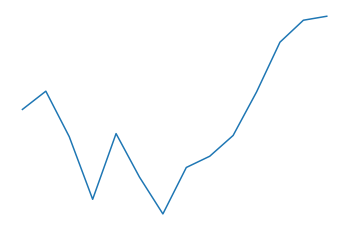

patient 224.0 of 231.0


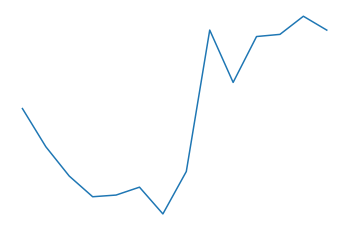


patient 225.0 of 231.0


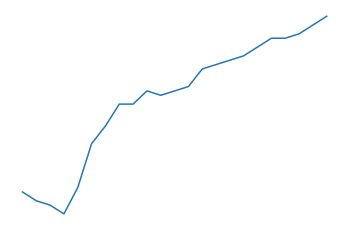

patient 225.0 of 231.0


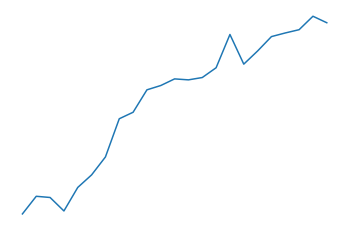

patient 225.0 of 231.0


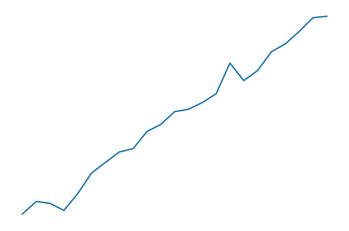

patient 225.0 of 231.0


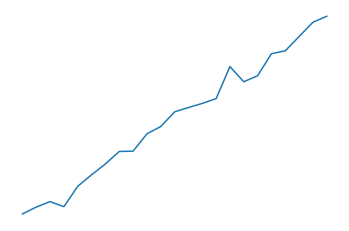

patient 225.0 of 231.0


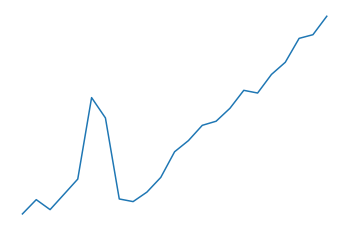

patient 225.0 of 231.0


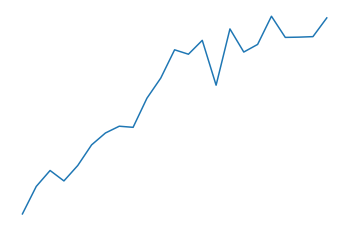

patient 225.0 of 231.0


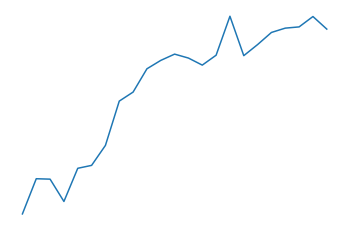


patient 226.0 of 231.0


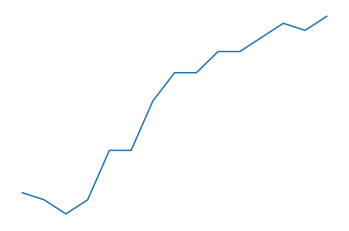

patient 226.0 of 231.0


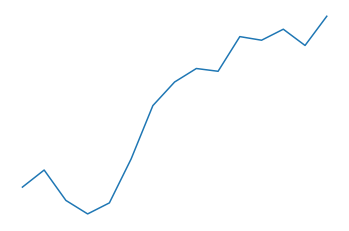

patient 226.0 of 231.0


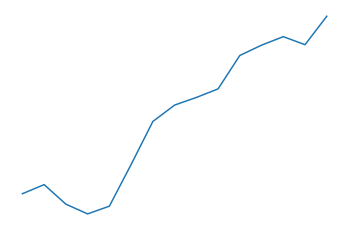

patient 226.0 of 231.0


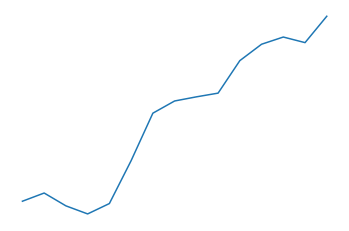

patient 226.0 of 231.0


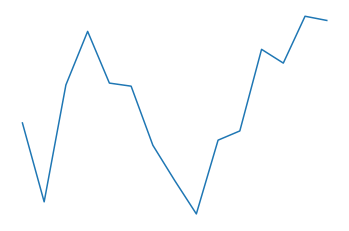

patient 226.0 of 231.0


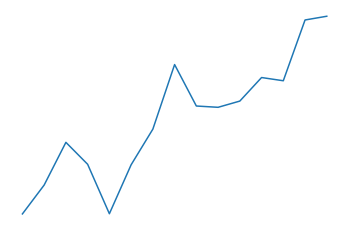

patient 226.0 of 231.0


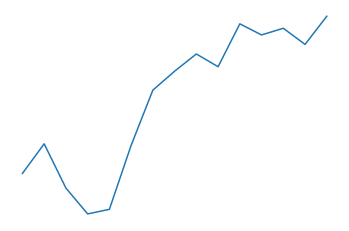


patient 227.0 of 231.0


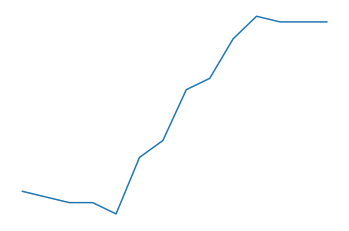

patient 227.0 of 231.0


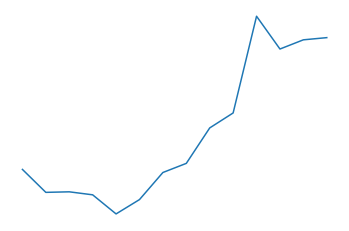

patient 227.0 of 231.0


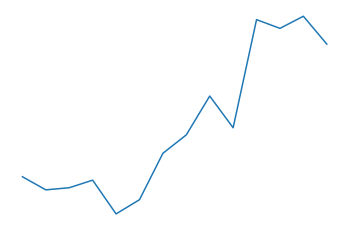

patient 227.0 of 231.0


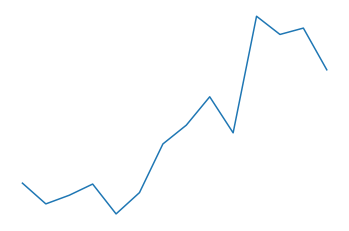

patient 227.0 of 231.0


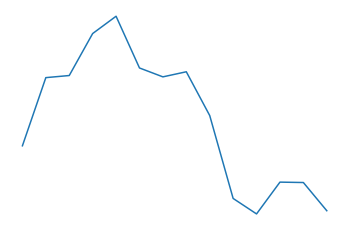

patient 227.0 of 231.0


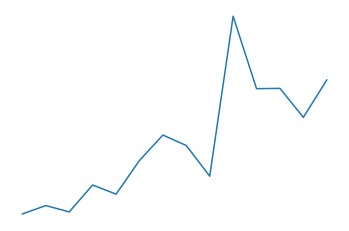

patient 227.0 of 231.0


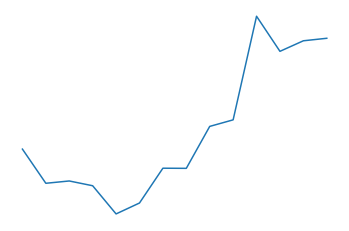


patient 228.0 of 231.0


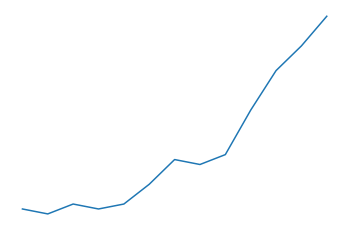

patient 228.0 of 231.0


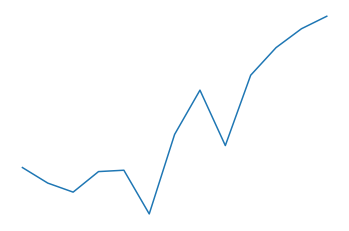

patient 228.0 of 231.0


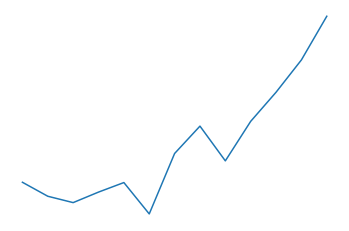

patient 228.0 of 231.0


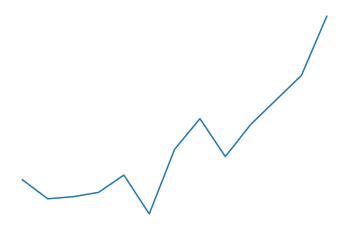

patient 228.0 of 231.0


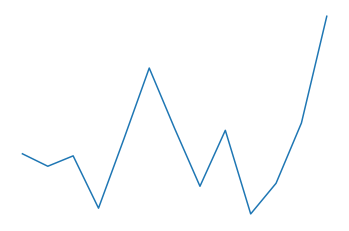

patient 228.0 of 231.0


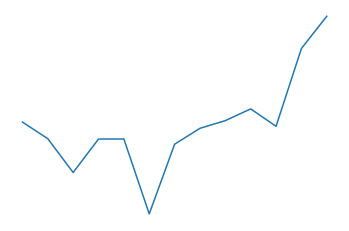

patient 228.0 of 231.0


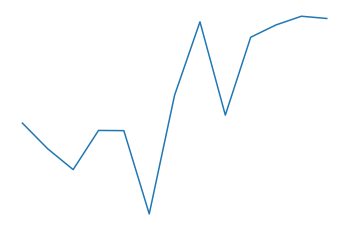


patient 229.0 of 231.0


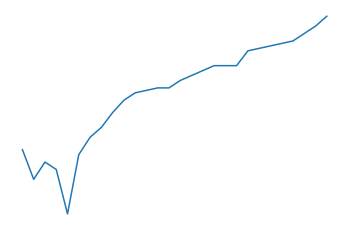

patient 229.0 of 231.0


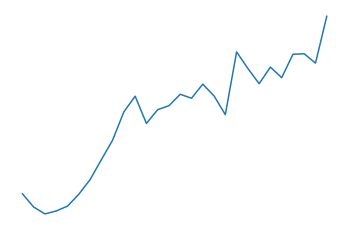

patient 229.0 of 231.0


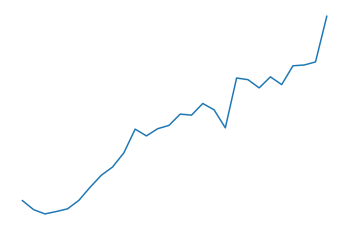

patient 229.0 of 231.0


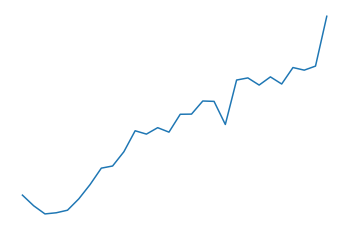

patient 229.0 of 231.0


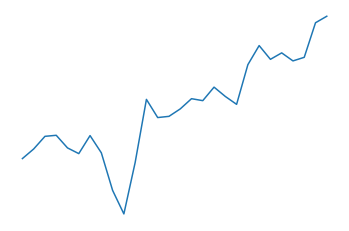

patient 229.0 of 231.0


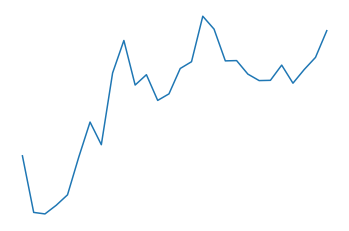

patient 229.0 of 231.0


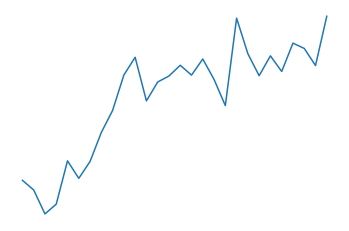


patient 230.0 of 231.0


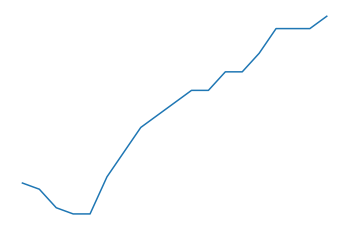

patient 230.0 of 231.0


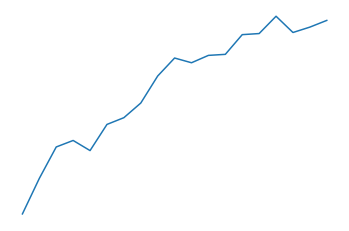

patient 230.0 of 231.0


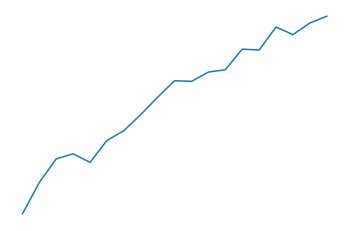

patient 230.0 of 231.0


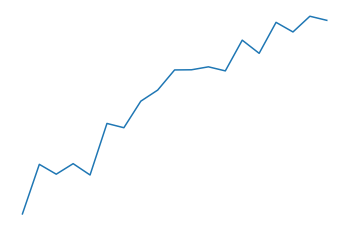

patient 230.0 of 231.0


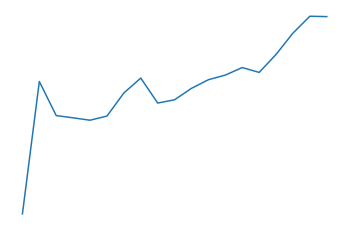

patient 230.0 of 231.0


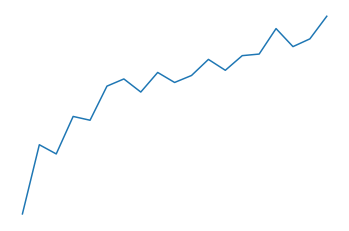

patient 230.0 of 231.0


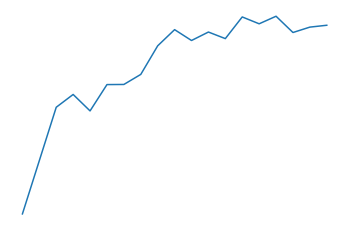


patient 231.0 of 231.0


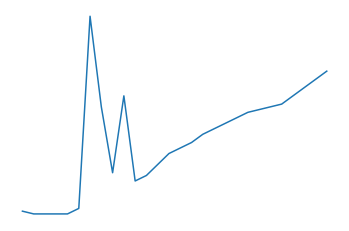

patient 231.0 of 231.0


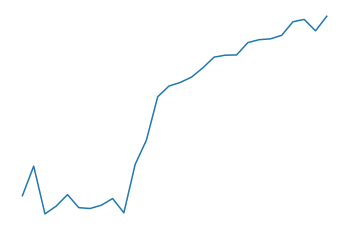

patient 231.0 of 231.0


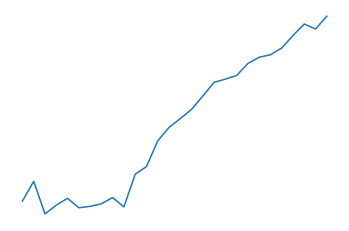

patient 231.0 of 231.0


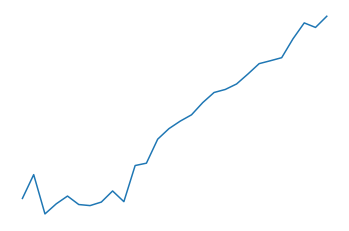

patient 231.0 of 231.0


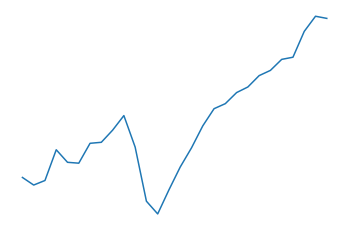

patient 231.0 of 231.0


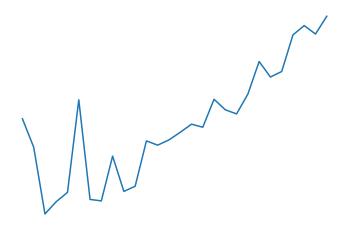

patient 231.0 of 231.0


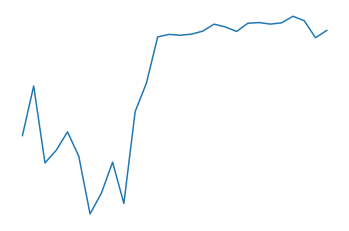

In [110]:
for session_id in clean_data.SessionId.drop_duplicates().values:
    temp_data = data_df_time.loc[data_df_time.SessionId==session_id]
    for colu in cols_ts:
        plt.plot(temp_data.minutes, temp_data[colu])
        plt.axis('off')
        plt.savefig('./data/images/{}_{}.png'.format(str(session_id).replace('.','_'),colu))
        #print('{}_{}.png'.format(patient_id.astype(int),colu))
        print('patient {} of {}'.format(session_id,clean_data.PatientId.drop_duplicates().values[-1]))
        plt.show()
    print()

In [100]:
clean_data.head(1)

,PatientId,SessionId,minutes,HR,VO2,VCO2,VE,VE/VO2,VE/VCO2,RER,RR,HasAnaerobicThreshold,sex,age,BMI,MaxVO2_EST,CardiacLim,PulmonaryLim,MuscleSkeletalLim,O2
0,7.0,7.0,0.5,68.0,0.108487,0.114589,8.403486,77.40897,74.787857,1.047752,15.778738,True,F,40,35.915381,2.320385,1,0,0,1.595391


In [59]:
temp_data = data_df_time.loc[data_df_time.PatientId==223]

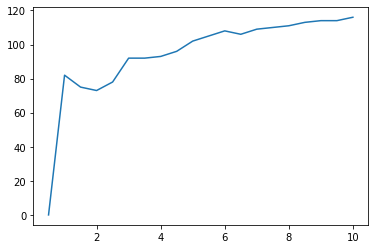

In [60]:
plt.plot(temp_data.minutes, temp_data['HR'])

(-0.17500000000000004, 14.675, 63.4, 142.6)

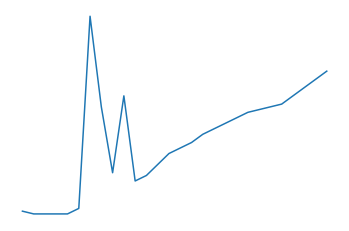

In [99]:
plt.plot(temp_data.minutes, temp_data.HR)
plt.axis('off')

In [90]:
clean_data.head()

,PatientId,SessionId,minutes,HR,VO2,VCO2,VE,VE/VO2,VE/VCO2,RER,RR,HasAnaerobicThreshold,sex,age,BMI,MaxVO2_EST,CardiacLim,PulmonaryLim,MuscleSkeletalLim,O2
0,7.0,7.0,0.5,68.0,0.108487,0.114589,8.403486,77.408970,74.787857,1.047752,15.778738,True,F,40,35.915381,2.320385,1,0,0,1.595391
1,7.0,7.0,1.0,72.0,0.161173,0.126185,7.199287,44.667969,57.053291,0.782917,19.911507,True,F,40,35.915381,2.320385,1,0,0,2.238519
2,7.0,7.0,1.5,74.0,0.216784,0.165696,6.819632,31.377821,41.044905,0.764782,15.983134,True,F,40,35.915381,2.320385,1,0,0,2.929514
3,7.0,7.0,2.0,70.0,0.292871,0.224983,8.937037,30.440102,39.583202,0.769070,15.302423,True,F,40,35.915381,2.320385,1,0,0,4.183871
4,7.0,7.0,2.5,75.0,0.206333,0.160677,6.567369,31.848976,40.876609,0.779499,18.565531,True,F,40,35.915381,2.320385,1,0,0,2.751111


In [111]:
cols_ts

['HR', 'VO2', 'VCO2', 'VE', 'RER', 'RR', 'O2']

In [135]:
def get_file_number_rate(row, column):
    return  str(row['SessionId']).replace('.','_')+'_'+column+'.png'

In [141]:
reference_data['HR']=reference_data.apply(lambda x: get_file_number_rate(x,'HR'),axis=1)
reference_data['VO2']=reference_data.apply(lambda x: get_file_number_rate(x,'VO2'),axis=1)
reference_data['VCO2']=reference_data.apply(lambda x: get_file_number_rate(x,'VCO2'),axis=1)
reference_data['VE']=reference_data.apply(lambda x: get_file_number_rate(x,'VE'),axis=1)
reference_data['RER']=reference_data.apply(lambda x: get_file_number_rate(x,'RER'),axis=1)
reference_data['RR']=reference_data.apply(lambda x: get_file_number_rate(x,'RR'),axis=1)
reference_data['O2']=reference_data.apply(lambda x: get_file_number_rate(x,'O2'),axis=1)

In [140]:
reference_data = clean_data[['SessionId','PatientId','CardiacLim','PulmonaryLim','MuscleSkeletalLim']].drop_duplicates()
reference_data['HR'] = str(reference_data['SessionId']).replace('.','_')+'_'+cols_ts[0]

In [143]:
reference_data.to_csv('reference_data.csv', index = True) 

In [142]:
reference_data.head()

,SessionId,PatientId,CardiacLim,PulmonaryLim,MuscleSkeletalLim,HR,VO2,VCO2,VE,RER,RR,O2
0,7.0,7.0,1,0,0,7_0_HR.png,7_0_VO2.png,7_0_VCO2.png,7_0_VE.png,7_0_RER.png,7_0_RR.png,7_0_O2.png
31,8.0,8.0,1,0,0,8_0_HR.png,8_0_VO2.png,8_0_VCO2.png,8_0_VE.png,8_0_RER.png,8_0_RR.png,8_0_O2.png
58,9.0,9.0,0,0,0,9_0_HR.png,9_0_VO2.png,9_0_VCO2.png,9_0_VE.png,9_0_RER.png,9_0_RR.png,9_0_O2.png
95,10.0,10.0,0,0,0,10_0_HR.png,10_0_VO2.png,10_0_VCO2.png,10_0_VE.png,10_0_RER.png,10_0_RR.png,10_0_O2.png
132,11.0,11.0,0,0,0,11_0_HR.png,11_0_VO2.png,11_0_VCO2.png,11_0_VE.png,11_0_RER.png,11_0_RR.png,11_0_O2.png


In [ ]:
for patient_id in clean_data.PatientId.drop_duplicates().values:
    temp_data = data_df_time.loc[data_df_time.PatientId==patient_id]
    for colu in cols_ts:
        #plt.plot(temp_data.minutes, temp_data[colu])
        #plt.axis('off')
        #plt.savefig('{}_{}.png'.format(patient_id.astype(int),colu))
        
        #print('{}_{}.png'.format(patient_id.astype(int),colu))
        print('patient {} of {}'.format(patient_id,clean_data.PatientId.drop_duplicates().values[-1]))
        #plt.show()
    print()